In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Looking for ETVs in TIC 52368472


In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 52368472  # EW

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 01,2018,SPOC,120,52368472,0.0,G011250
1,TESS Sector 28,2020,SPOC,120,52368472,0.0,N/A
2,TESS Sector 68,2023,SPOC,120,52368472,0.0,G05003
3,TESS Sector 69,2023,SPOC,120,52368472,0.0,G05003


72577

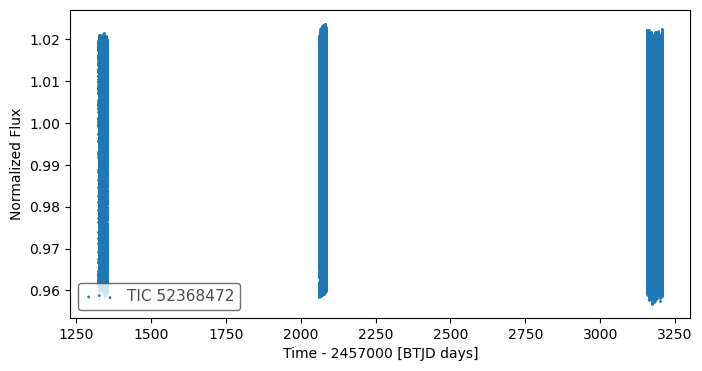

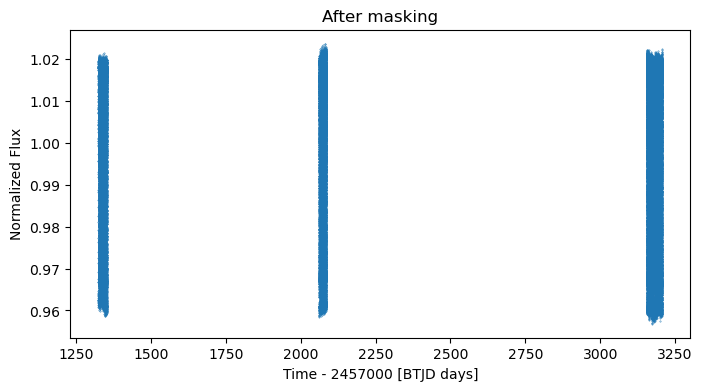

In [5]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [6]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [7]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

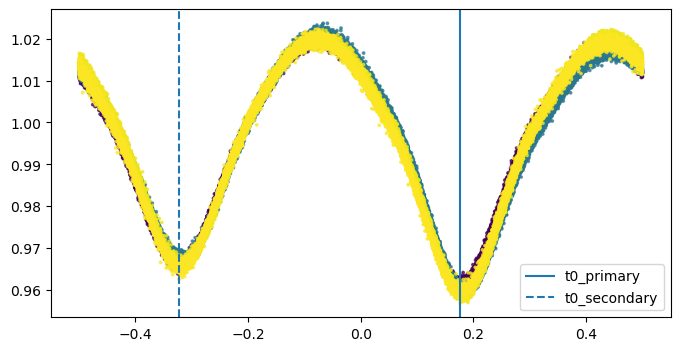

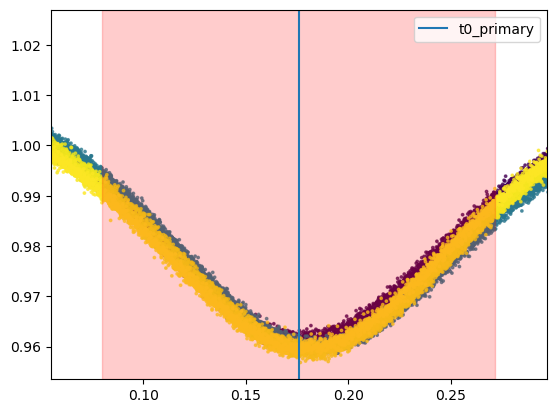

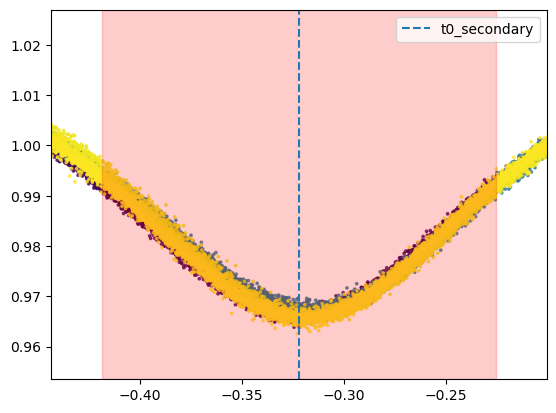

In [16]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# epoch=1325.4200, duration_hr=0.5000, period=0.325827, label="s0001-s0069:TCE1",  # <-- EW dips deep, 0.05% (misleading), period=0.3258265256881714, e_period=1.9044937E-5
# epoch=1325.5821, duration_hr=1.5084, period=0.325827, label="s0001-s0069:TCE2",  # <-- EW dips shallow, 0.34%     period=0.32582664334543476, e_period=2.831504E-5
# # MCMC on df_primary: 0.3258262088441779, err=5.011647076670645e-06

# FILL-IN THE eclipse epoch / period, 
# period = 0.3258265  # VSX Period: 0.325824 (clearly not as good), AoV top 3 on data_primary: 0.32582619, 0.32582608, 0.32582630
period = 0.3258262  #  MCMC, the num. of decimal place is determined with visual inspection of folded plot, more than MCMC's err (5e-6)

t0_primary = 1325.4200 + 0.002  # apply offsets to TCE values to center the eclipses after visual inspection
t0_secondary = 1325.5821 + 0.0035  # apply offsets to TCE values to center the eclipses after visual inspection


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 1.5   # TCE value way too short: 0.5000
duration_hr_secondary = 1.5084

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.35  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

### Now that the data is ready we can start 

In [20]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1325.297931,0.999469,0.000560,-0.205046
1,1325.299320,1.000459,0.000560,-0.200783
2,1325.300708,1.000948,0.000560,-0.196521
3,1325.302097,1.003232,0.000561,-0.192258
4,1325.303486,1.002624,0.000561,-0.187995
...,...,...,...,...
64322,3206.451227,0.993717,0.000579,0.281850
64323,3206.452616,0.995140,0.000580,0.286113
64324,3206.454005,0.996749,0.000580,0.290376
64325,3206.455393,0.996712,0.000580,0.294638


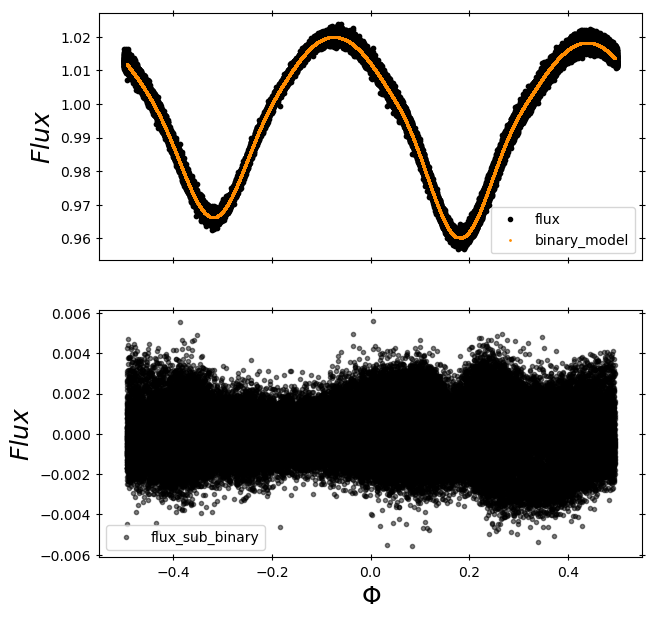

,time,flux,err,phase,flux_sub_binary,binary_model
0,1325.297931,0.999469,0.000560,-0.205046,0.000849,0.998621
1,1325.299320,1.000459,0.000560,-0.200783,0.000657,0.999801
2,1325.300708,1.000948,0.000560,-0.196521,0.000021,1.000927
3,1325.302097,1.003232,0.000561,-0.192258,0.001184,1.002048
4,1325.303486,1.002624,0.000561,-0.187995,-0.000531,1.003154
...,...,...,...,...,...,...
64322,3206.451227,0.993717,0.000579,0.281850,0.002722,0.990995
64323,3206.452616,0.995140,0.000580,0.286113,0.002776,0.992364
64324,3206.454005,0.996749,0.000580,0.290376,0.003044,0.993705
64325,3206.455393,0.996712,0.000580,0.294638,0.001741,0.994971


In [21]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 63684 901
reached the end
10 63434 901
reached the end
10 63416 901
reached the end
10 63414 901
reached the end
10 63413 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1325.297931,0.999469,0.000560,-0.205046,0.000849,0.998621,0.999397
1,1325.299320,1.000459,0.000560,-0.200783,0.000657,0.999801,1.000381
2,1325.300708,1.000948,0.000560,-0.196521,0.000021,1.000927,1.000864
3,1325.302097,1.003232,0.000561,-0.192258,0.001184,1.002048,1.003144
4,1325.303486,1.002624,0.000561,-0.187995,-0.000531,1.003154,1.002530
...,...,...,...,...,...,...,...
64322,3206.451227,0.993717,0.000579,0.281850,0.002722,0.990995,0.991207
64323,3206.452616,0.995140,0.000580,0.286113,0.002776,0.992364,0.992623
64324,3206.454005,0.996749,0.000580,0.290376,0.003044,0.993705,0.994225
64325,3206.455393,0.996712,0.000580,0.294638,0.001741,0.994971,0.994182


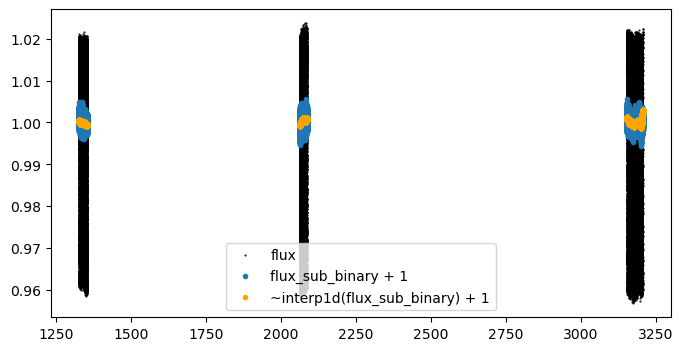

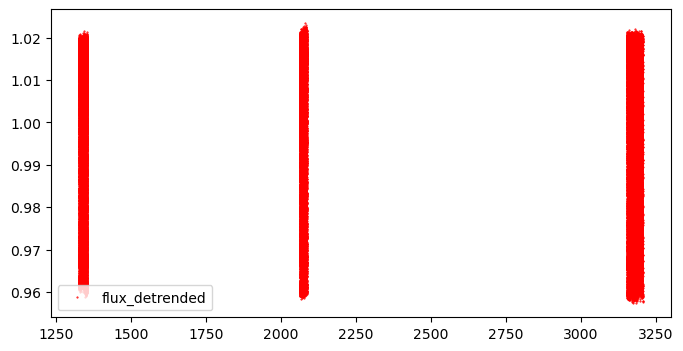

In [22]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

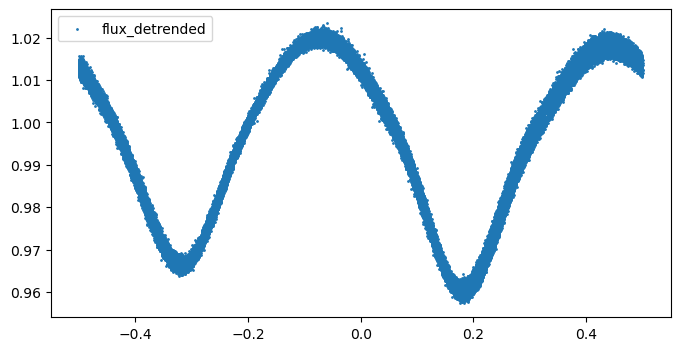

In [23]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1, label="flux_detrended")
plt.legend()
plt.show()

<span style="background-color: rgba(255, 0, 0, 0.6);"> NOTE: </span> The zoom windows below for the eclipses are made **smaller**, an attempt to reduce the complications of EW variability outside the minima (and some assymetery)

In [18]:
0.7 * duration_hr_primary , 0.4 * duration_hr_secondary 

(1.0499999999999998, 0.60336)

Primary:   1325.422 0.1757378627011642
window_width_p (phase): 0.09591002810700919
Secondary: 1325.5856 -0.3221539581527522
window_width_s (phase): 0.07715769941152675


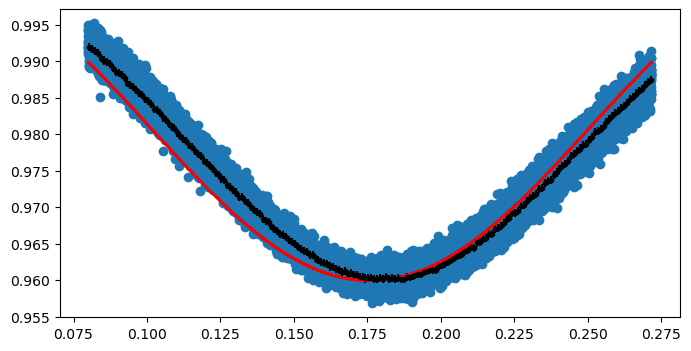

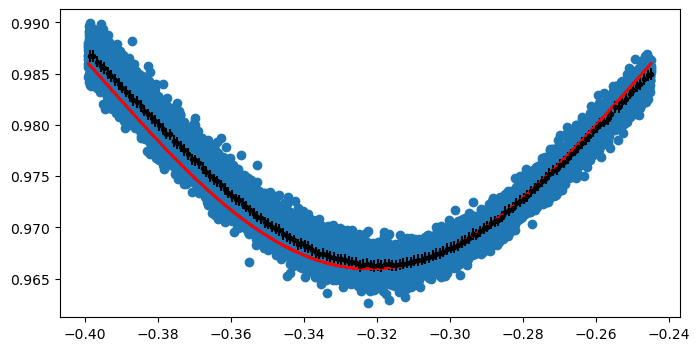

In [23]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.5 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 0.4 * duration_hr_secondary / 24 / period
    # window_width_s = window_width_p
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.005, -0.045, midpoint_p, 0.07, 1.0]
start_vals_s = [1.007, -0.041, midpoint_s, 0.07, 1.0]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
if t0_secondary is not None:
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

In [ ]:
if False: 
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, defaulted to use 9 CPUs.


100%|██████████████████████████████████████████████████████████| 2000/2000 [12:31<00:00,  2.66it/s]


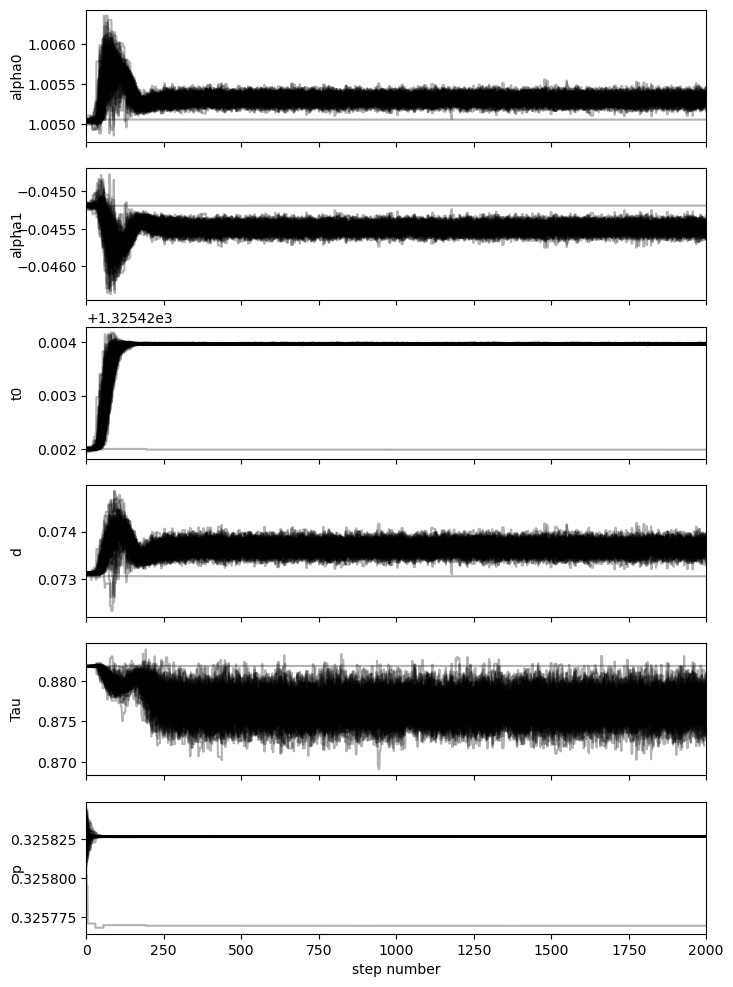

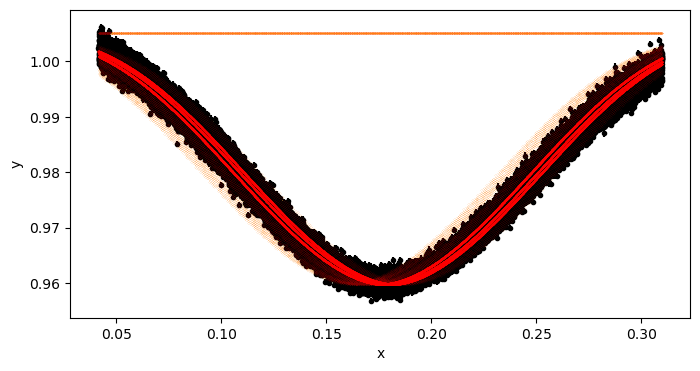

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0053091426257479, -0.045488870380311235, 1325.4239683394042, 0.07365446976028386, 0.8768547030206979, 0.3258262087781866
std_p: 5.011647076670645e-06


In [17]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    # enable info logging
    import sys
    import logging
    etvp.log.setLevel(logging.INFO)
    if not getattr(etvp.log, "_stdout_handler_added", False):  # for Jupyter        
        etvp.log.addHandler(logging.StreamHandler(stream=sys.stdout))
        etvp.log._stdout_handler_added = True
        
    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.0050421085451522, -0.04519082657831282, t0_primary, 0.07312385445709998, 0.8818420987352963, 0.3258265],
        nruns=2000, discard=1500, 
        # nruns=1000, discard=600, 
        # nruns=20, discard=1, 
        pool="all",
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"])

In [ ]:
# # nruns=1000, discard=600
# mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0053111948722329, -0.04549092575844466,  1325.4239685047244, 0.07365973722028796, 0.8768694378453441, 0.3258262088441779
# # nruns=2000, discard=1500
# mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0053091426257479, -0.045488870380311235, 1325.4239683394042, 0.07365446976028386, 0.8768547030206979, 0.3258262087781866


emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [01:31<00:00, 10.97it/s]


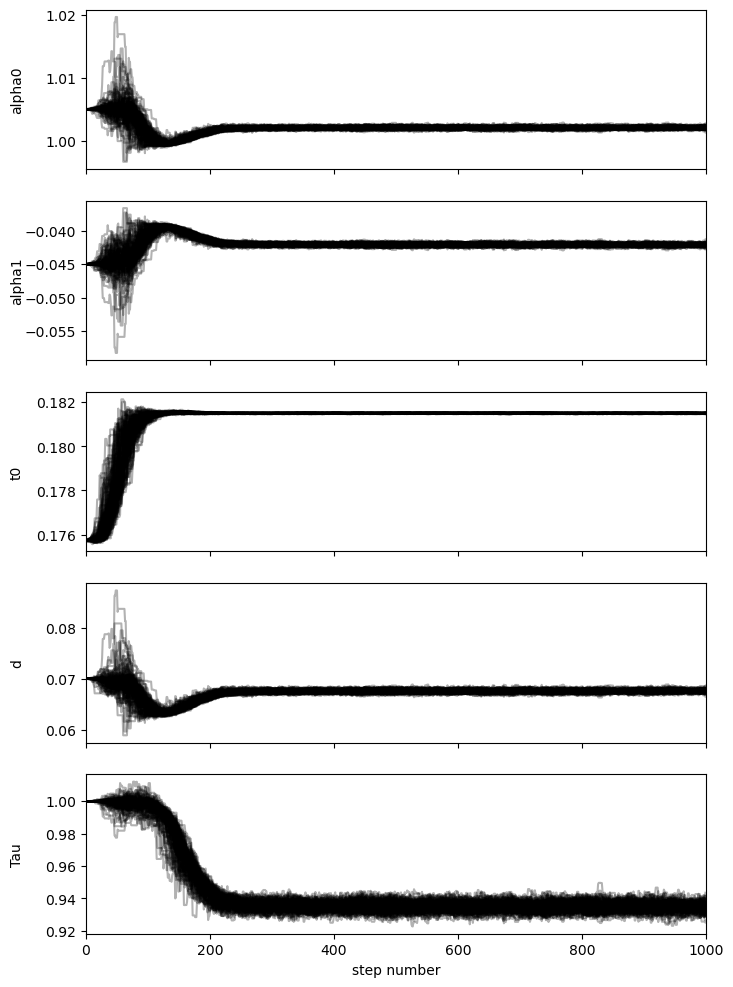

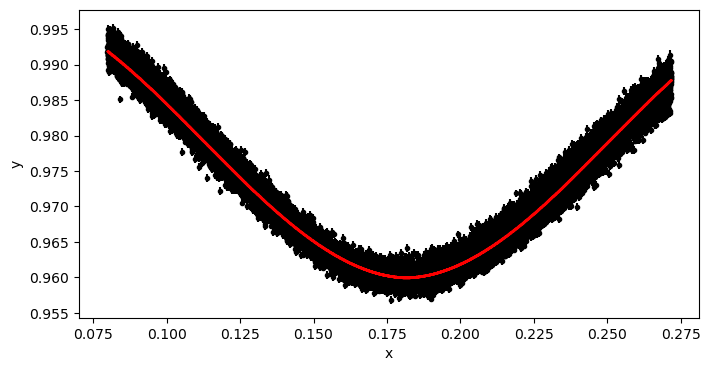

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [01:23<00:00, 11.96it/s]


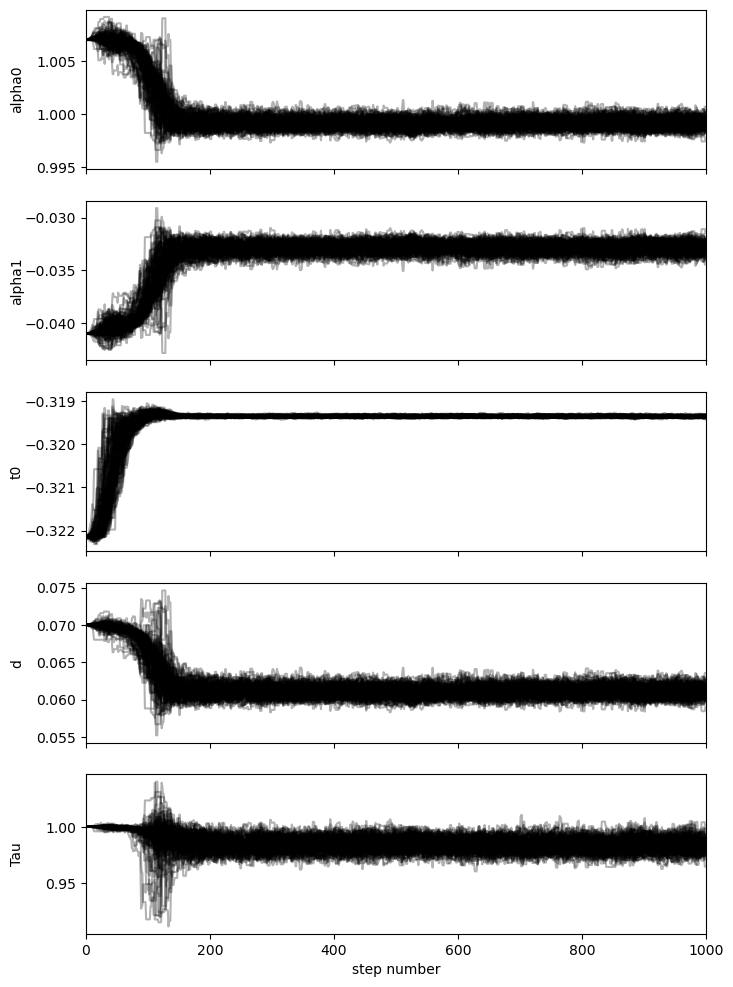

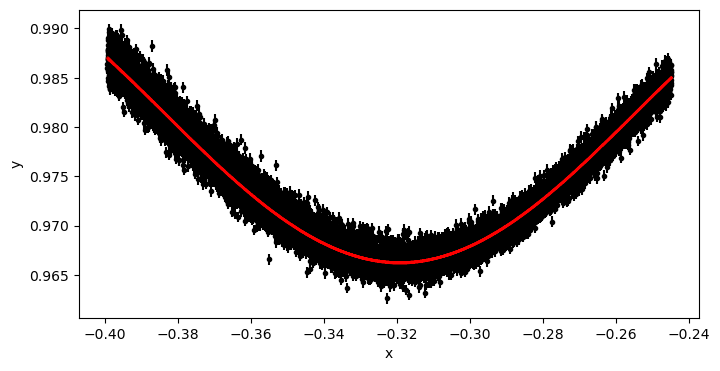

In [24]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    !$NOTIFY_CMD "Initial fit done"

Use pre-defined inital model params:


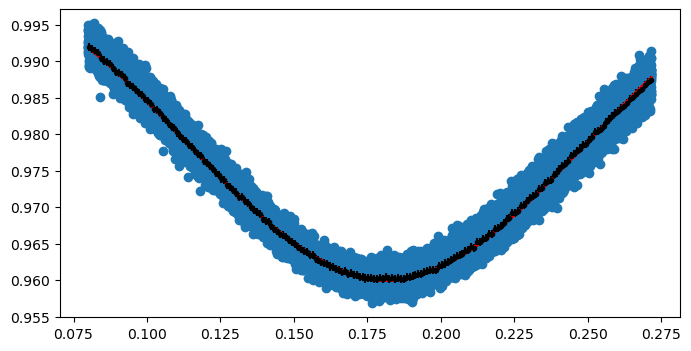

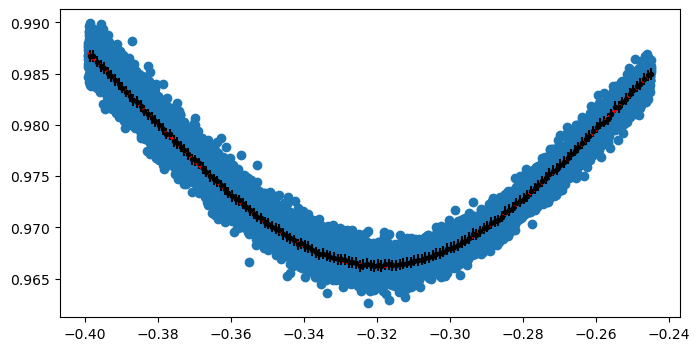

In [27]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data (MCMC period) clipped window - primary: 1.05hr, secondary: 0.60hr
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0050421085451522, -0.04519082657831282, 0.17877247007484837, 0.07312385445709998, 0.8818420987352963
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9999693200371744, -0.033703366599811255, -0.3225088674349989, 0.06226959147275454, 0.9788507591187107

    # initial fit params from TESS data (MCMC period), narrower clipped window - primary: 0.75hr, secondary: 0.60hr
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0020984591218385, -0.04208716625153656, 0.18149794185922002, 0.06756515706070906, 0.9349910753050263
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.999115398277236, -0.03284344153917816, -0.319357169374863, 0.06109594004733687, 0.9839184523405837
    
    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])

    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [28]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0020984591218385, -0.04208716625153656, 0.18149794185922002, 0.06756515706070906, 0.9349910753050263
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.999115398277236, -0.03284344153917816, -0.319357169374863, 0.06109594004733687, 0.9839184523405837


5773

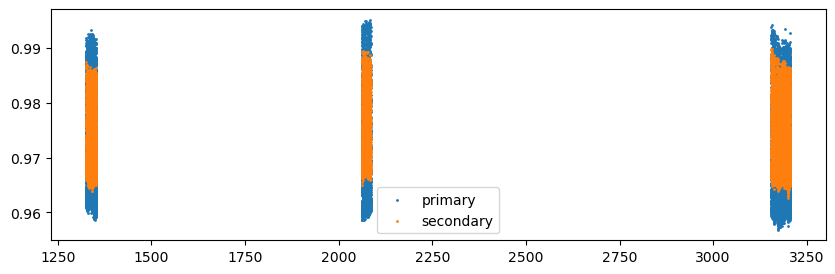

In [29]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1325.422 0.3258262 1325.422


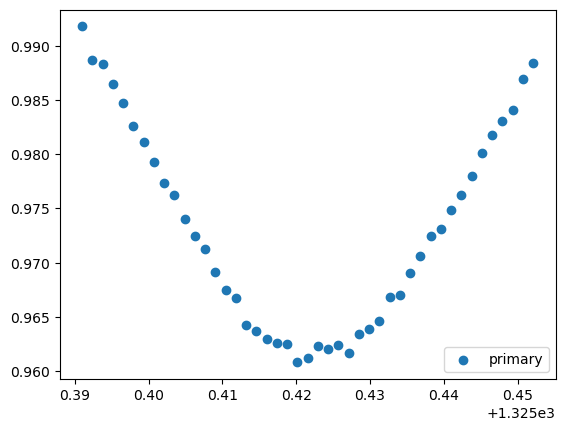

1325.422 0.3258262 1325.7478262


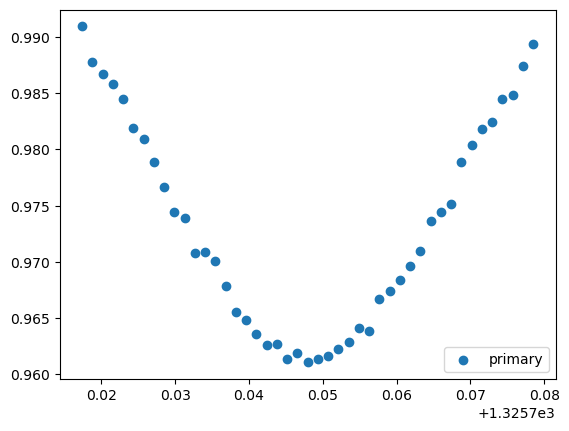

1325.422 0.3258262 1326.0736524000001


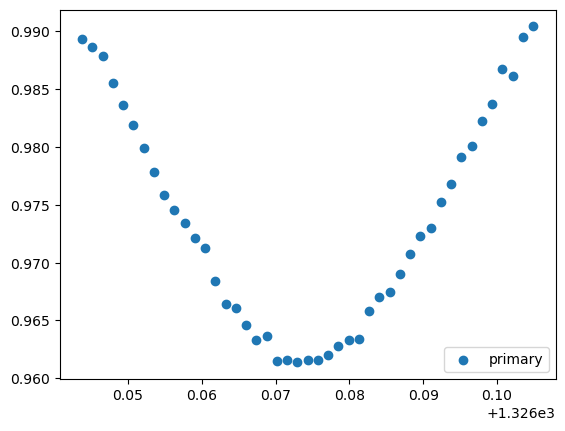

1325.5856 0.3258262 1325.5856


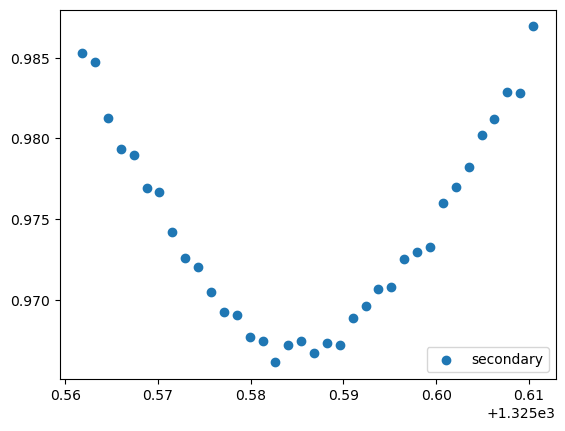

1325.5856 0.3258262 1325.9114262


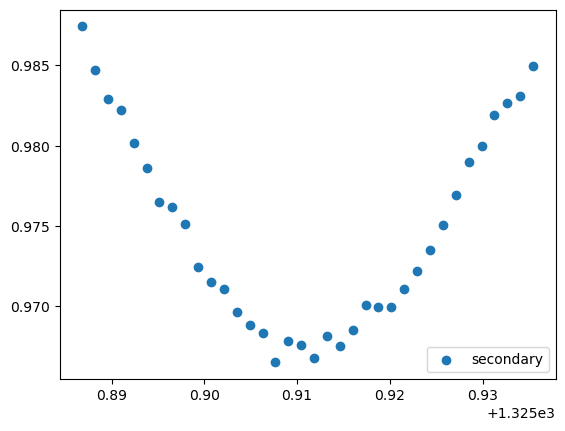

1325.5856 0.3258262 1326.2372524000002


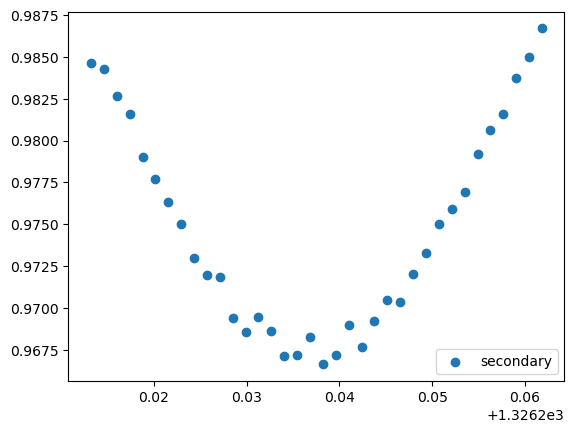

In [30]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
1325.7478262 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.26it/s]


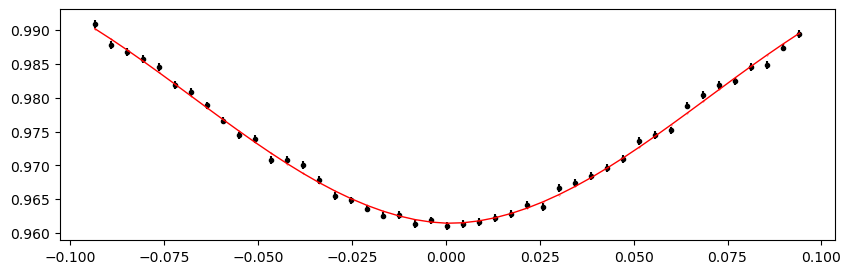

1326.0736524000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.02it/s]


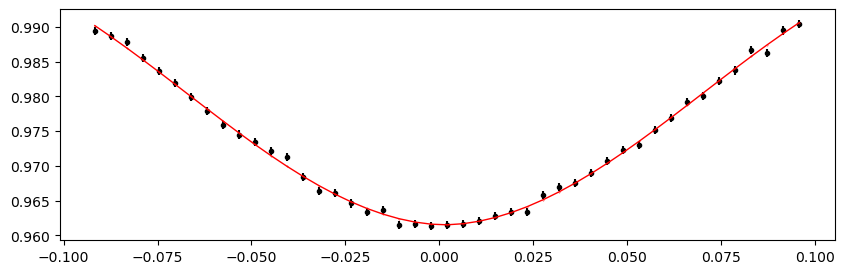

1326.3994786 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.10it/s]


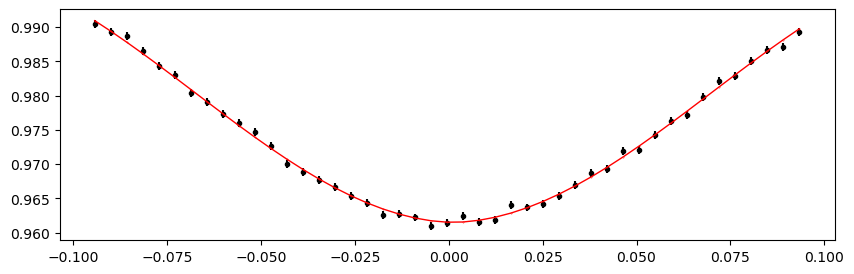

1326.7253048 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.05it/s]


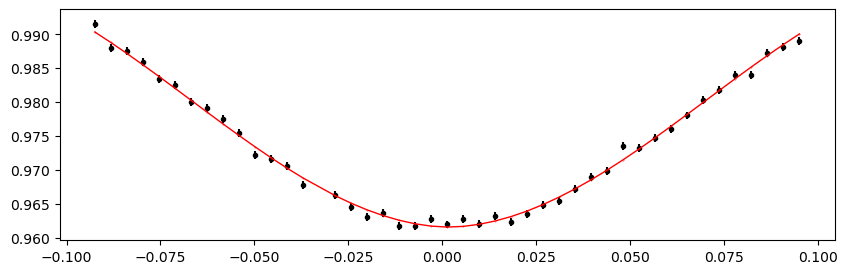

1327.051131 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.61it/s]


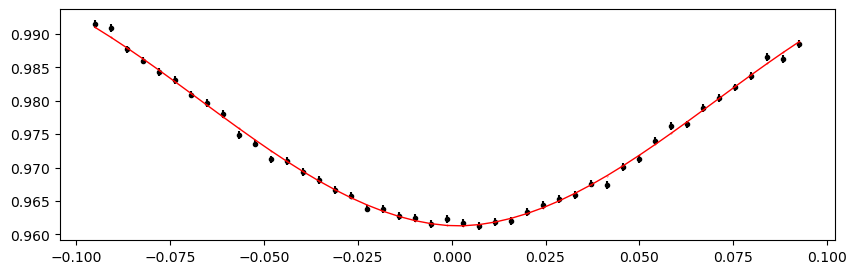

1327.3769572 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.64it/s]


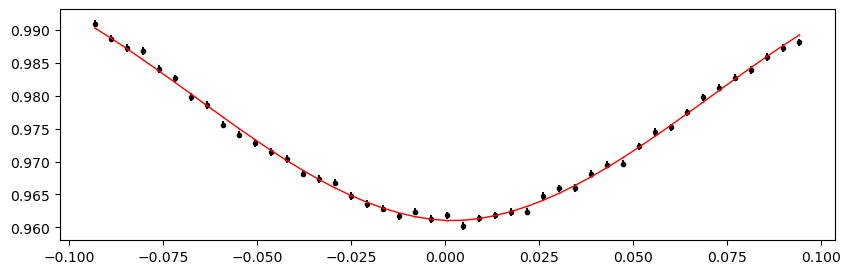

1327.7027834 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.09it/s]


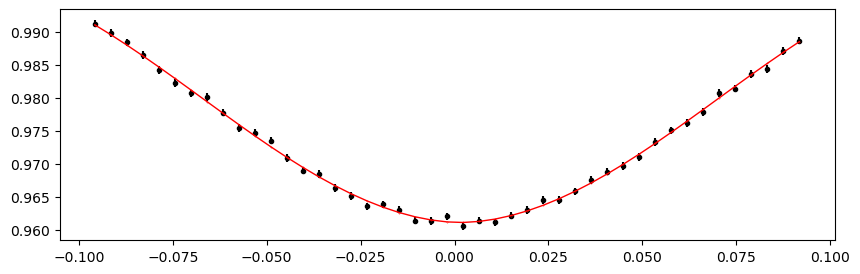

1328.0286096 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.49it/s]


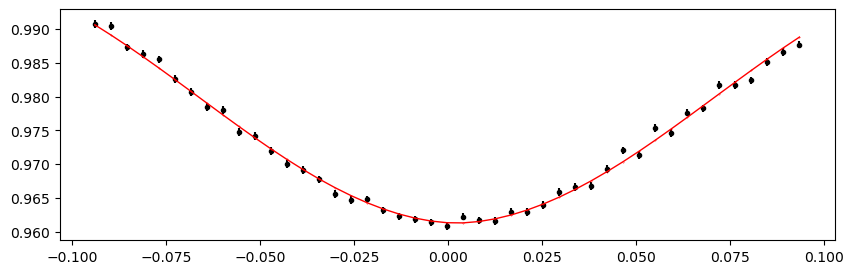

1328.3544358 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.34it/s]


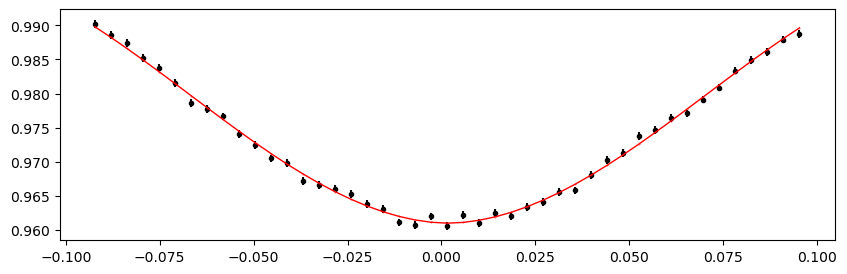

1328.680262 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.51it/s]


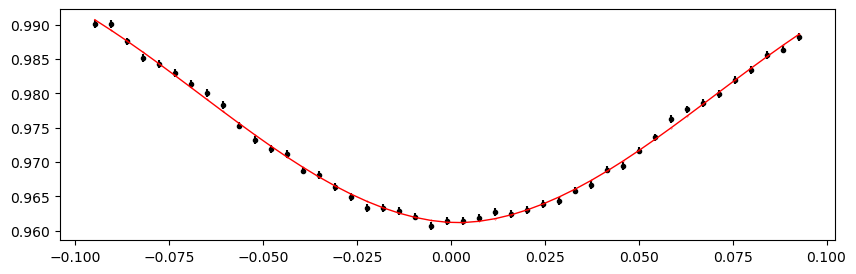

1329.0060882 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.01it/s]


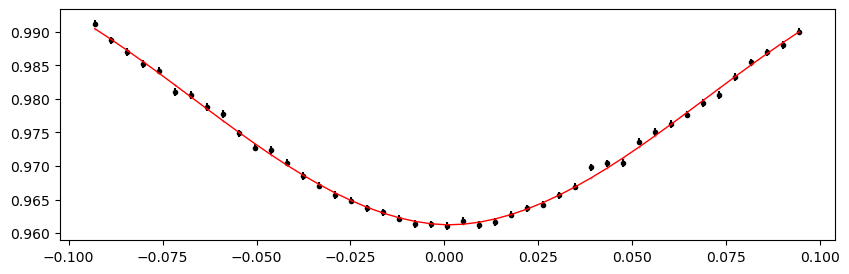

1329.3319144 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.03it/s]


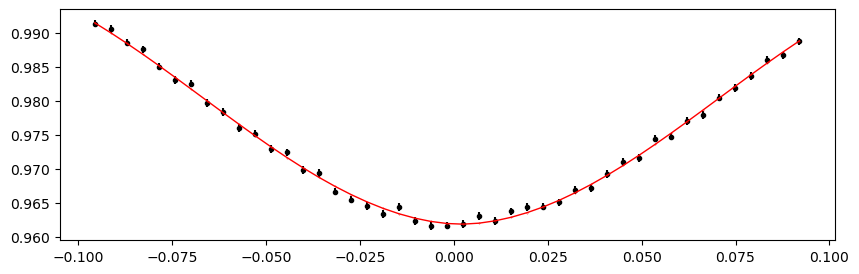

1329.6577406000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.57it/s]


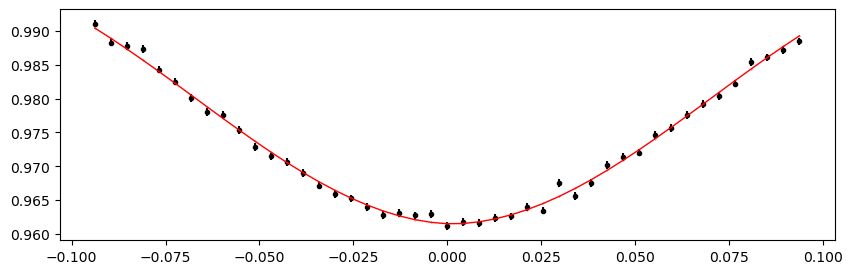

1329.9835668 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.06it/s]


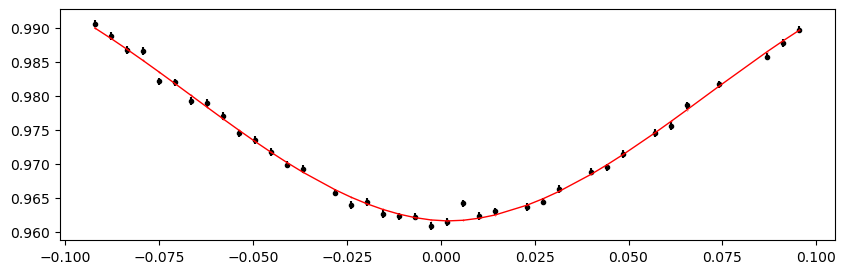

1330.309393 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.48it/s]


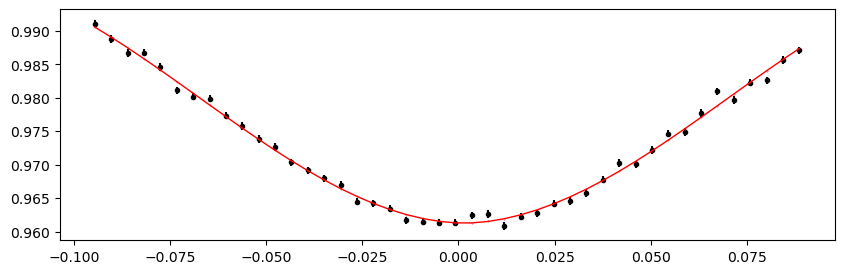

1330.6352192 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.73it/s]


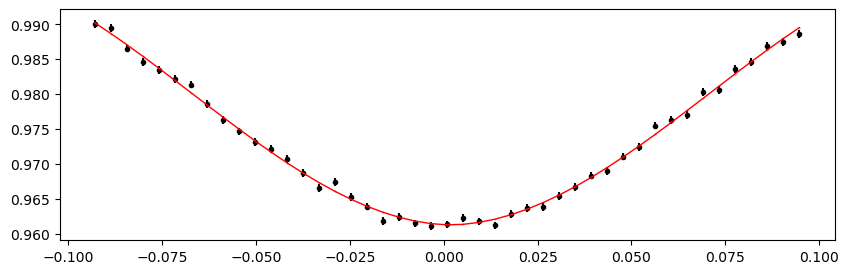

1330.9610454 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.84it/s]


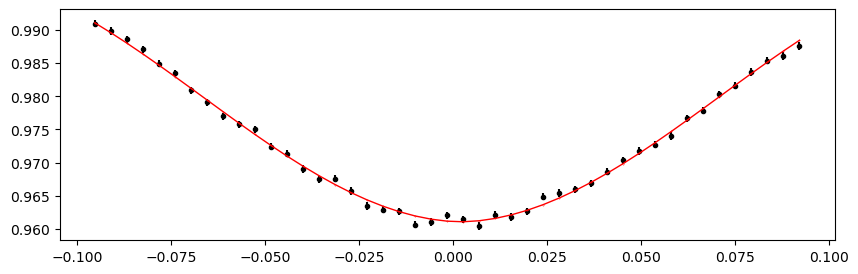

1331.2868716 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.32it/s]


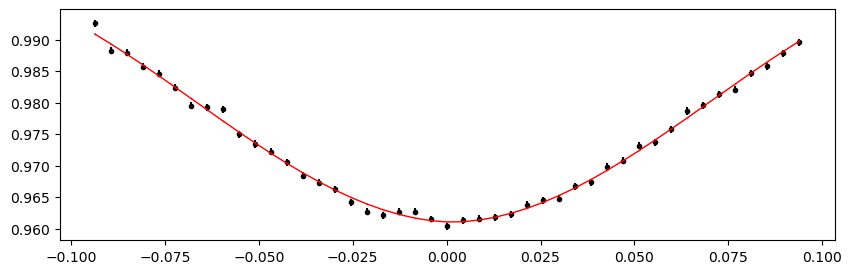

1331.6126978 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.11it/s]


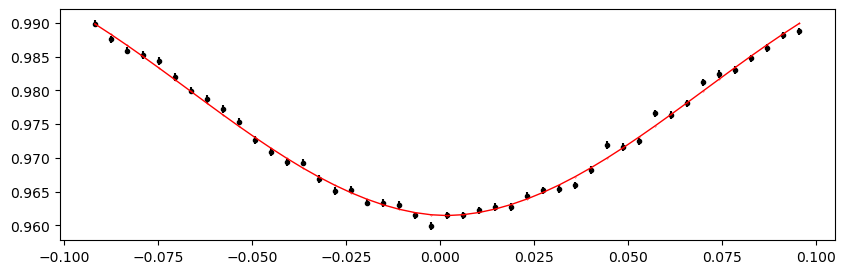

1331.938524 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.08it/s]


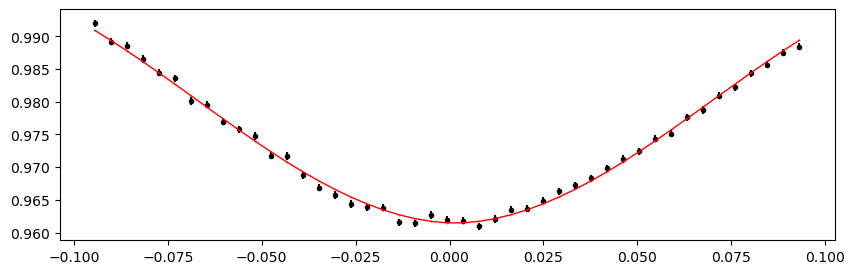

1332.2643502 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.05it/s]


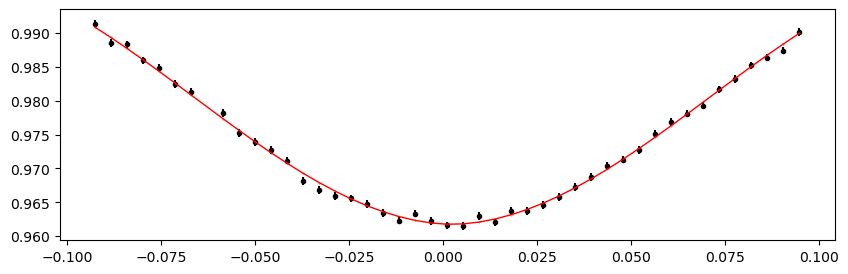

1332.5901764 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.85it/s]


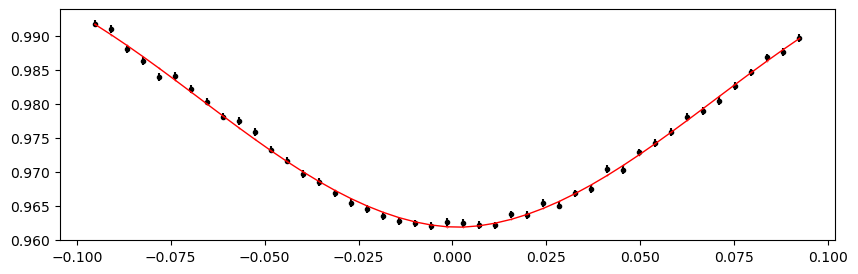

1332.9160026 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.16it/s]


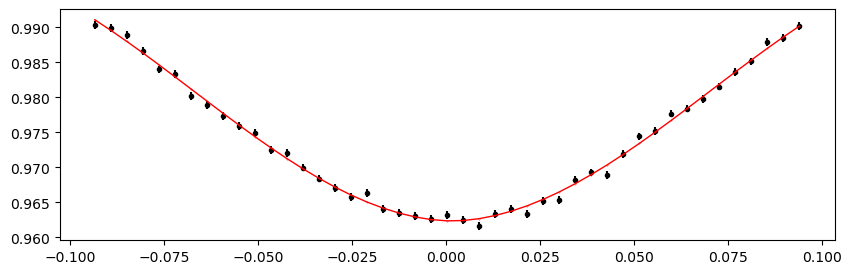

1333.2418288000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.07it/s]


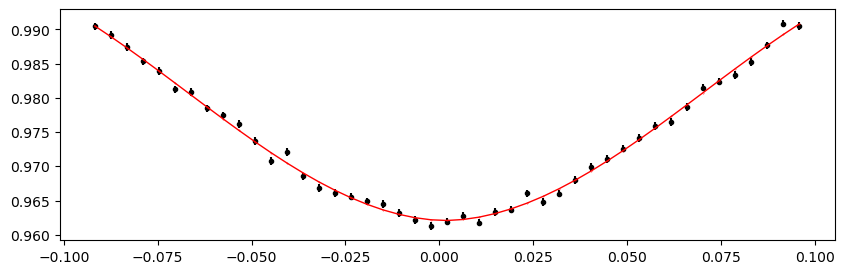

1333.567655 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.41it/s]


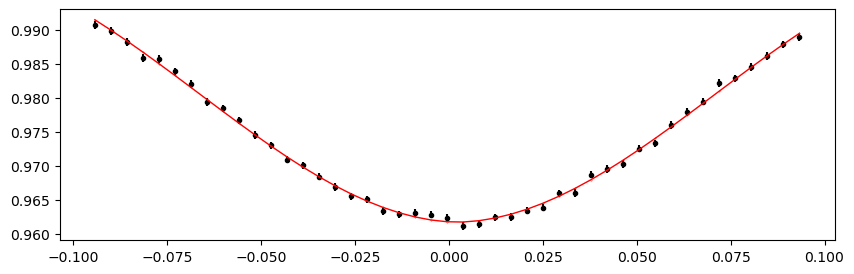

1333.8934812 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.25it/s]


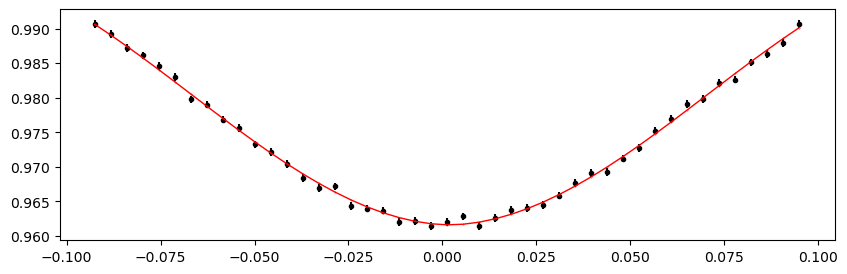

1334.2193074 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.38it/s]


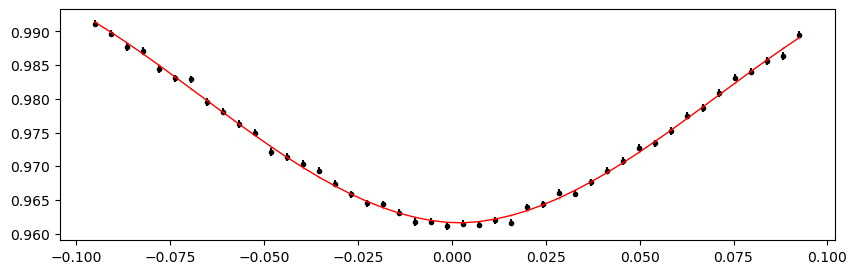

1334.5451336 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.73it/s]


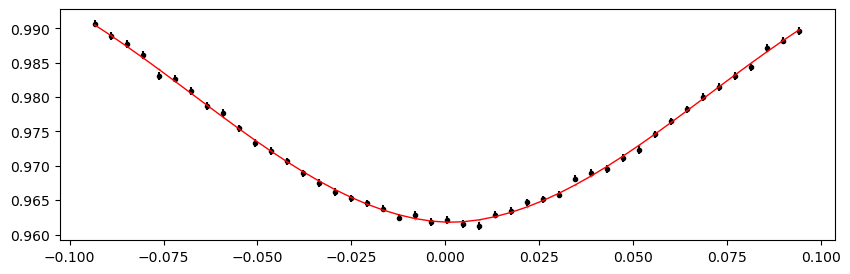

1334.8709598 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.44it/s]


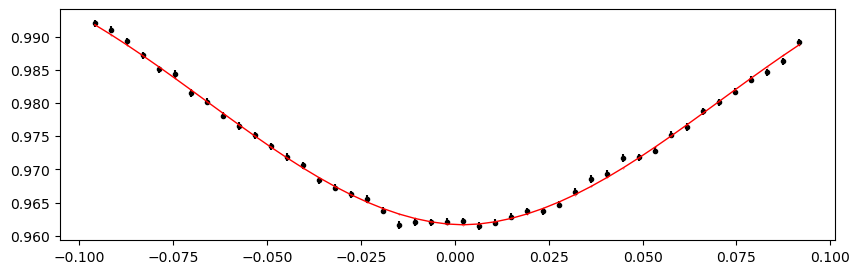

1335.196786 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.41it/s]


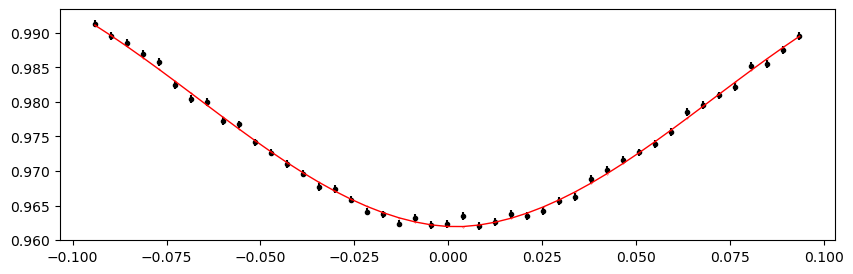

1335.5226122 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.84it/s]


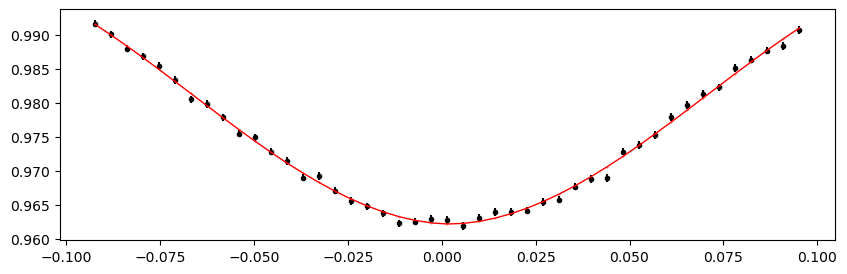

1335.8484384 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.88it/s]


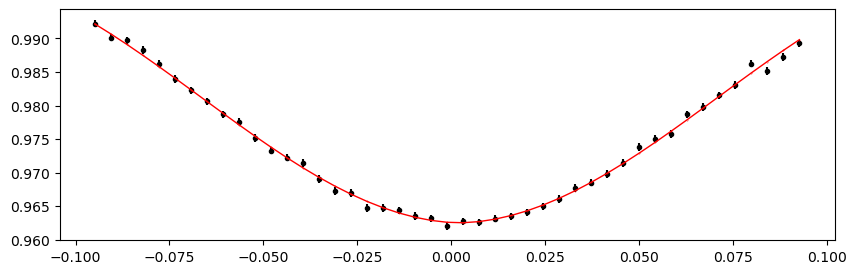

1336.1742646 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.10it/s]


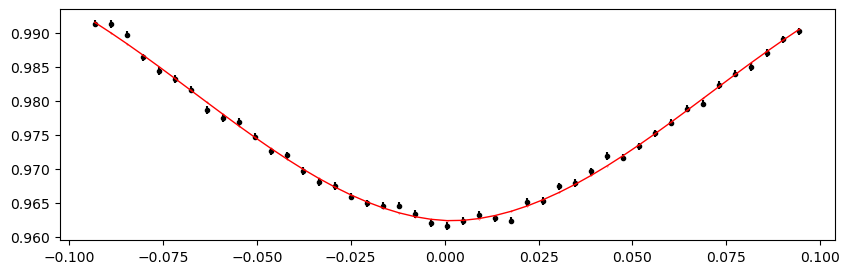

1336.5000908 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.75it/s]


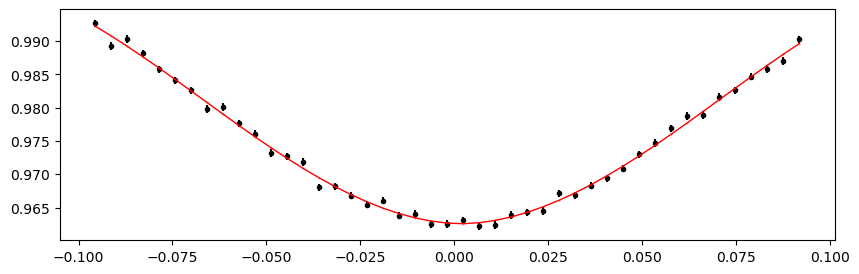

1336.8259170000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.04it/s]


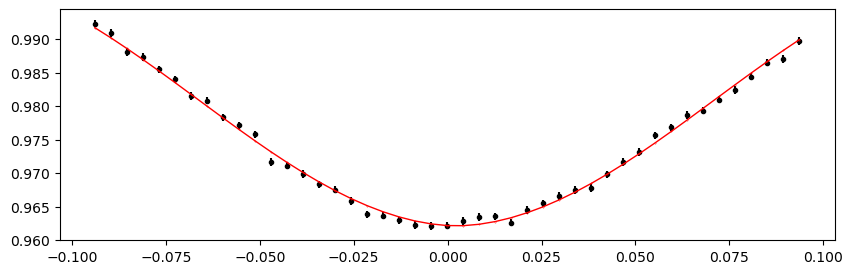

1337.1517432 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.81it/s]


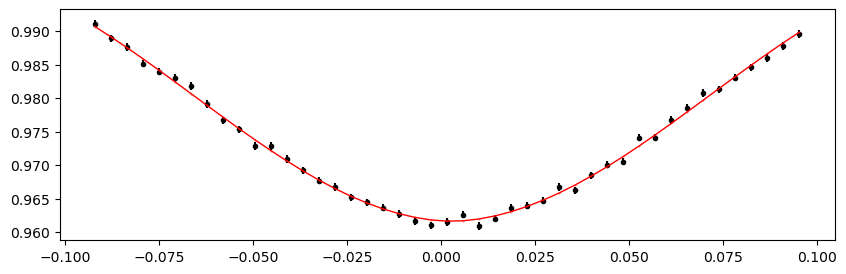

1337.4775694 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.58it/s]


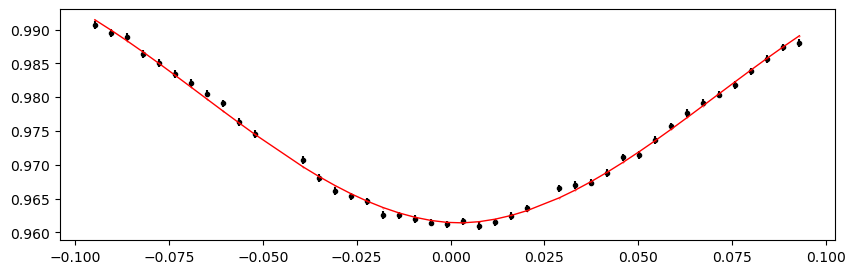

1337.8033956 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.63it/s]


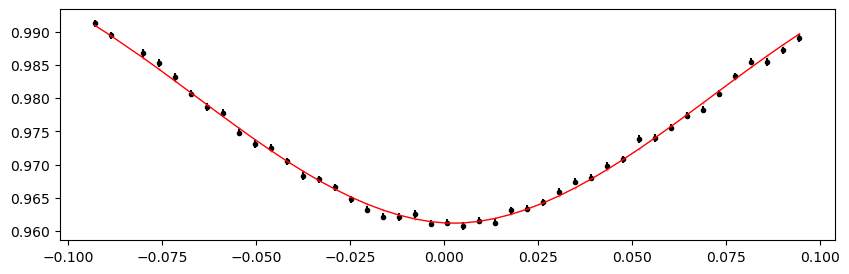

1338.1292218 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.16it/s]


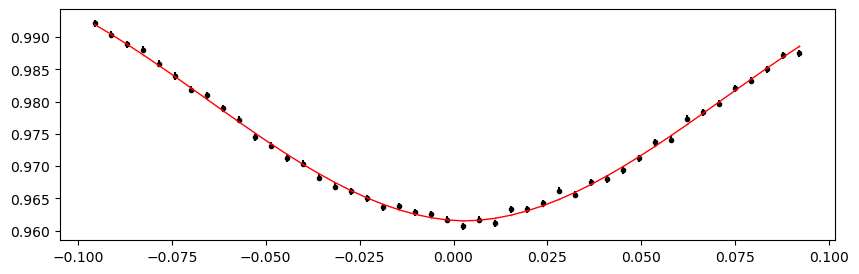

1338.455048 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.03it/s]


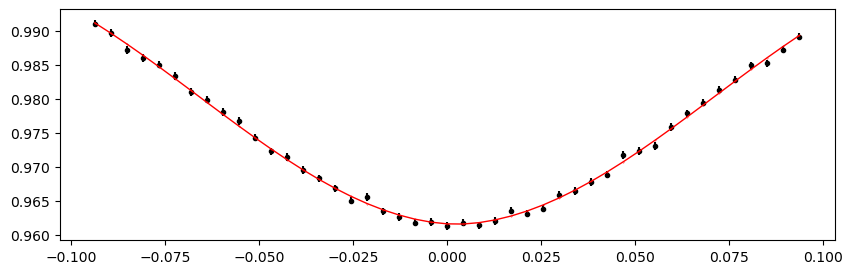

1339.7583528 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.89it/s]


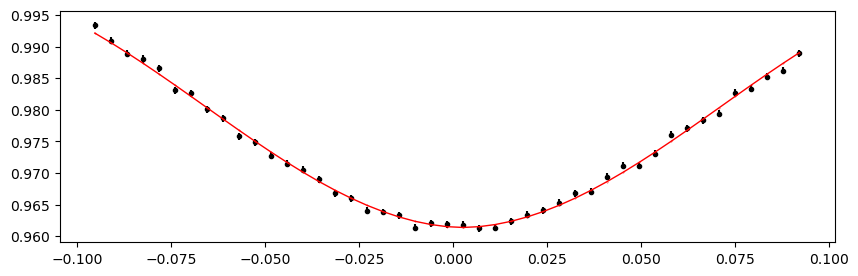

1340.084179 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.40it/s]


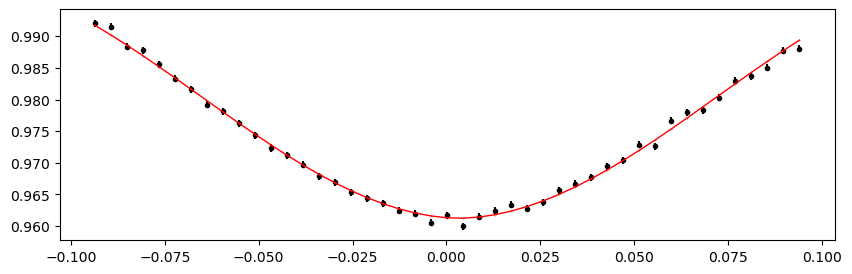

1340.4100052000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.33it/s]


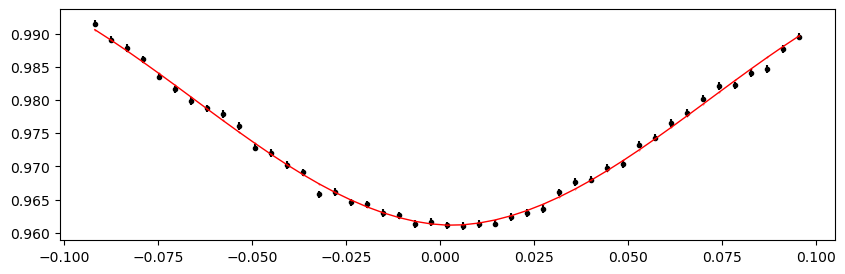

1340.7358314 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.47it/s]


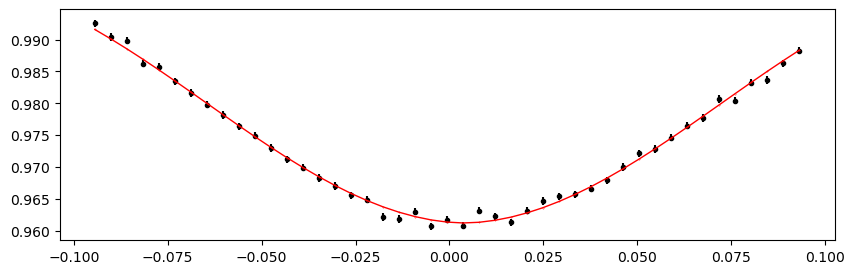

1341.0616576 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.11it/s]


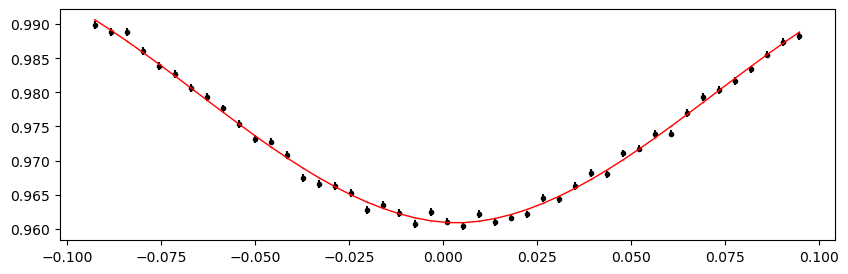

1341.3874838 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.59it/s]


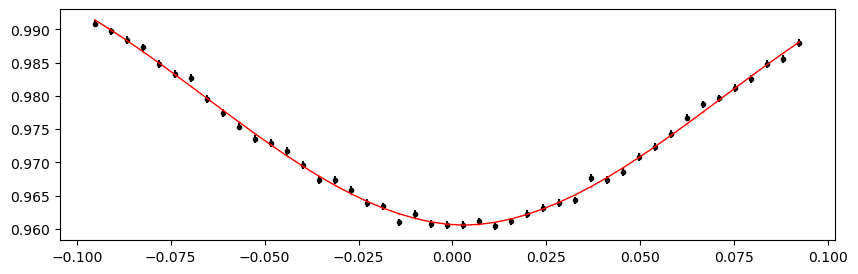

1341.71331 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.49it/s]


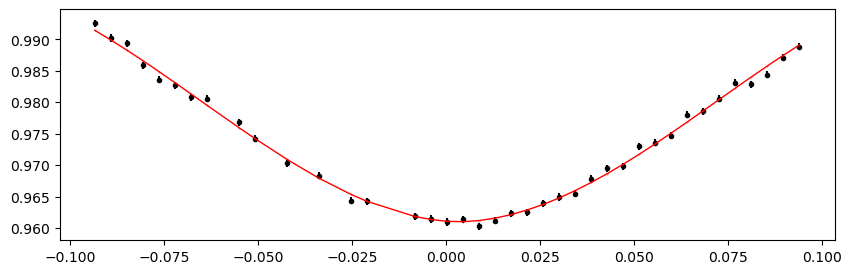

1342.0391362 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.71it/s]


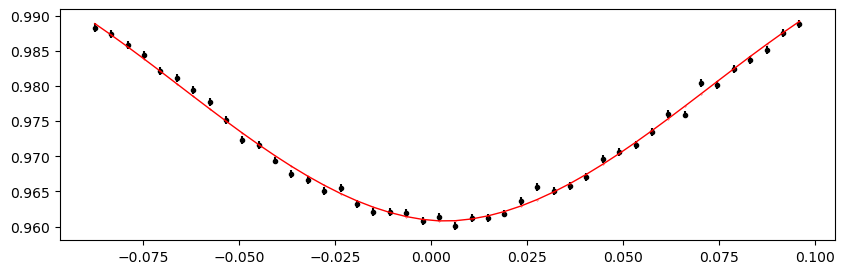

1342.3649624 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.45it/s]


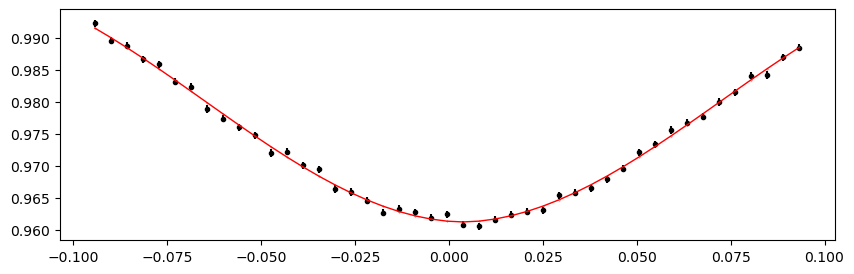

1342.6907886000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.68it/s]


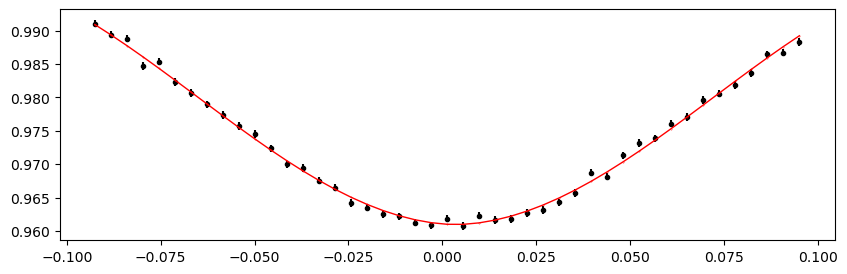

1343.0166148 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.03it/s]


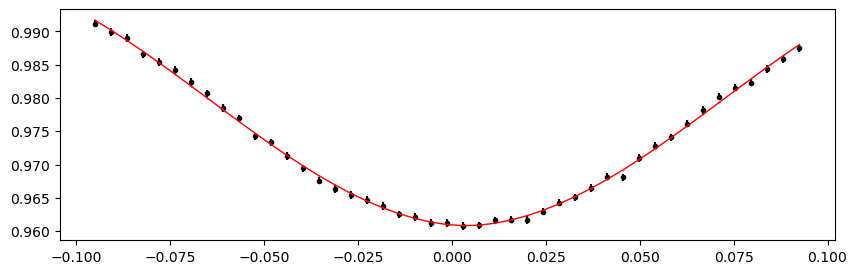

1343.342441 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.26it/s]


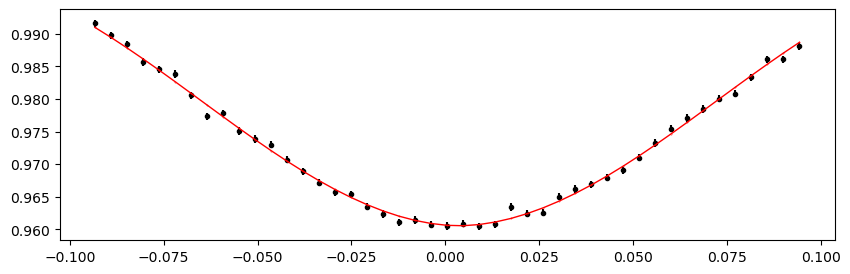

1343.6682672 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.23it/s]


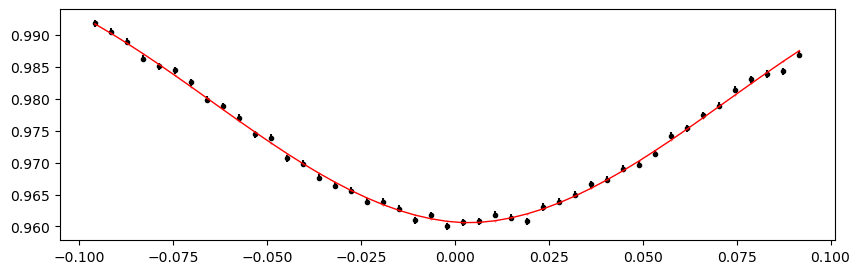

1343.9940934 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.92it/s]


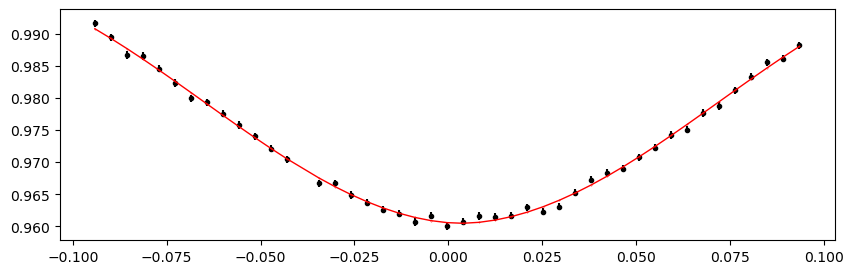

1344.3199196 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.30it/s]


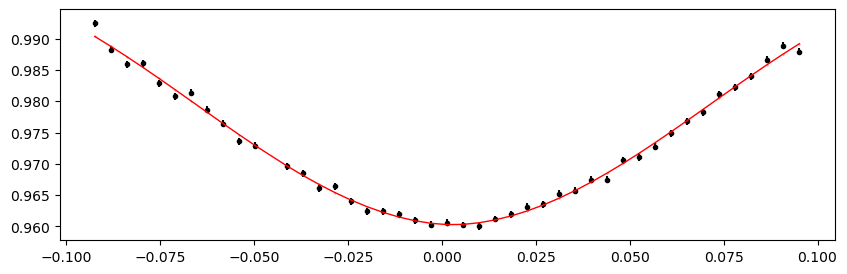

1344.6457458 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.92it/s]


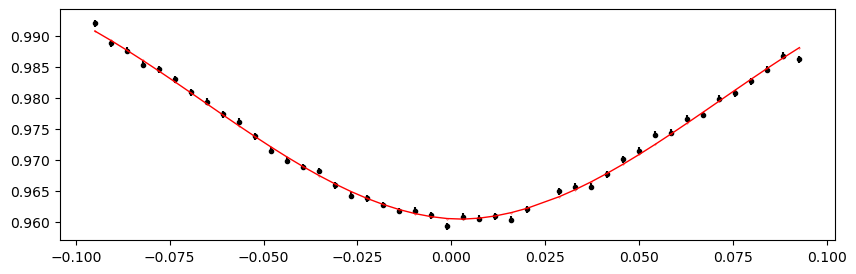

1344.971572 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.62it/s]


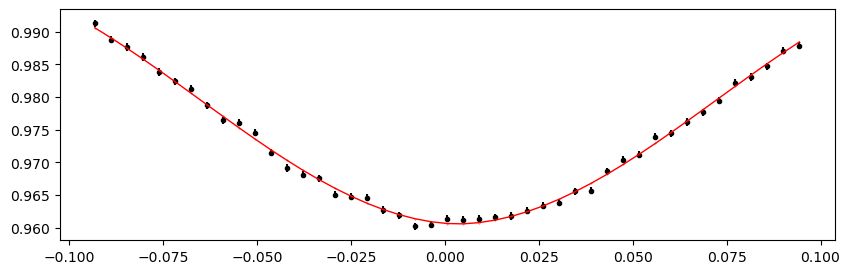

1345.2973982 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.03it/s]


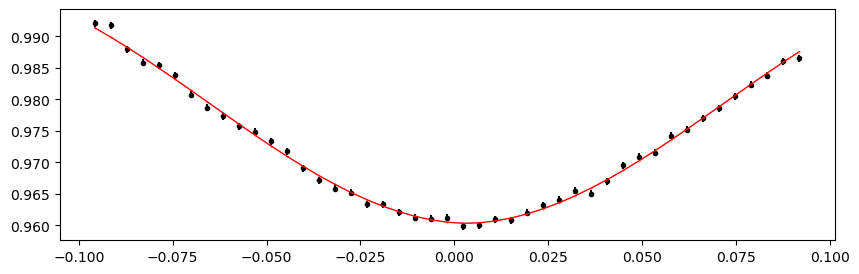

1345.6232244 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.65it/s]


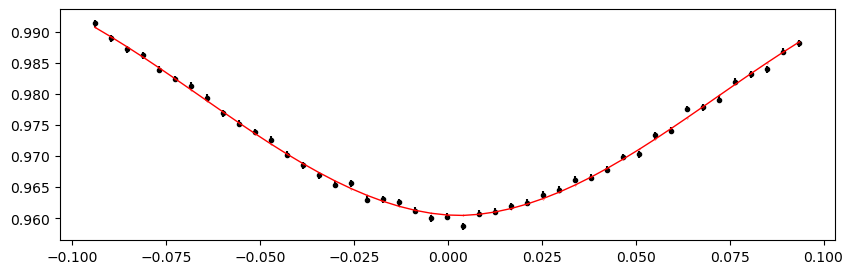

1345.9490506 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.27it/s]


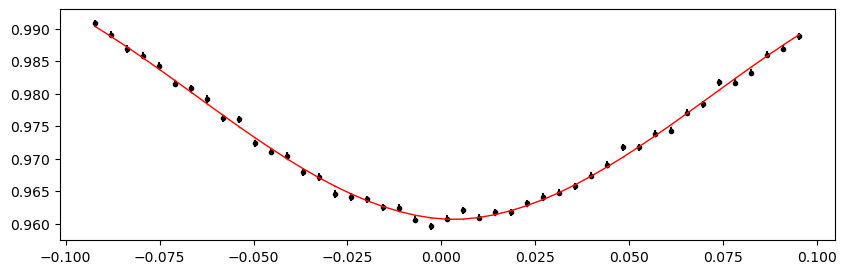

1346.2748768000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.42it/s]


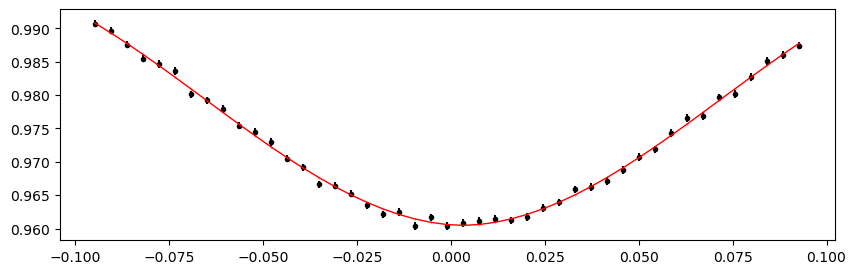

1346.600703 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.77it/s]


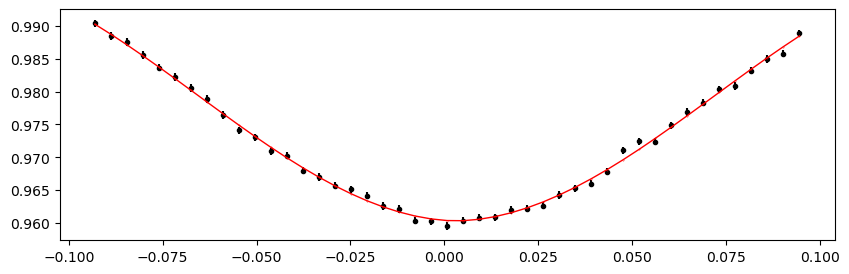

1346.9265292 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.96it/s]


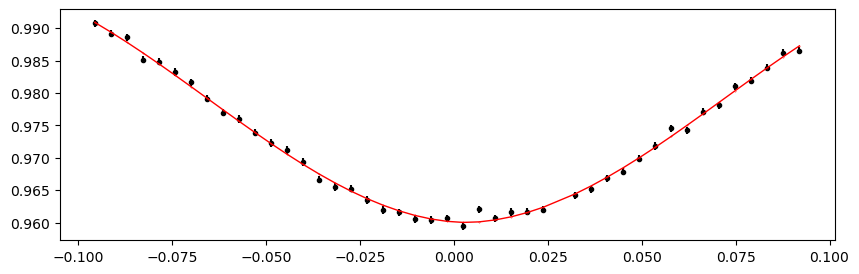

1347.2523554 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.92it/s]


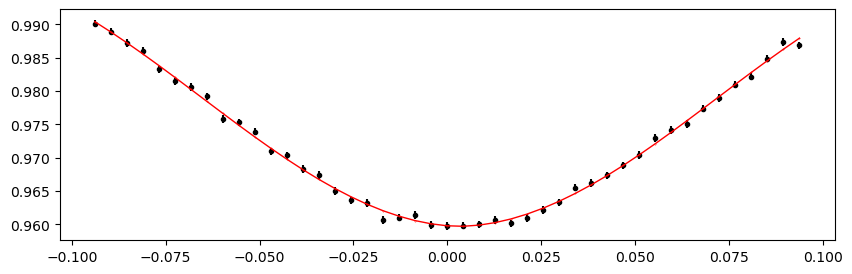

1347.5781816 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.05it/s]


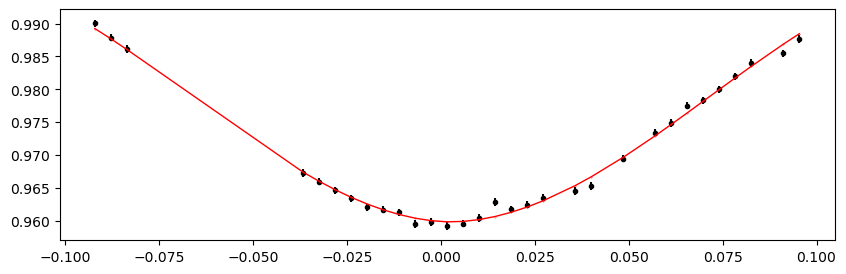

1347.9040078 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.80it/s]


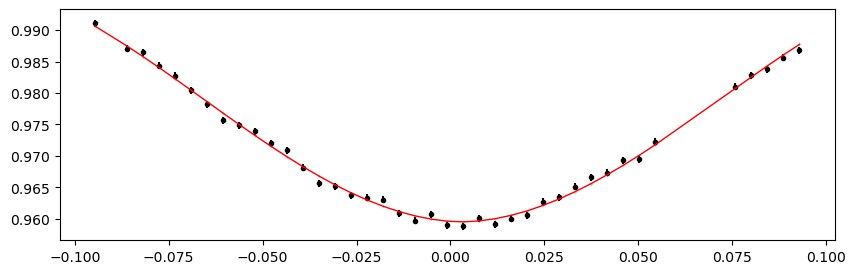

Time 1348.229834 does not have enough data points: 16
1348.5556602 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.38it/s]


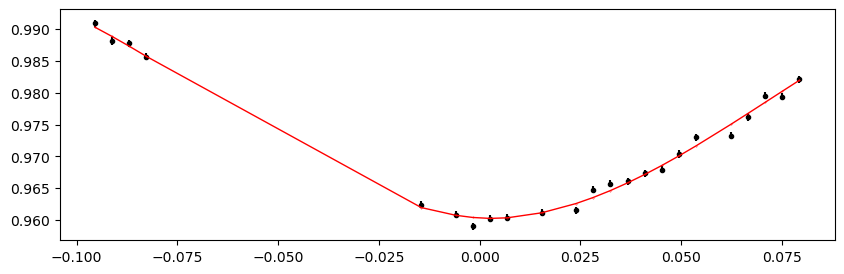

Time 1348.8814864 does not have enough data points: 6
Time 1349.2073126 does not have enough data points: 18
1349.5331388 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.71it/s]


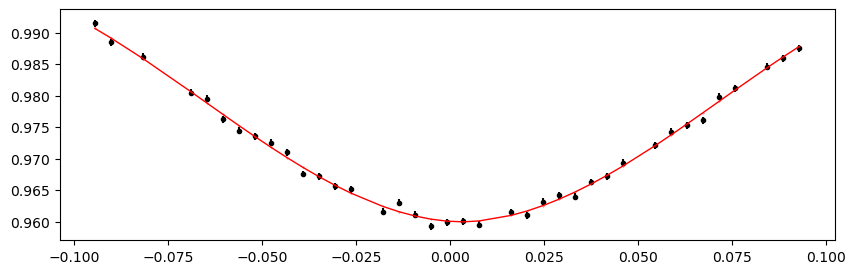

1349.8589650000001 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.99it/s]


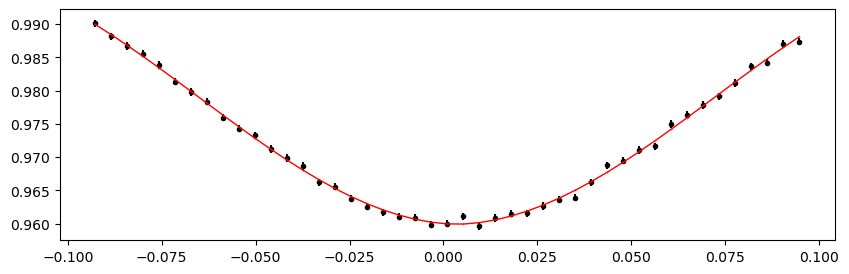

1350.1847912 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.68it/s]


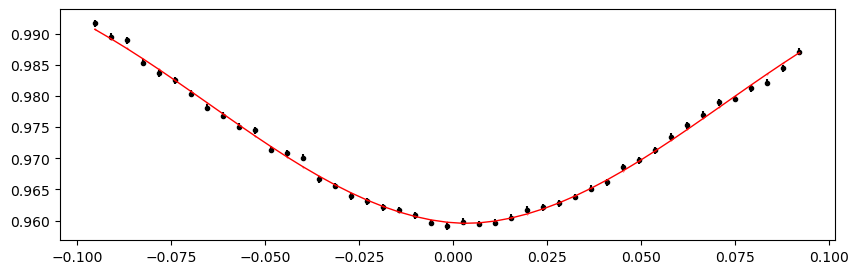

1350.5106174 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.94it/s]


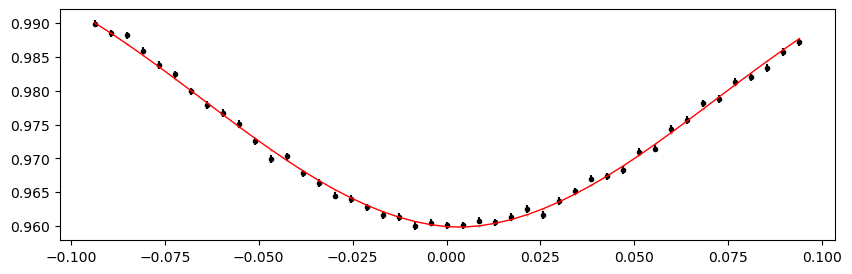

1350.8364436 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.57it/s]


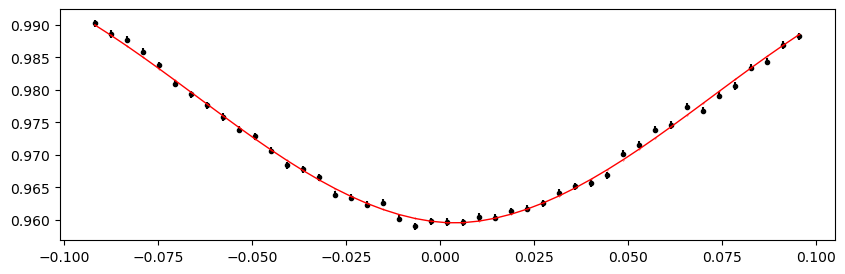

1351.1622698 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.82it/s]


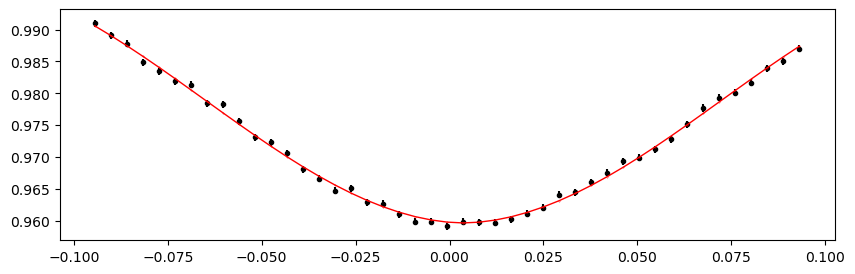

1351.488096 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.04it/s]


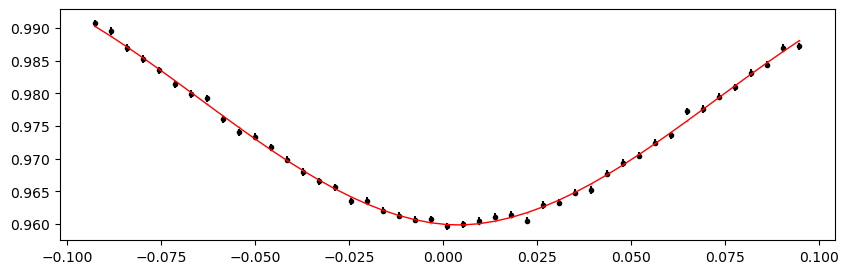

1351.8139222 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.48it/s]


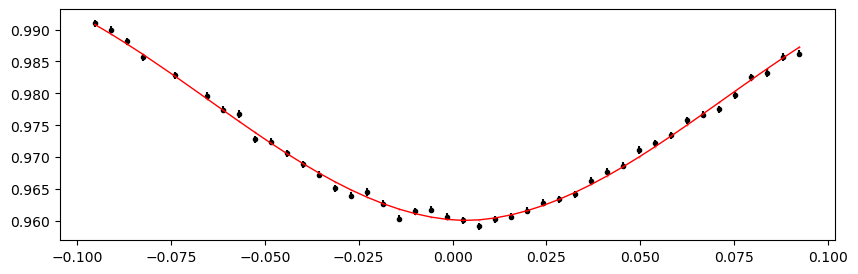

1352.1397484 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.08it/s]


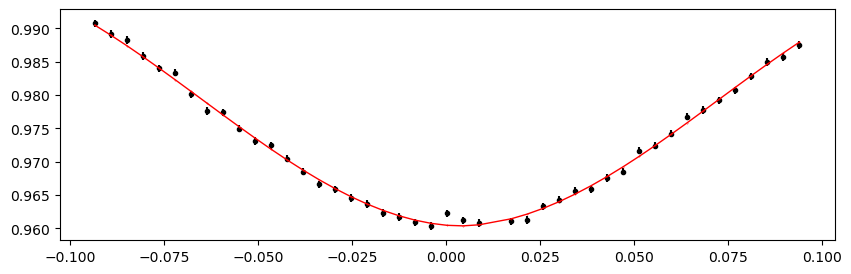

1352.4655746 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.26it/s]


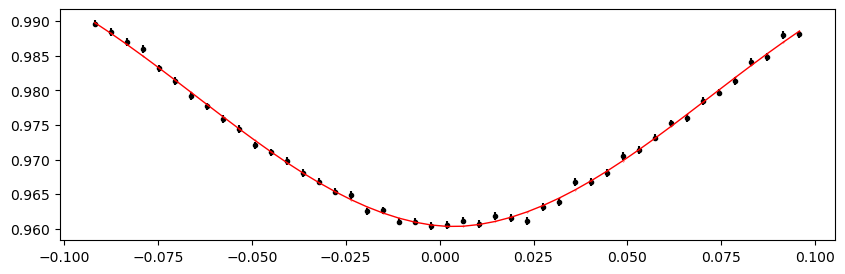

1352.7914008 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.44it/s]


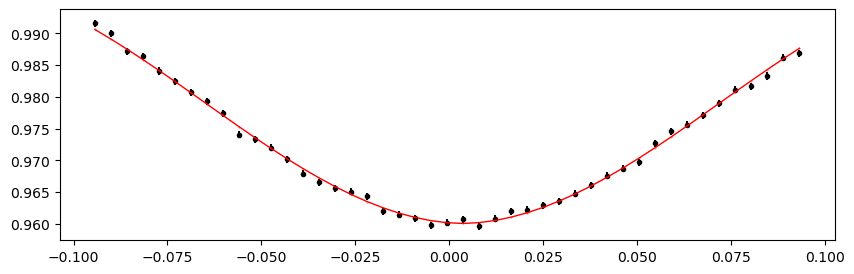

1353.117227 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.29it/s]


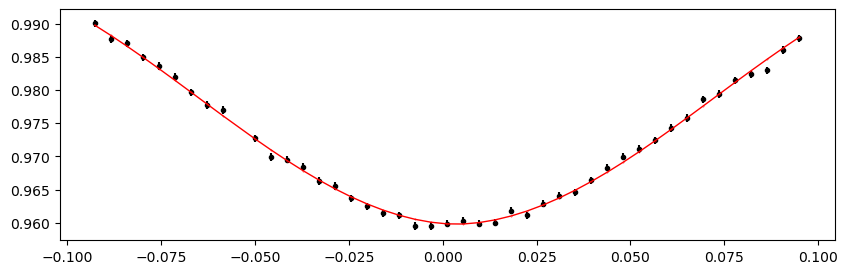

2062.1150382 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.73it/s]


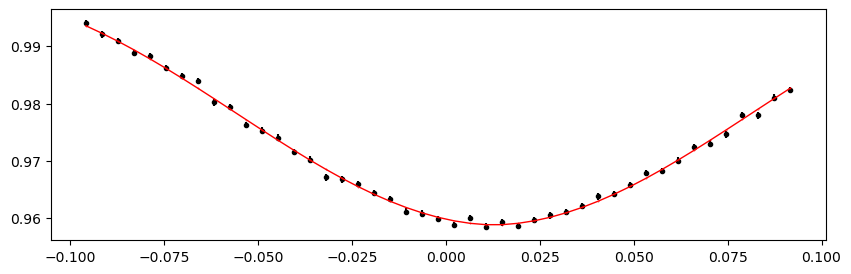

2062.4408644 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.08it/s]


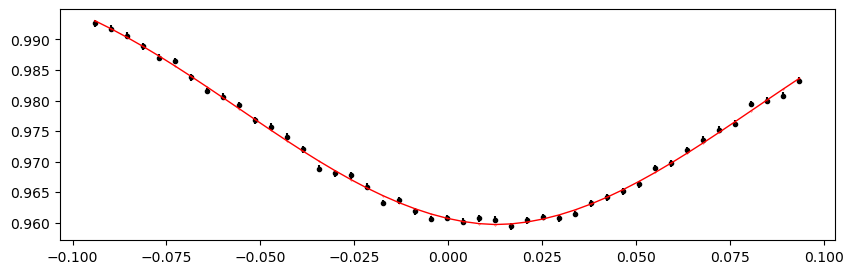

2062.7666906 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.24it/s]


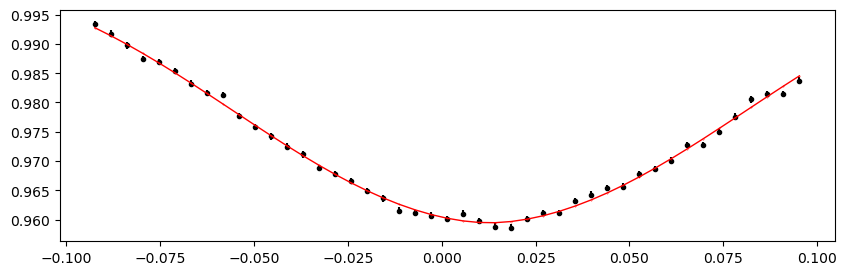

2063.0925168 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.51it/s]


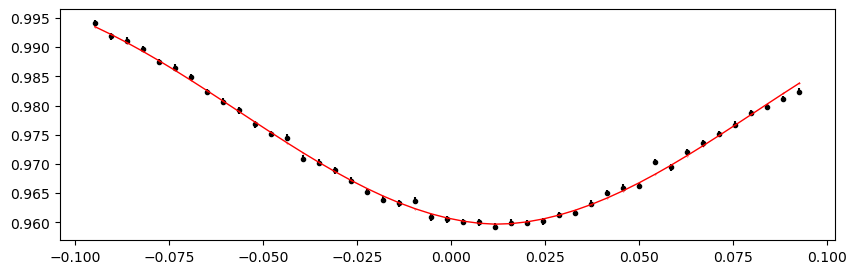

2063.4183430000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.80it/s]


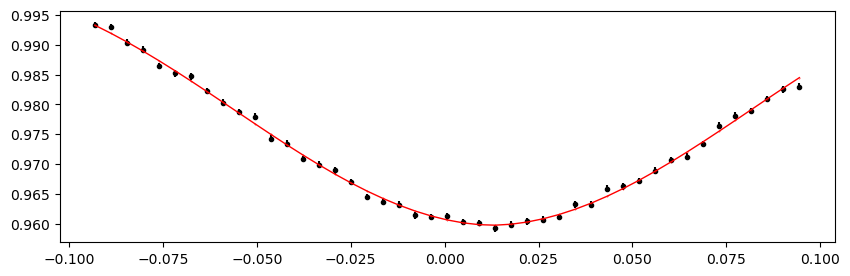

2063.7441692 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.26it/s]


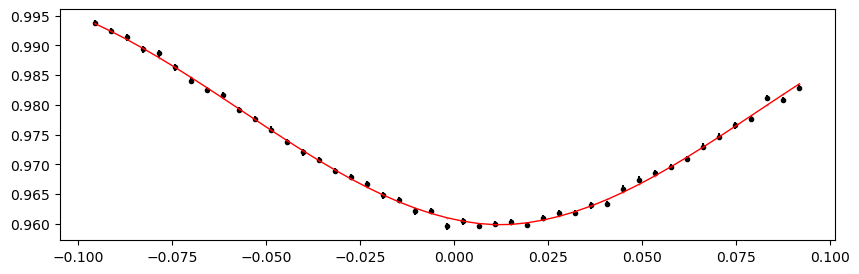

2064.0699954 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.87it/s]


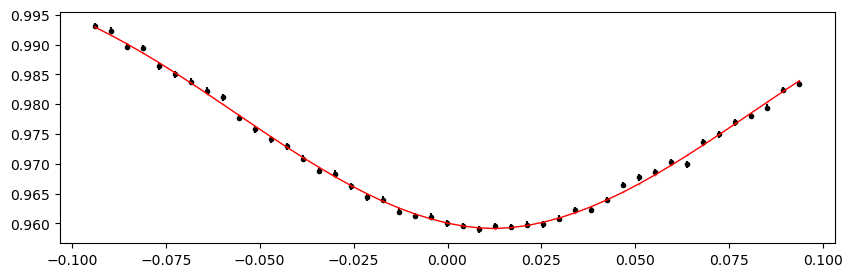

2064.3958216 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.95it/s]


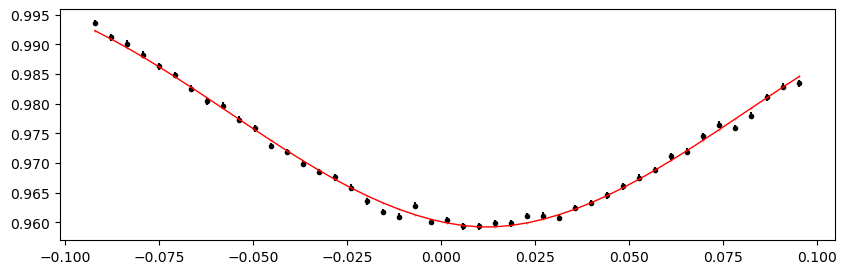

2064.7216478 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.61it/s]


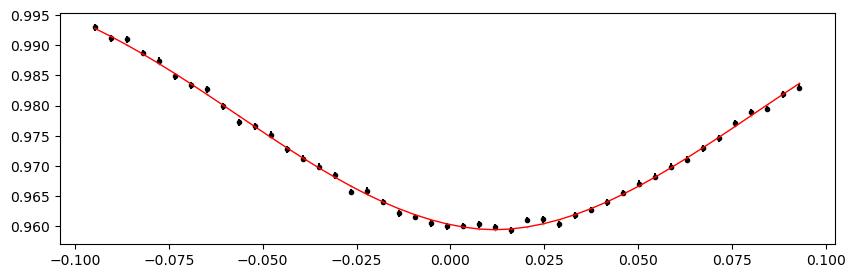

2065.047474 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.56it/s]


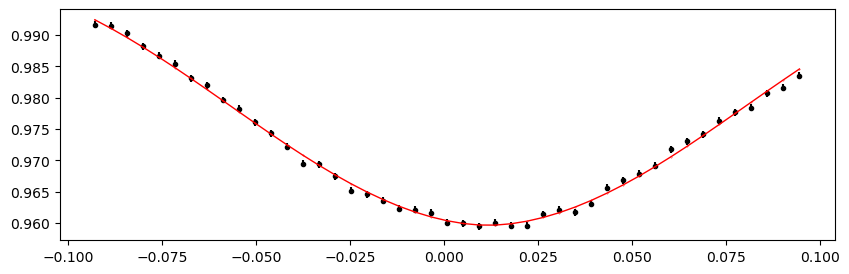

2065.3733002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.24it/s]


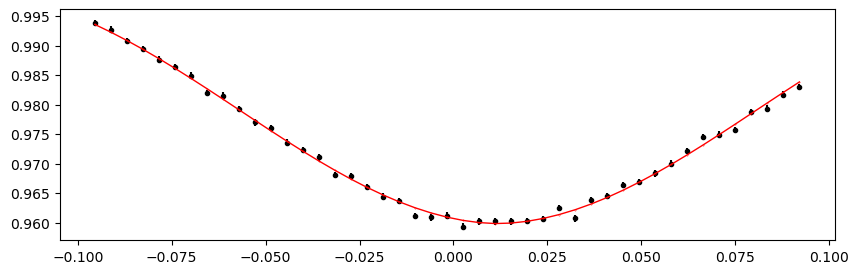

2065.6991264 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.16it/s]


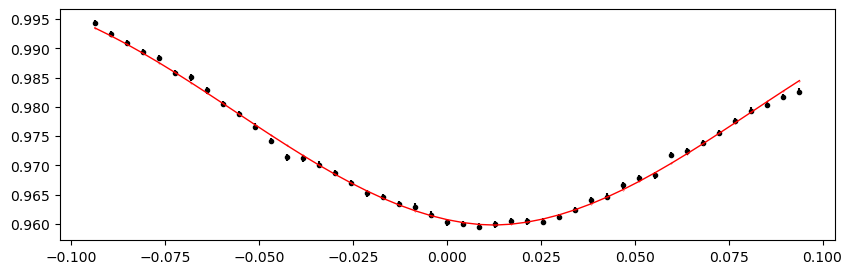

2066.0249526 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.64it/s]


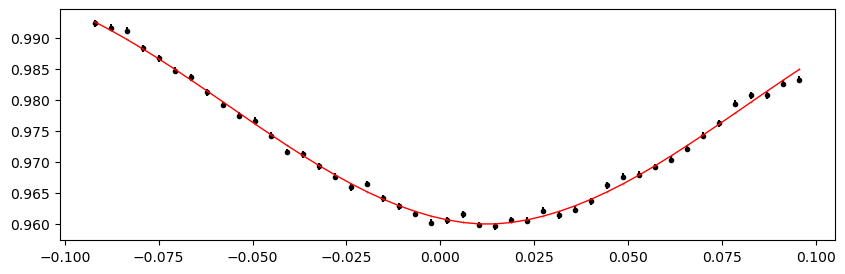

2066.3507788 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.80it/s]


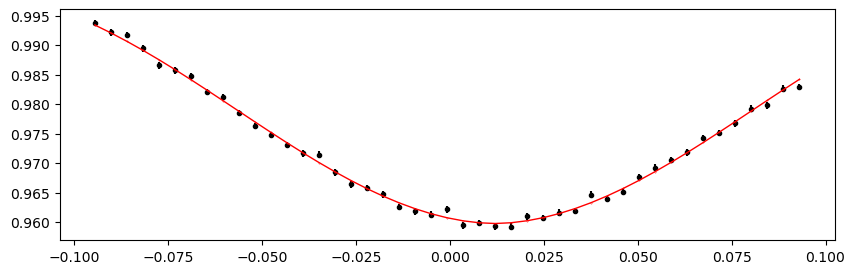

2066.676605 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.54it/s]


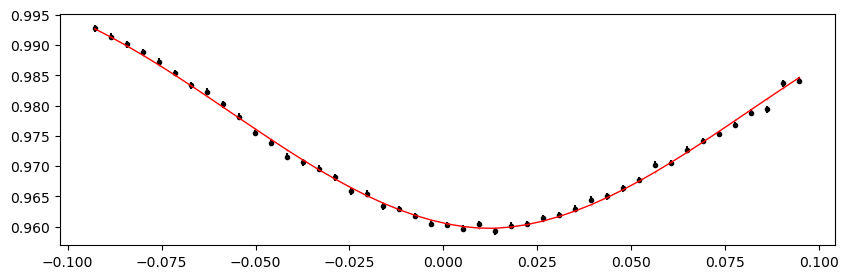

2067.0024312 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.49it/s]


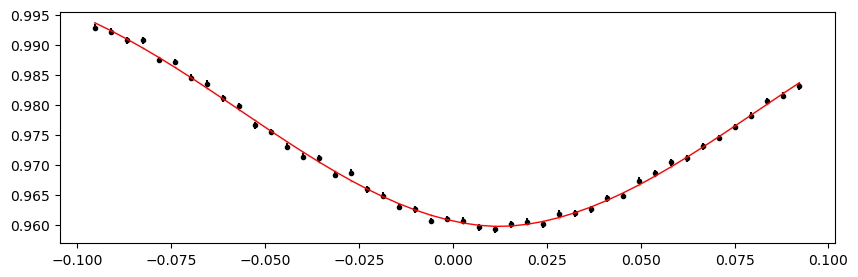

2067.3282574 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.60it/s]


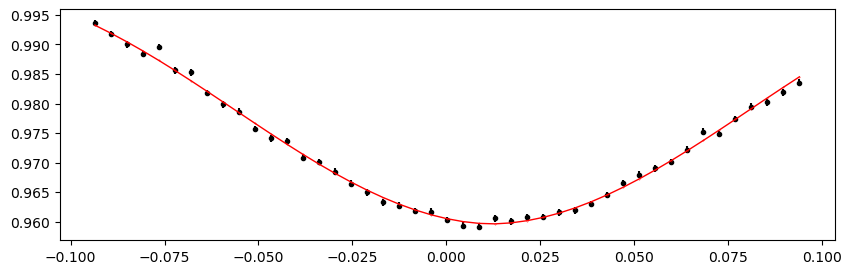

2067.6540836 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.66it/s]


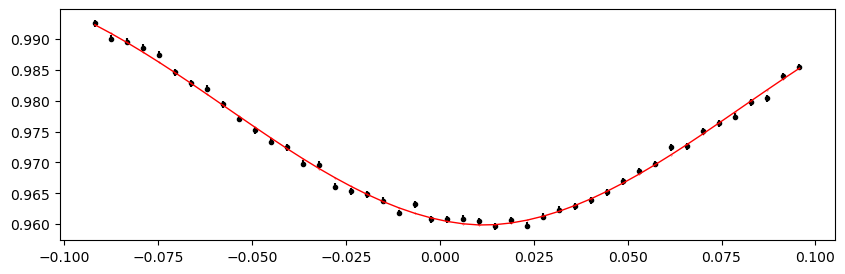

2067.9799098000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.80it/s]


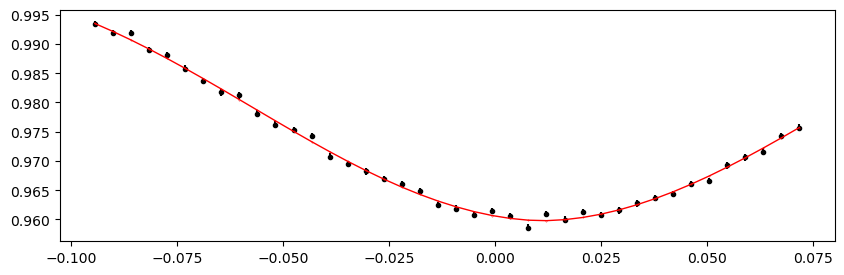

2068.3057360000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.03it/s]


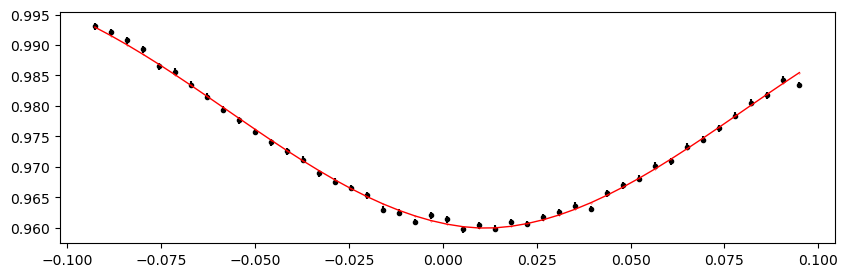

2068.6315622 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.18it/s]


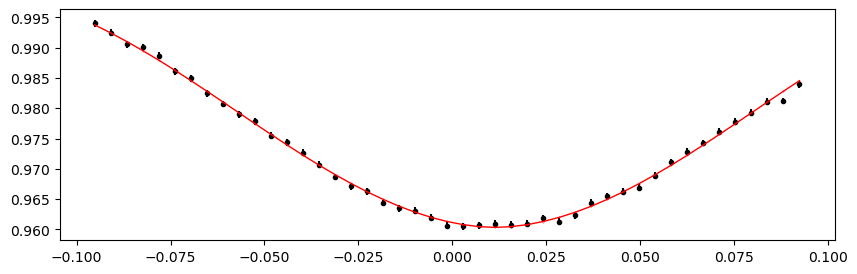

2068.9573884 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.28it/s]


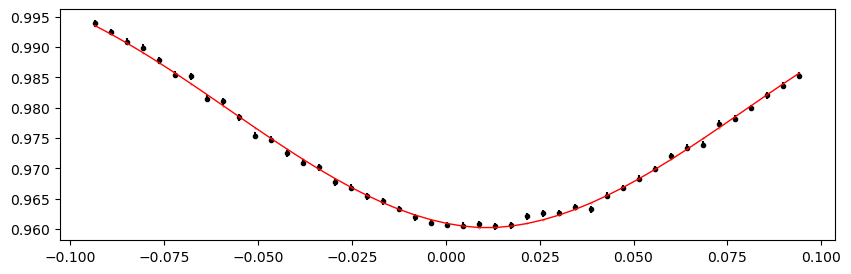

2069.2832146 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.73it/s]


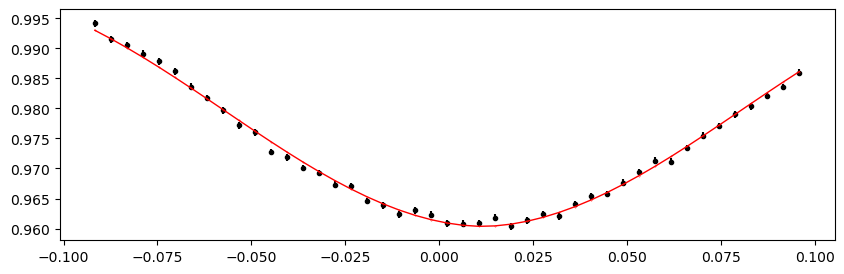

2069.6090408 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.89it/s]


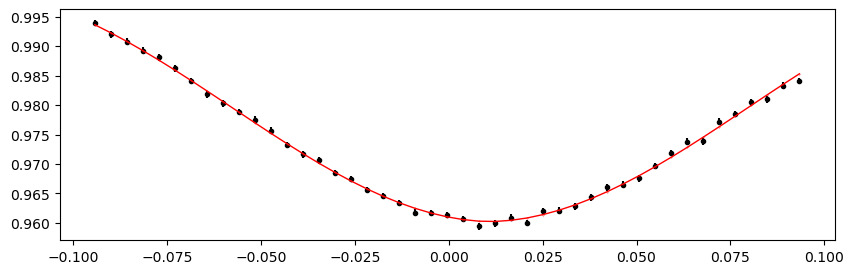

2069.934867 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.43it/s]


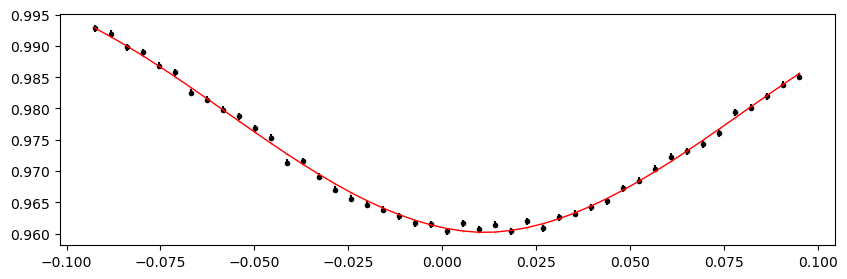

2070.2606932 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.37it/s]


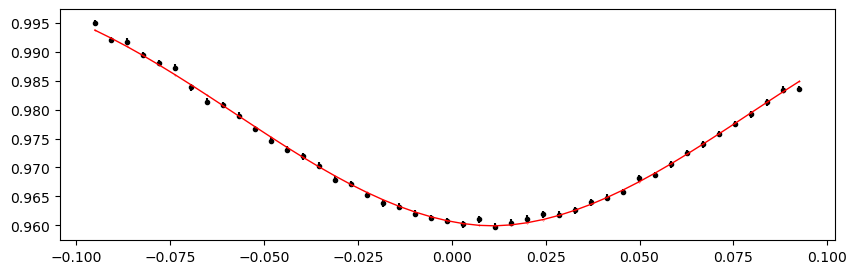

2070.5865194 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.56it/s]


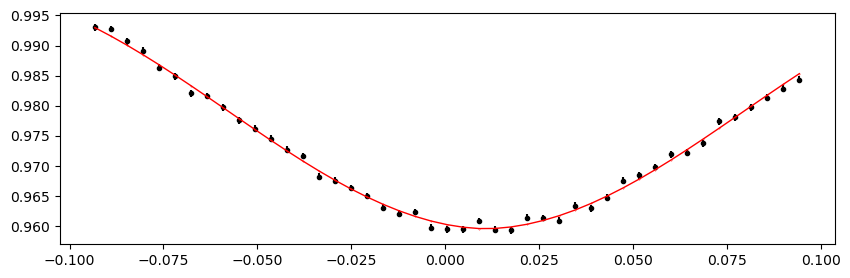

2070.9123456 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.40it/s]


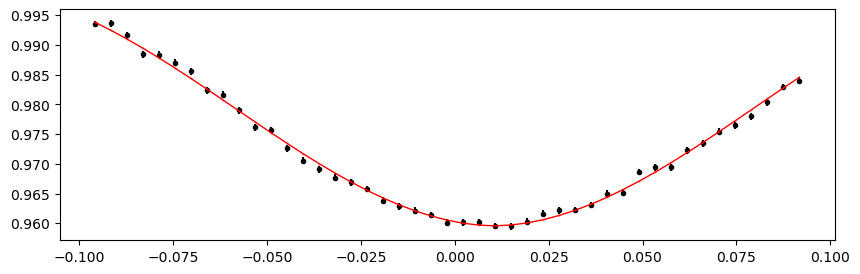

2071.2381718 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.72it/s]


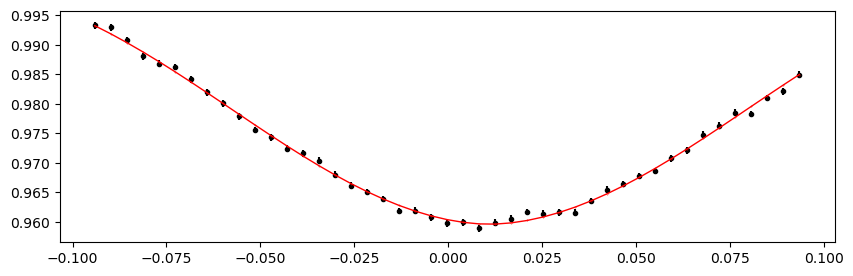

2071.563998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.95it/s]


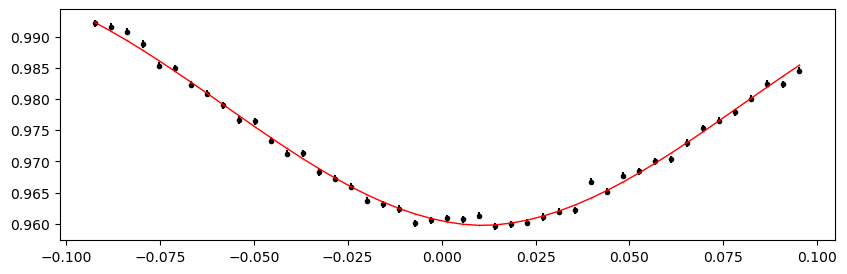

2071.8898242 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.69it/s]


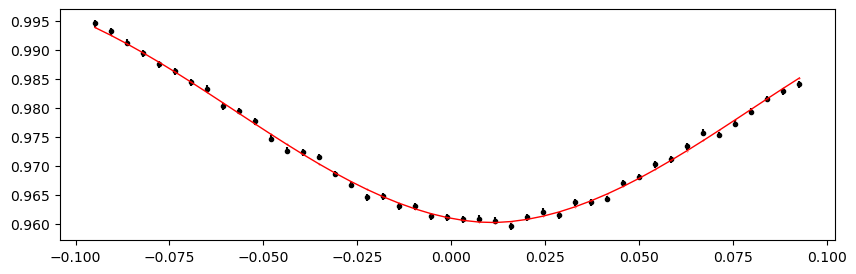

2072.2156504 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.69it/s]


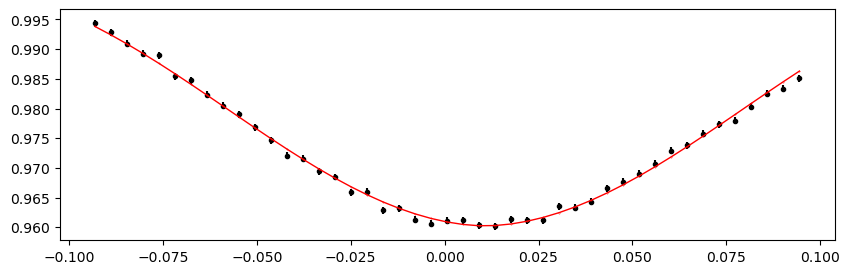

2072.5414766 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.70it/s]


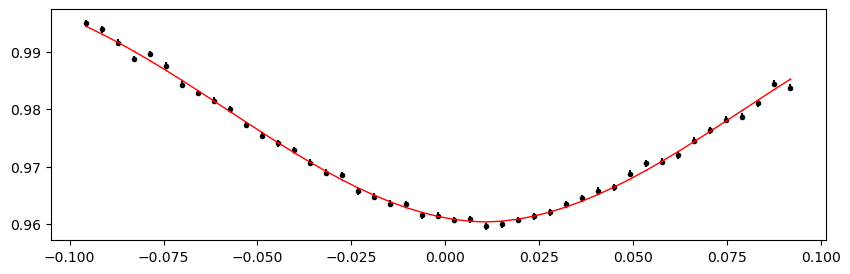

Time 2075.1480862 does not have enough data points: 15
2075.4739124 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.90it/s]


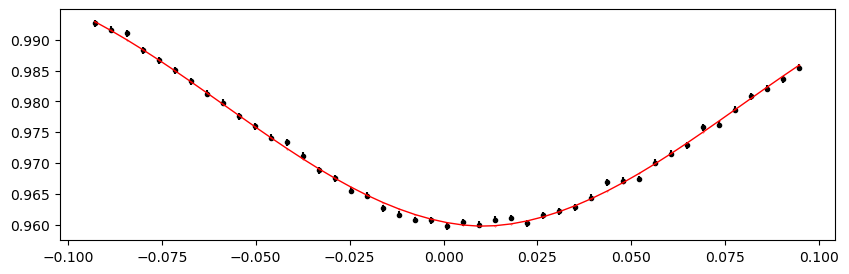

2075.7997386 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.05it/s]


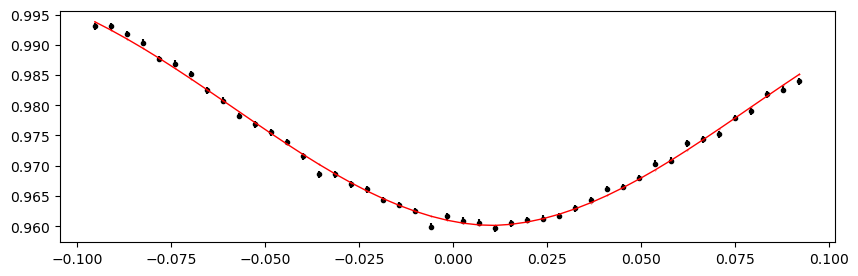

2076.1255648 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.17it/s]


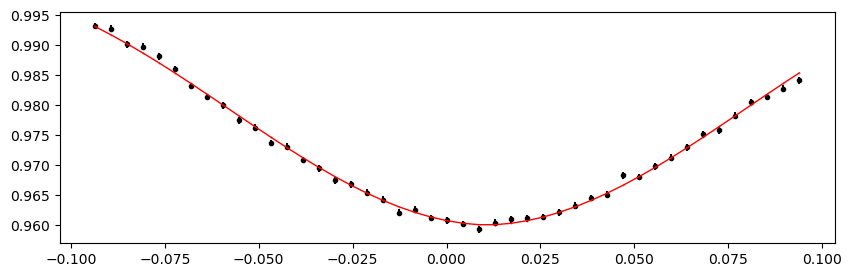

2076.451391 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.00it/s]


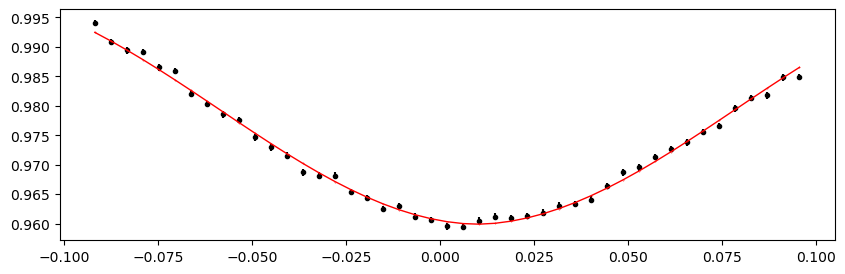

2076.7772172 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.67it/s]


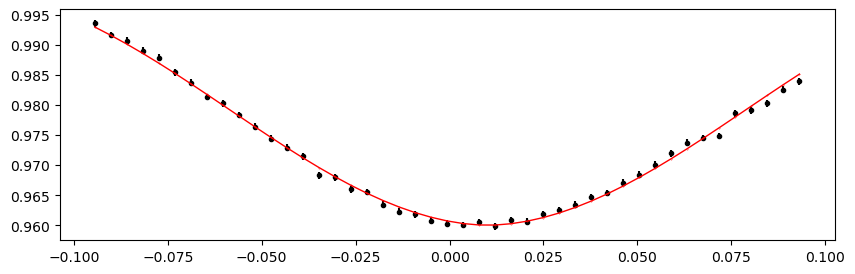

2077.1030434 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.54it/s]


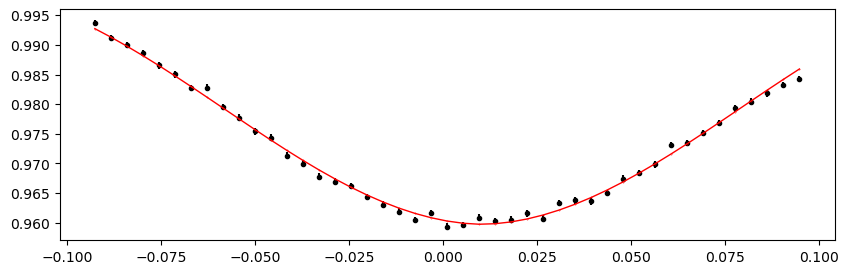

2077.4288696000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.77it/s]


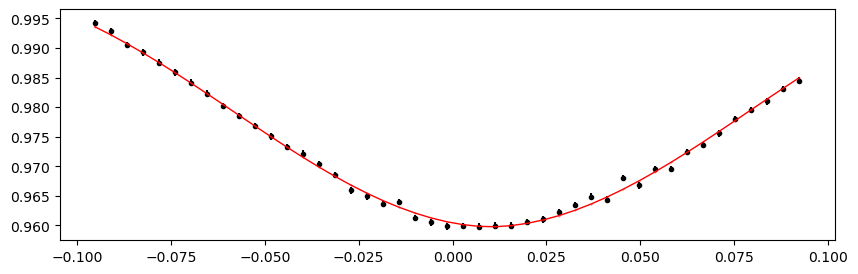

2077.7546958000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.54it/s]


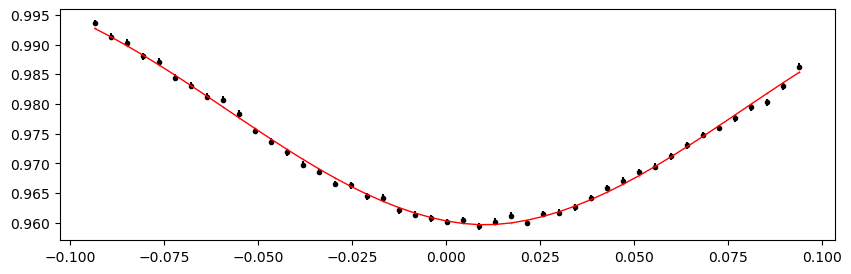

2078.080522 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.69it/s]


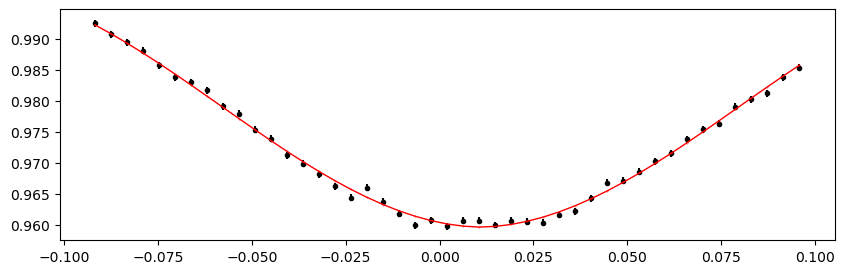

2078.4063482 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.04it/s]


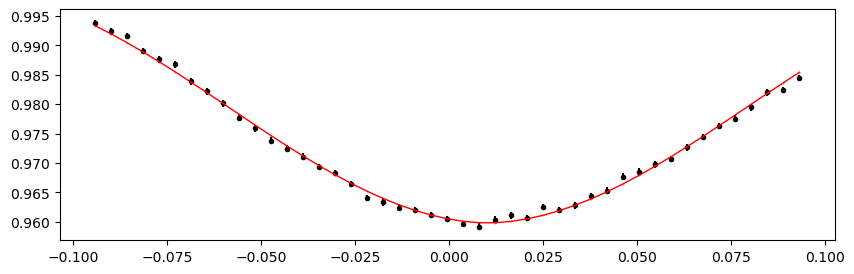

2078.7321744 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.60it/s]


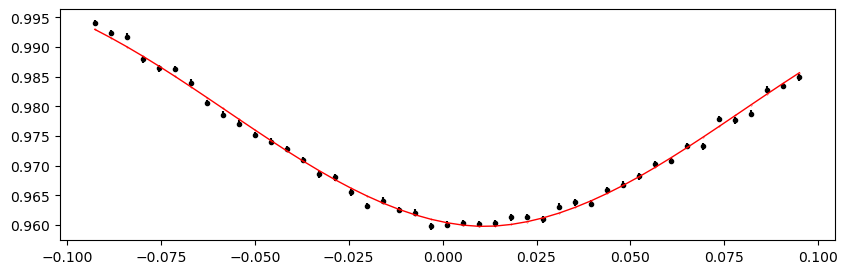

2079.0580006 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.73it/s]


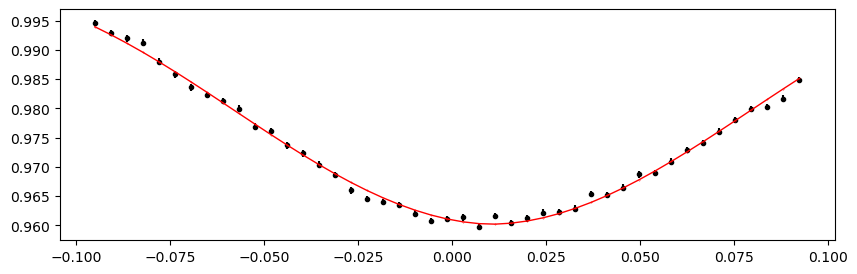

2079.3838268 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.66it/s]


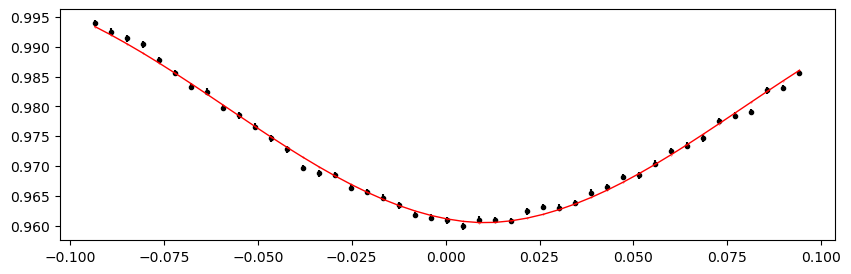

2079.709653 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.53it/s]


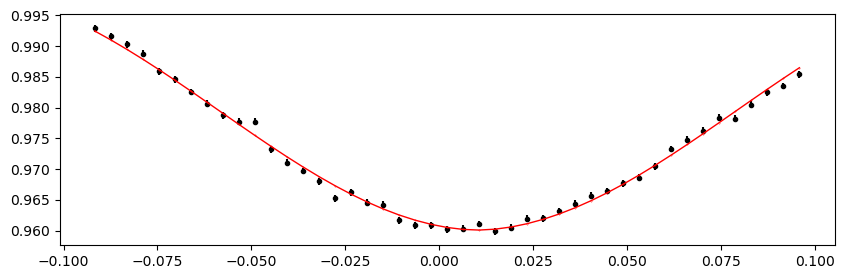

2080.0354792 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.27it/s]


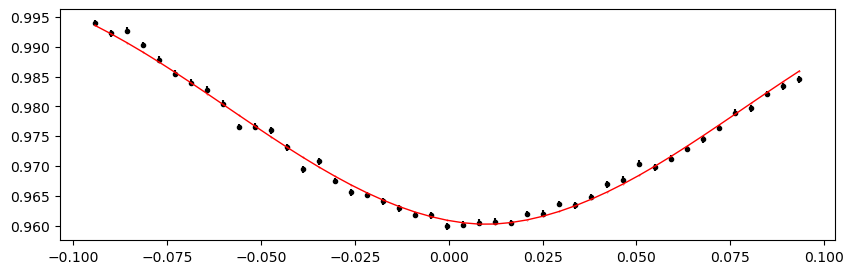

2080.3613054 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.20it/s]


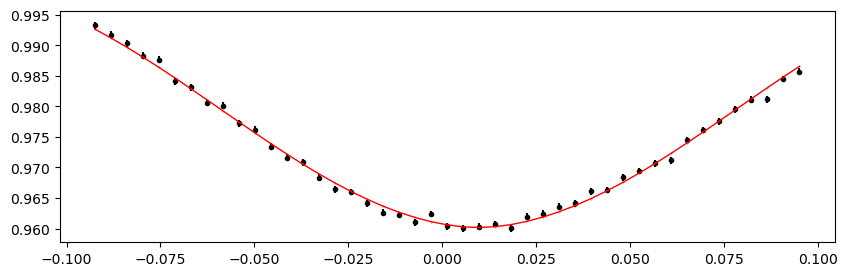

2080.6871316 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.49it/s]


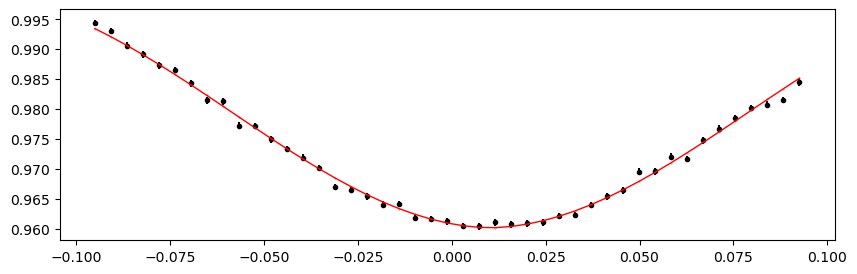

2081.0129578 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.09it/s]


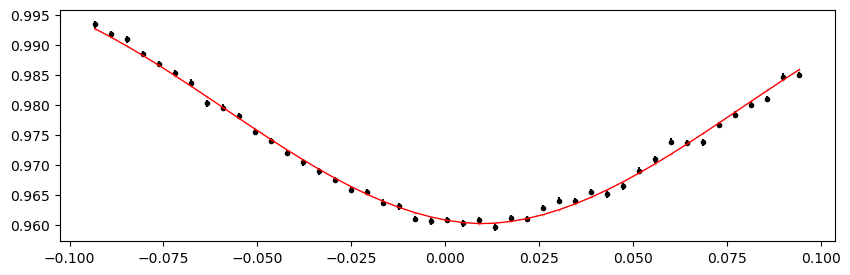

2081.338784 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.48it/s]


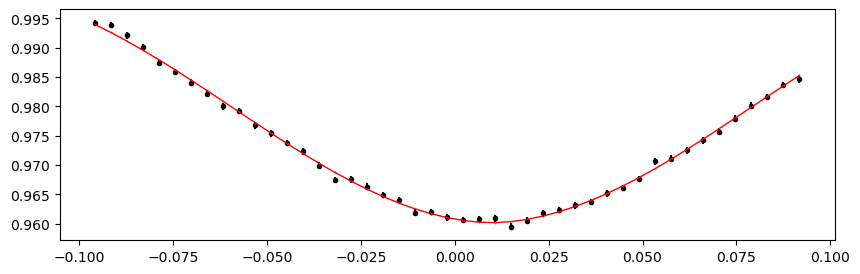

2081.6646102 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.82it/s]


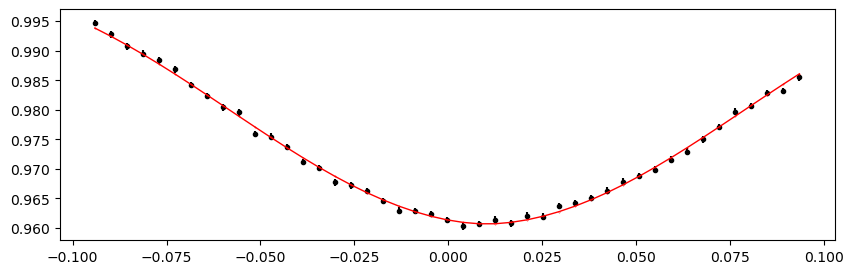

2081.9904364 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.86it/s]


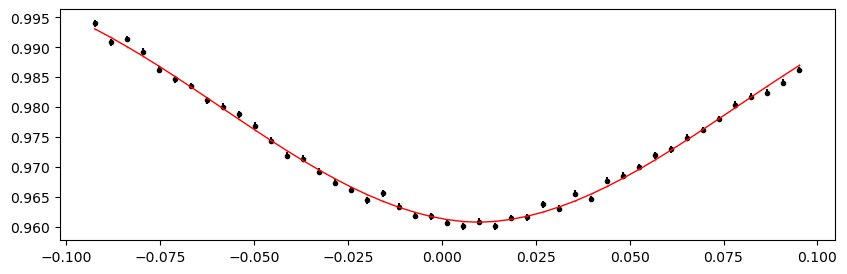

2082.3162626000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.45it/s]


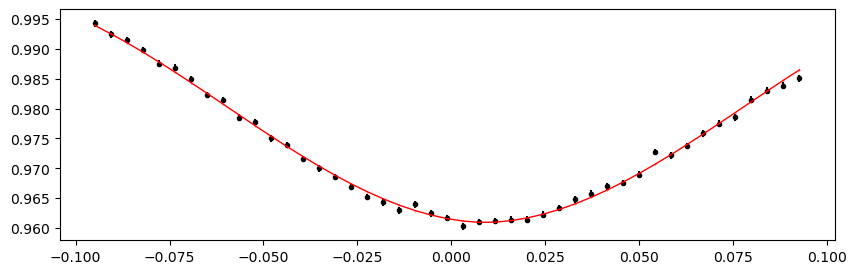

2082.6420888000002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.33it/s]


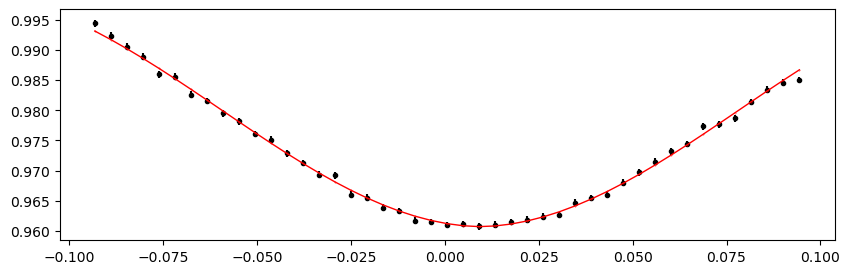

2082.967915 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.60it/s]


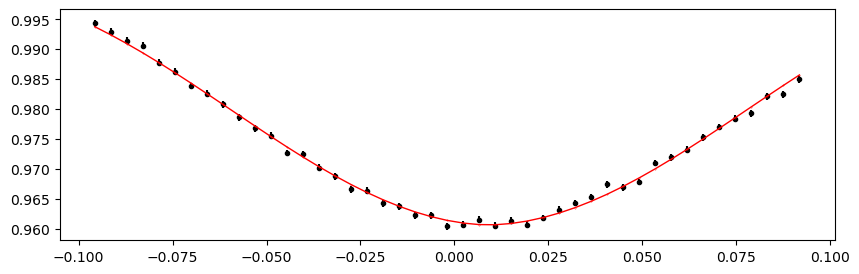

2083.2937412 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.96it/s]


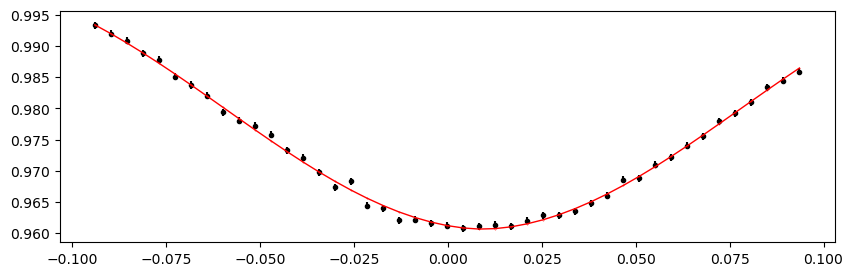

2083.6195674 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.11it/s]


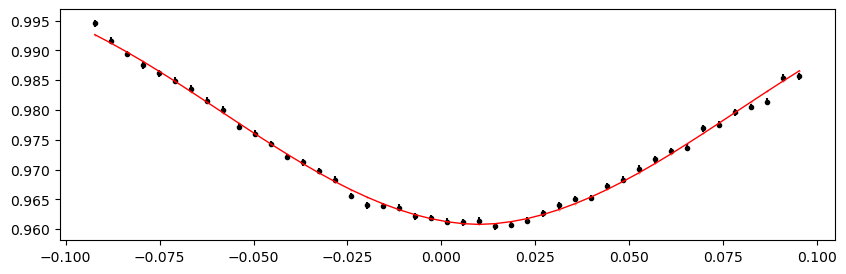

2083.9453936 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.43it/s]


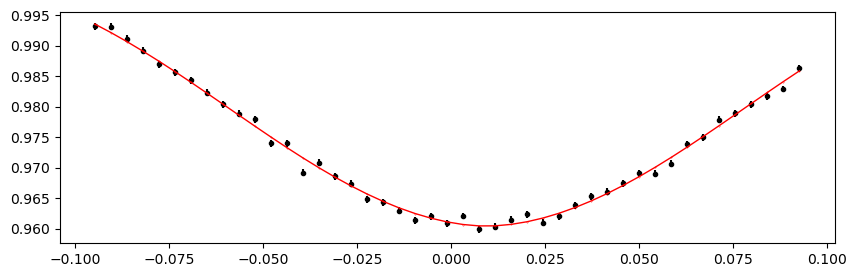

2084.2712198 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.04it/s]


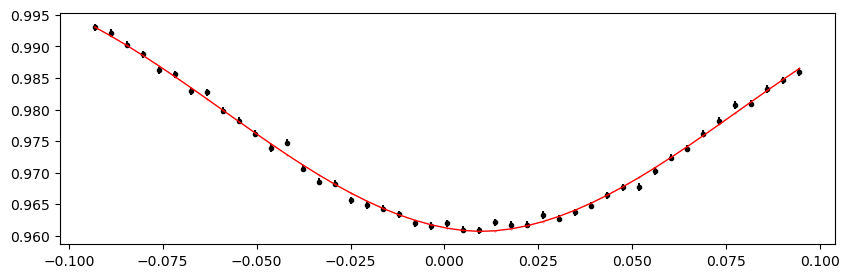

2084.597046 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.55it/s]


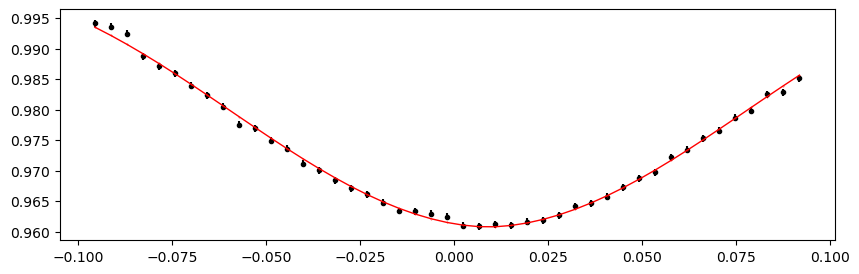

2084.9228722 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.69it/s]


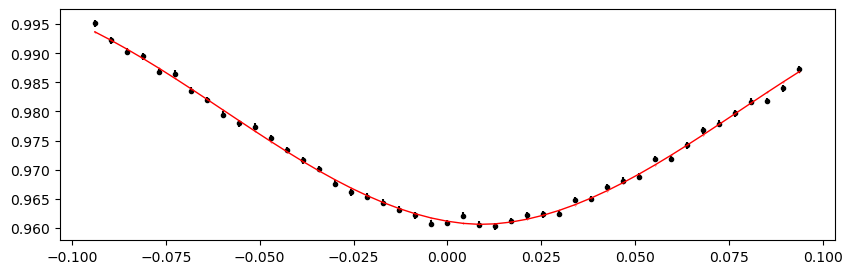

2085.2486984 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.98it/s]


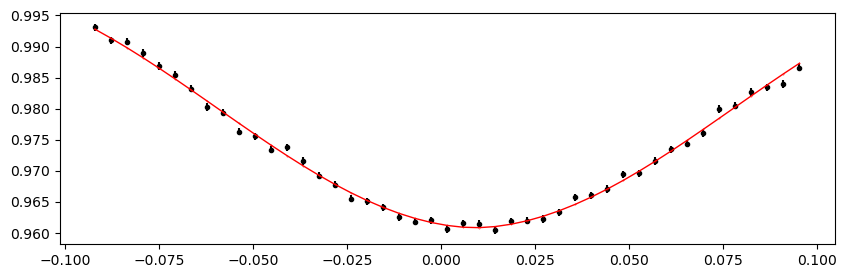

2085.5745246 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.67it/s]


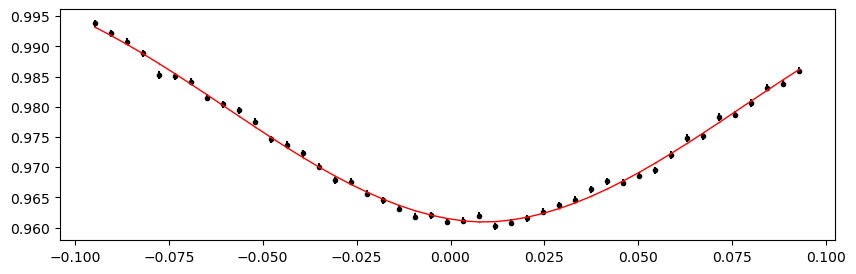

3154.9361129999998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.38it/s]


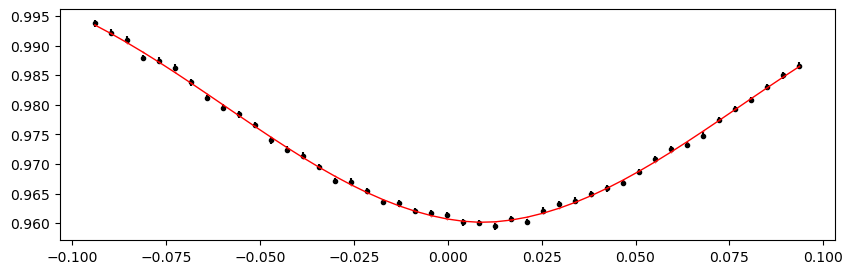

3155.2619392 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.31it/s]


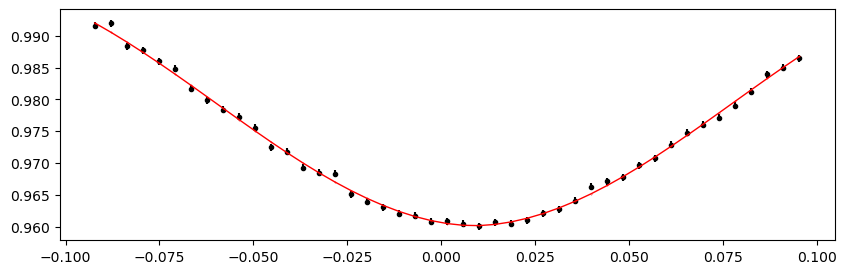

3155.5877654 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.75it/s]


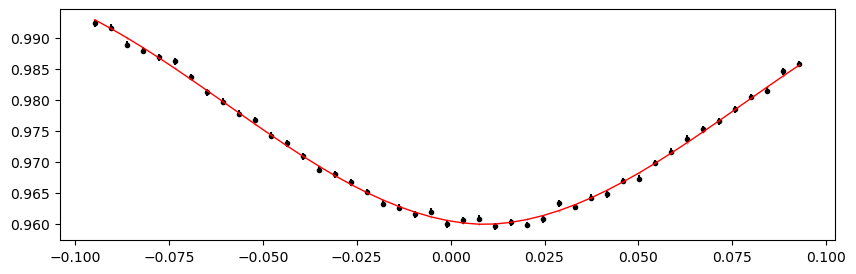

3155.9135916 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.62it/s]


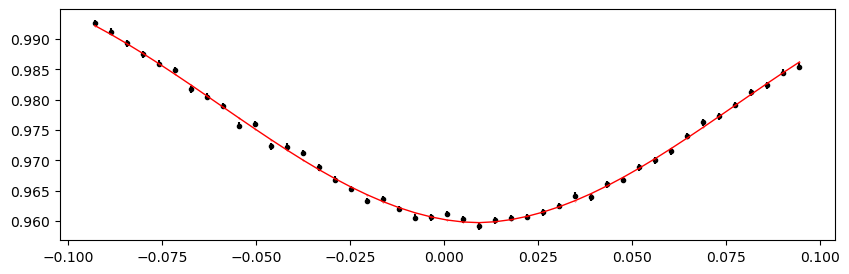

3156.2394178000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.81it/s]


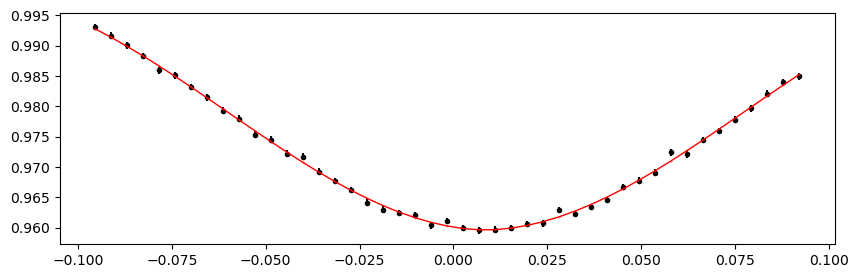

3156.5652440000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.41it/s]


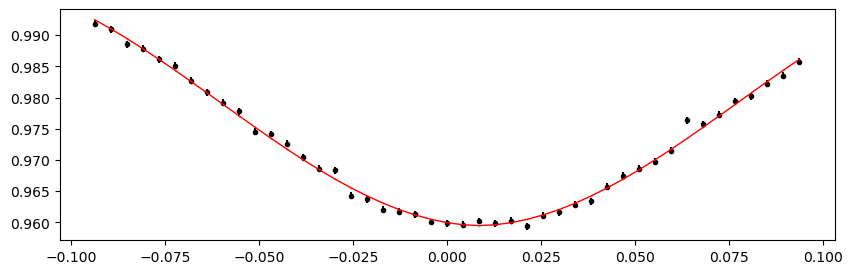

3156.8910702000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.72it/s]


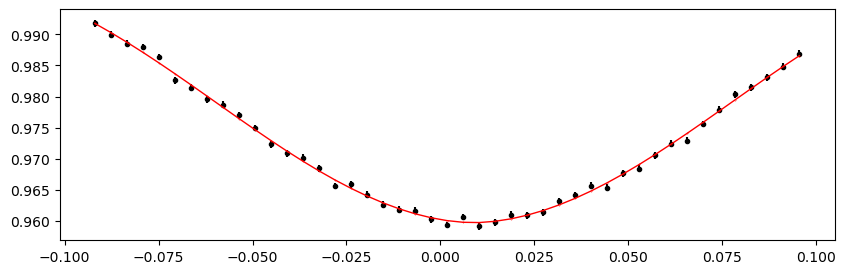

3157.2168964 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.54it/s]


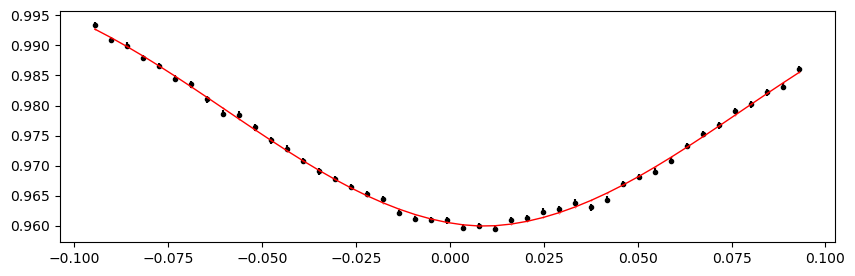

3157.5427226 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.54it/s]


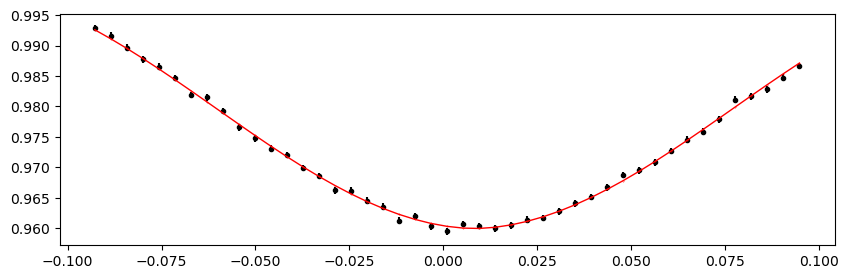

3157.8685488 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.71it/s]


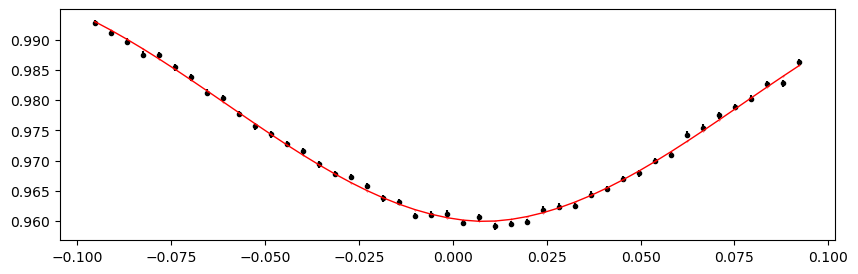

3158.194375 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.09it/s]


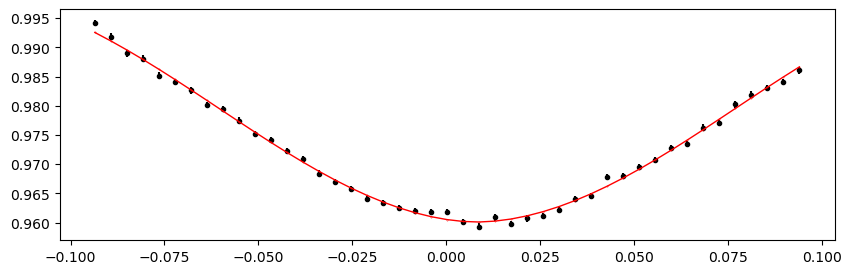

3158.5202012 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.57it/s]


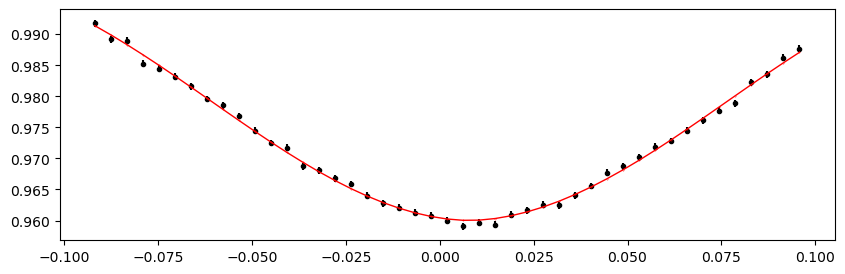

3158.8460274 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.45it/s]


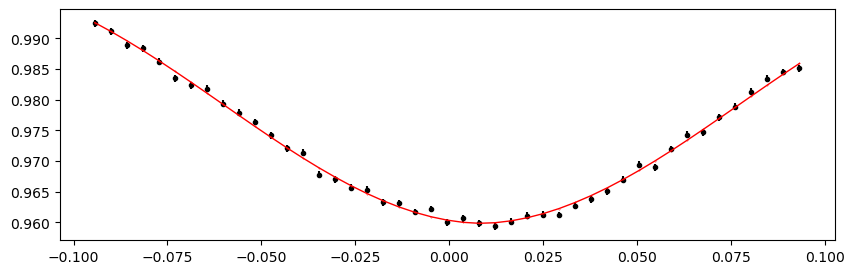

3159.1718536 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.55it/s]


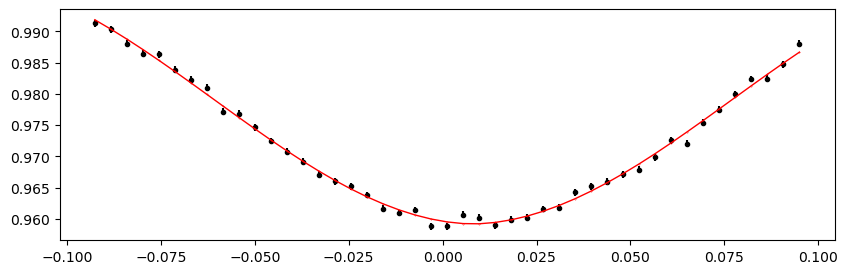

3159.4976798 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.62it/s]


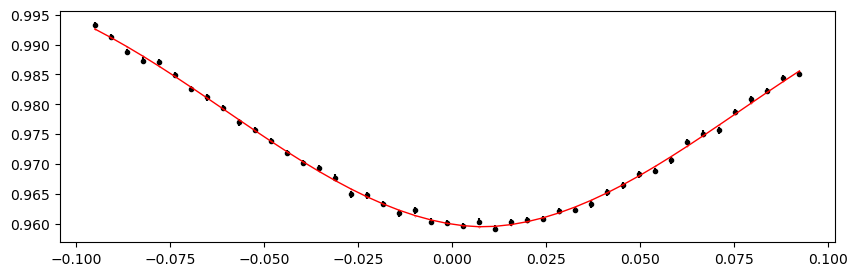

3159.823506 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.67it/s]


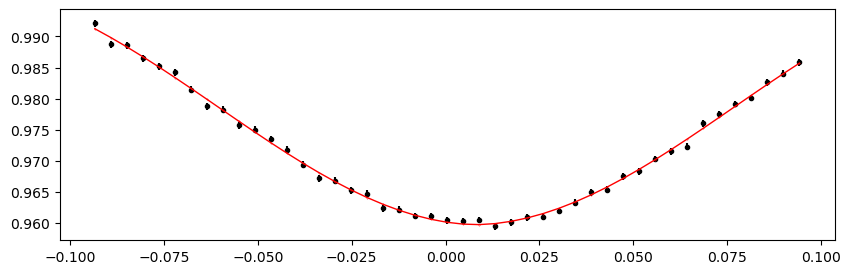

3160.1493322 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.43it/s]


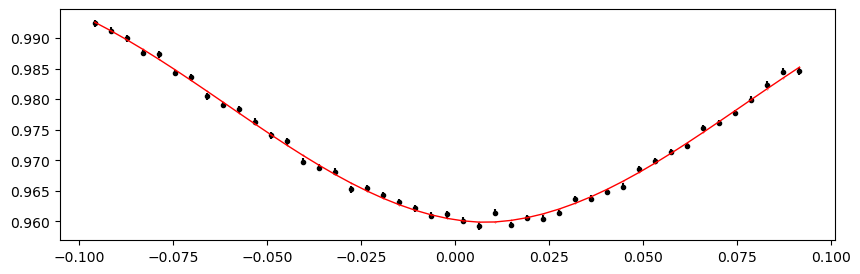

3160.4751584 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.01it/s]


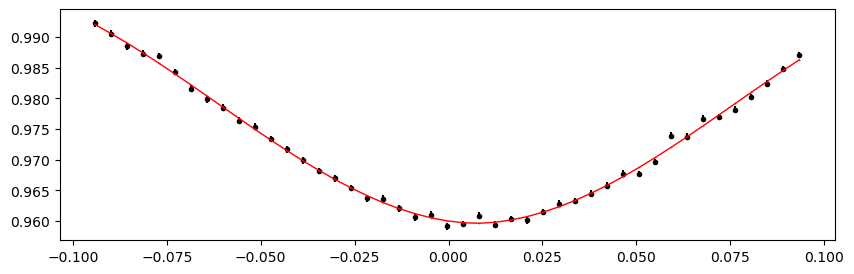

3160.8009846 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.97it/s]


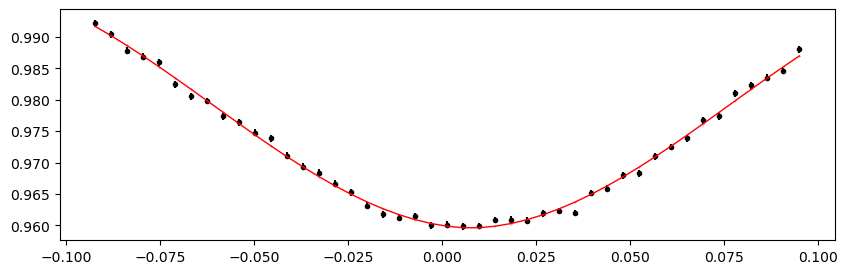

3161.1268108000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.17it/s]


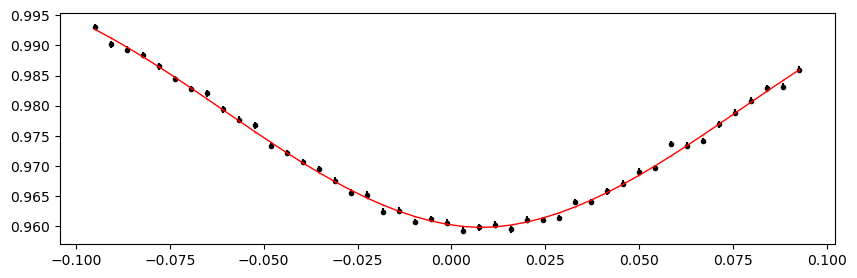

3161.4526370000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.15it/s]


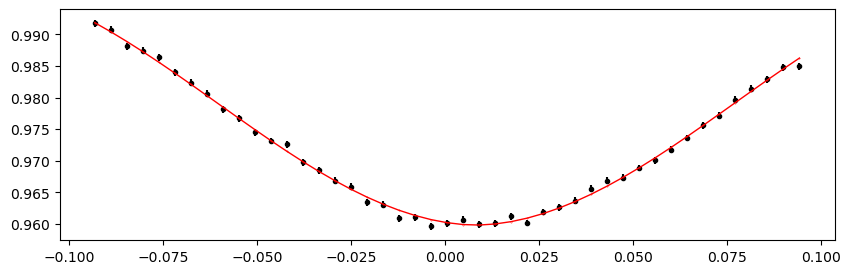

Time 3161.7784632000003 does not have enough data points: 19
3162.1042894 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.66it/s]


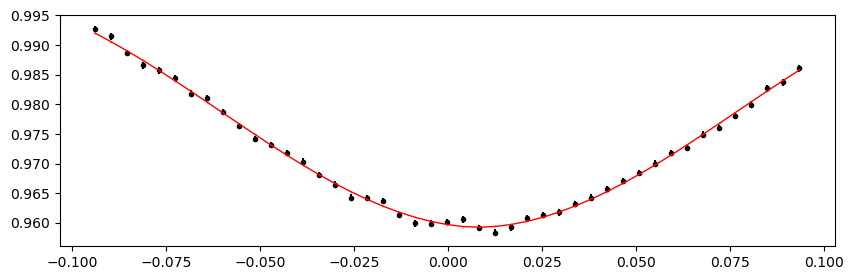

3162.4301156 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.94it/s]


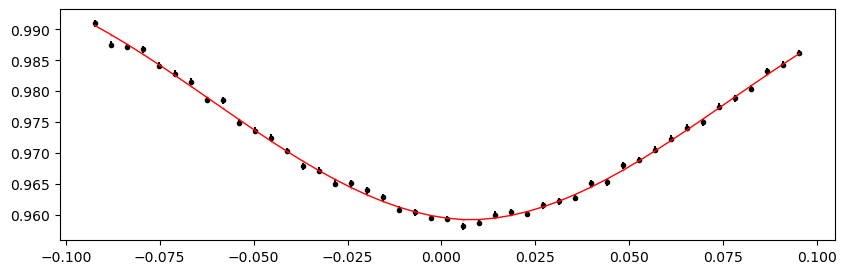

3162.7559418 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.12it/s]


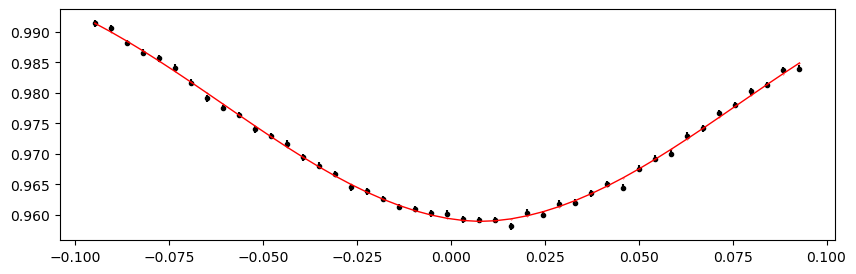

3163.081768 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.15it/s]


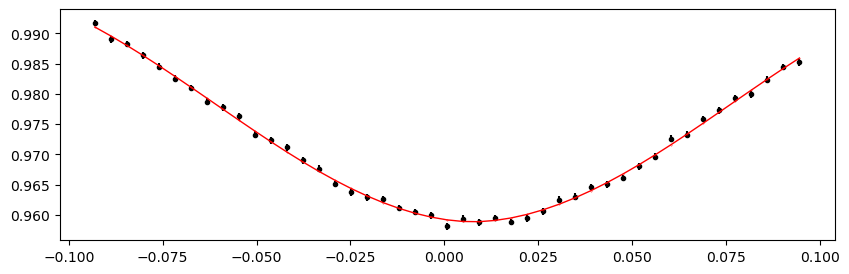

3163.4075942 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.54it/s]


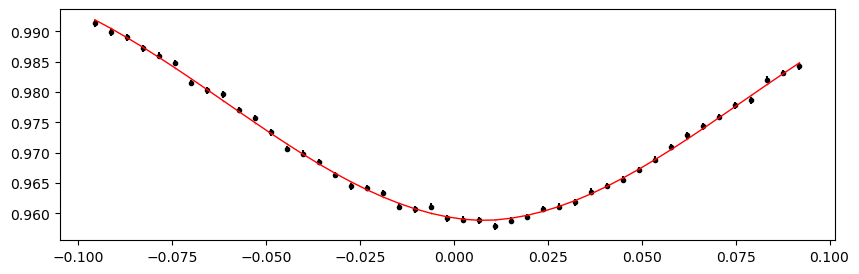

3163.7334204 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.51it/s]


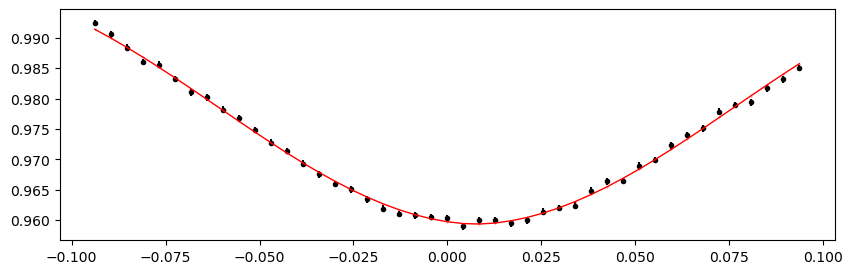

3164.0592466 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.66it/s]


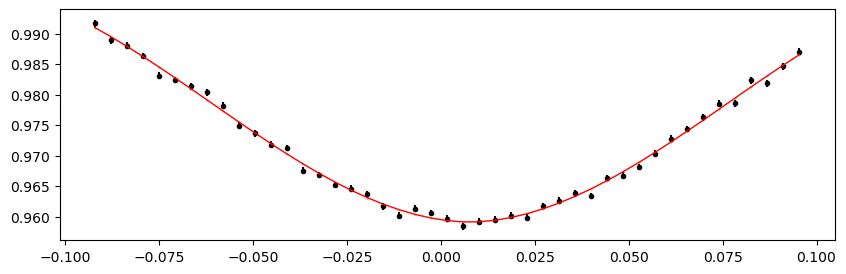

3164.3850727999998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.07it/s]


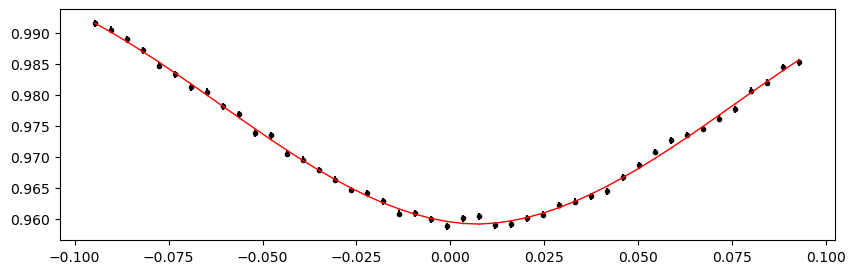

3164.710899 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.55it/s]


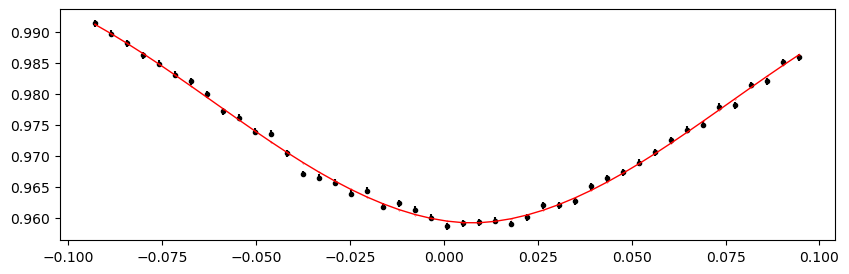

3165.0367252 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.18it/s]


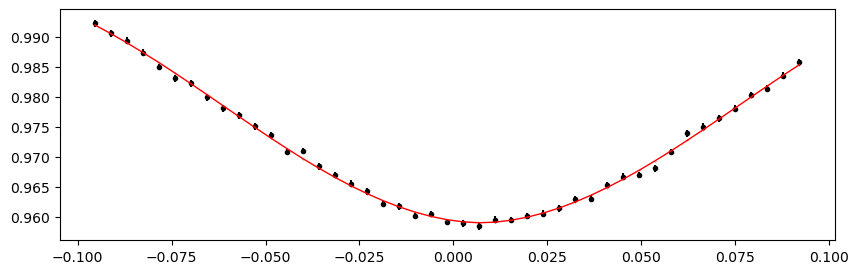

3165.3625514 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.64it/s]


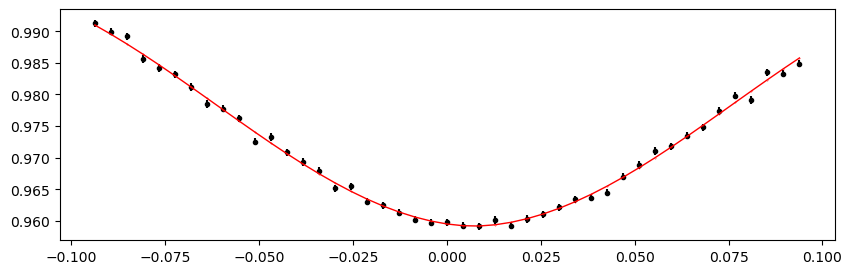

3165.6883776000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.90it/s]


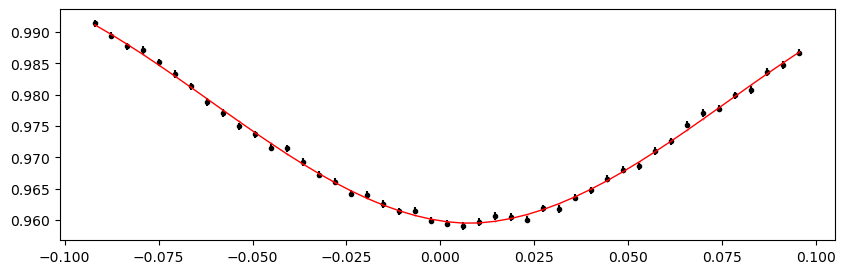

3168.6208134 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.51it/s]


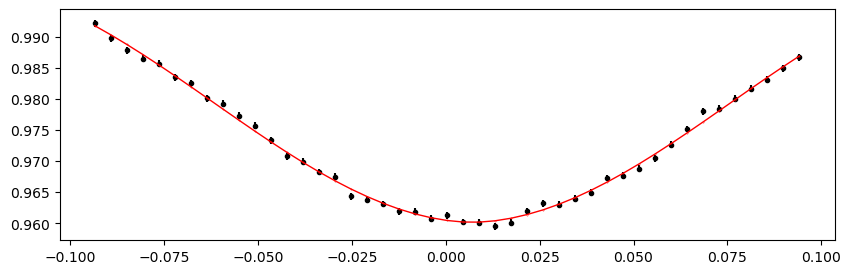

3168.9466396 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.49it/s]


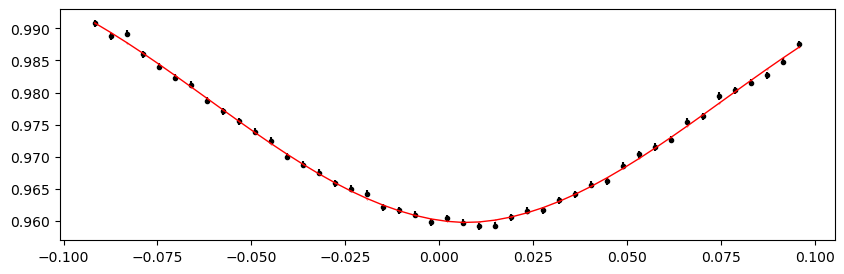

3169.2724658 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.67it/s]


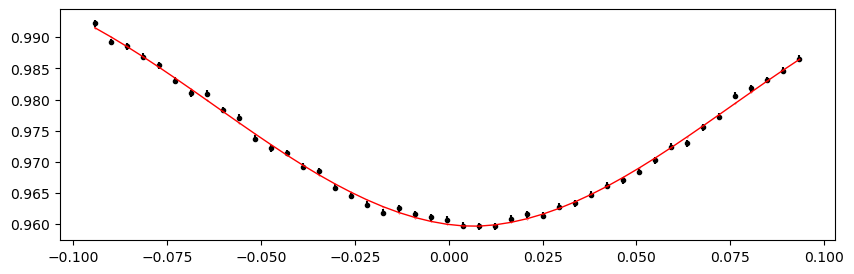

3169.598292 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.71it/s]


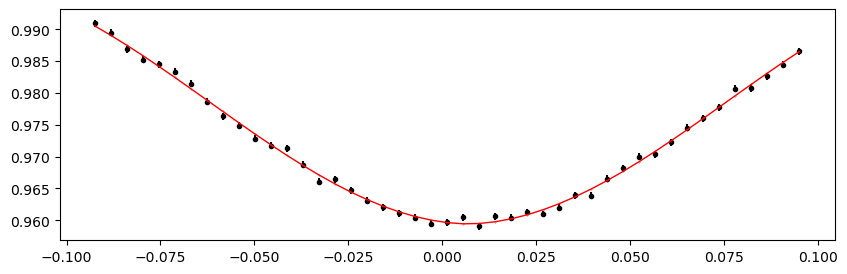

3169.9241182 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.73it/s]


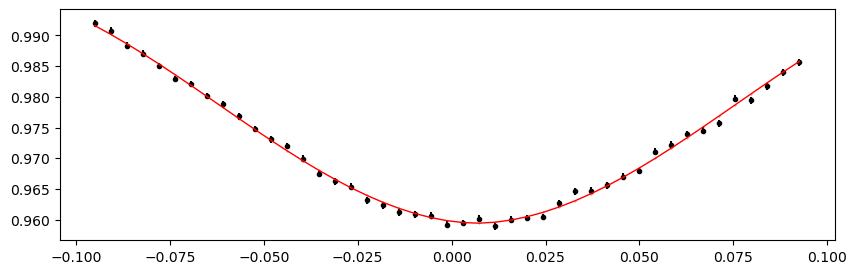

3170.2499444 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.34it/s]


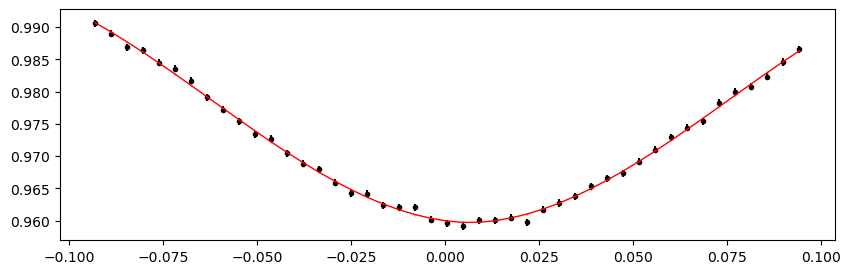

3170.5757706000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.24it/s]


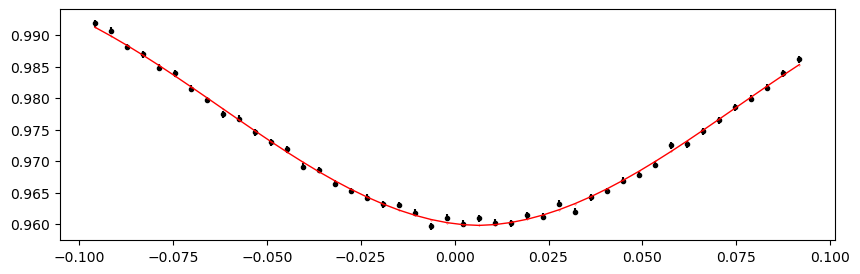

3170.9015968000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.56it/s]


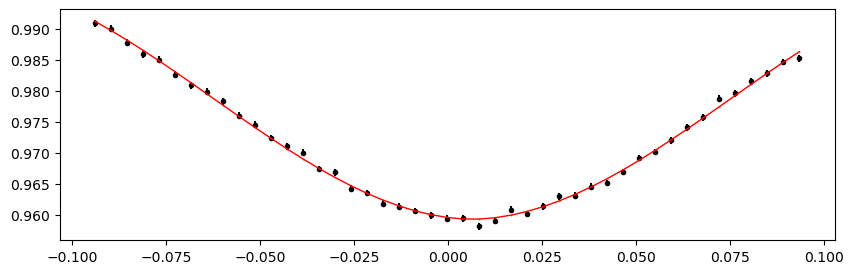

3171.2274230000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.56it/s]


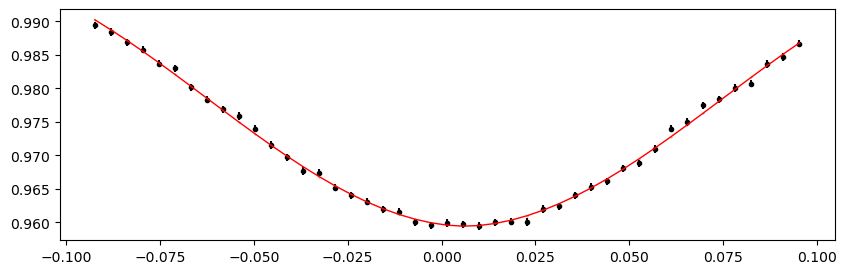

3171.5532492 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.24it/s]


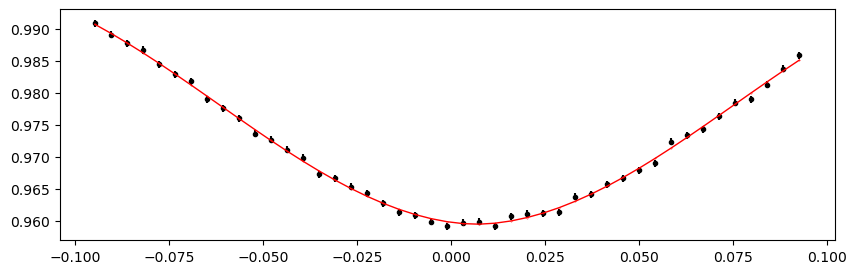

3171.8790754 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.87it/s]


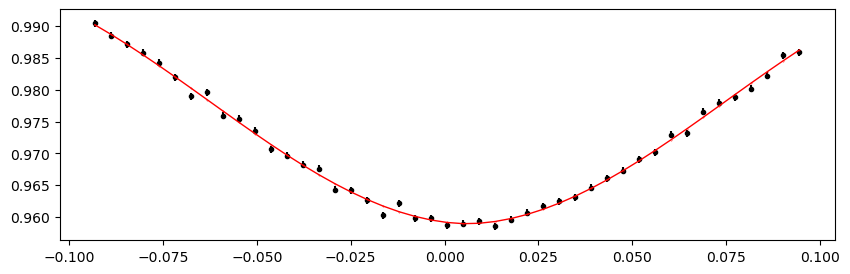

3172.2049016 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.47it/s]


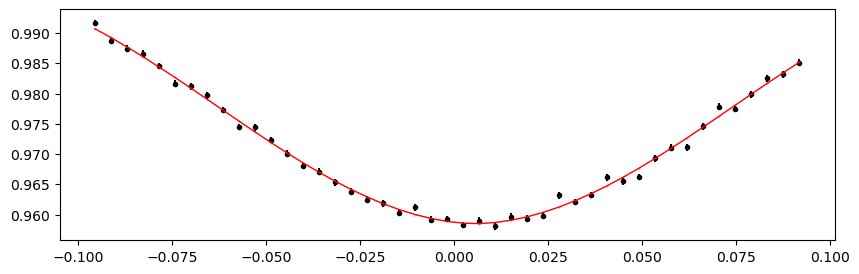

3172.5307278 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.24it/s]


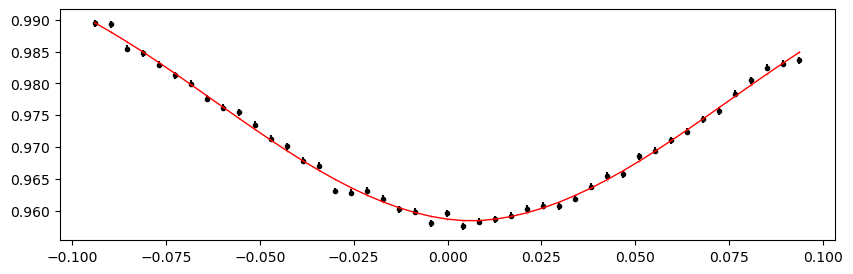

3172.856554 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.20it/s]


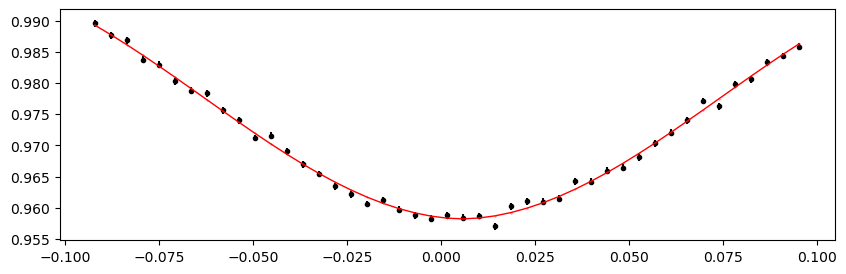

3173.1823802 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.44it/s]


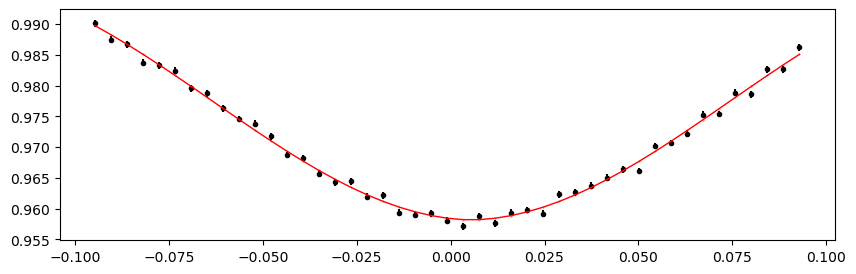

3173.5082064 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.35it/s]


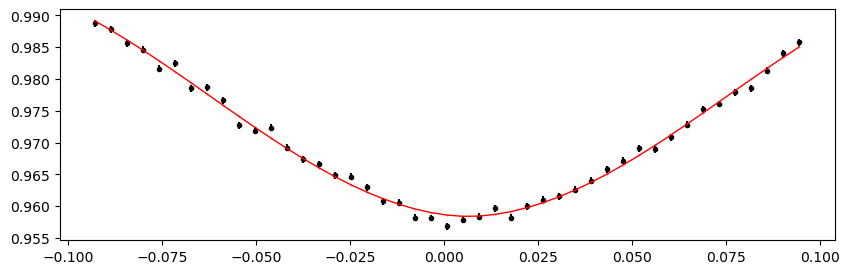

3173.8340326 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.44it/s]


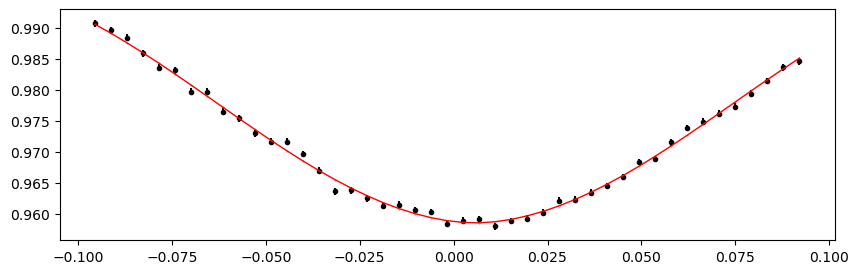

3174.1598588 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.69it/s]


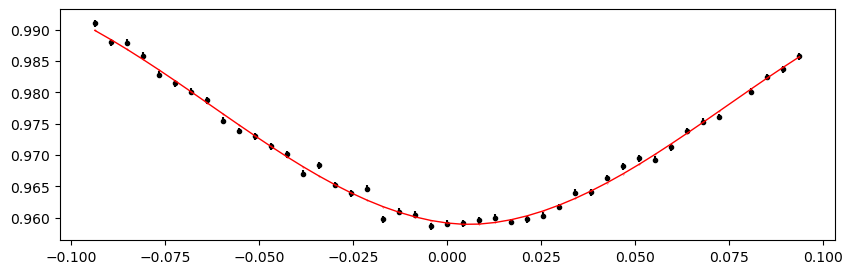

3174.485685 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.80it/s]


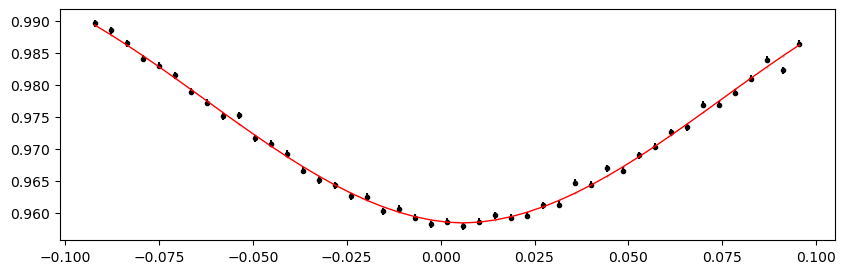

3174.8115112 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.06it/s]


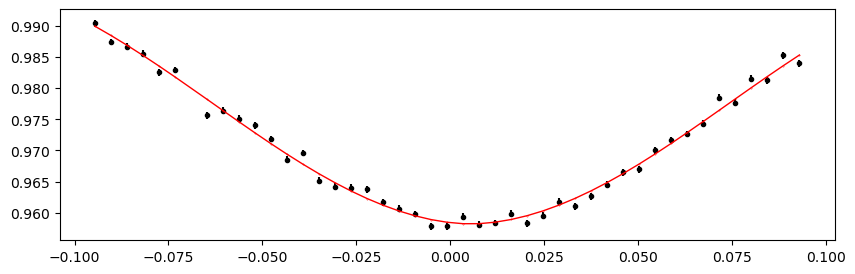

3175.4631636000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.73it/s]


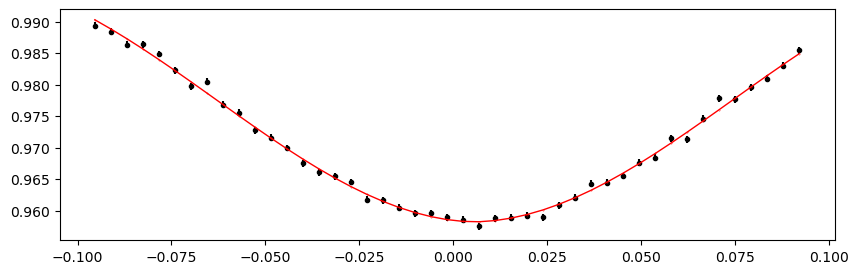

3175.7889898000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.36it/s]


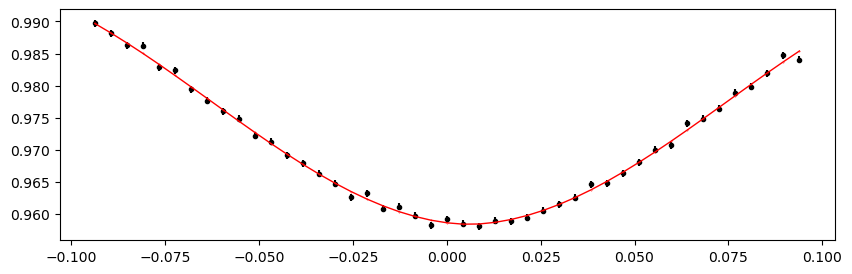

3176.1148160000002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.88it/s]


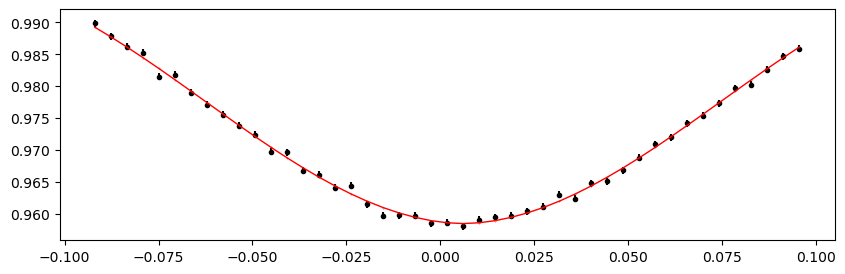

3176.4406422 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.63it/s]


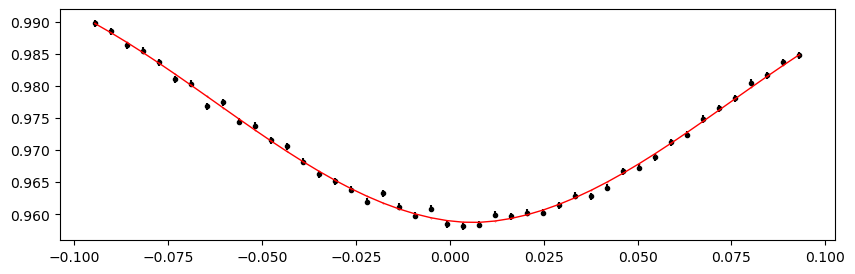

3176.7664684 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.00it/s]


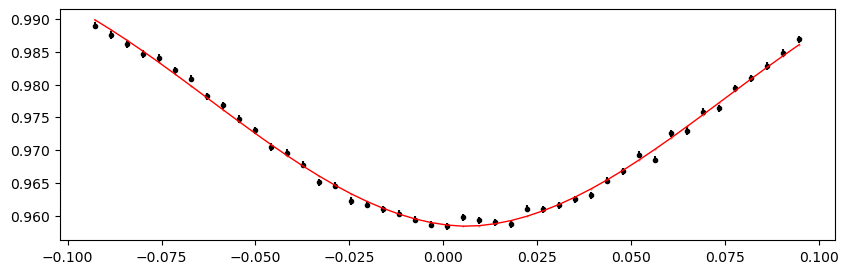

3177.0922946 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.80it/s]


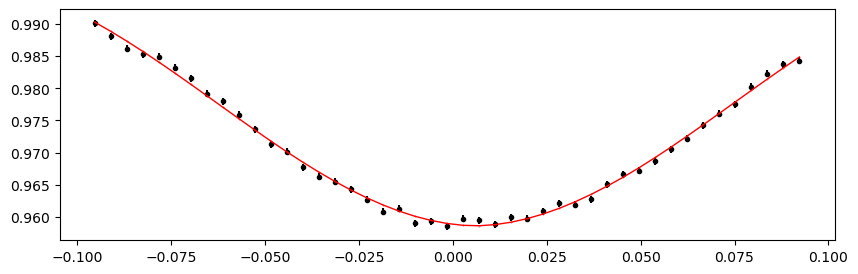

3177.4181208 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.03it/s]


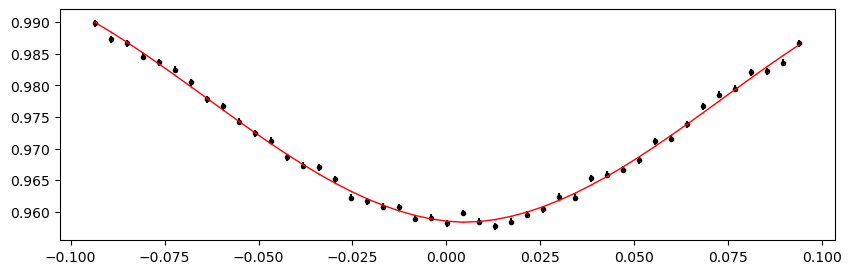

3177.743947 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.21it/s]


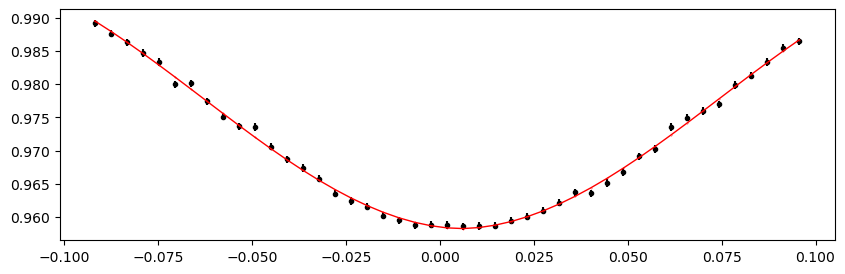

3178.0697732 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.84it/s]


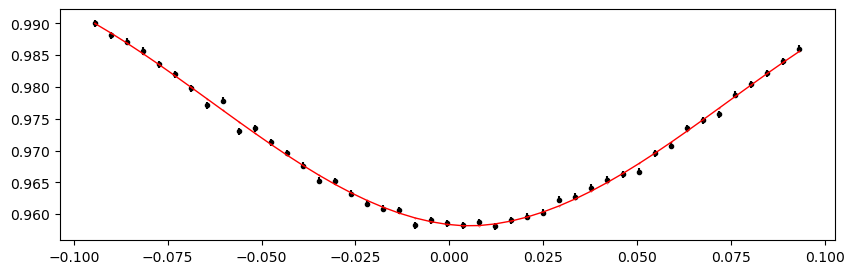

3178.3955994 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.09it/s]


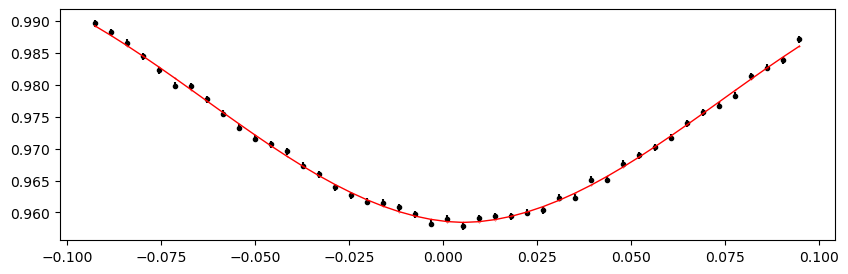

3178.7214255999997 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.30it/s]


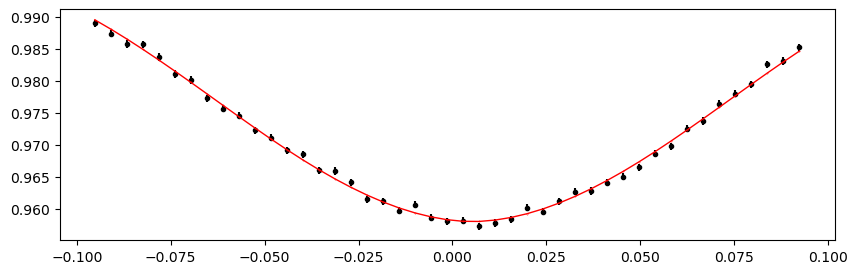

3179.0472518 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.72it/s]


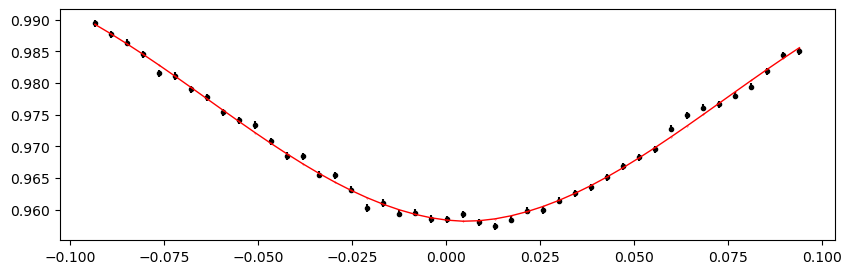

3179.373078 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.89it/s]


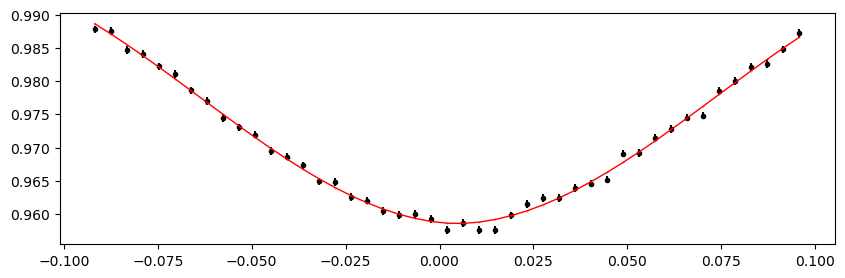

3182.63134 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.23it/s]


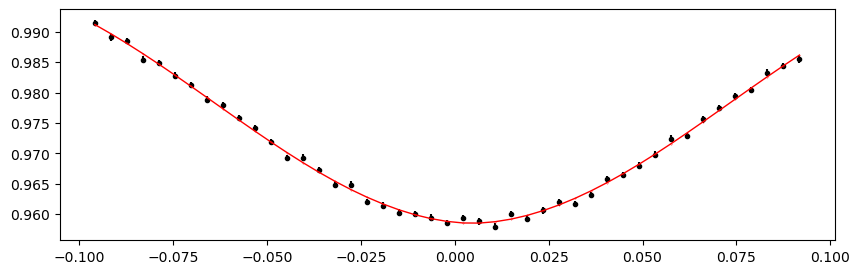

3182.9571662 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.93it/s]


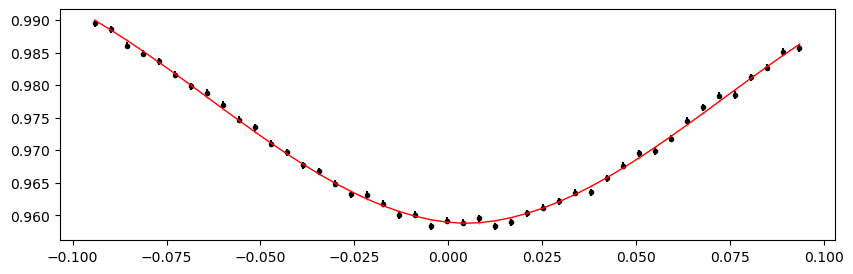

Time 3183.2829924 does not have enough data points: 19
3183.6088186 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.73it/s]


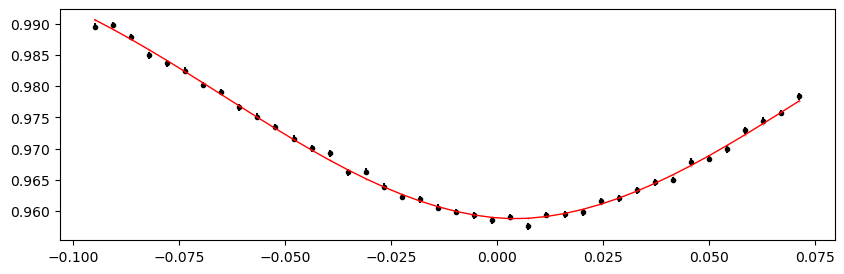

3183.9346448 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.32it/s]


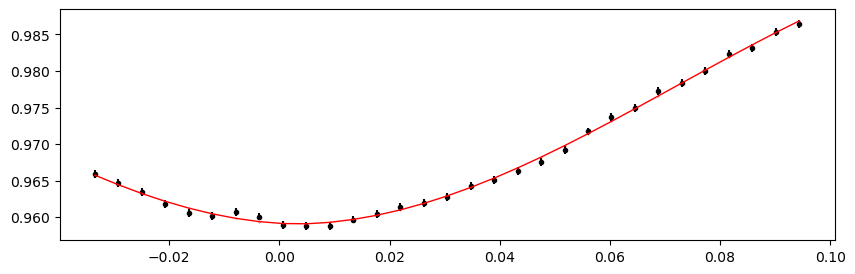

3184.260471 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.58it/s]


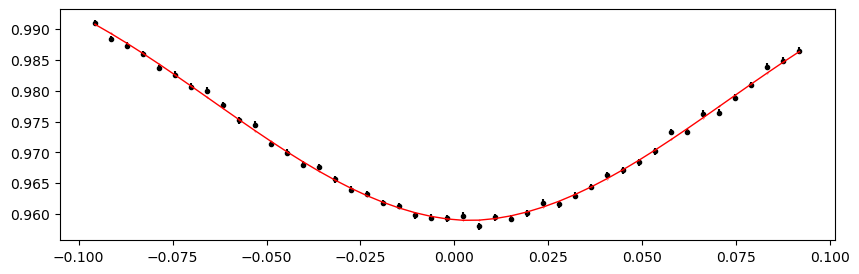

3184.5862972 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.82it/s]


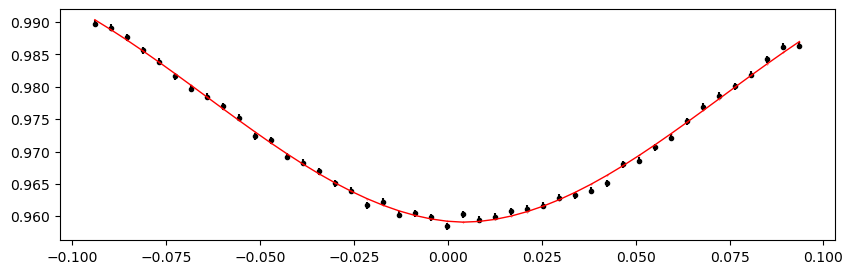

3184.9121234000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.84it/s]


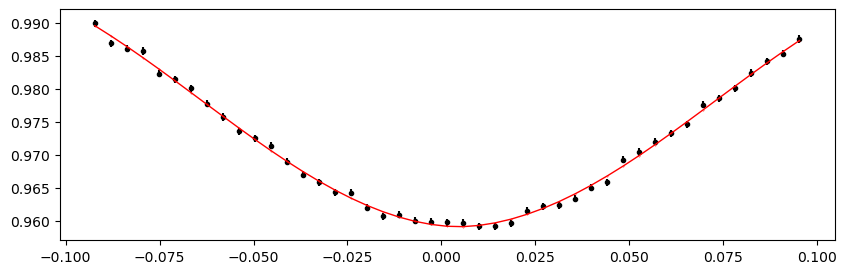

3185.2379496000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.39it/s]


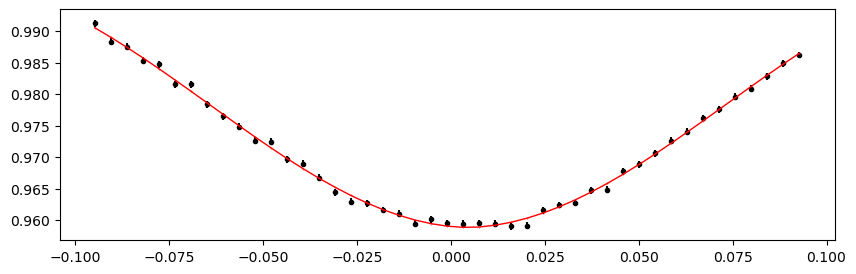

3185.5637758000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.96it/s]


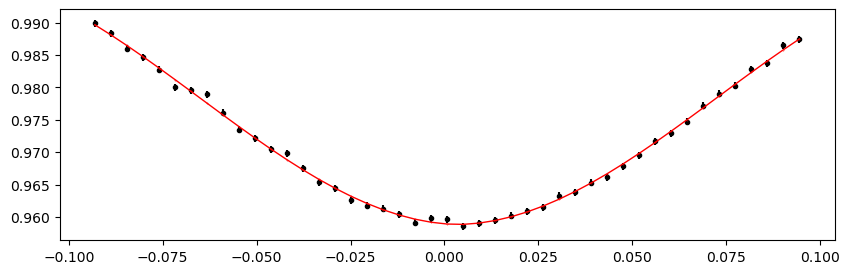

3185.889602 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.19it/s]


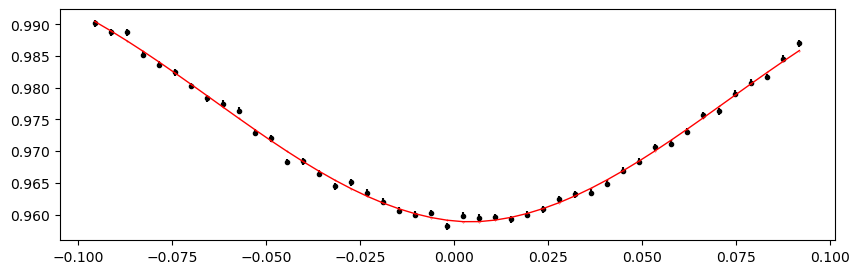

3186.2154282 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.56it/s]


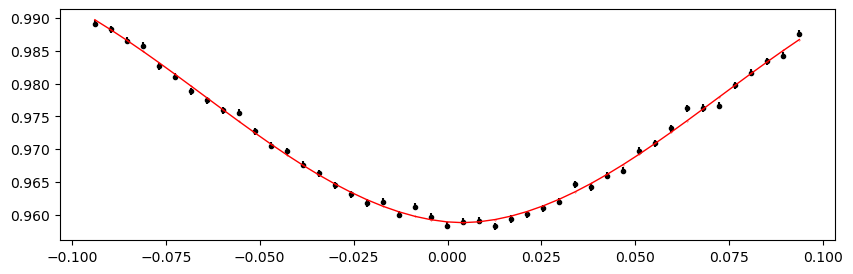

3186.5412544 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.24it/s]


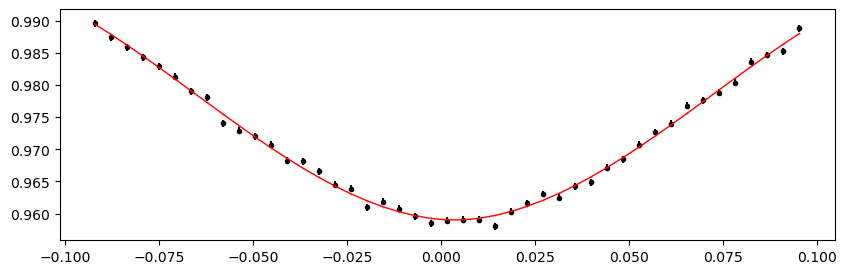

3186.8670806 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.01it/s]


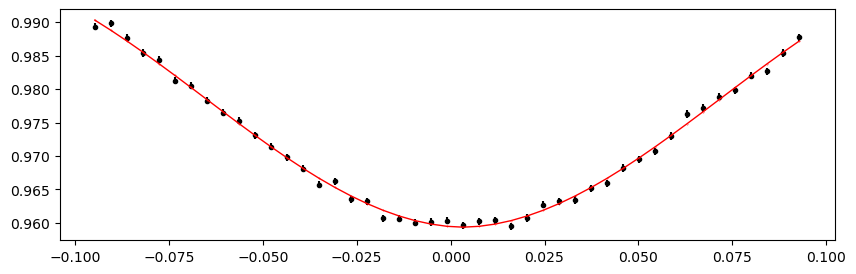

3187.1929068 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.28it/s]


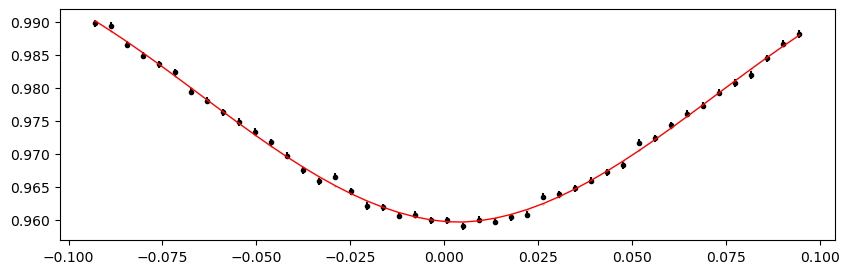

3187.518733 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.83it/s]


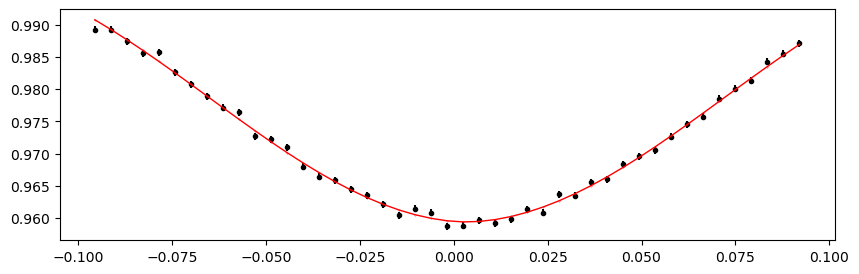

3187.8445592 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.54it/s]


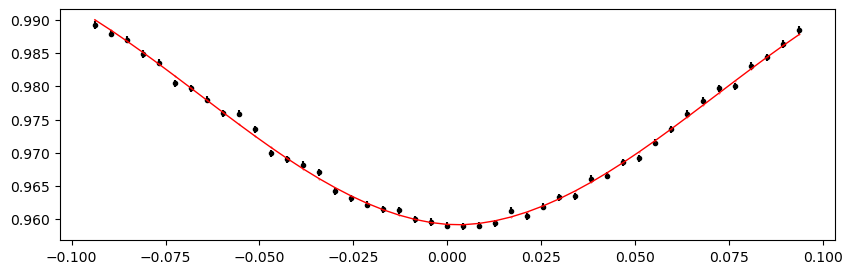

3188.1703853999998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.30it/s]


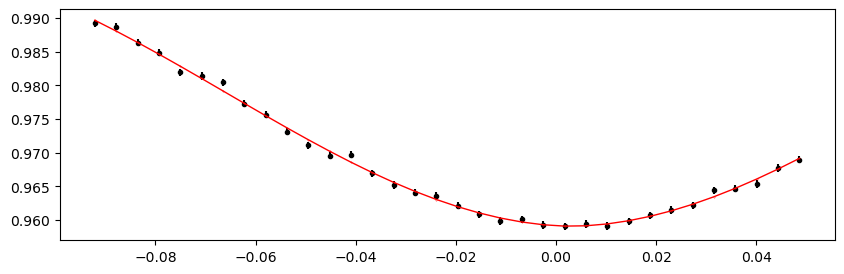

3188.4962116 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.44it/s]


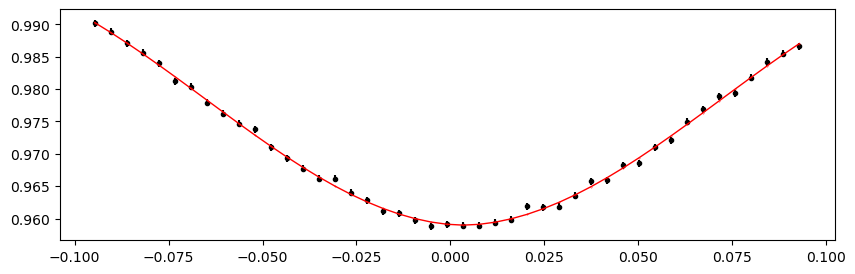

3188.8220378 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.77it/s]


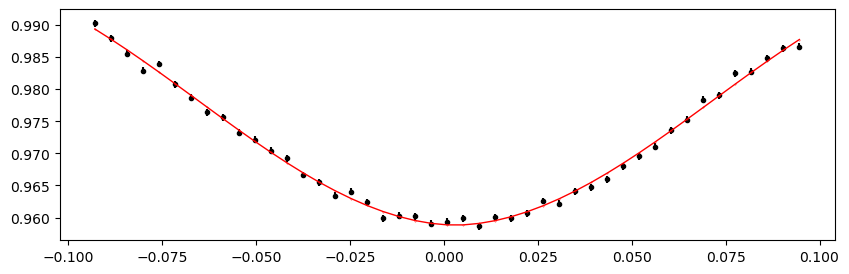

3189.147864 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.22it/s]


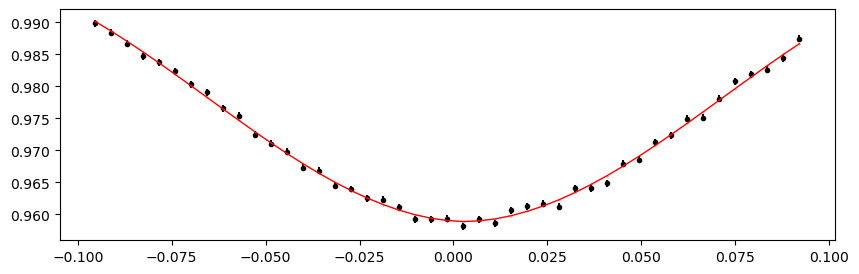

3189.4736902000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.59it/s]


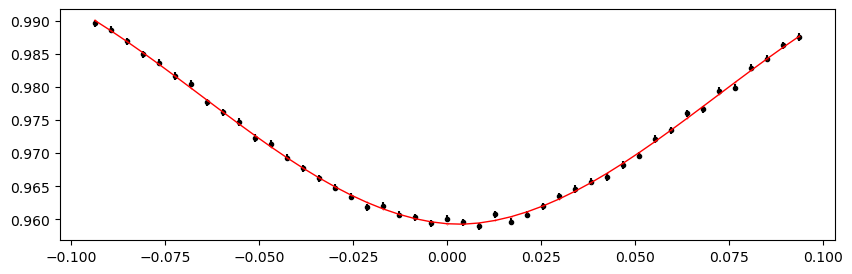

3189.7995164000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.81it/s]


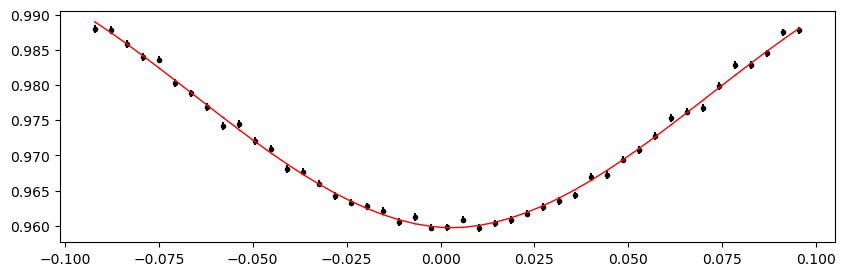

3190.1253426000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.29it/s]


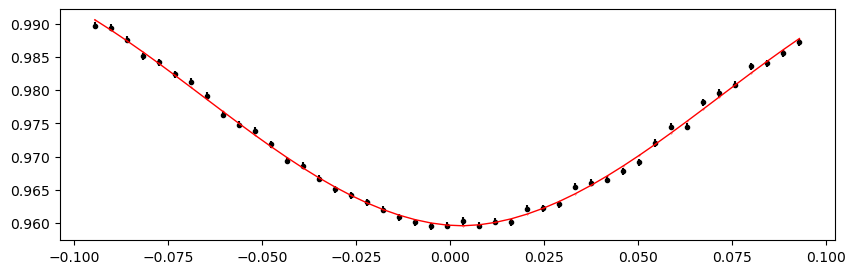

3190.4511688000002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.81it/s]


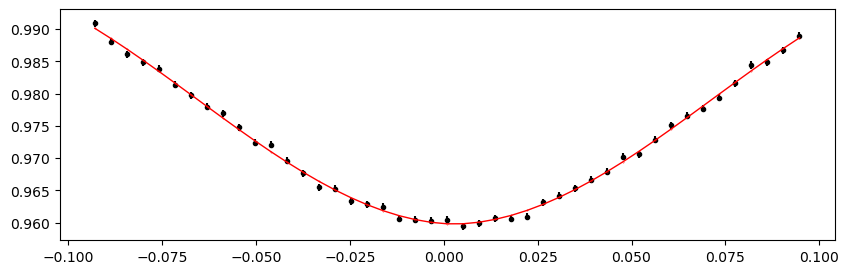

3190.776995 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.96it/s]


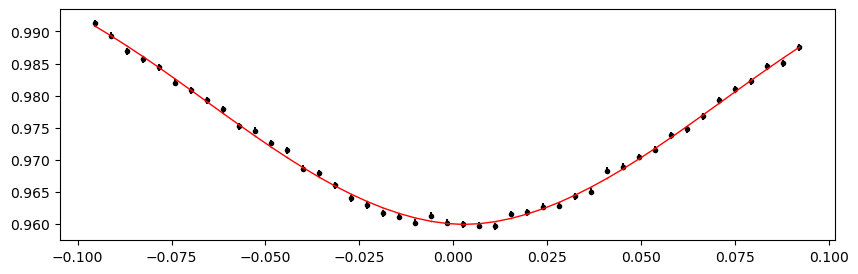

3191.1028212 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.92it/s]


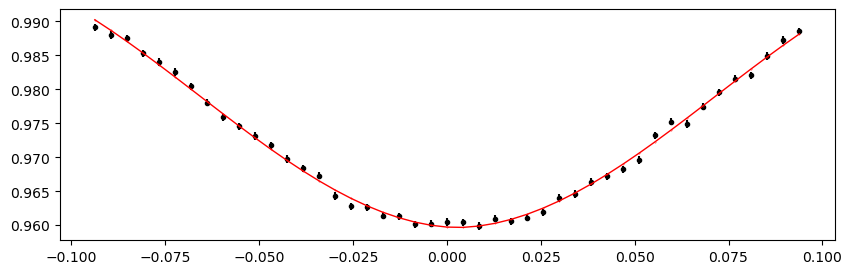

3191.4286474 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.57it/s]


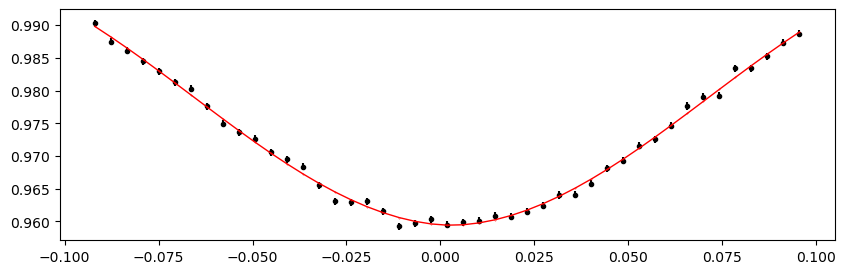

3191.7544736 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.63it/s]


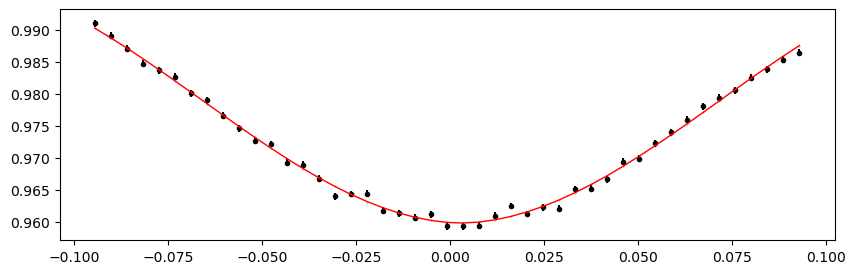

3192.0802998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.07it/s]


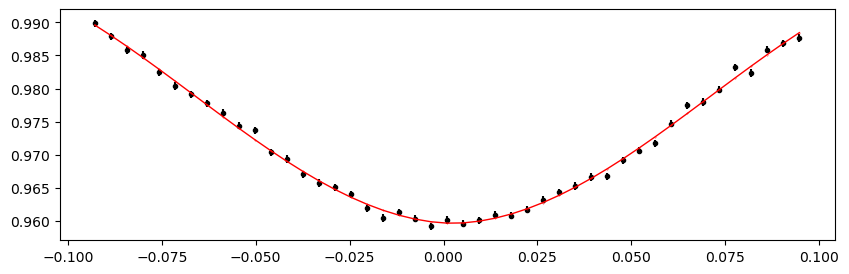

3192.406126 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.31it/s]


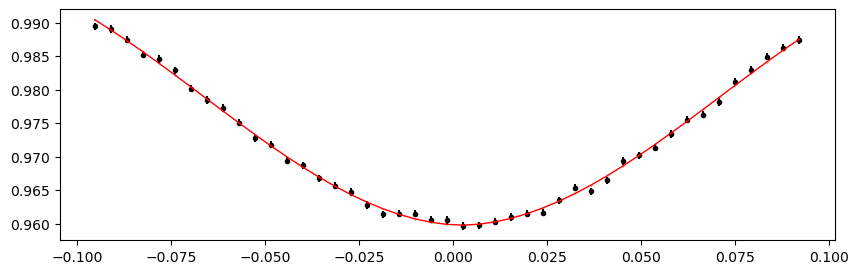

3192.7319522 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.15it/s]


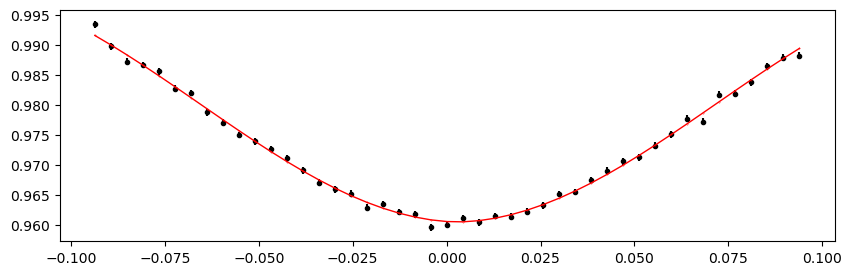

3193.0577784 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.92it/s]


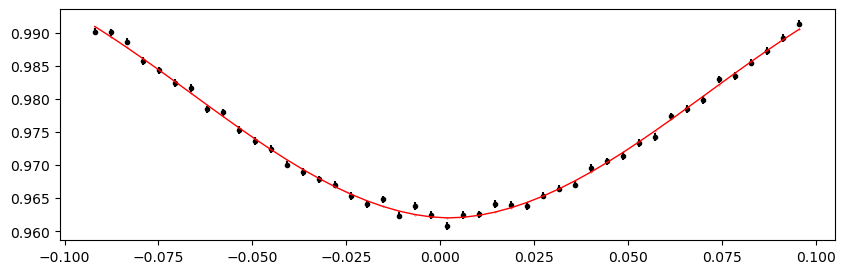

3195.664388 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.22it/s]


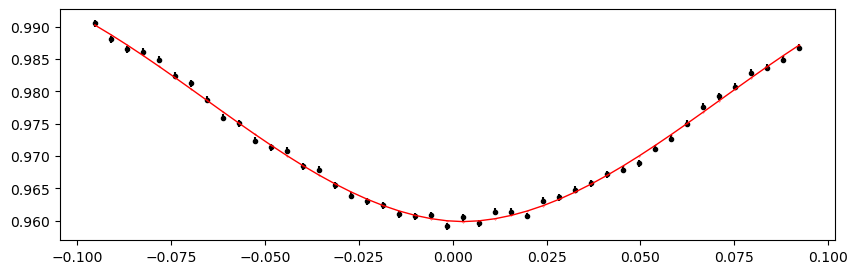

3195.9902142 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.98it/s]


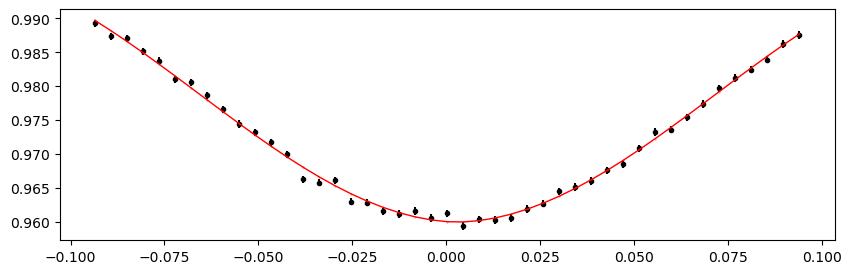

3196.3160404 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.32it/s]


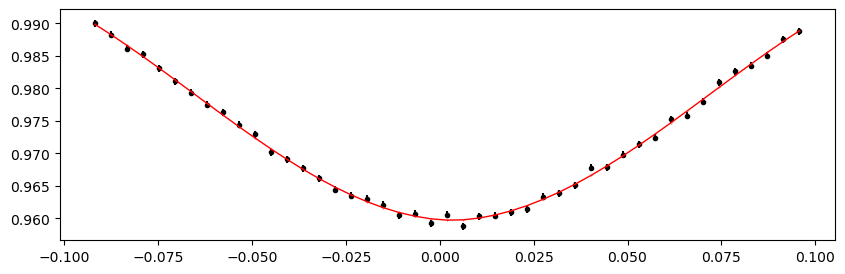

3196.6418666 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.88it/s]


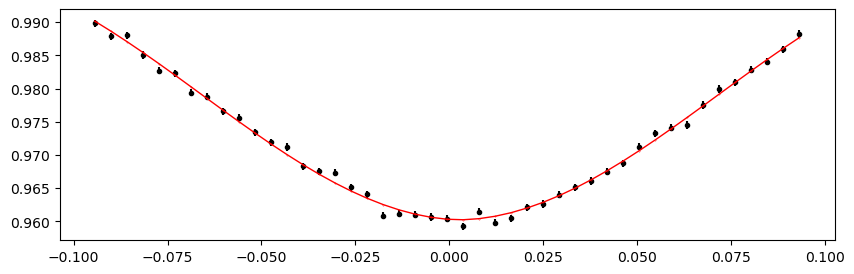

3196.9676928 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.49it/s]


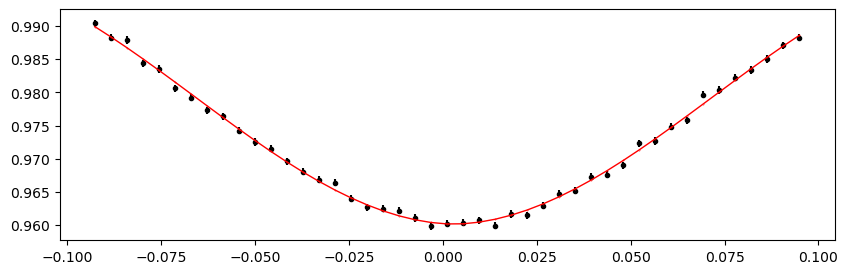

3197.293519 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.67it/s]


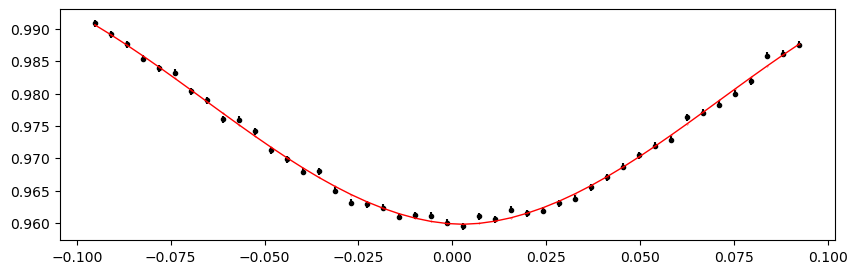

3197.6193451999998 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.97it/s]


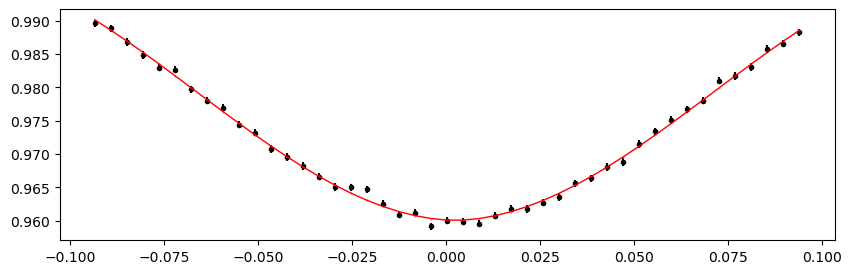

3197.9451714 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.20it/s]


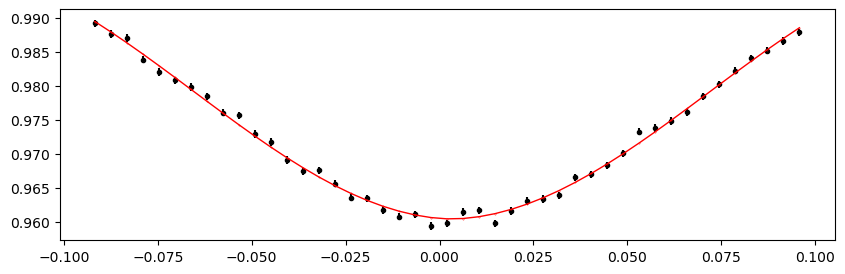

3198.2709976 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.88it/s]


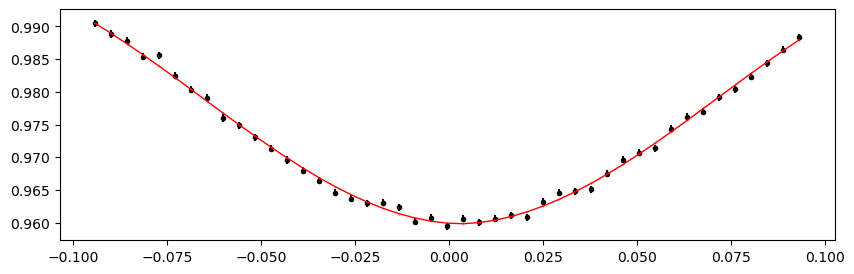

3198.5968238 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.62it/s]


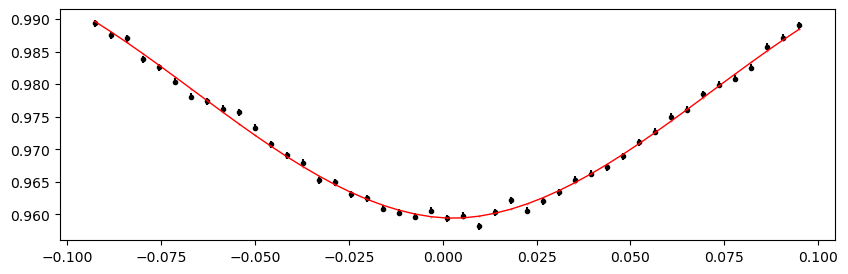

3198.92265 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.04it/s]


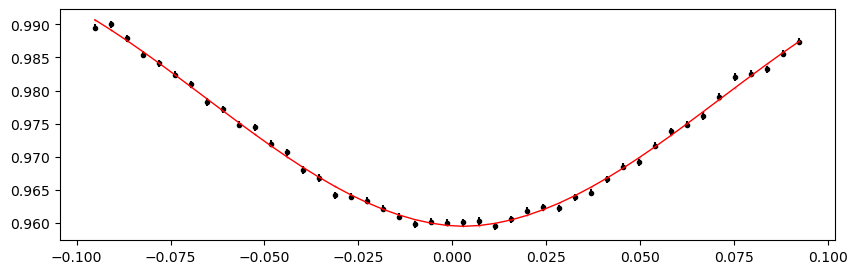

3199.2484762000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.18it/s]


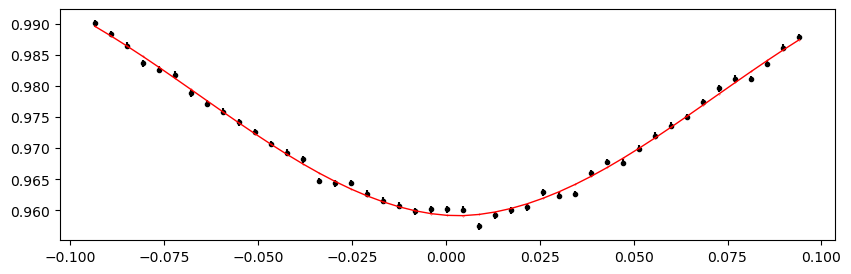

3199.5743024000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.29it/s]


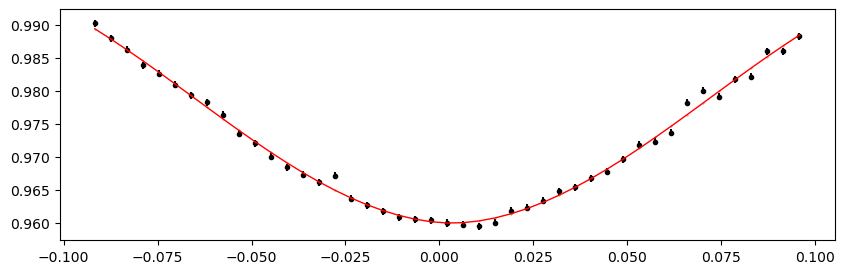

3199.9001286000002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.04it/s]


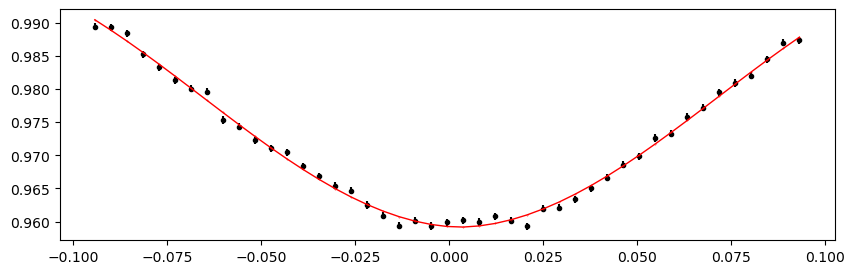

3200.2259548 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.72it/s]


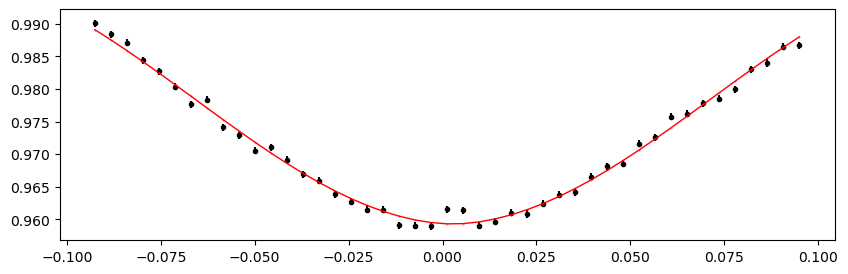

3200.551781 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.31it/s]


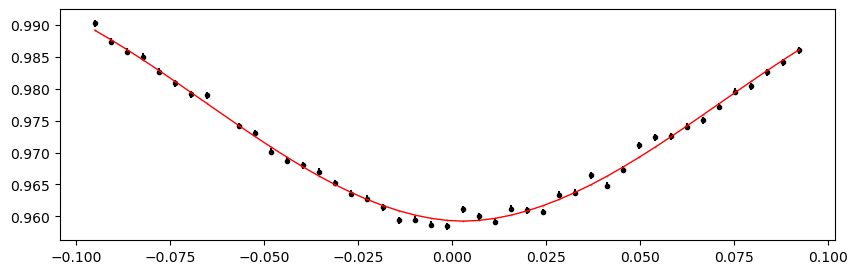

3200.8776072 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.42it/s]


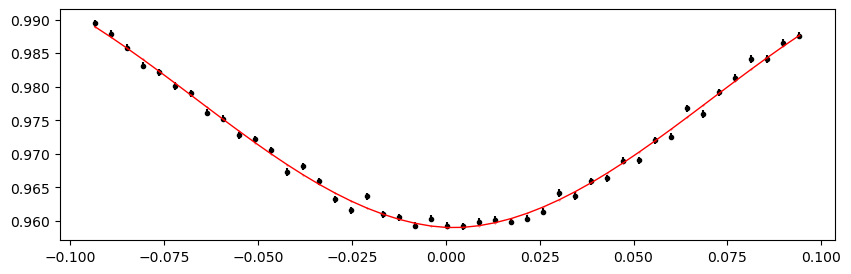

3201.2034334 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.03it/s]


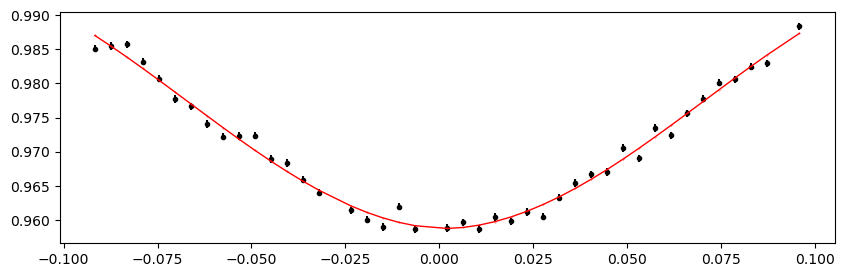

Time 3201.5292596 does not have enough data points: 13
3201.8550858 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.67it/s]


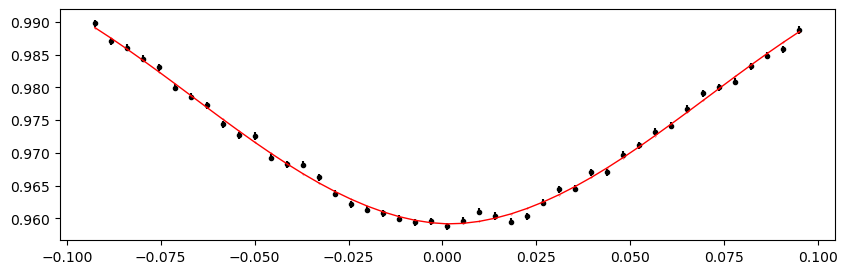

3202.180912 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.19it/s]


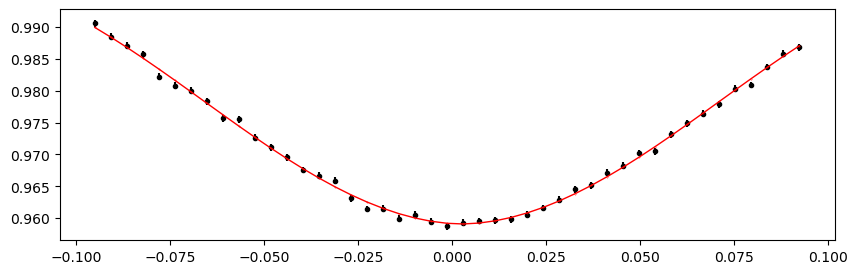

3202.5067381999997 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.11it/s]


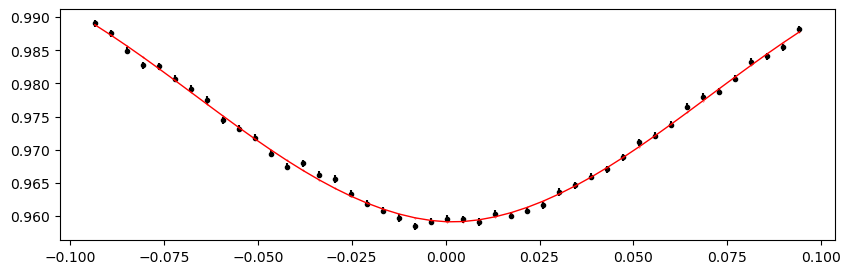

3202.8325644 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.35it/s]


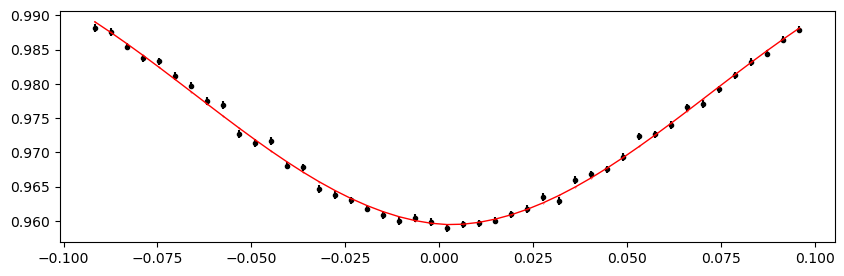

3203.1583906 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.32it/s]


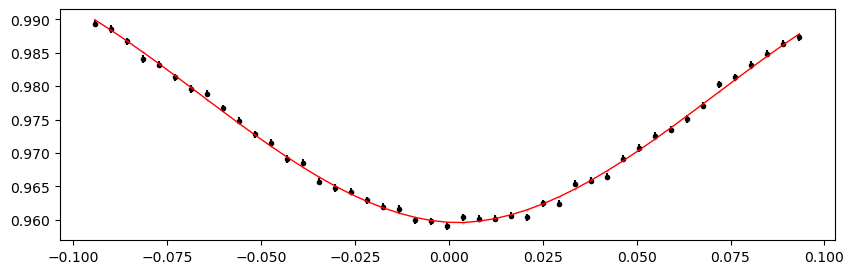

3203.4842168 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.12it/s]


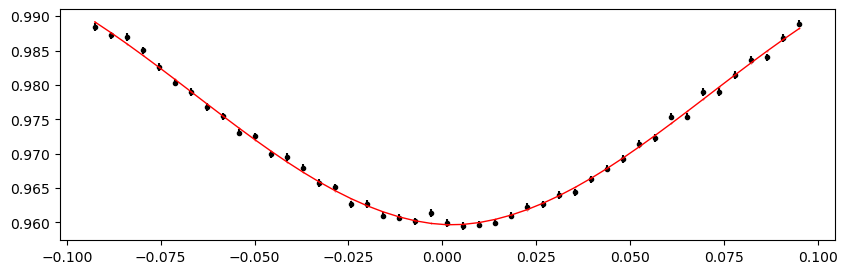

3203.8100430000004 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.31it/s]


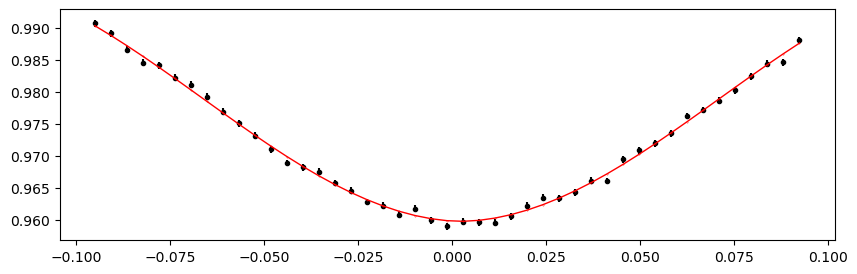

3204.1358692000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.95it/s]


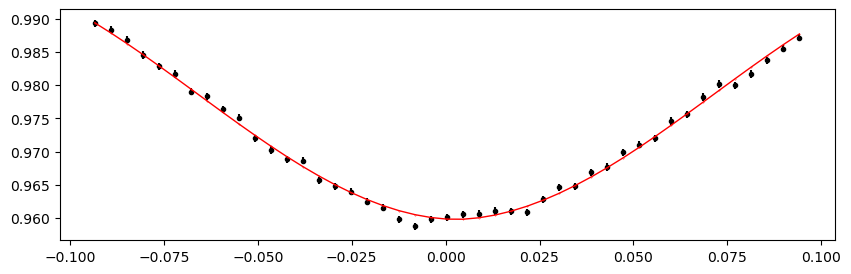

3204.4616954000003 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.68it/s]


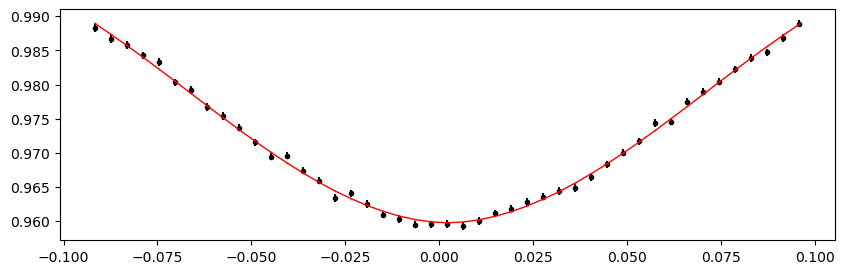

3204.7875216 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.29it/s]


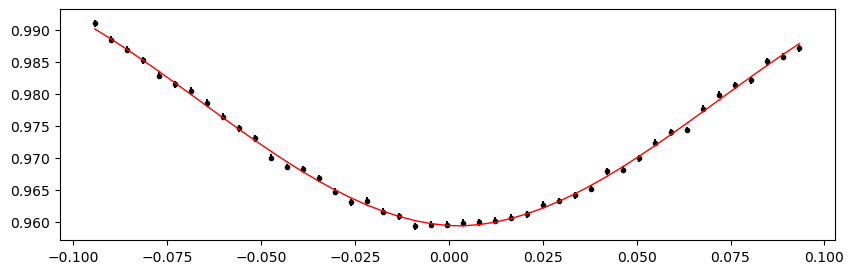

3205.1133478 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.21it/s]


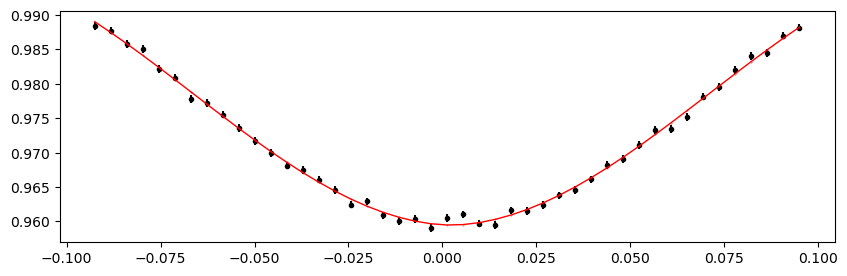

3205.439174 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.37it/s]


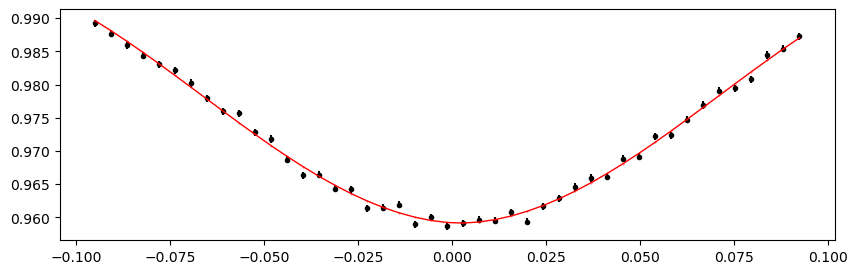

3205.7650002 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.84it/s]


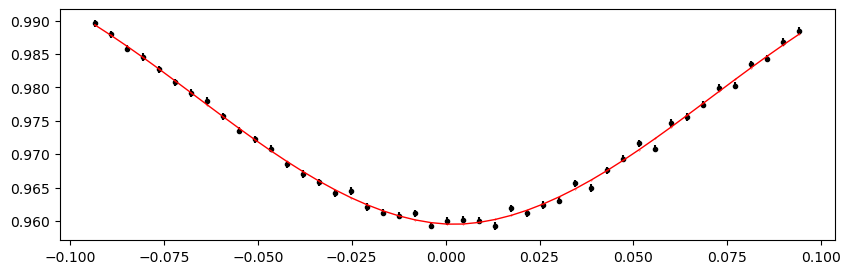

3206.0908264 1.0020984591218385 -0.04208716625153656 0.18149794185922002


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.76it/s]


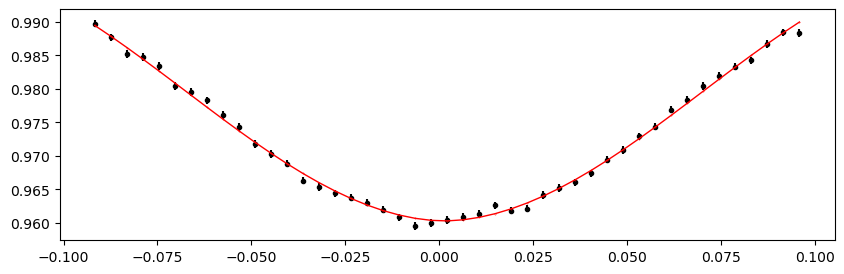

In [33]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=20, 
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
1326.2372524000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.23it/s]


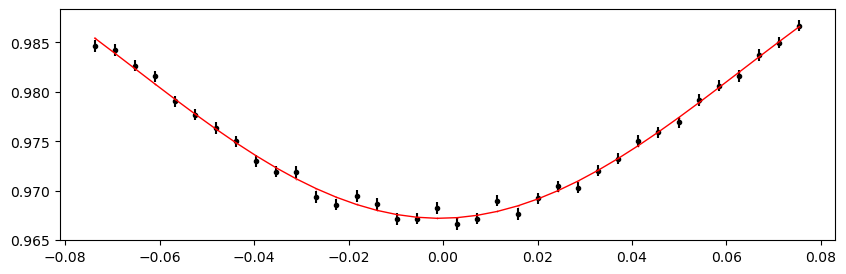

1326.5630786000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.53it/s]


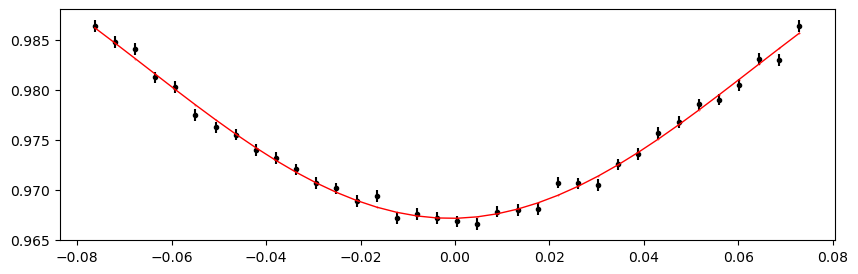

1326.8889048 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.51it/s]


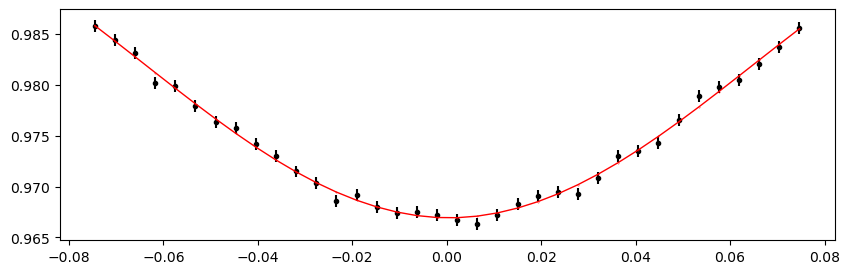

1327.214731 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.29it/s]


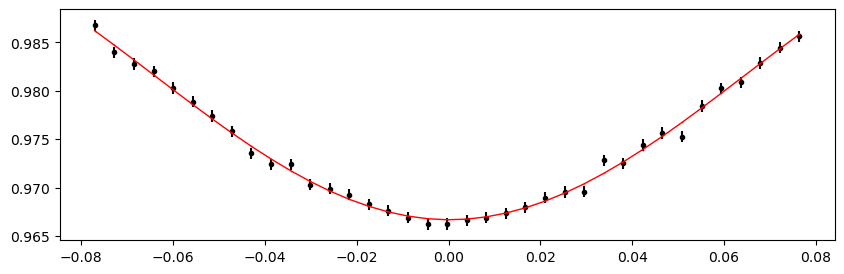

1327.5405572000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.64it/s]


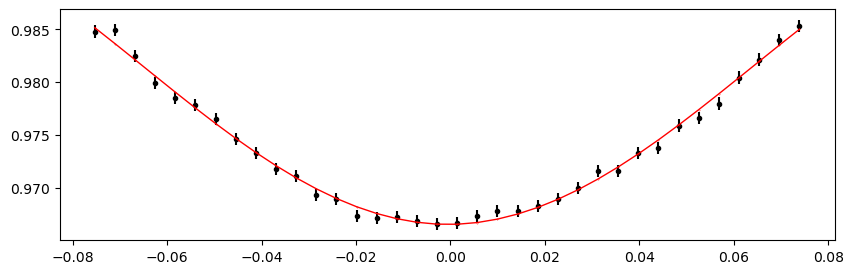

1327.8663834000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.36it/s]


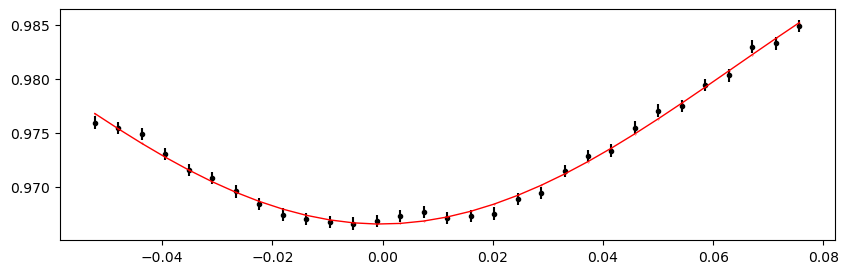

1328.1922096 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.25it/s]


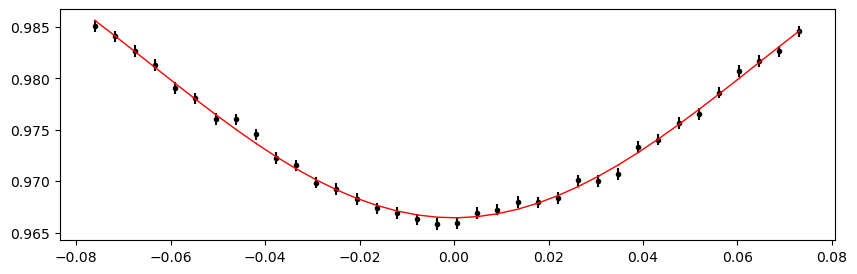

1328.5180358 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.08it/s]


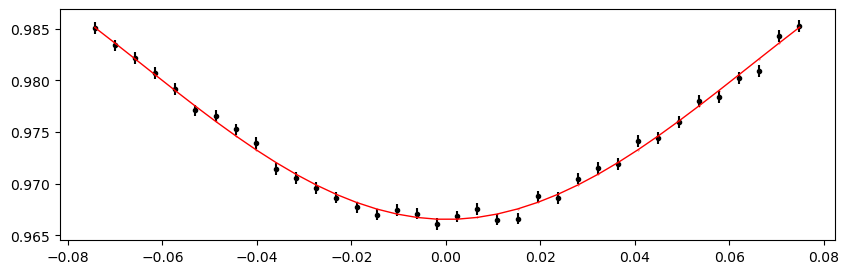

1328.8438620000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.66it/s]


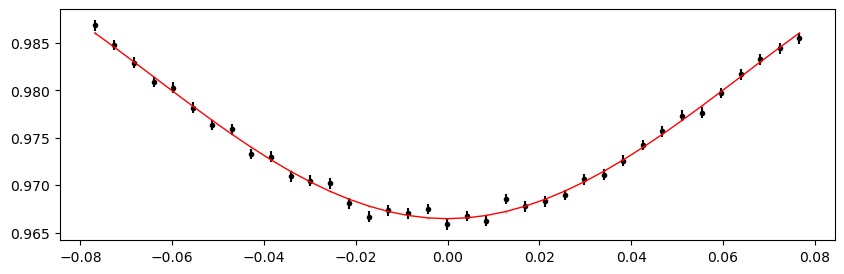

1329.1696882 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.51it/s]


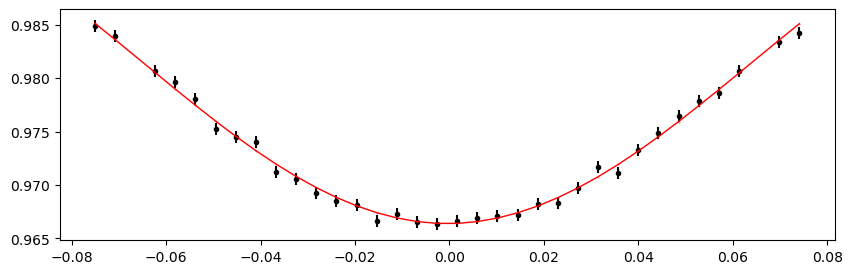

1329.4955144 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.96it/s]


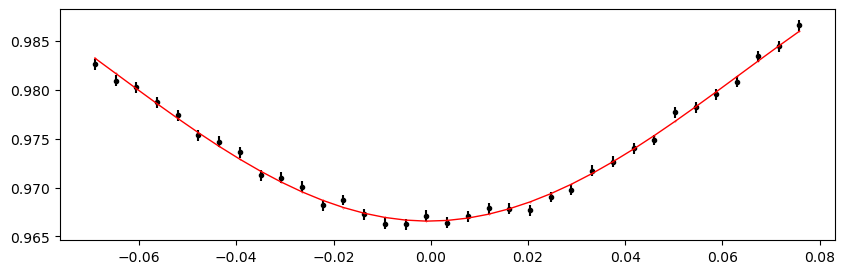

1329.8213406000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.25it/s]


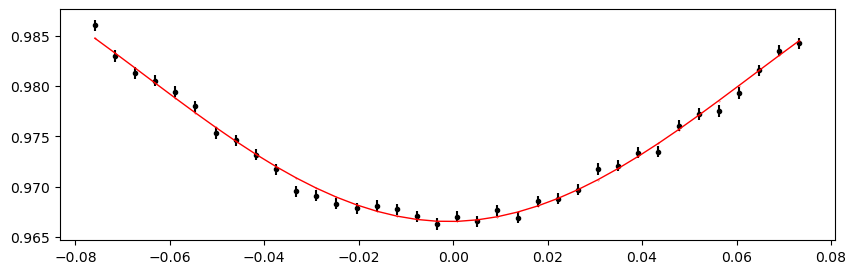

1330.1471668000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.13it/s]


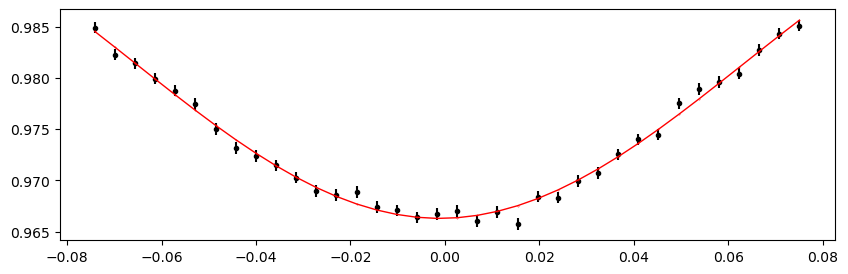

1330.472993 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.46it/s]


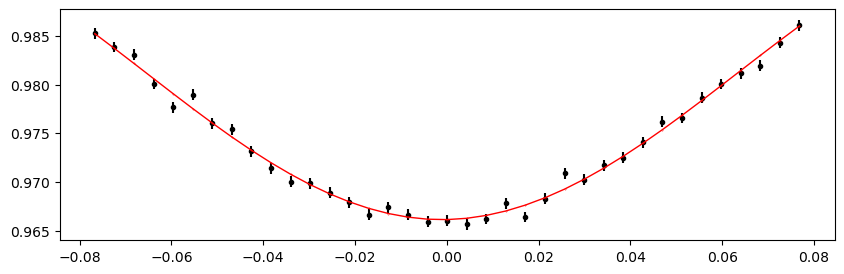

1330.7988192 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.94it/s]


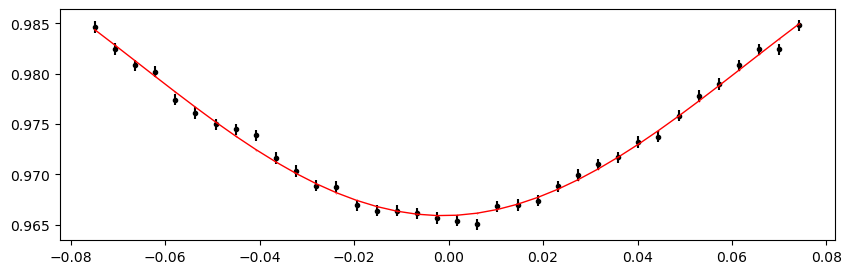

1331.1246454000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.92it/s]


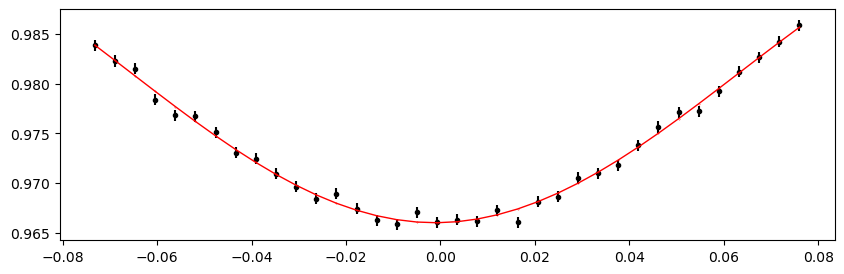

1331.4504716000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.21it/s]


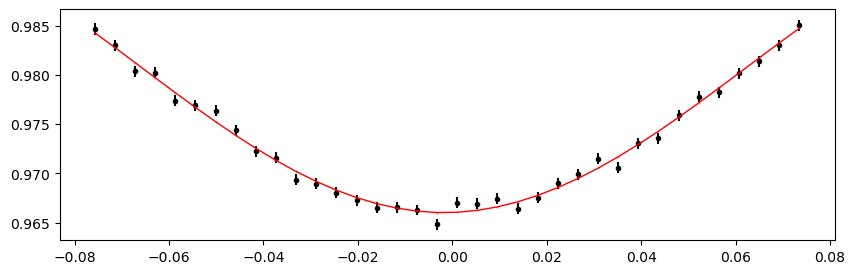

1331.7762978 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.62it/s]


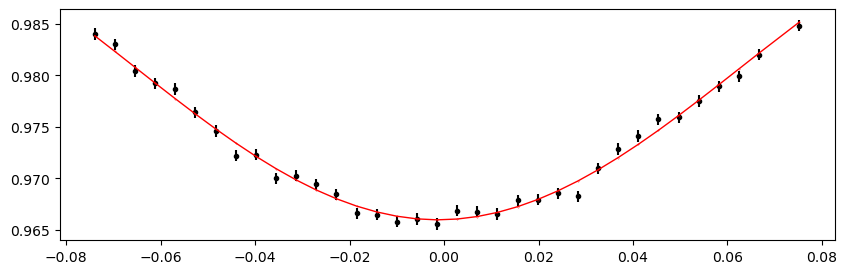

1332.102124 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.14it/s]


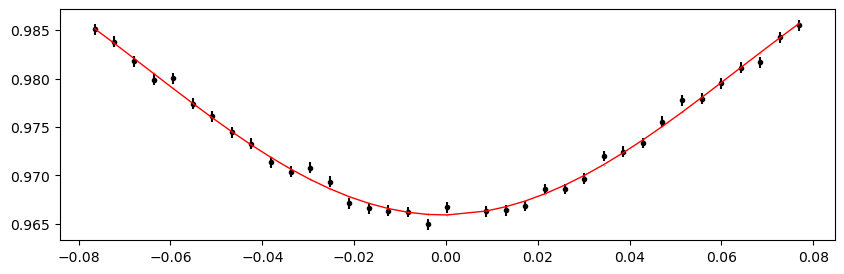

1332.4279502000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.99it/s]


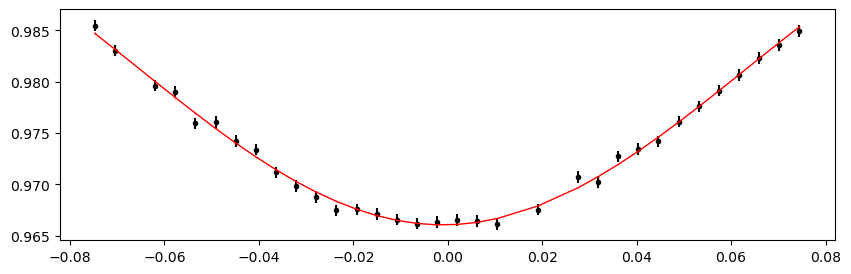

1332.7537764 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.62it/s]


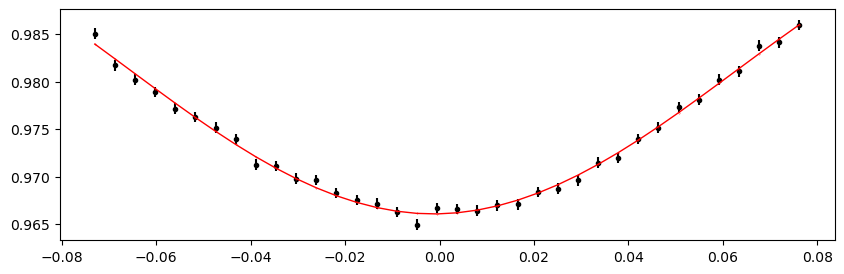

1333.0796026 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.16it/s]


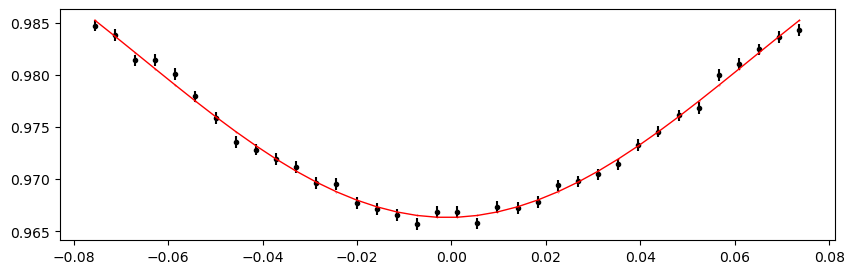

1333.4054288000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.34it/s]


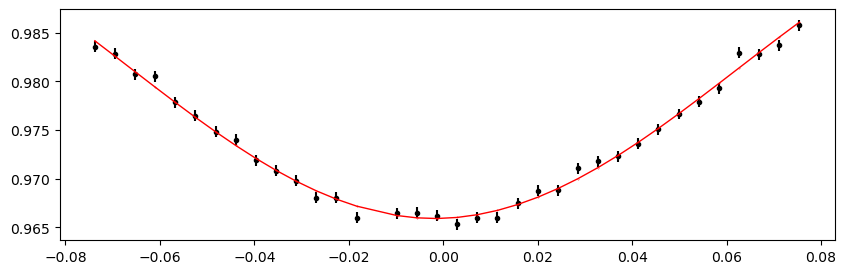

1333.7312550000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.77it/s]


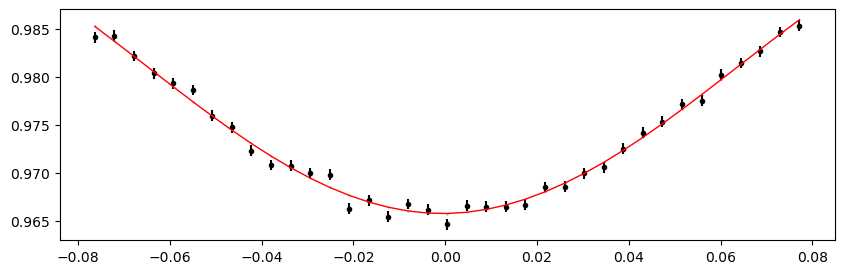

1334.0570812 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.20it/s]


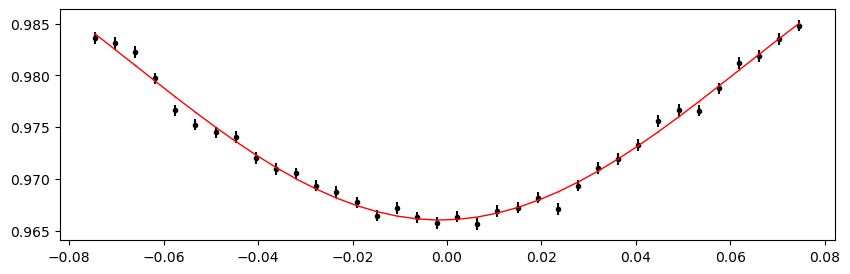

1334.3829074 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.70it/s]


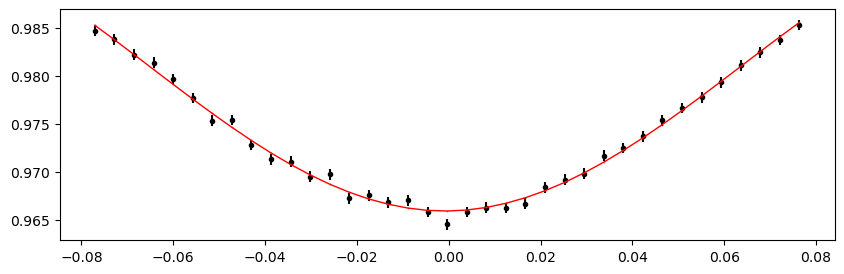

1334.7087336000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.11it/s]


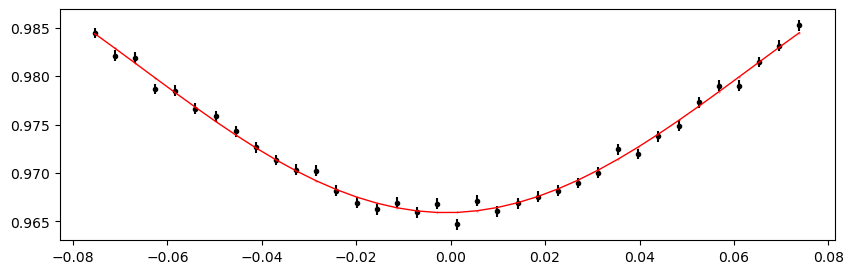

1335.0345598000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.78it/s]


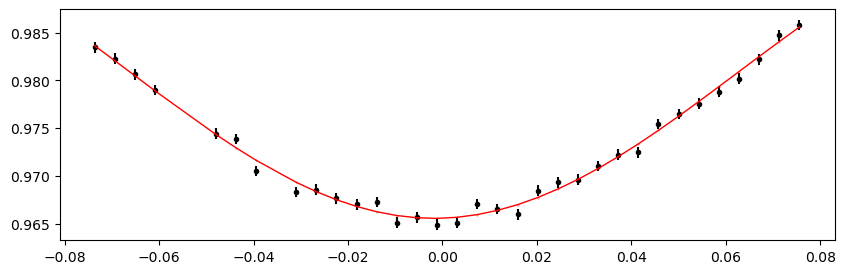

1335.360386 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.53it/s]


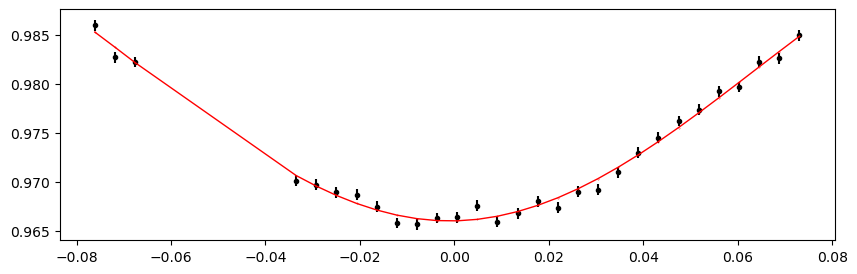

1335.6862122000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.40it/s]


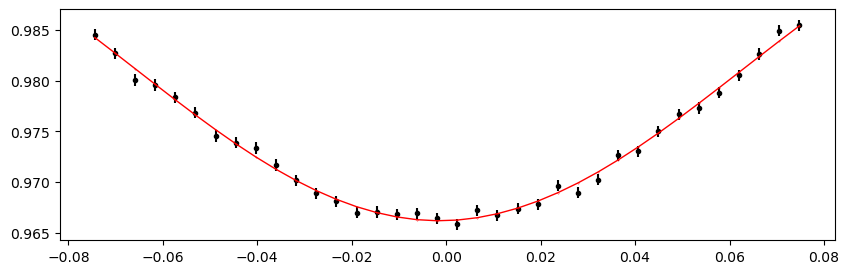

1336.0120384000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.77it/s]


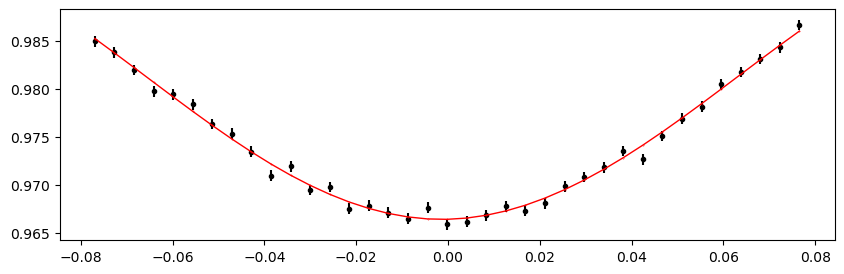

1336.3378646 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.47it/s]


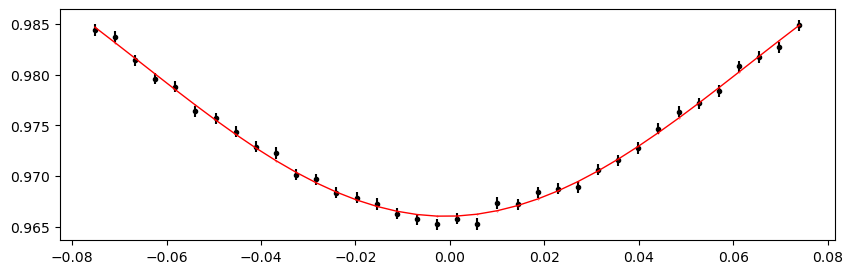

1336.6636908 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.72it/s]


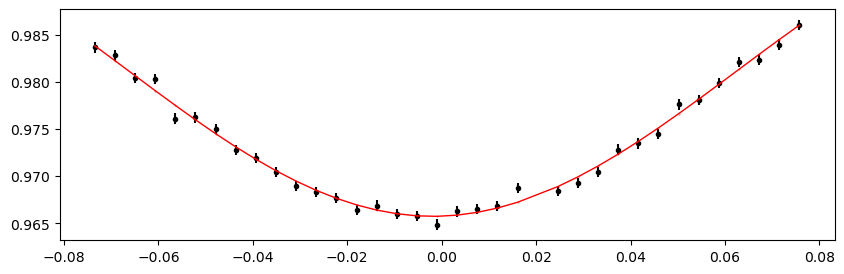

1336.9895170000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.16it/s]


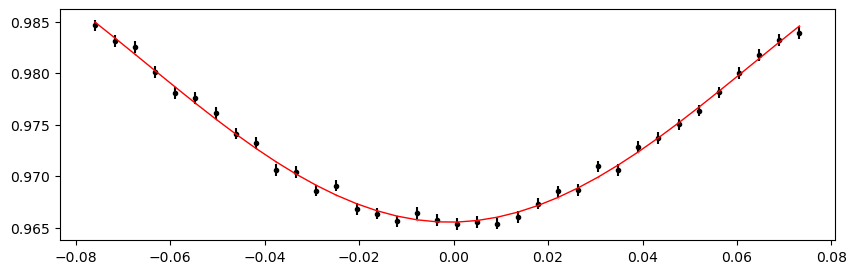

1337.3153432000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.84it/s]


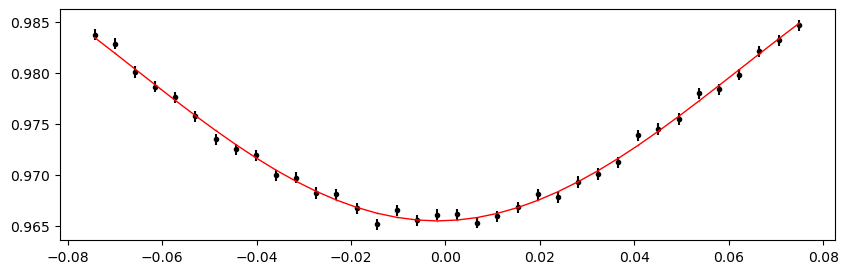

1337.6411694 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.08it/s]


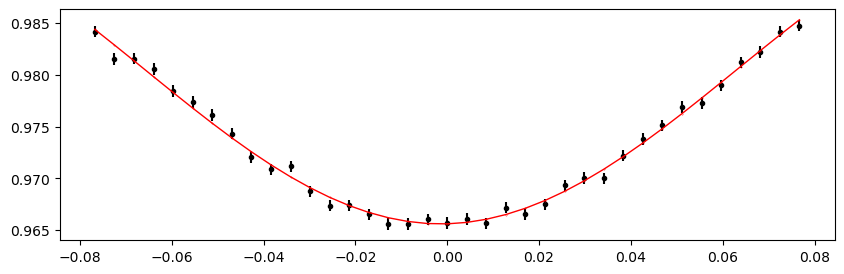

1337.9669956 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.39it/s]


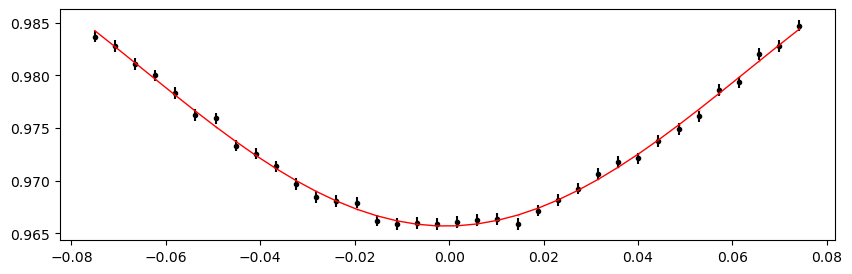

1338.2928218000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.48it/s]


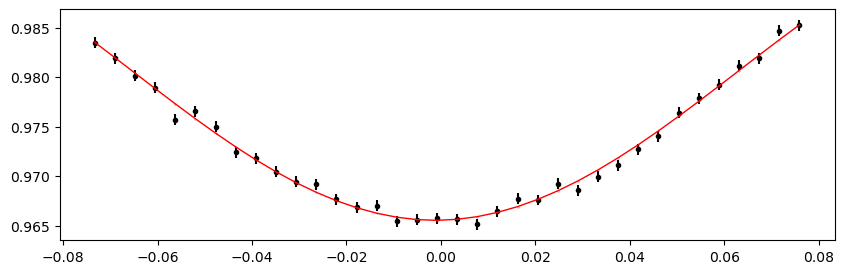

1339.9219528 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.38it/s]


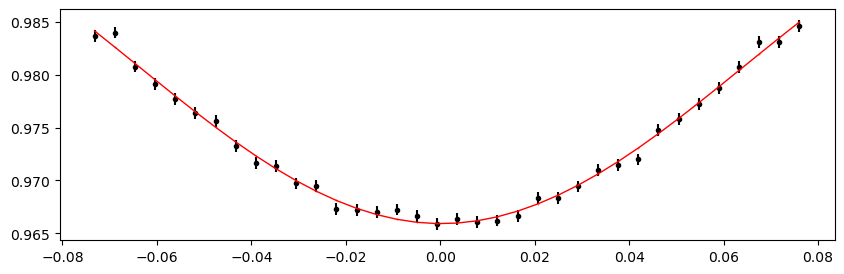

1340.247779 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.11it/s]


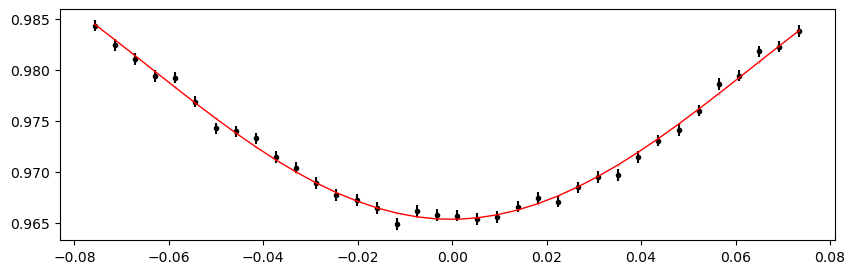

1340.5736052000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.34it/s]


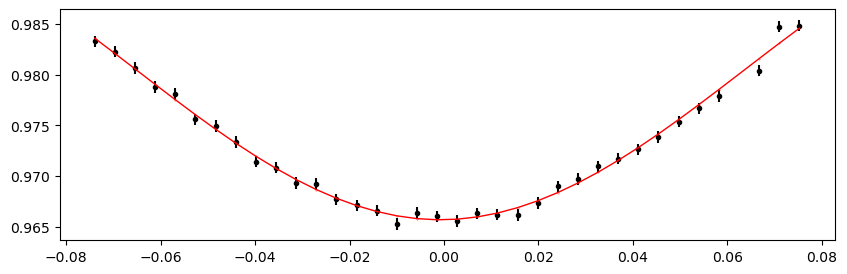

1340.8994314000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.80it/s]


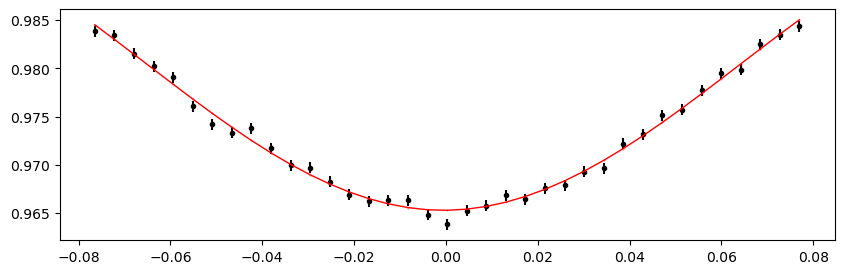

1341.2252576 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.88it/s]


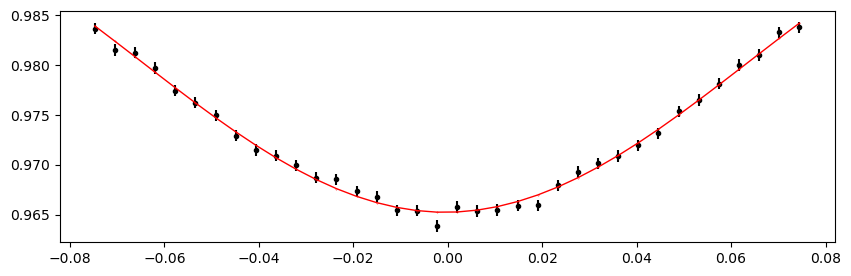

1341.5510838 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.15it/s]


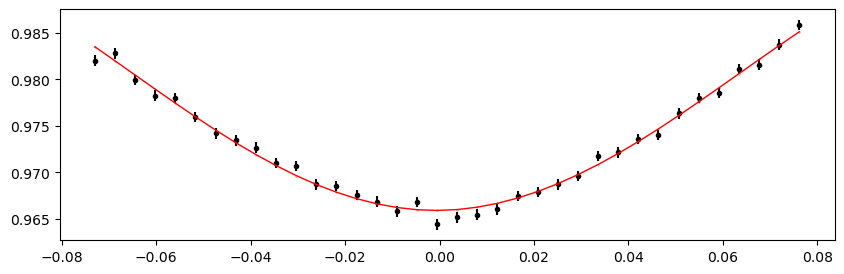

1341.8769100000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.49it/s]


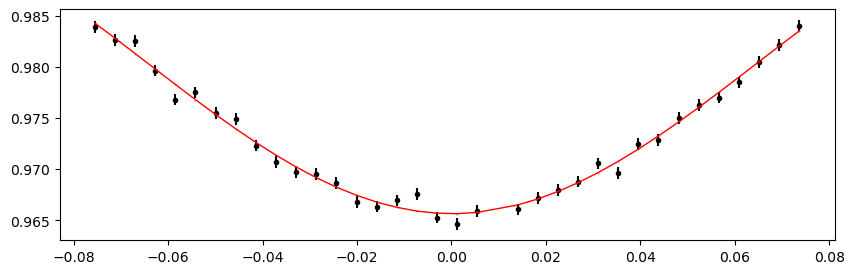

1342.2027362000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.99it/s]


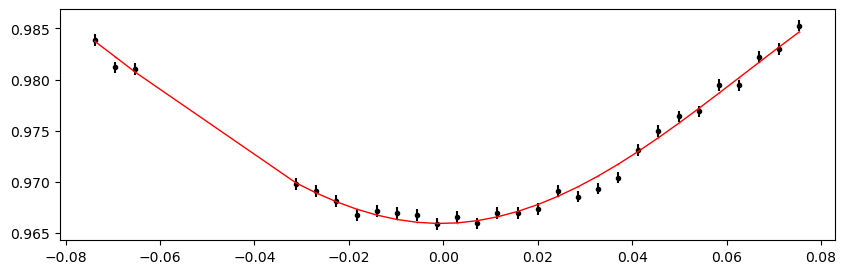

1342.5285624 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.64it/s]


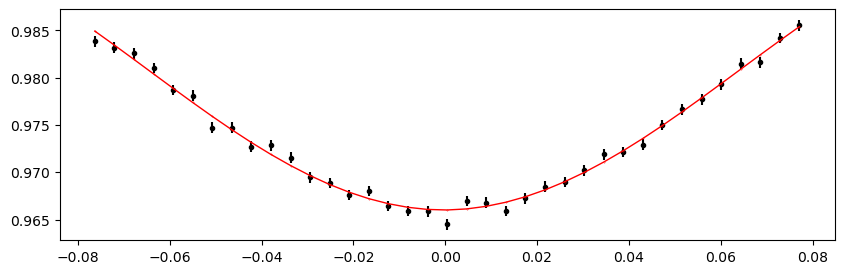

1342.8543886000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.89it/s]


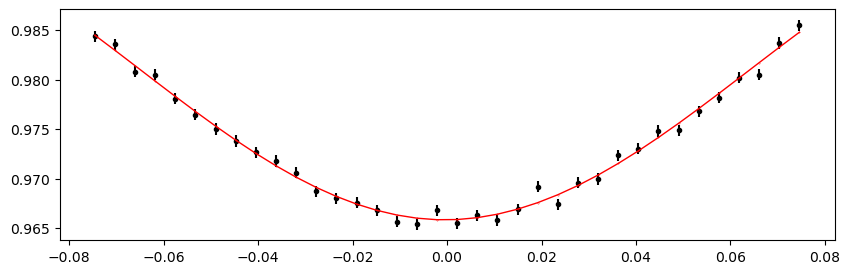

1343.1802148000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.40it/s]


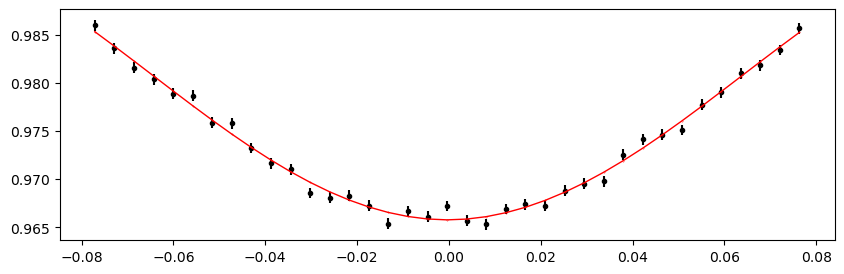

1343.506041 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.77it/s]


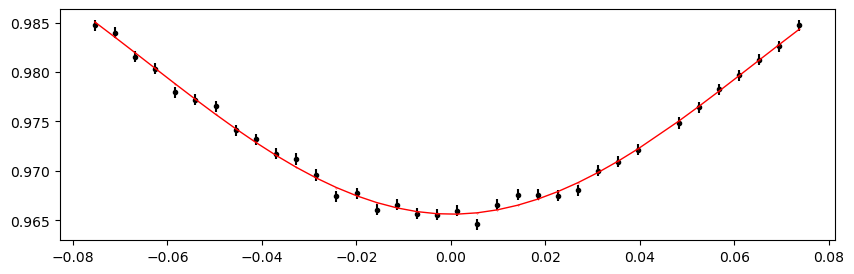

1343.8318672 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.42it/s]


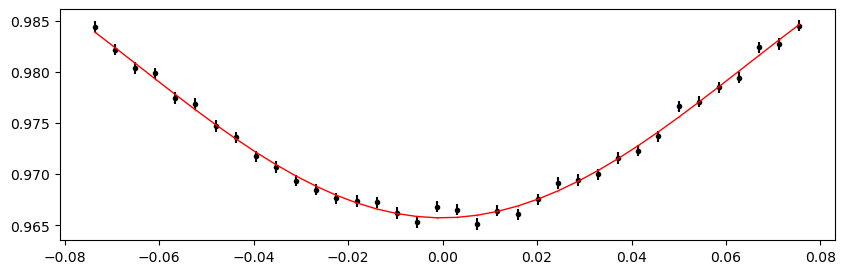

1344.1576934000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.40it/s]


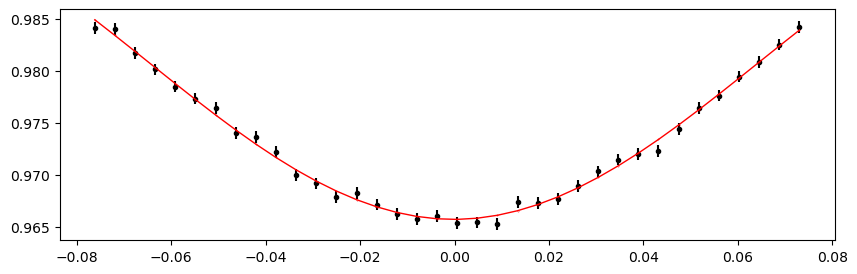

1344.4835196000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.31it/s]


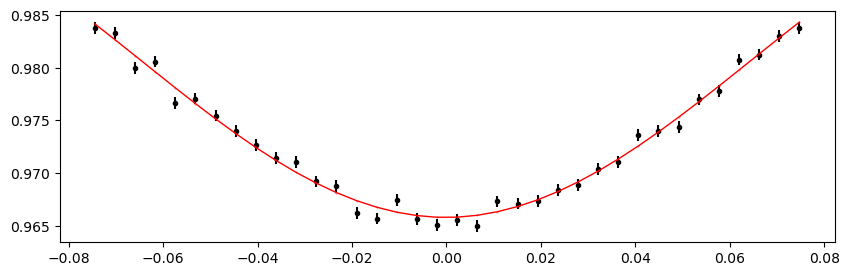

1344.8093458 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.77it/s]


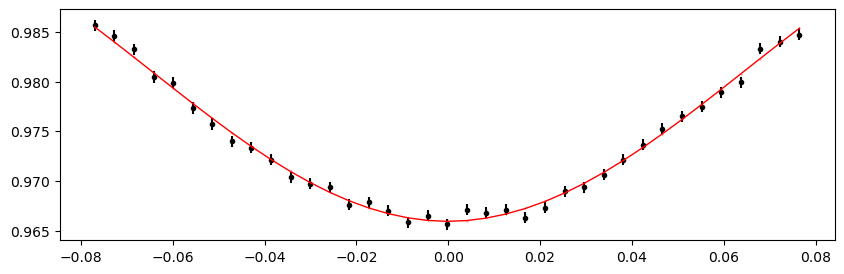

1345.135172 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.79it/s]


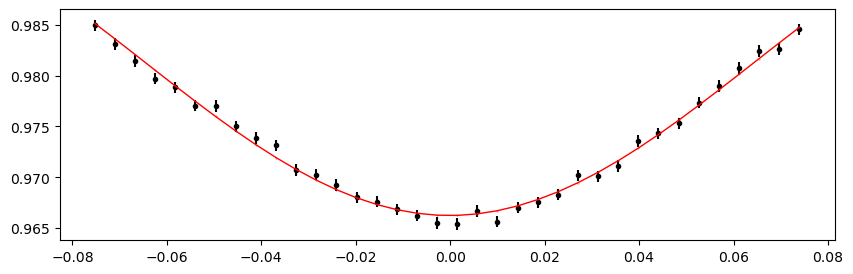

1345.4609982000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.62it/s]


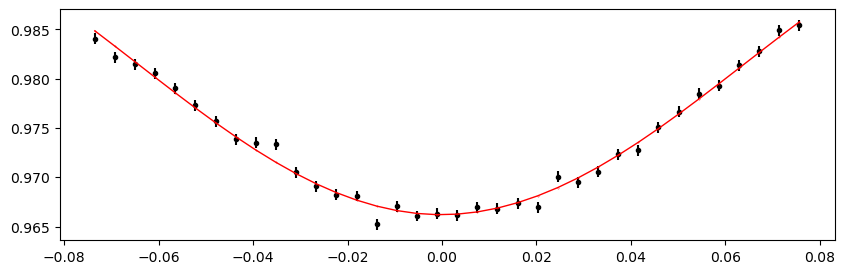

1345.7868244000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.75it/s]


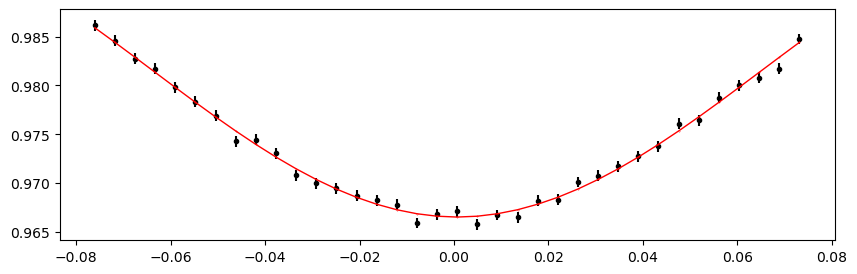

1346.1126506 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.13it/s]


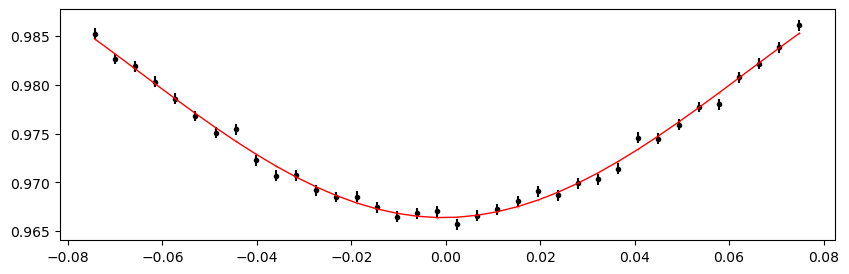

1346.4384768000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.67it/s]


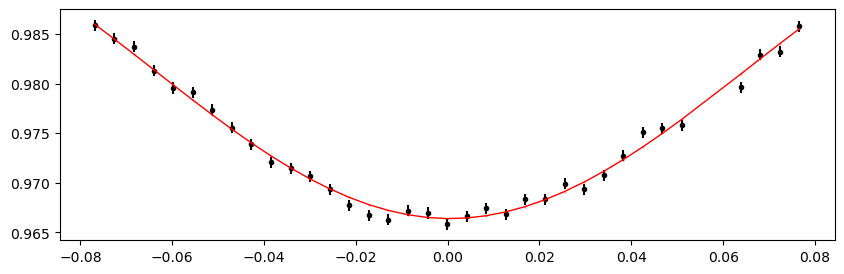

1346.7643030000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.20it/s]


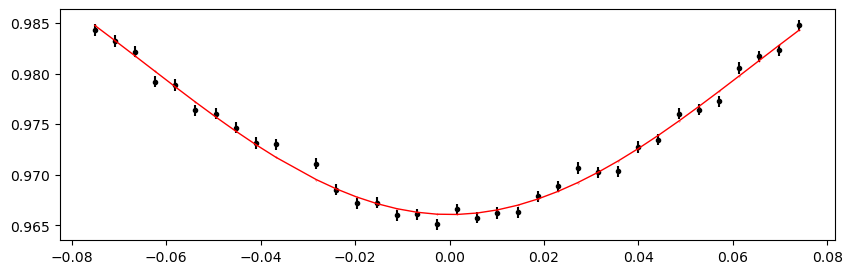

1347.0901292 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.88it/s]


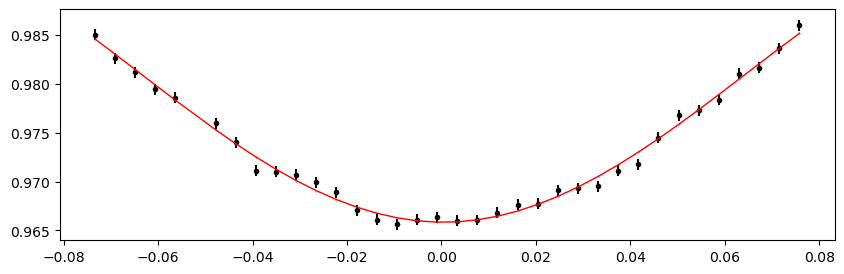

1347.4159554 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.15it/s]


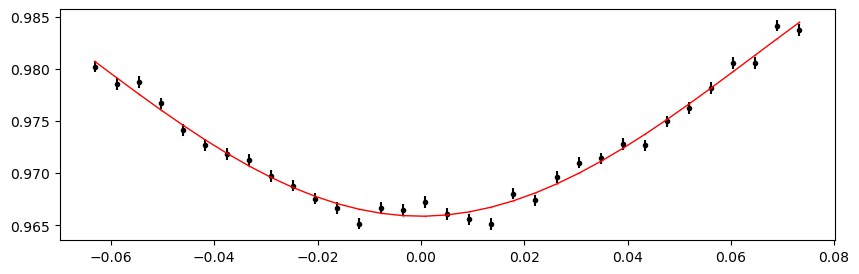

Time 1347.7417816000002 does not have enough data points: 11
Time 1348.0676078000001 does not have enough data points: 2
1348.393434 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.53it/s]


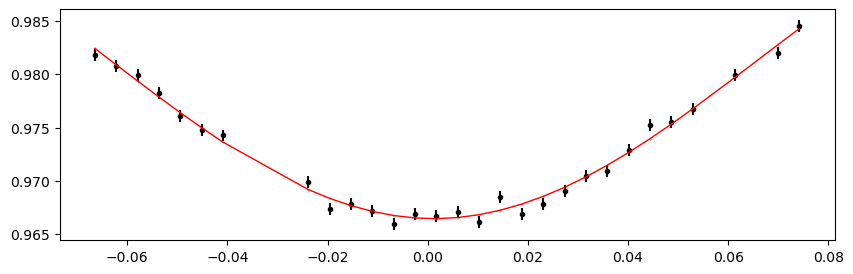

Time 1348.7192602 does not have enough data points: 4
Time 1349.0450864000002 does not have enough data points: 13
1349.3709126 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.17it/s]


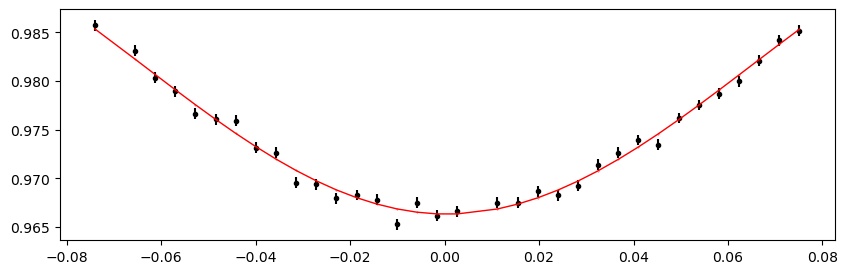

1349.6967388 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.70it/s]


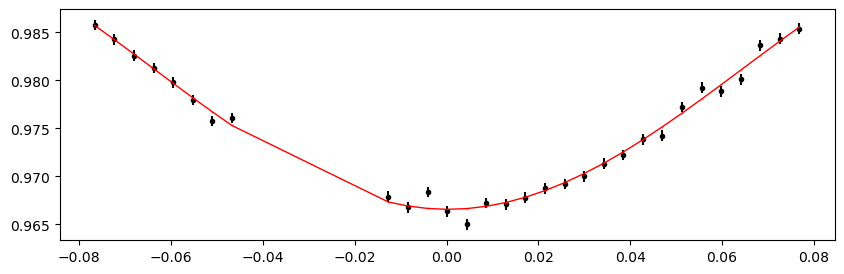

1350.0225650000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.89it/s]


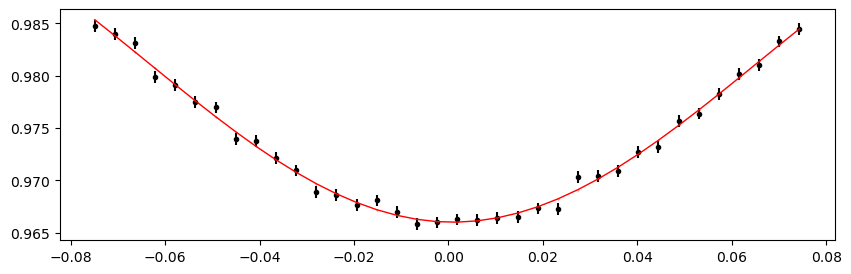

1350.3483912000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.96it/s]


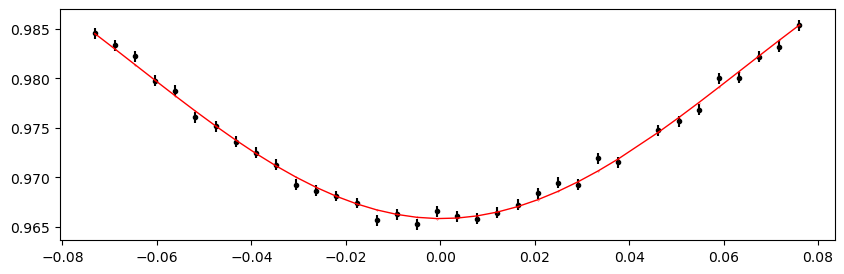

1350.6742174 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.05it/s]


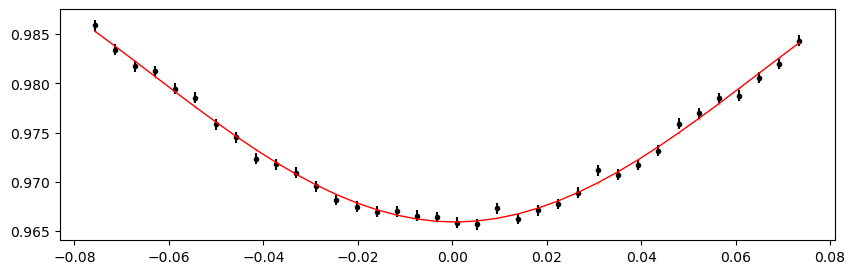

1351.0000436 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.33it/s]


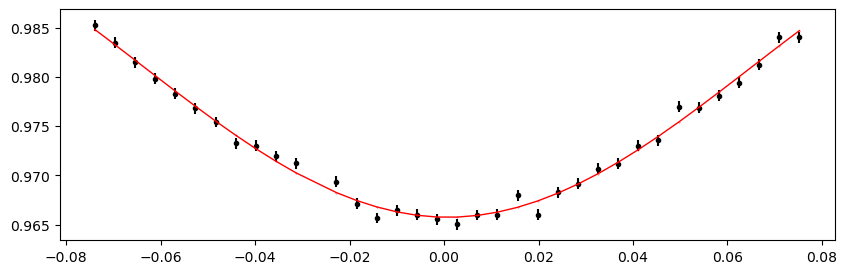

1351.3258698000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.14it/s]


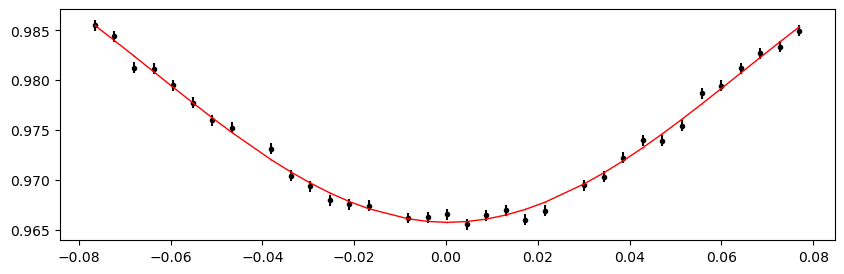

1351.6516960000001 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.91it/s]


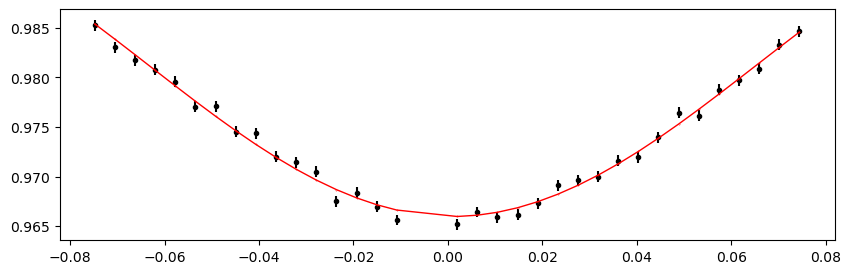

1351.9775222 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.44it/s]


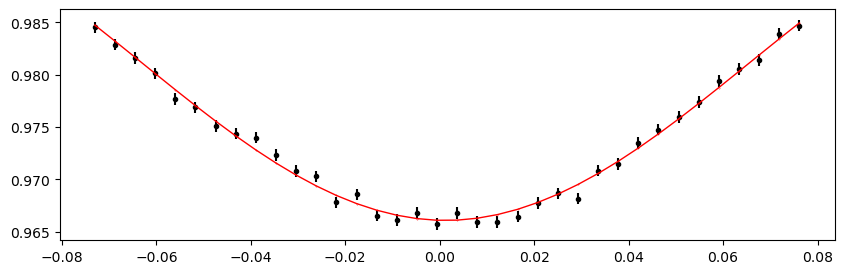

1352.3033484 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.29it/s]


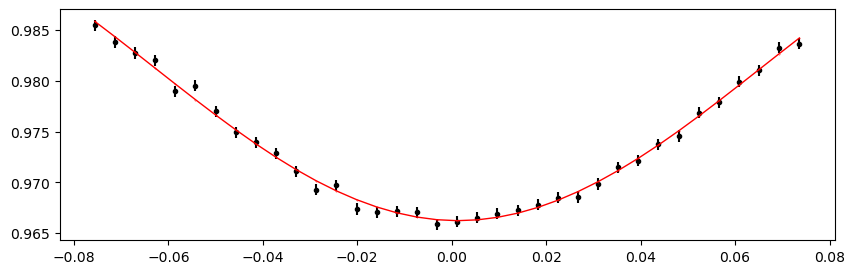

1352.6291746000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.80it/s]


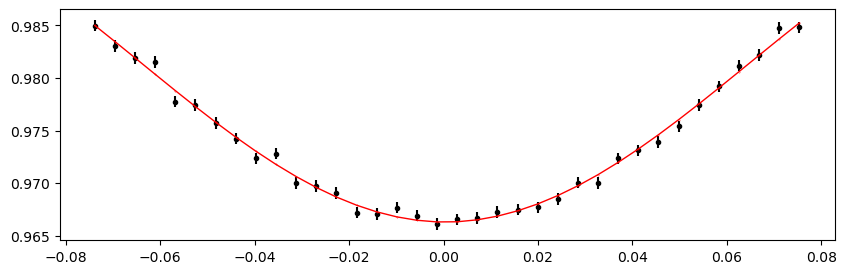

1352.9550008 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.87it/s]


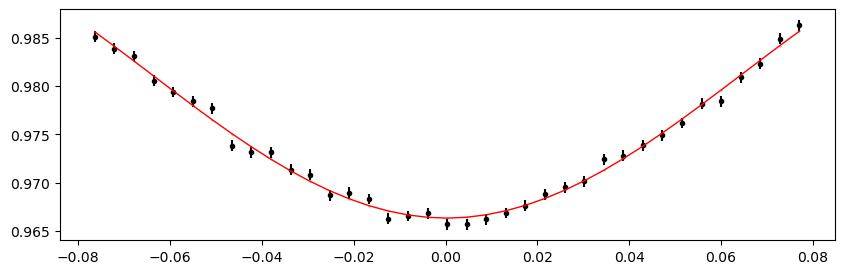

2061.952812 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.96it/s]


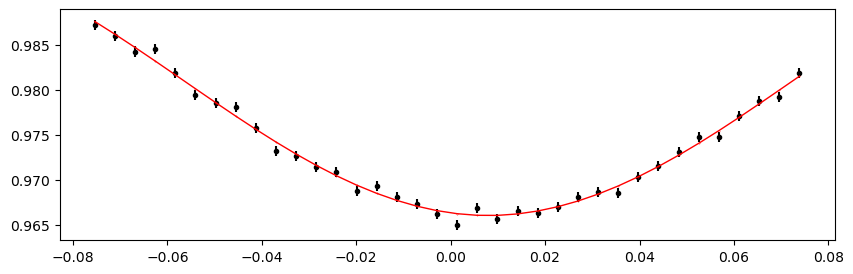

2062.2786382000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.32it/s]


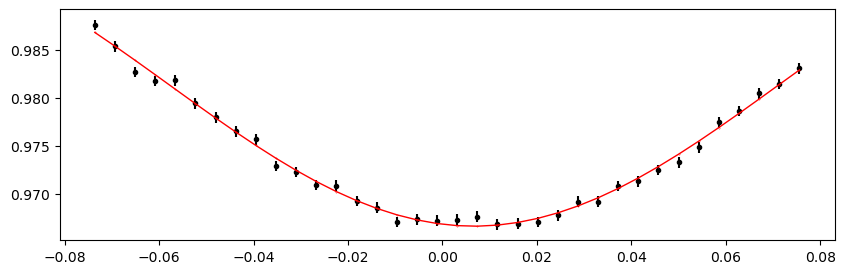

2062.6044644000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.94it/s]


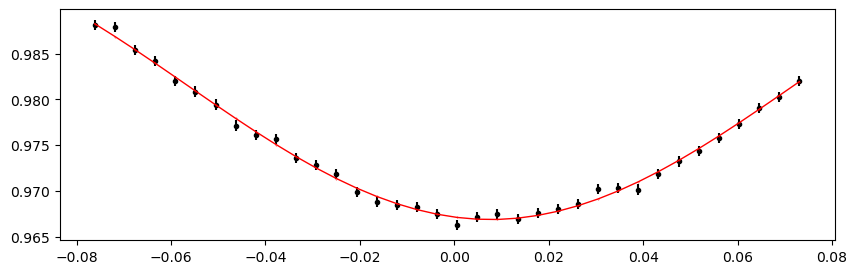

2062.9302906000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.54it/s]


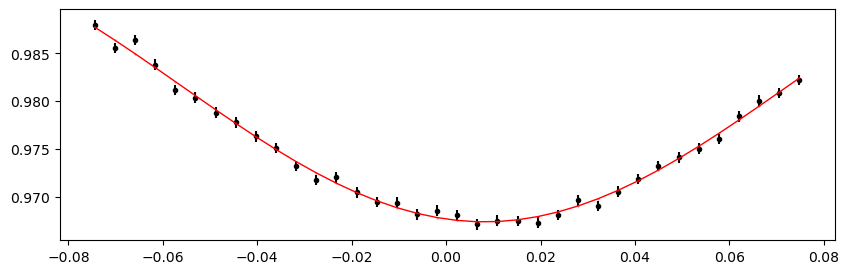

2063.2561168 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.50it/s]


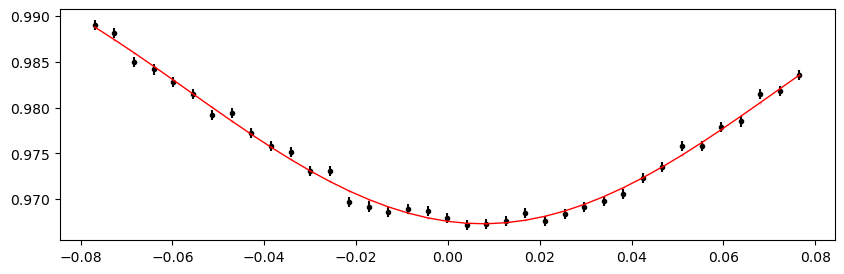

2063.581943 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.97it/s]


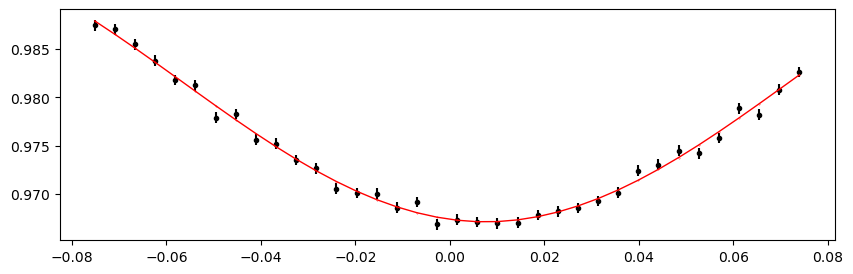

2063.9077692 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.73it/s]


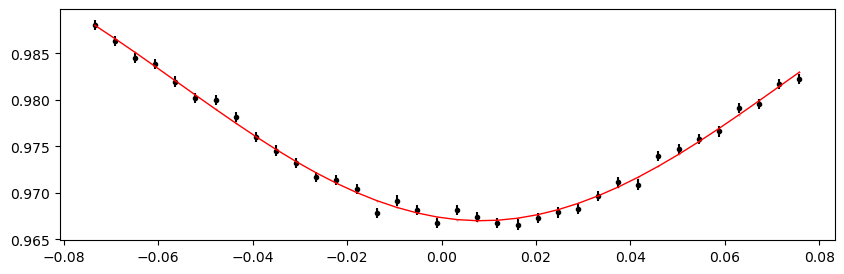

2064.2335954 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.00it/s]


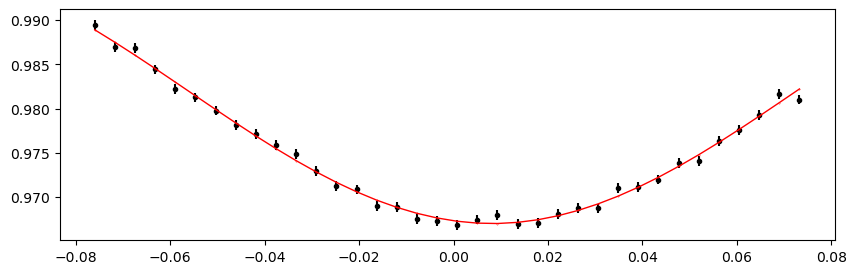

2064.5594216 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.03it/s]


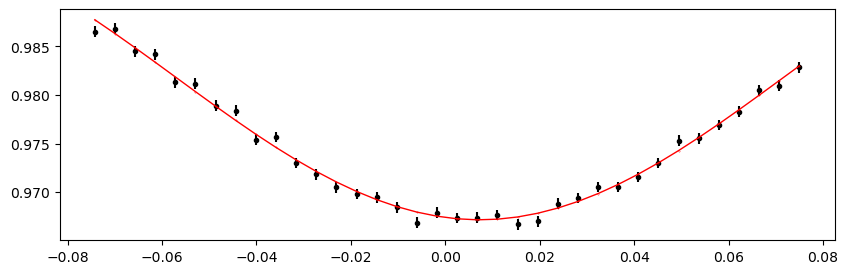

2064.8852478 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.15it/s]


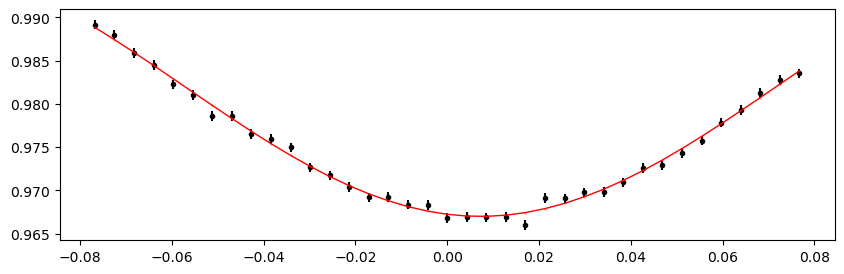

2065.2110740000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.69it/s]


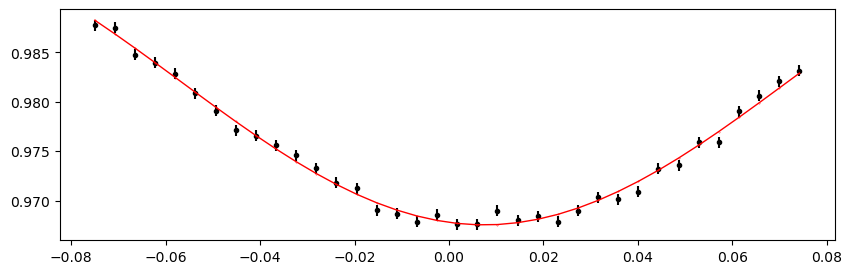

2065.5369002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.60it/s]


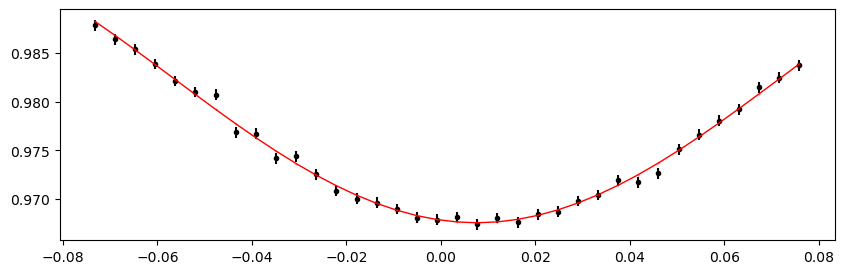

2065.8627264 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.65it/s]


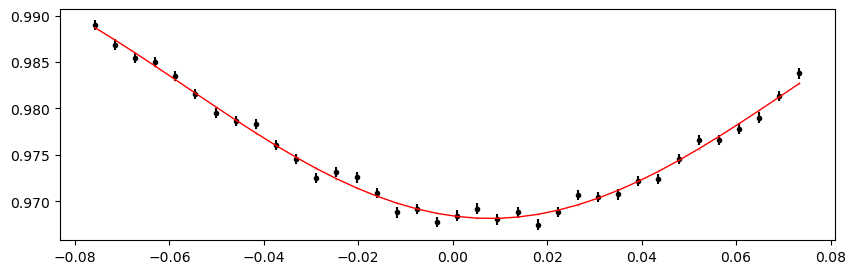

2066.1885526 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.42it/s]


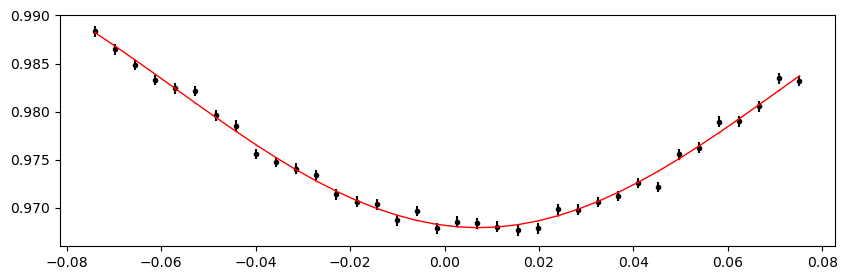

2066.5143788 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.58it/s]


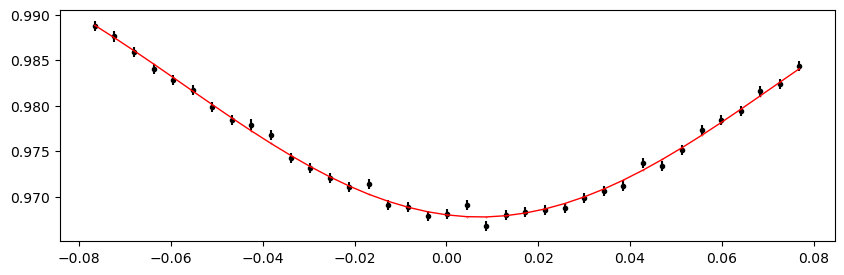

2066.840205 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.85it/s]


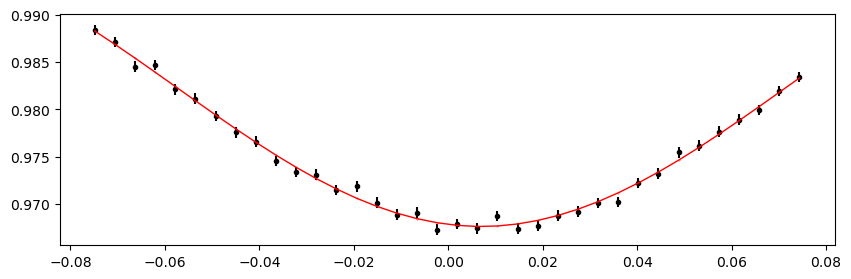

2067.1660312000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.51it/s]


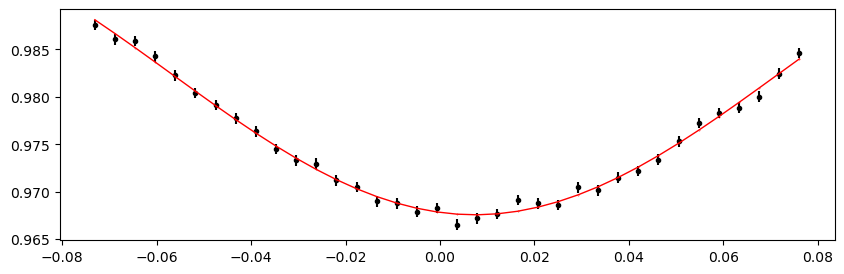

2067.4918574000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.91it/s]


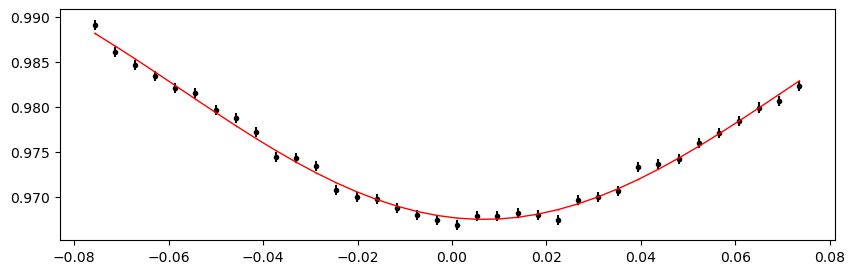

2067.8176836000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.94it/s]


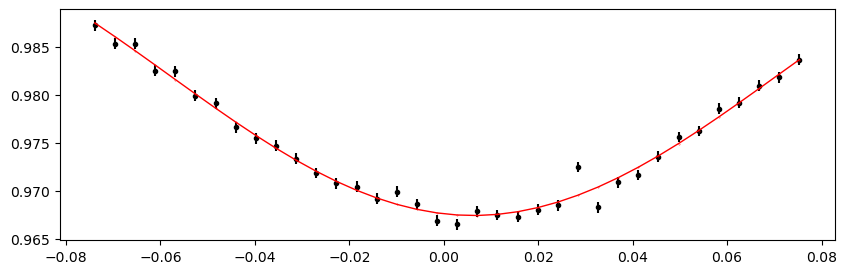

2068.1435098 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.75it/s]


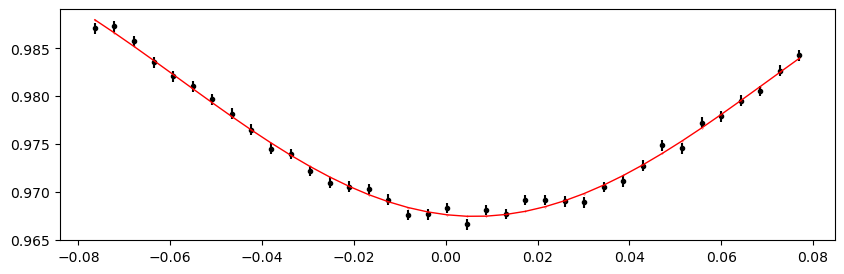

2068.469336 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.09it/s]


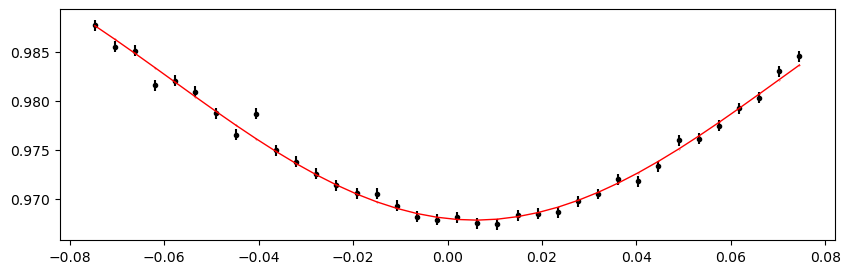

2068.7951622 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.49it/s]


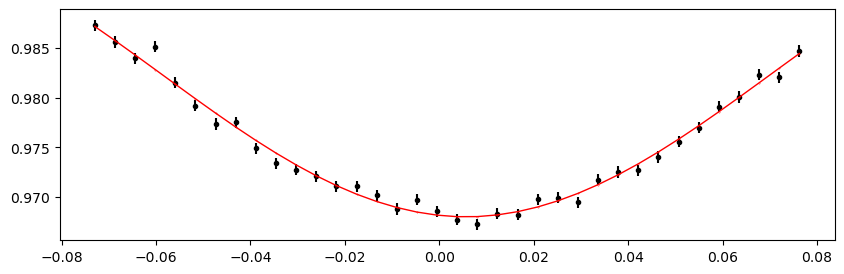

2069.1209884 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.14it/s]


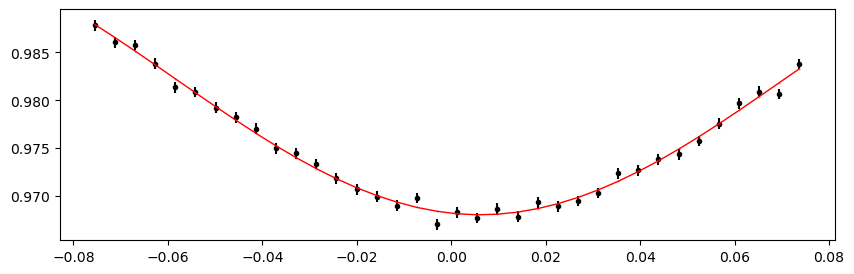

2069.4468146 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.03it/s]


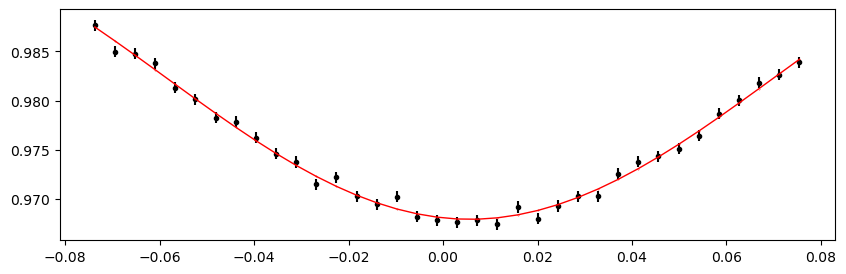

2069.7726408 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.26it/s]


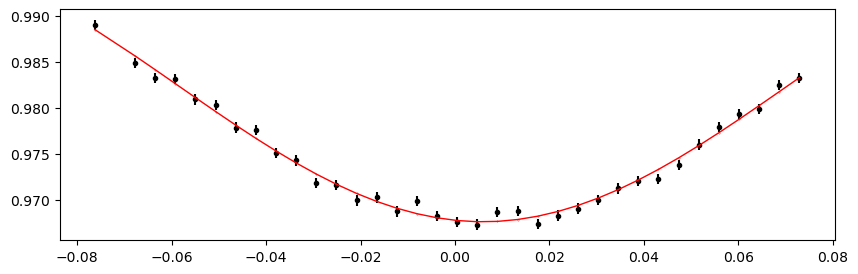

2070.0984670000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.45it/s]


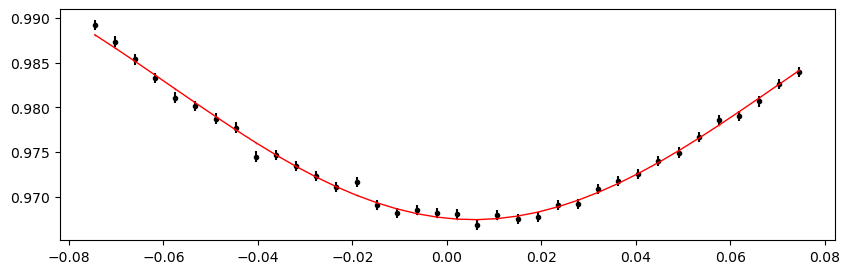

2070.4242932 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.59it/s]


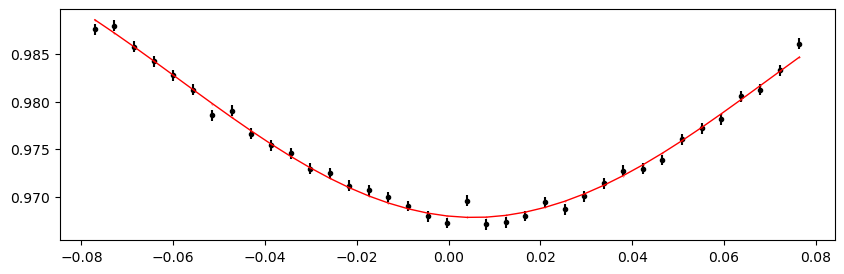

2070.7501194 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.96it/s]


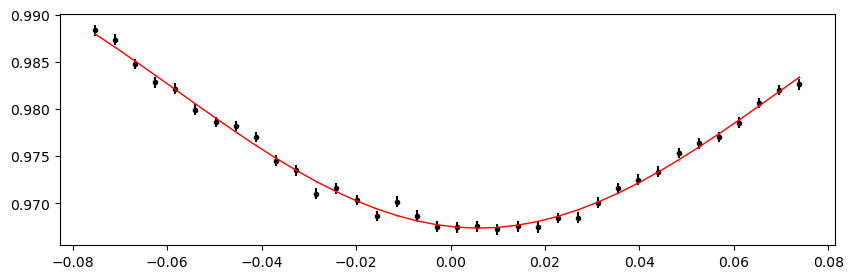

2071.0759456 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.88it/s]


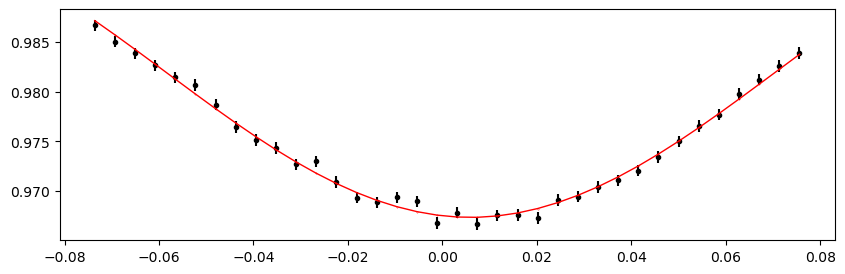

2071.4017718 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.15it/s]


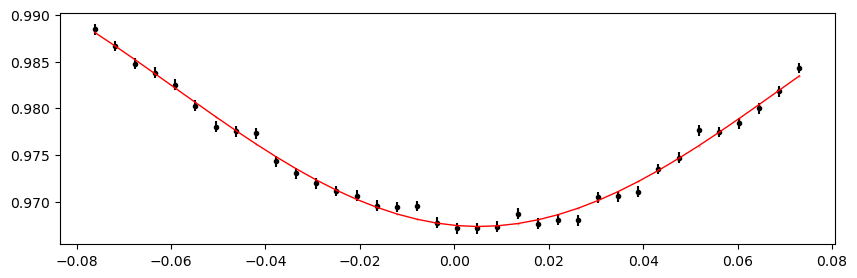

2071.7275980000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.80it/s]


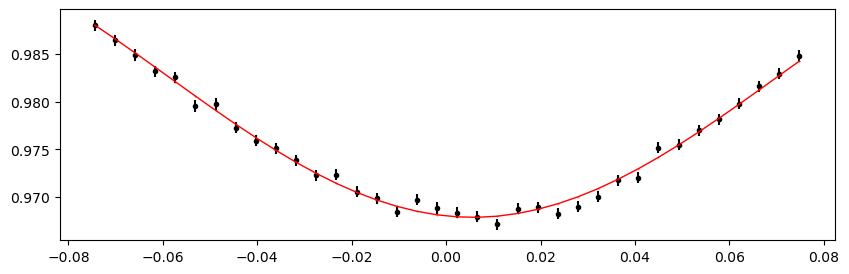

2072.0534242000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.36it/s]


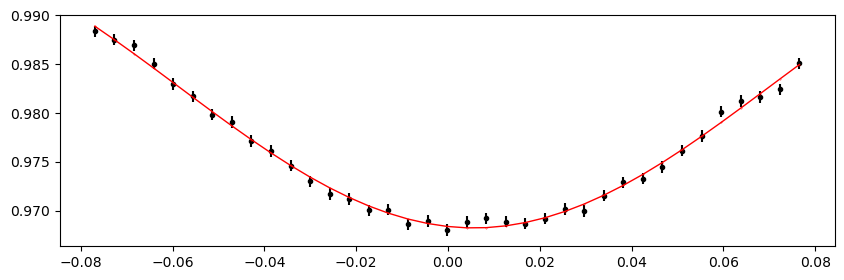

2072.3792504000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.09it/s]


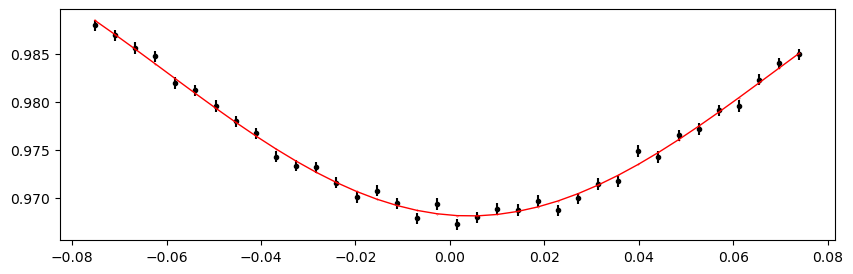

2075.3116862 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.36it/s]


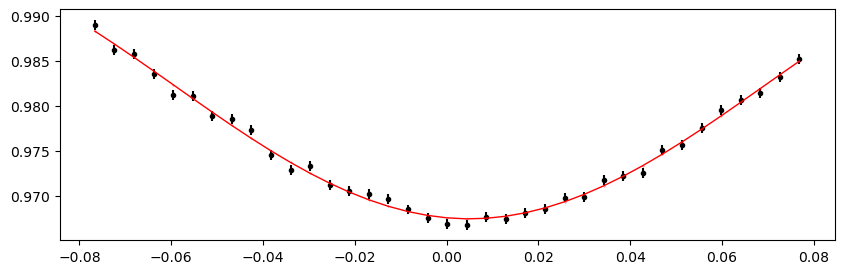

2075.6375124 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.53it/s]


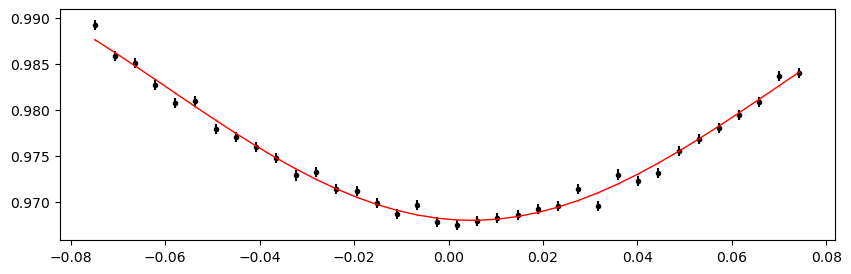

2075.9633386 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.39it/s]


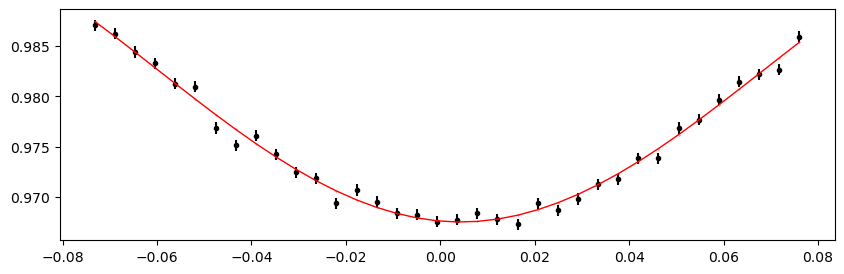

2076.2891648 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.63it/s]


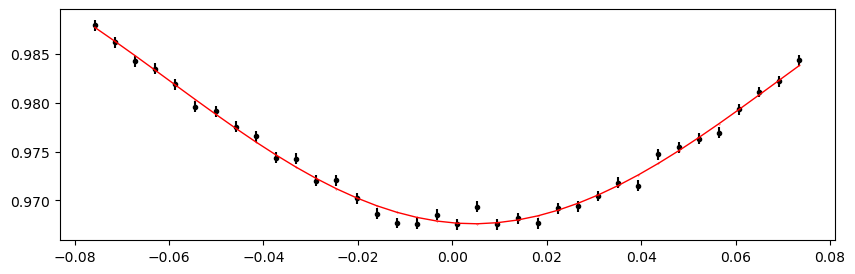

2076.6149910000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.77it/s]


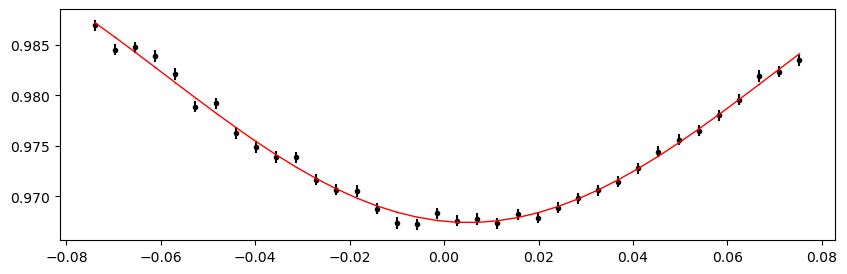

2076.9408172000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.24it/s]


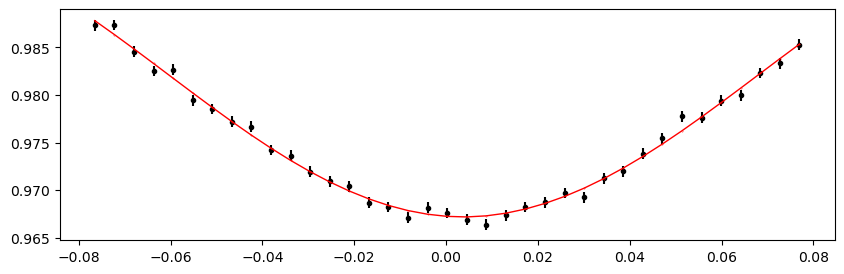

2077.2666434000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.17it/s]


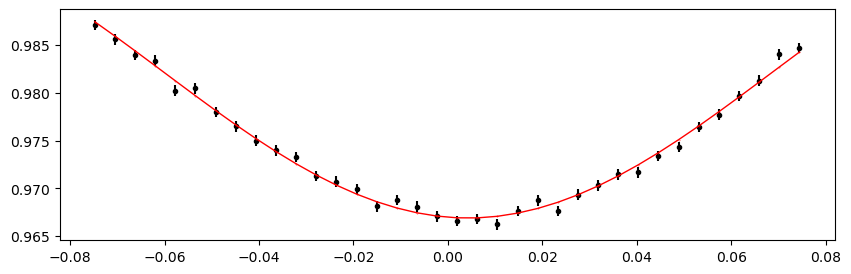

2077.5924696 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.12it/s]


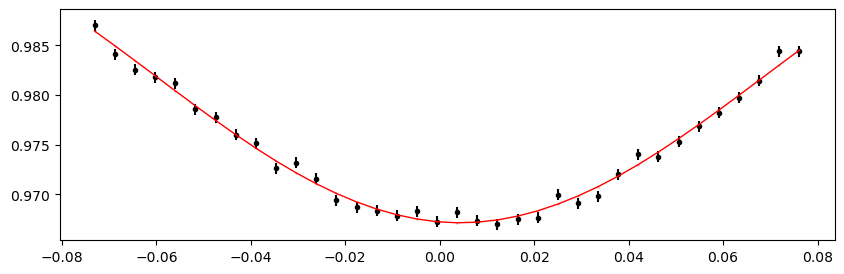

2077.9182958 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.73it/s]


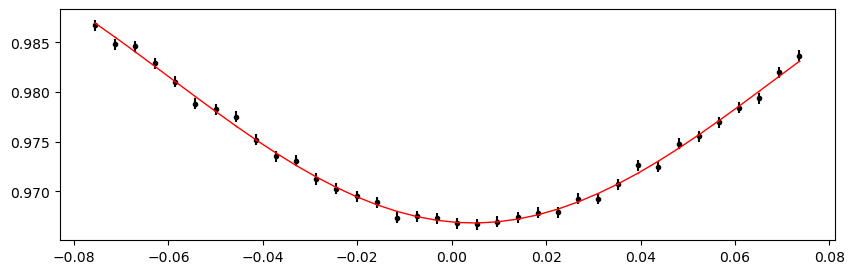

2078.244122 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.31it/s]


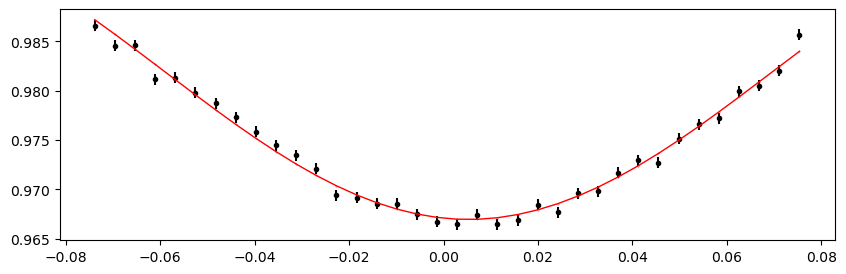

2078.5699482 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.17it/s]


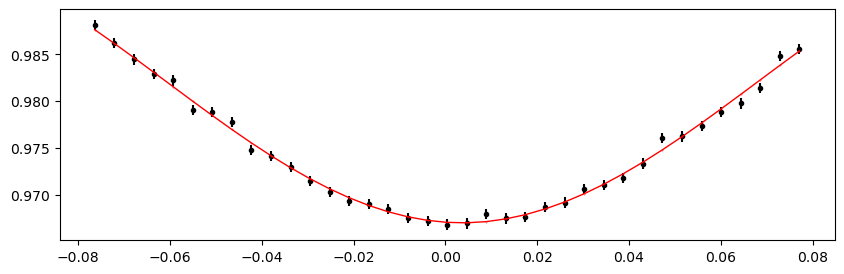

2078.8957744 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.12it/s]


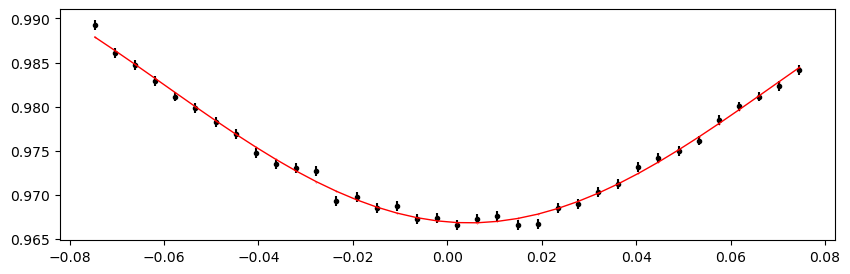

2079.2216006 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.10it/s]


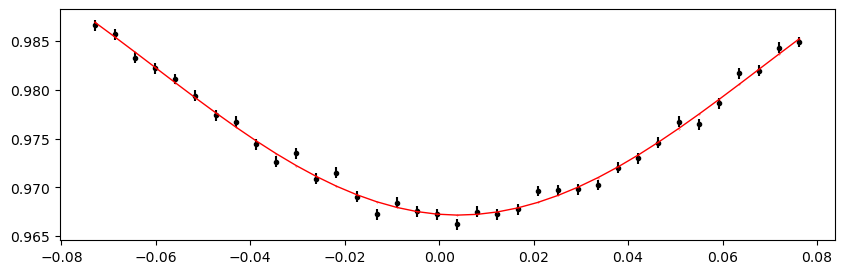

2079.5474268000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.91it/s]


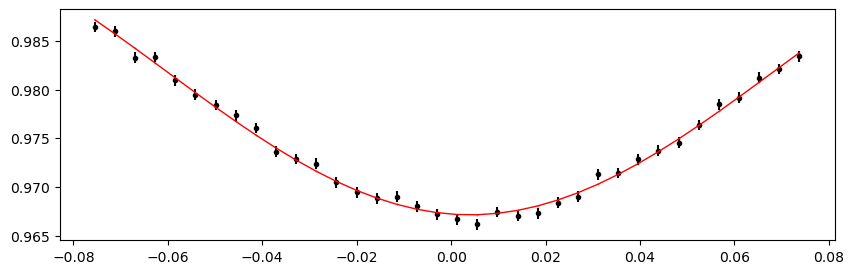

2079.873253 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.62it/s]


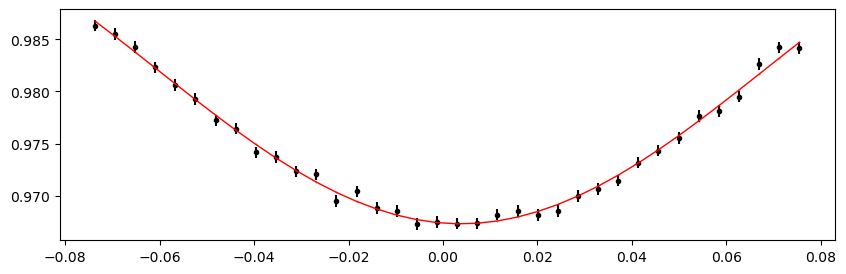

2080.1990792 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.23it/s]


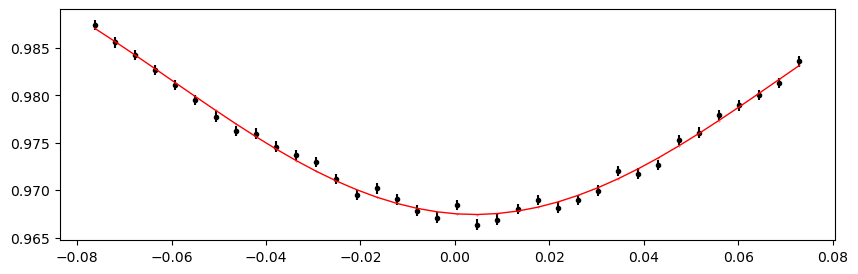

2080.5249054 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.42it/s]


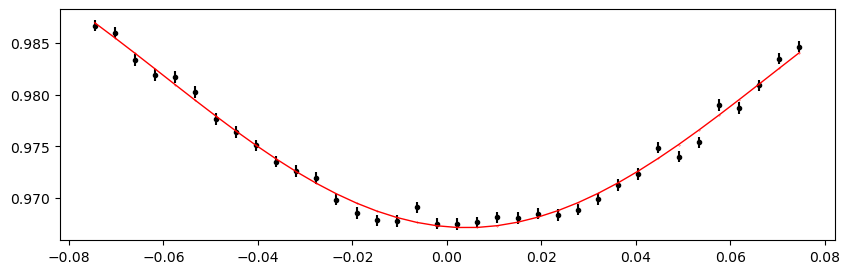

2080.8507316 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.81it/s]


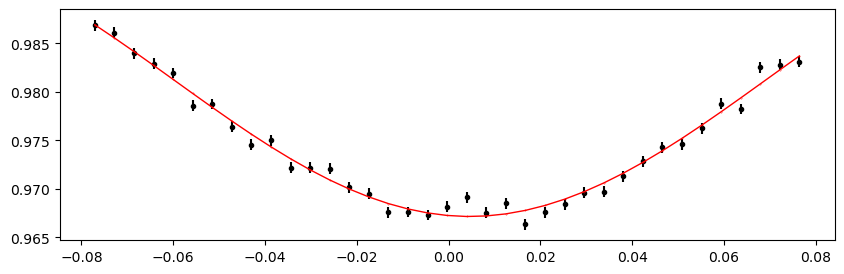

2081.1765578000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.91it/s]


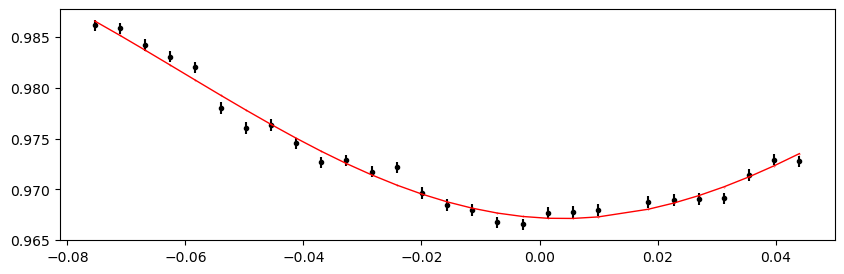

2081.5023840000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.48it/s]


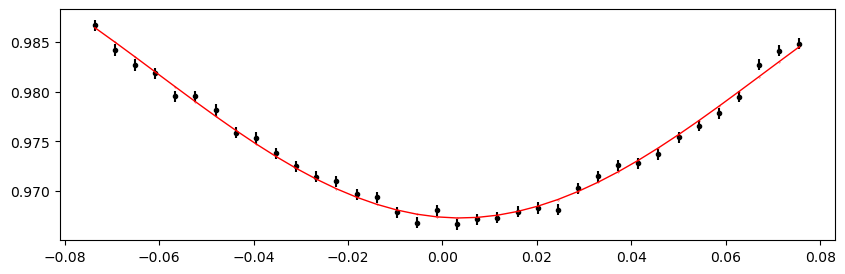

2081.8282102000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.66it/s]


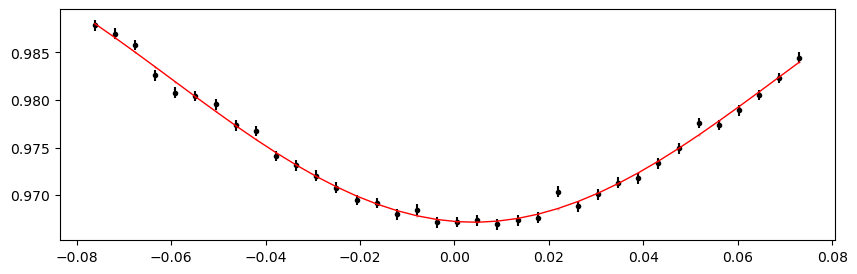

2082.1540364 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.69it/s]


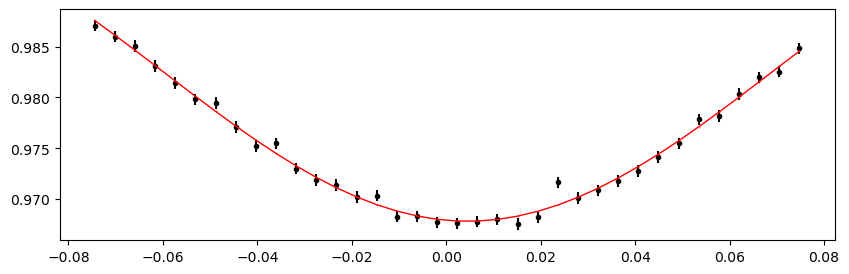

2082.4798626 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.79it/s]


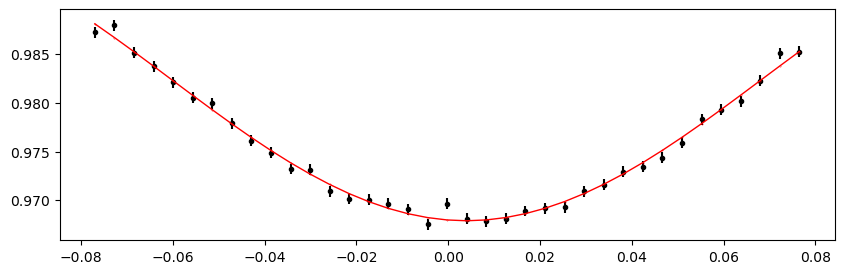

2082.8056888 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.05it/s]


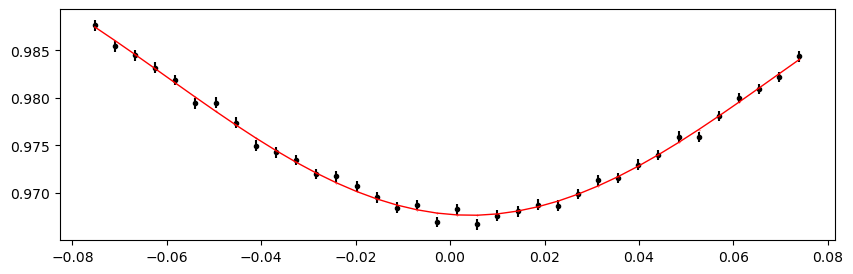

2083.131515 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.31it/s]


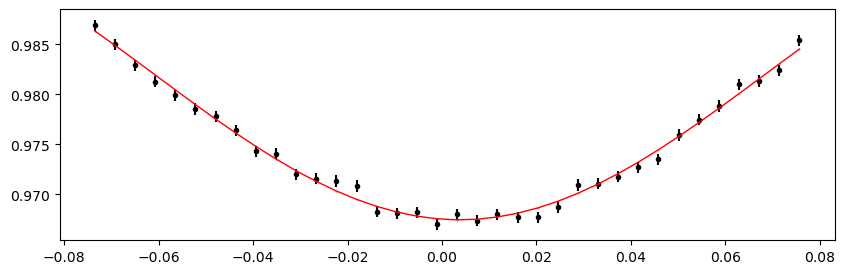

2083.4573412 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.81it/s]


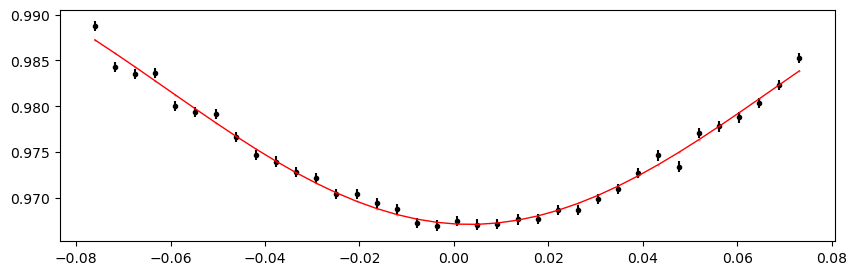

2083.7831674 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.77it/s]


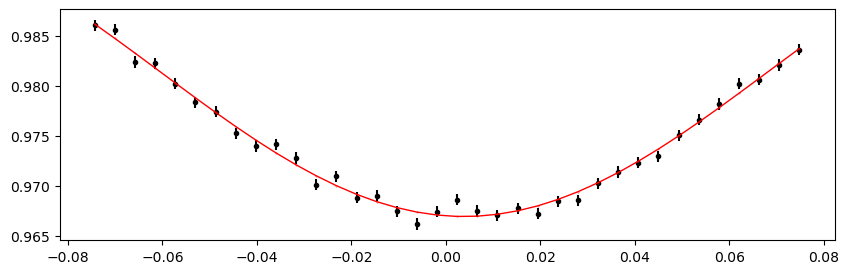

2084.1089936000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.31it/s]


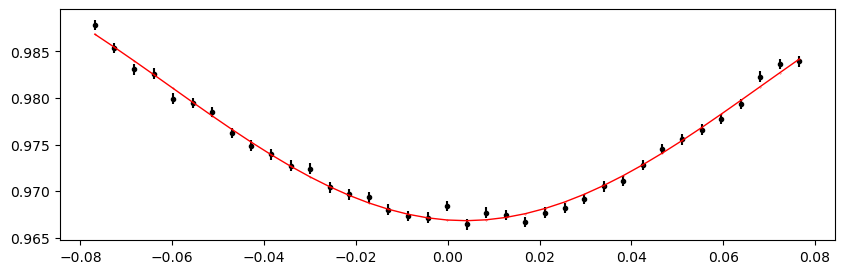

2084.4348198000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.80it/s]


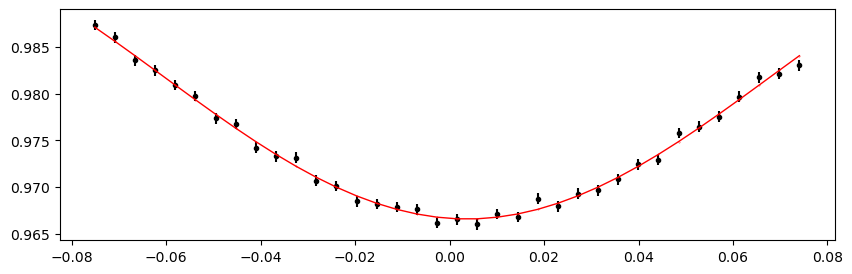

2084.760646 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.29it/s]


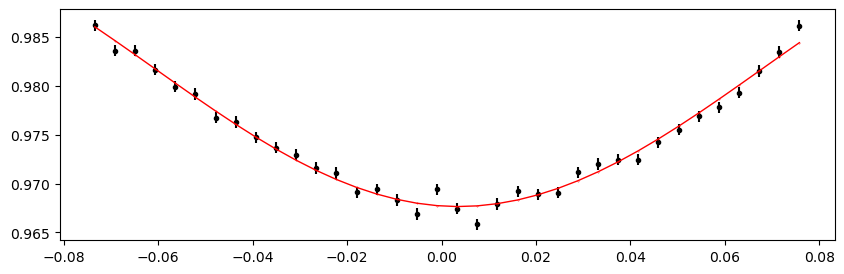

2085.0864722 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.04it/s]


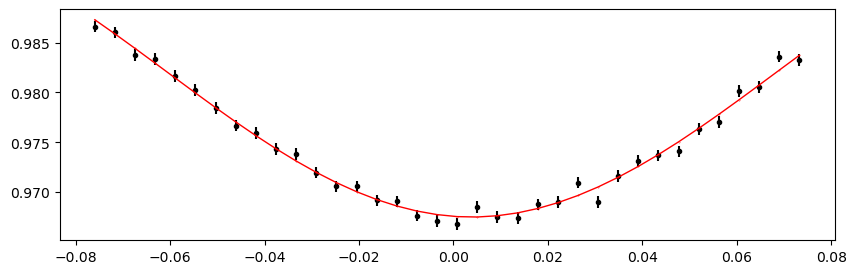

2085.4122984 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.65it/s]


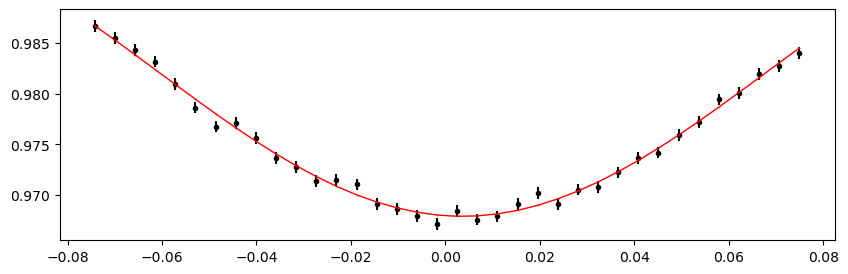

3154.7738868 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.86it/s]


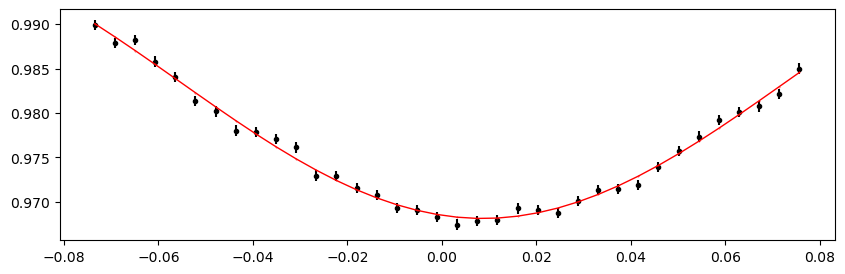

3155.099713 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.77it/s]


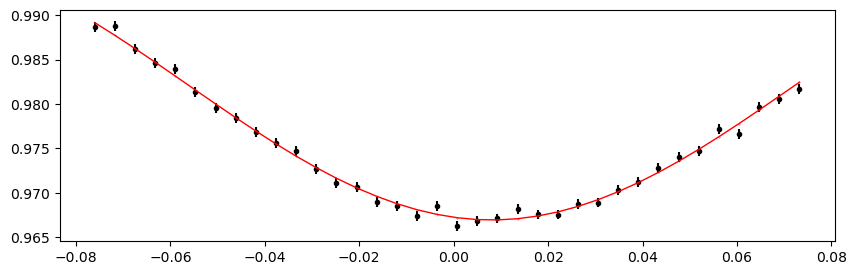

3155.4255392000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.62it/s]


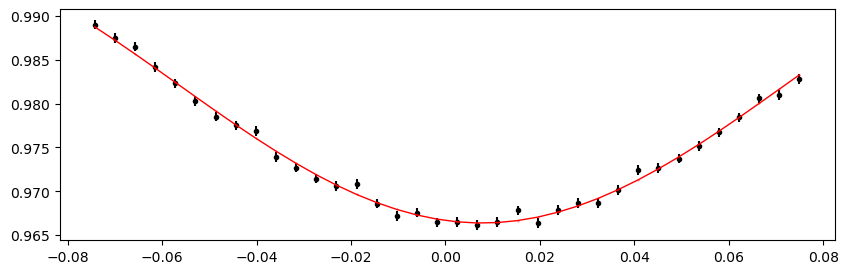

3155.7513654000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.82it/s]


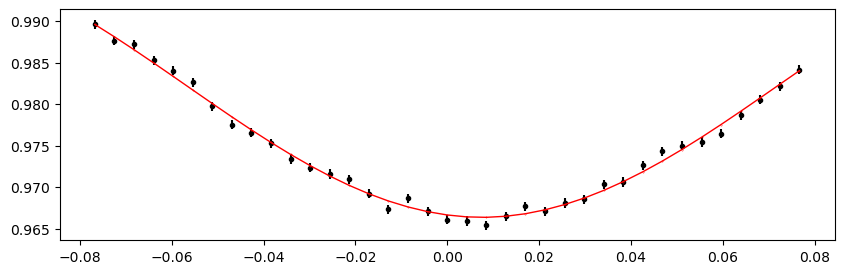

3156.0771916000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.67it/s]


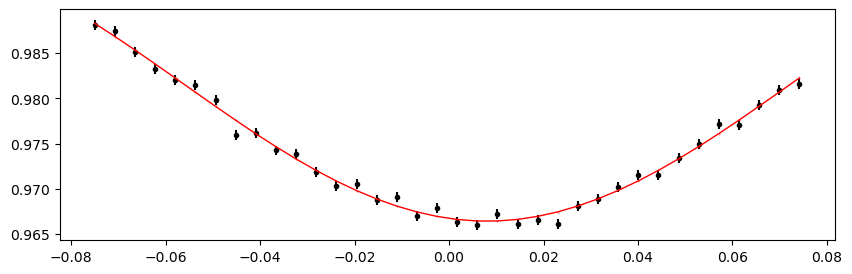

3156.4030178000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.38it/s]


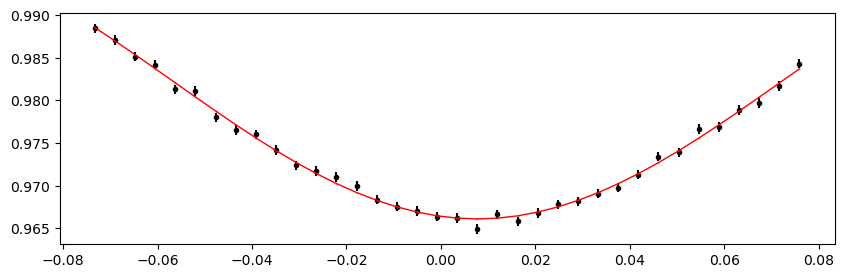

3156.728844 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.71it/s]


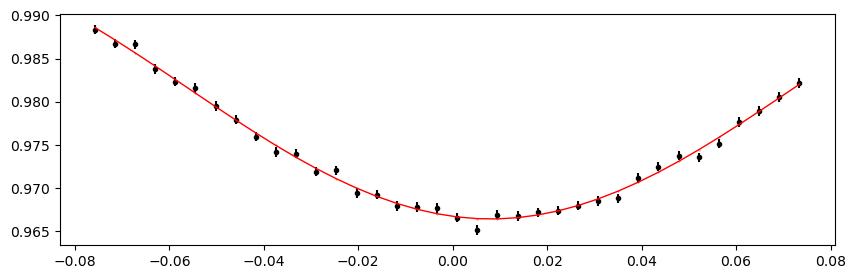

3157.0546702 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.57it/s]


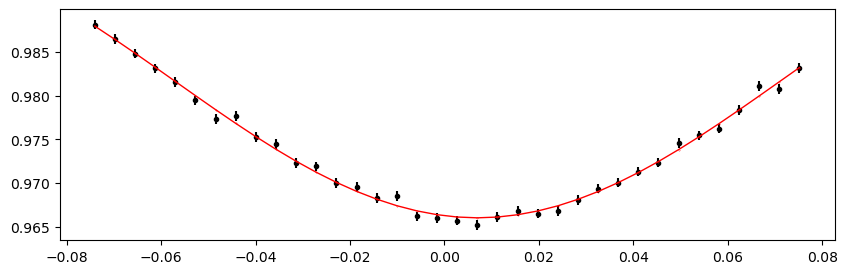

3157.3804964 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.46it/s]


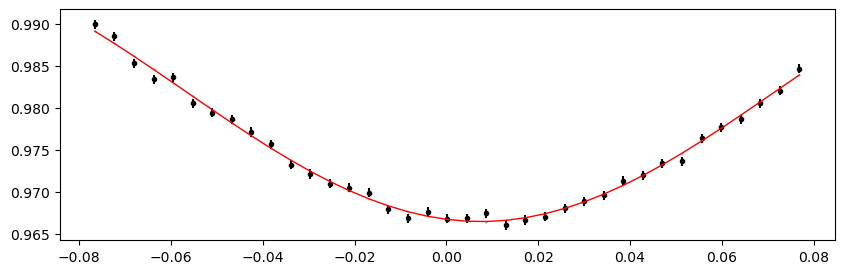

3157.7063226 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.71it/s]


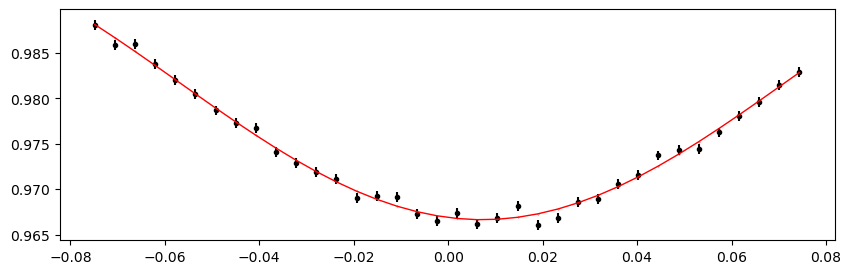

3158.0321488 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.06it/s]


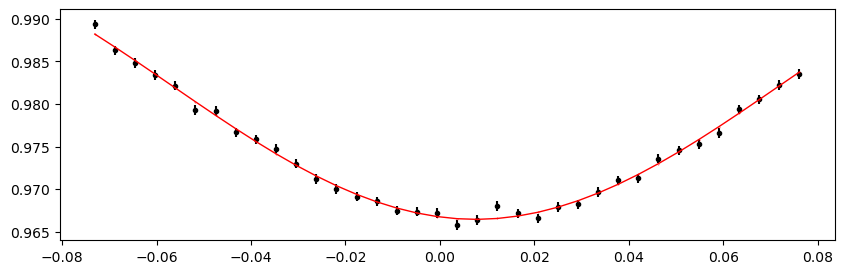

3158.357975 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.74it/s]


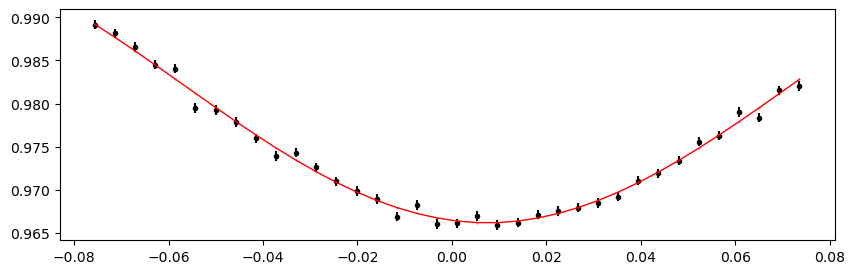

3158.6838012 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.15it/s]


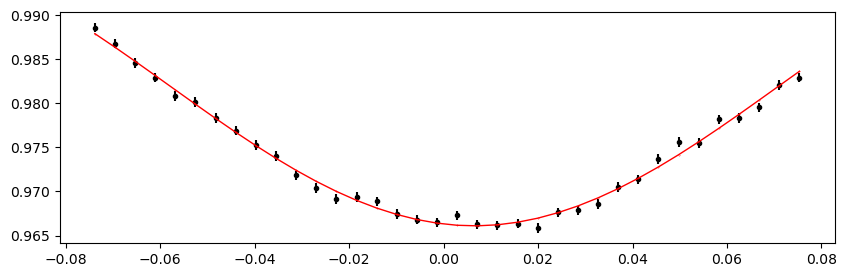

3159.0096274 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.08it/s]


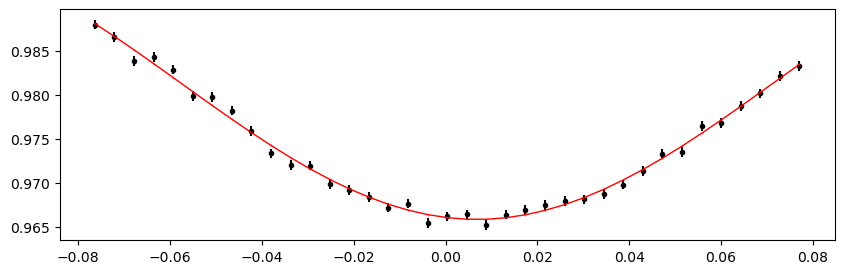

3159.3354536 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.94it/s]


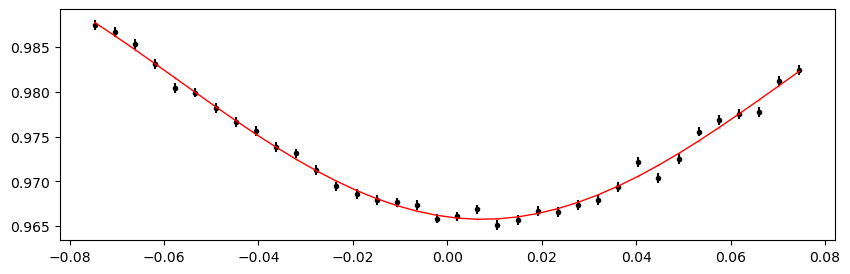

3159.6612798 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.27it/s]


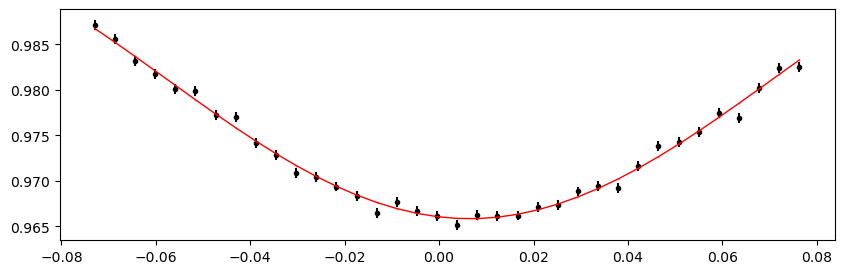

3159.9871060000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.24it/s]


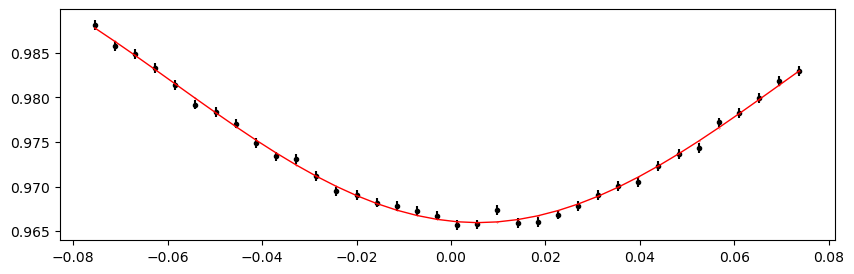

3160.3129322000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.28it/s]


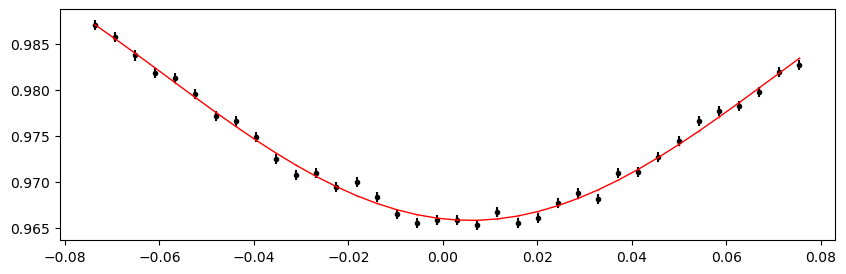

3160.6387584000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.90it/s]


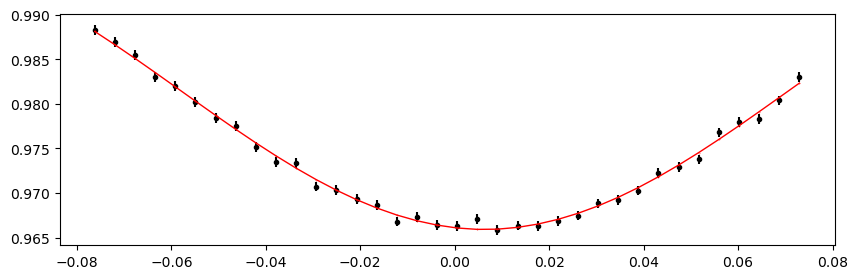

3160.9645846000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.93it/s]


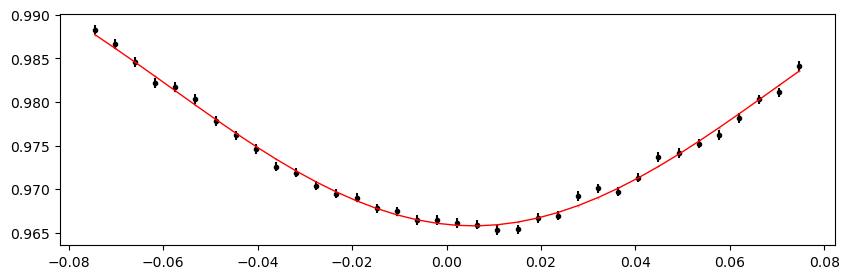

3161.2904108000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.99it/s]


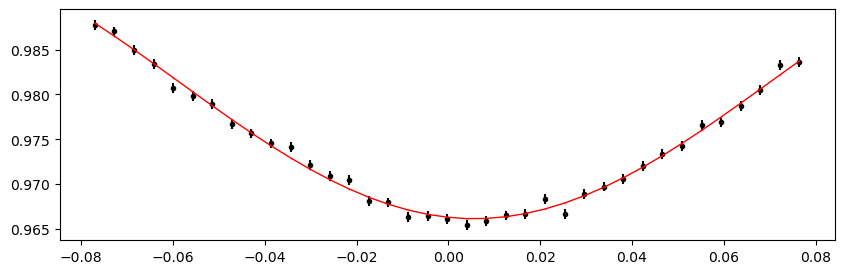

3161.616237 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.84it/s]


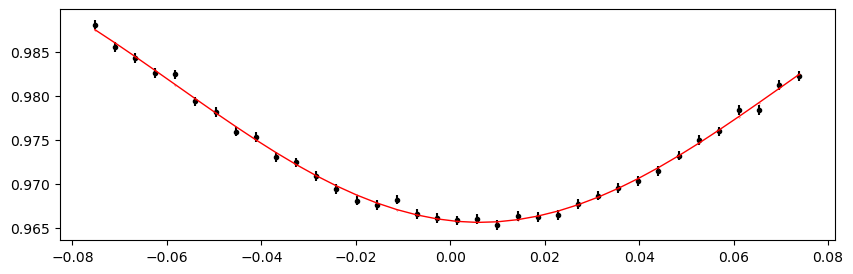

3162.2678894 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.73it/s]


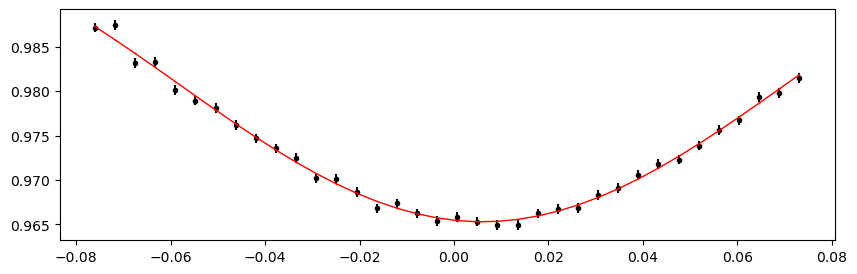

3162.5937156 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 416.99it/s]


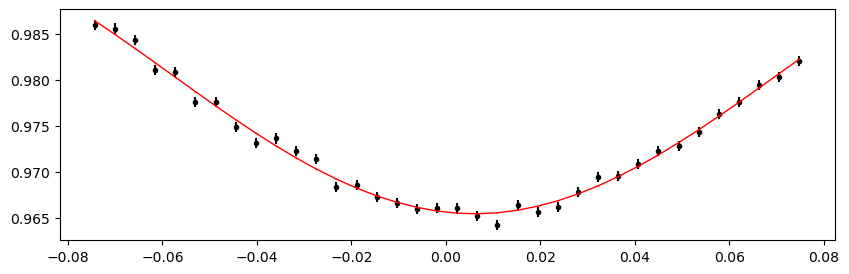

3162.9195418 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.93it/s]


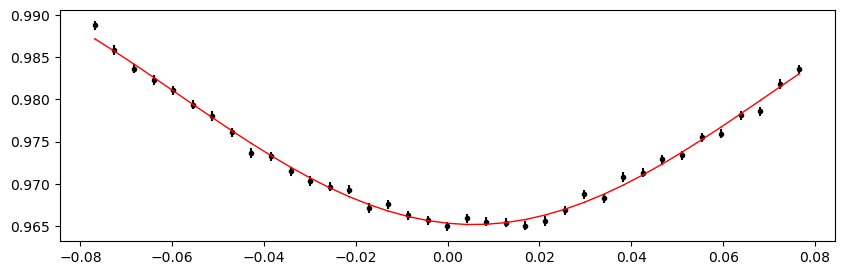

3163.245368 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.22it/s]


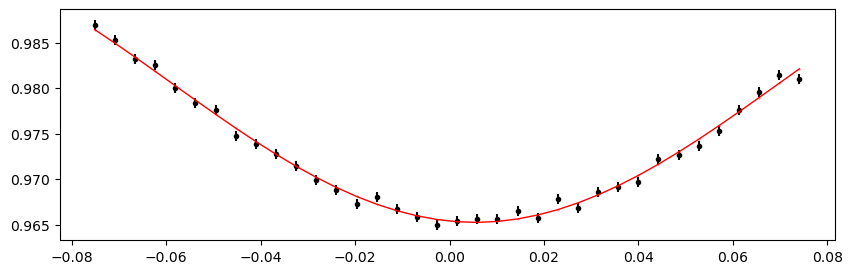

3163.5711942000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.48it/s]


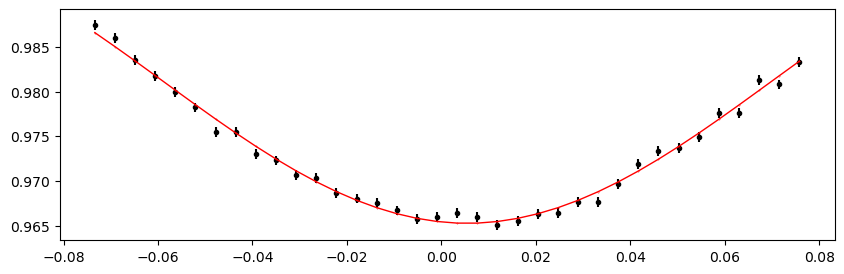

3163.8970204 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.75it/s]


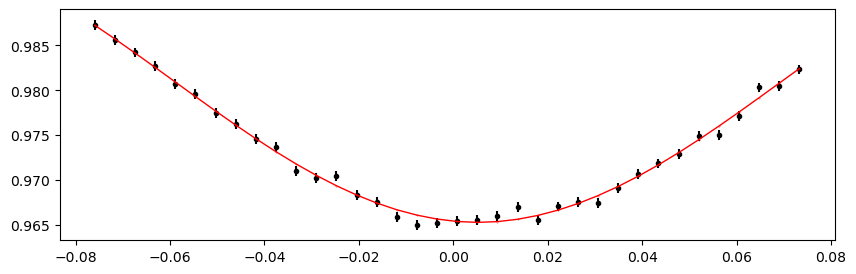

3164.2228466 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.77it/s]


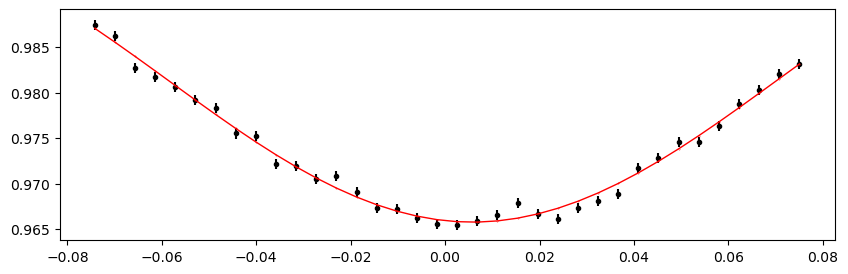

3164.5486728 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.18it/s]


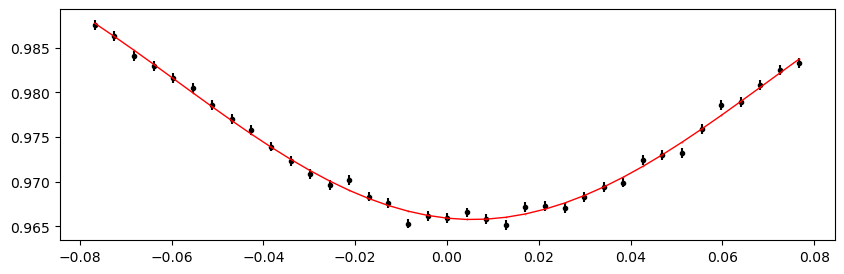

3164.8744990000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.71it/s]


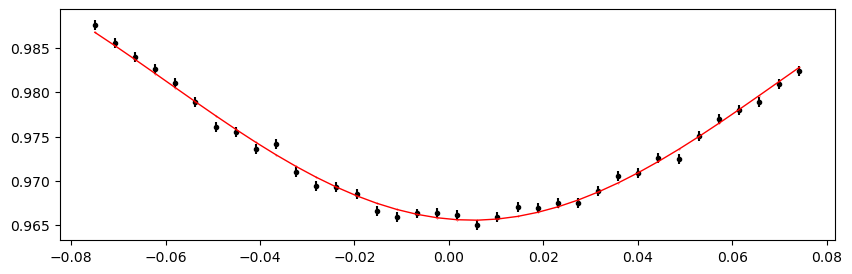

3165.2003252000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.88it/s]


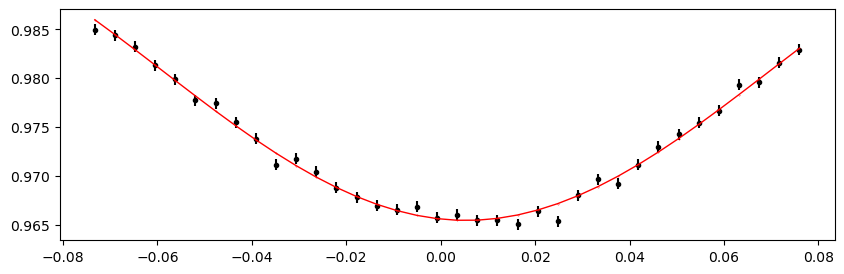

3165.5261514000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.06it/s]


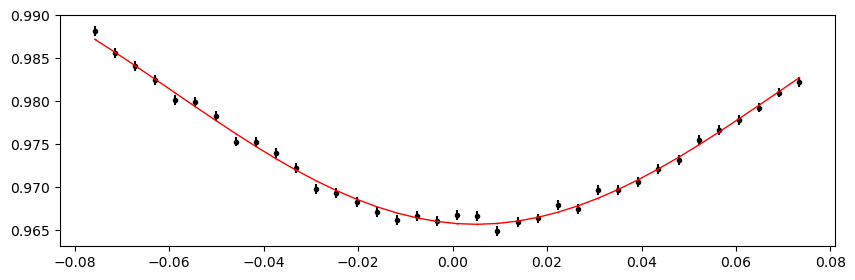

3168.7844134 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.67it/s]


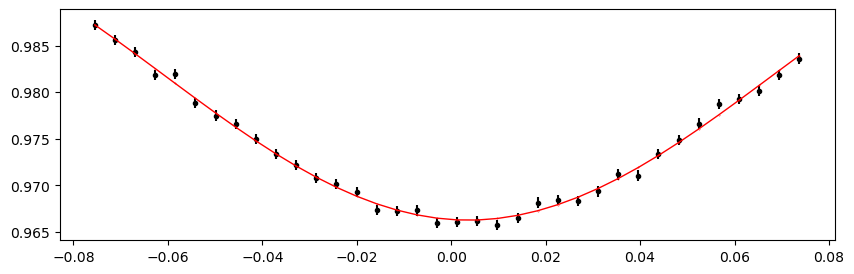

3169.1102396 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.04it/s]


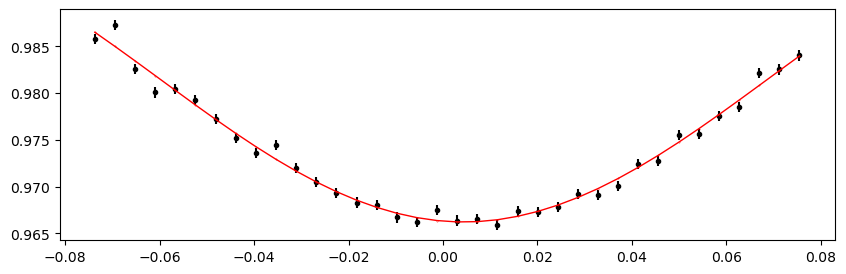

3169.4360658000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.06it/s]


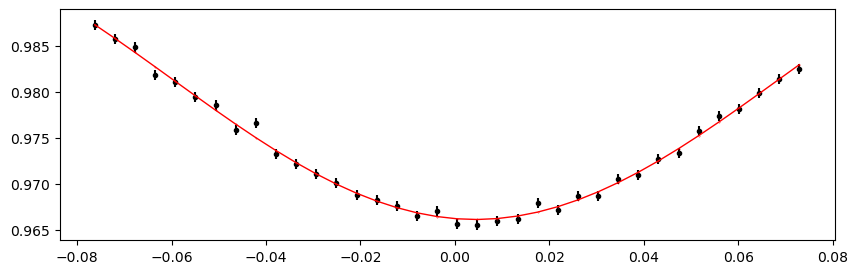

3169.7618920000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.21it/s]


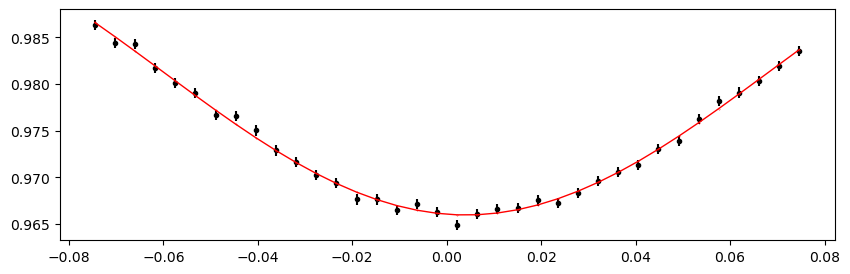

3170.0877182000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.34it/s]


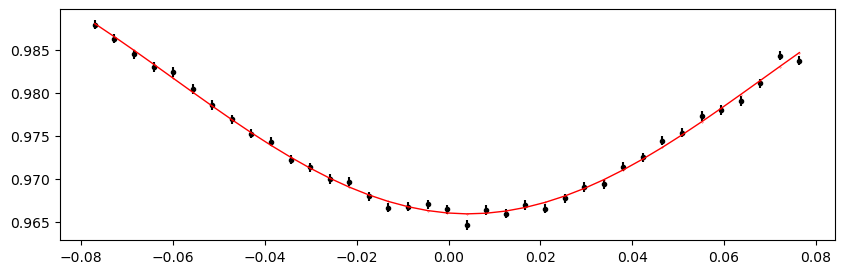

3170.4135444000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.90it/s]


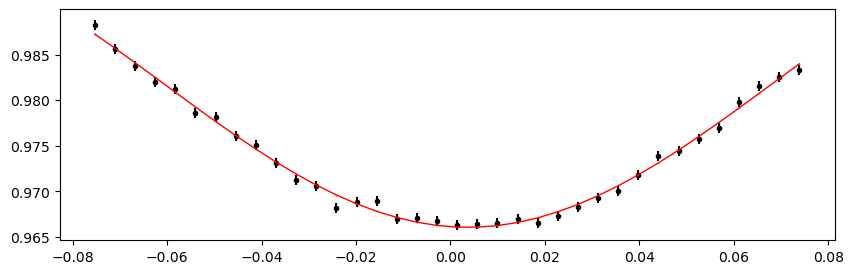

3170.7393706000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.87it/s]


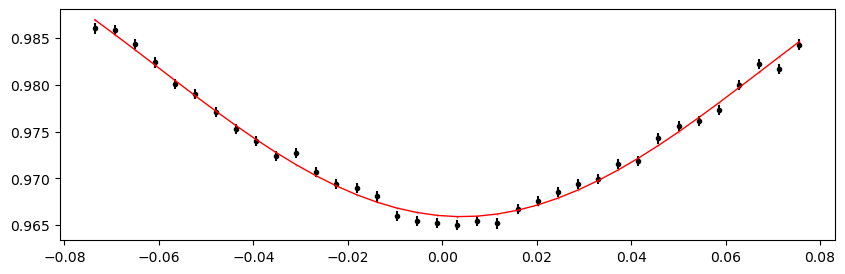

3171.0651968 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.77it/s]


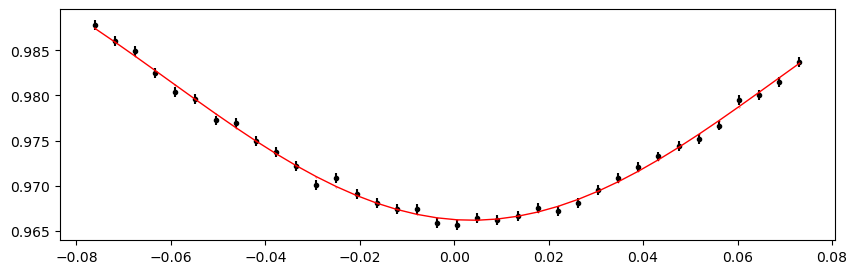

3171.391023 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.03it/s]


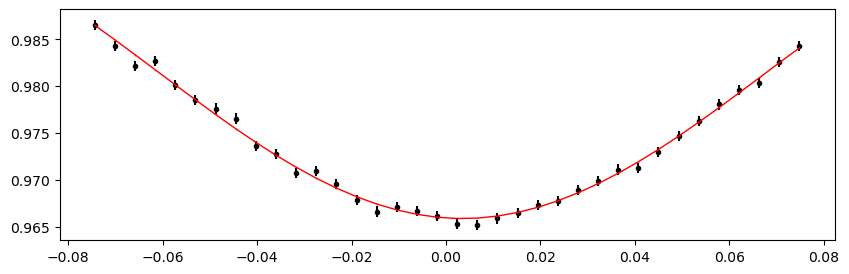

3171.7168492 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.80it/s]


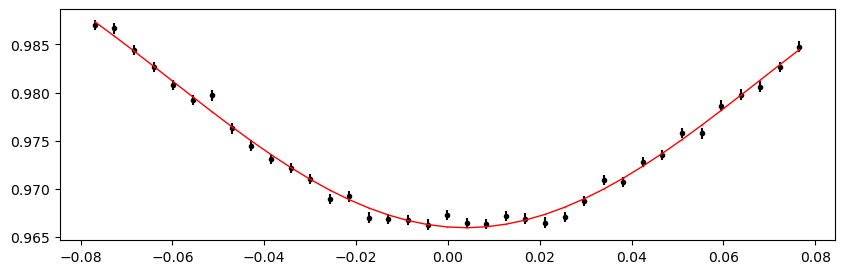

3172.0426754 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.65it/s]


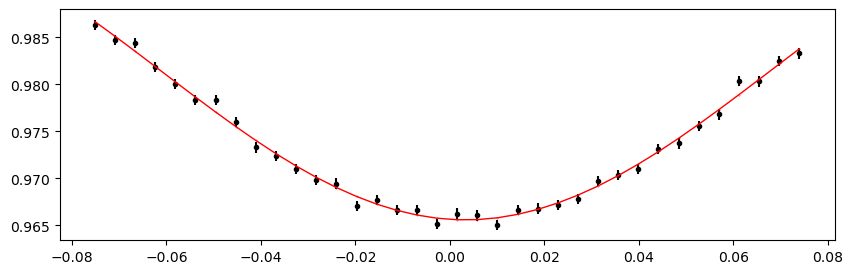

3172.3685016 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.79it/s]


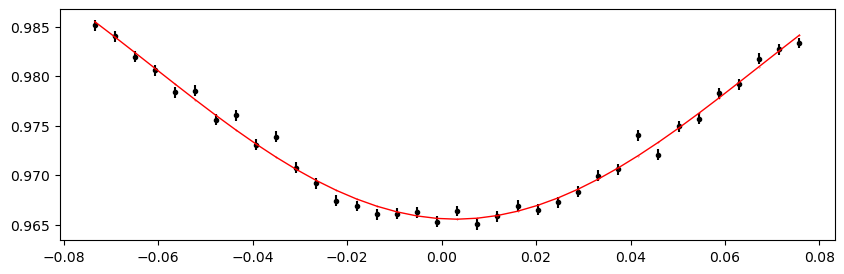

3172.6943278 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.98it/s]


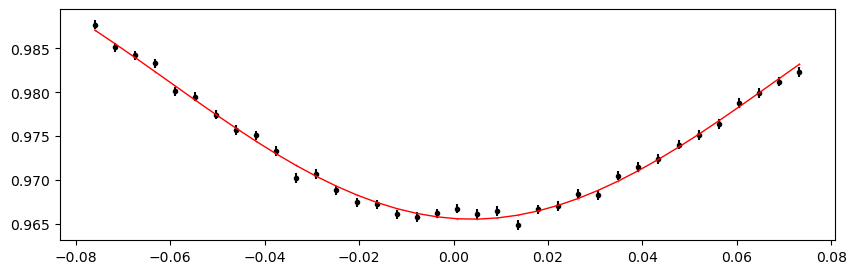

3173.0201540000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.92it/s]


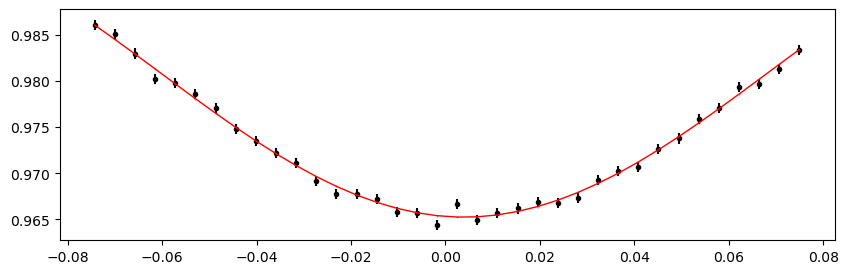

3173.3459802 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.89it/s]


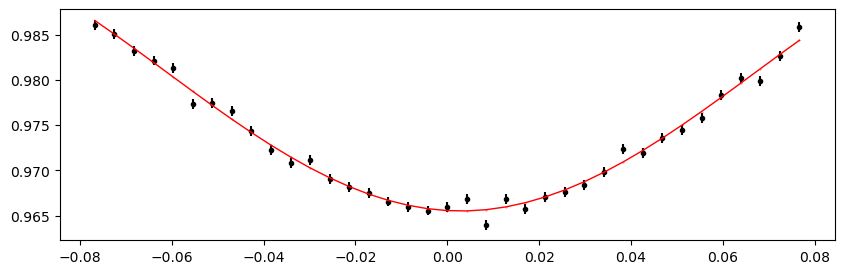

3173.6718064 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.62it/s]


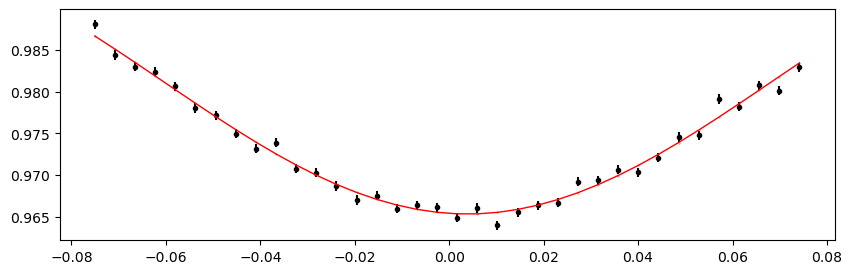

3173.9976326 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 429.53it/s]


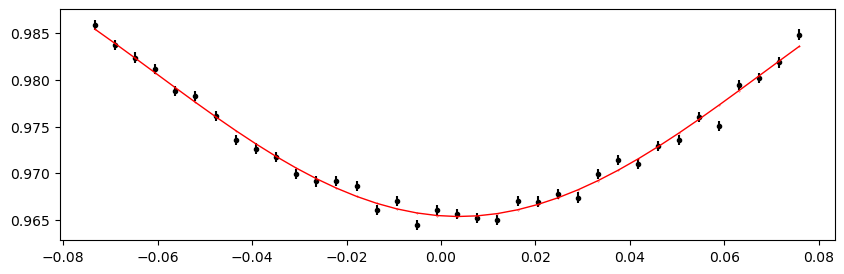

3174.3234588000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.36it/s]


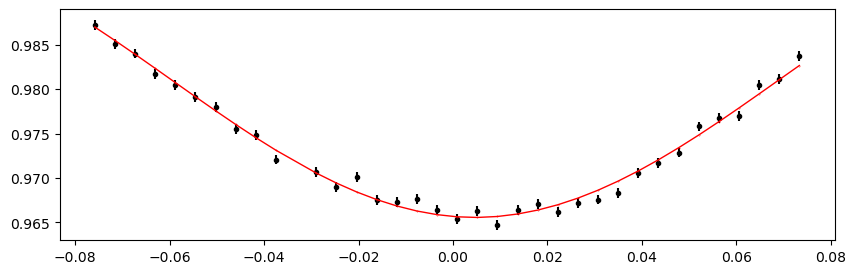

3174.6492850000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.14it/s]


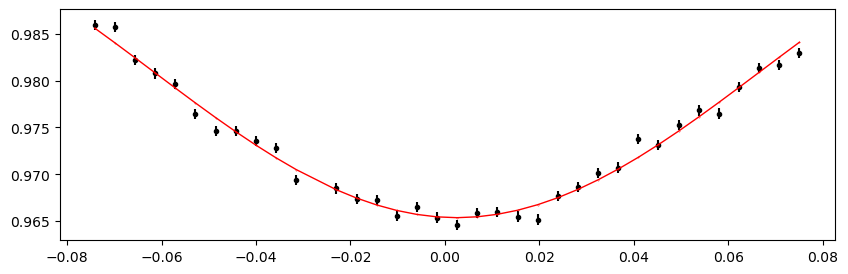

3174.9751112000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.28it/s]


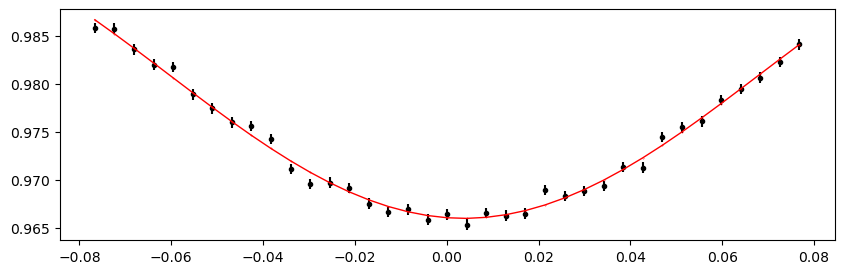

3175.3009374000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.50it/s]


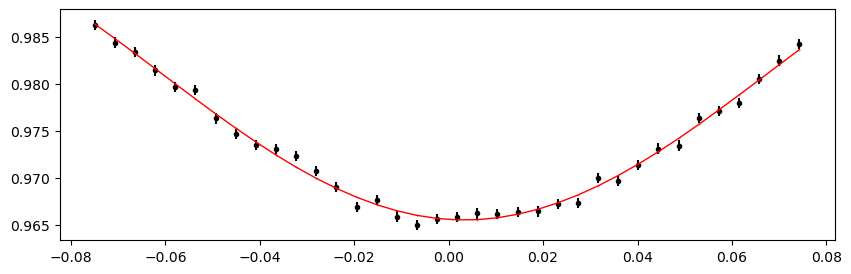

3175.6267636000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.56it/s]


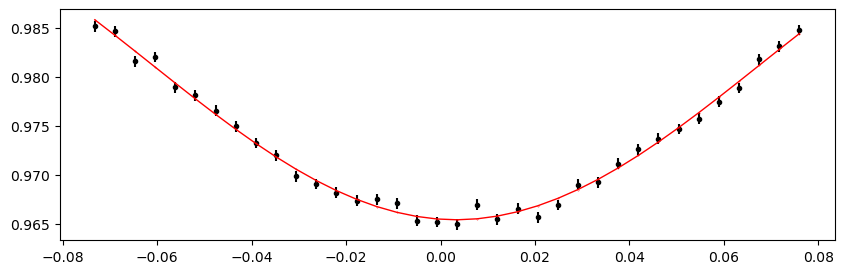

3175.9525898 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.25it/s]


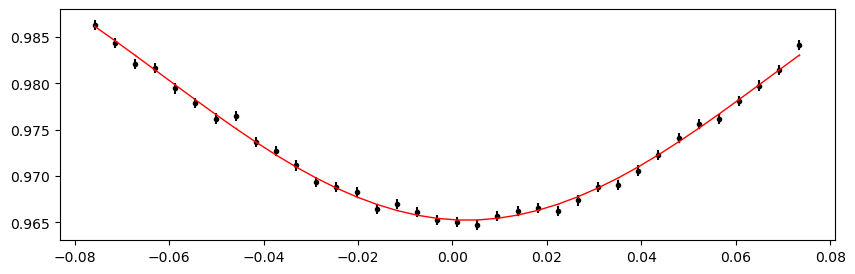

3176.278416 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.21it/s]


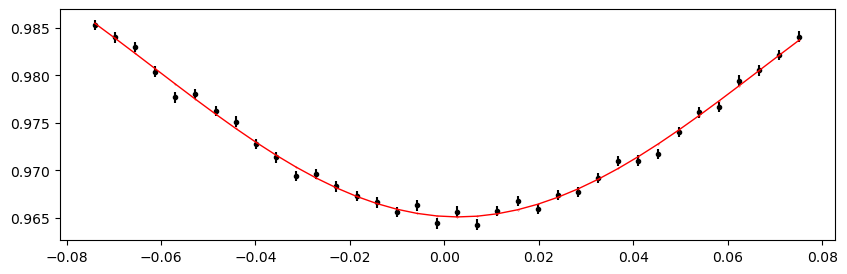

3176.6042422 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.84it/s]


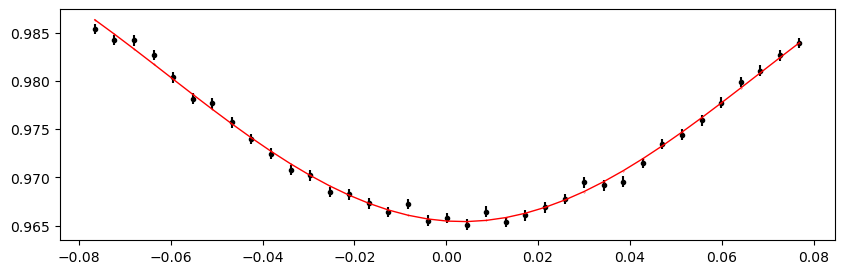

3176.9300684 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.67it/s]


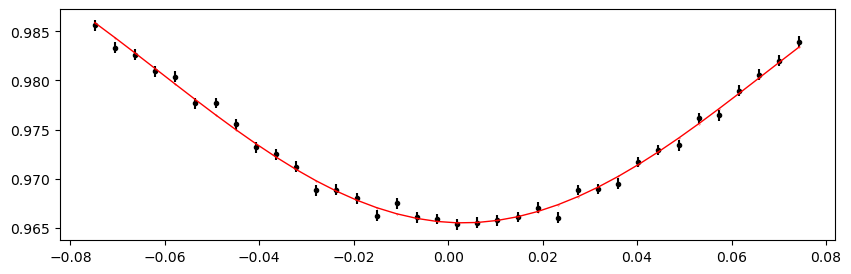

3177.2558946 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.16it/s]


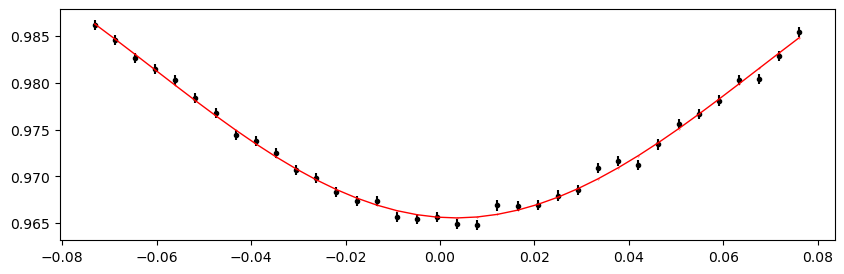

3177.5817208 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.19it/s]


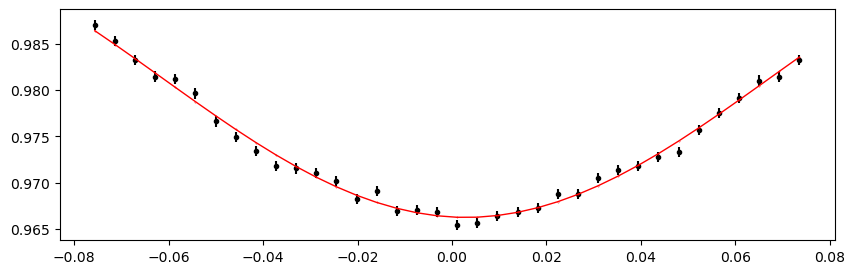

3177.9075470000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.33it/s]


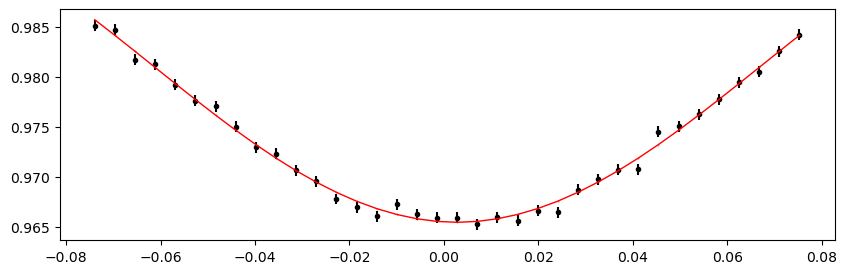

3178.2333732 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.20it/s]


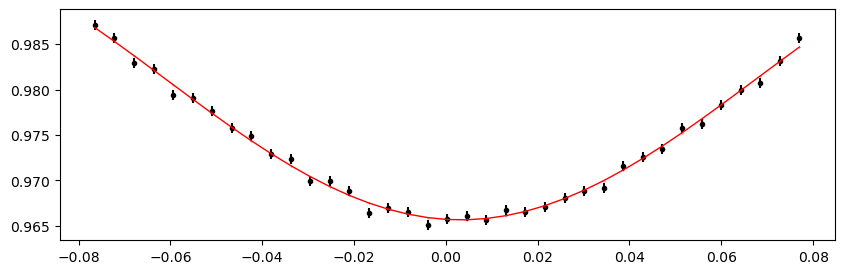

3178.5591994 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.47it/s]


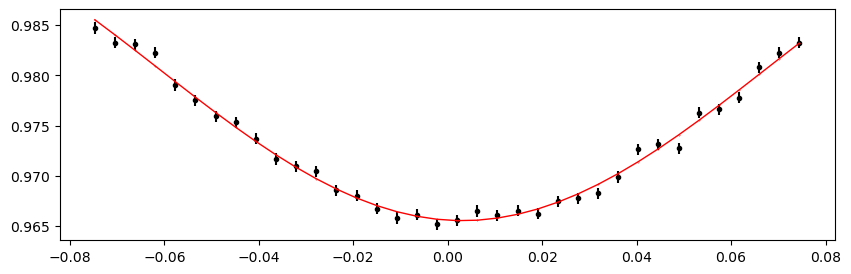

3178.8850256 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.58it/s]


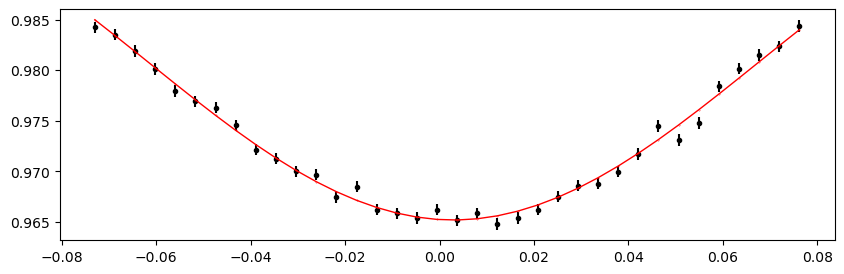

3179.2108518000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.24it/s]


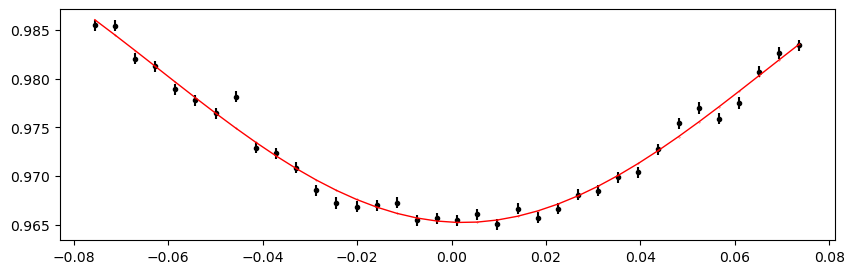

3179.5366780000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.64it/s]


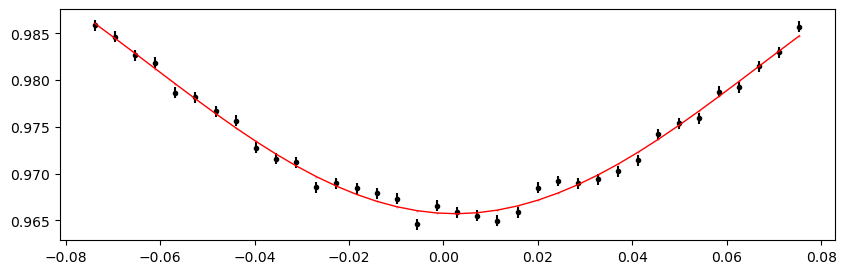

3182.79494 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.12it/s]


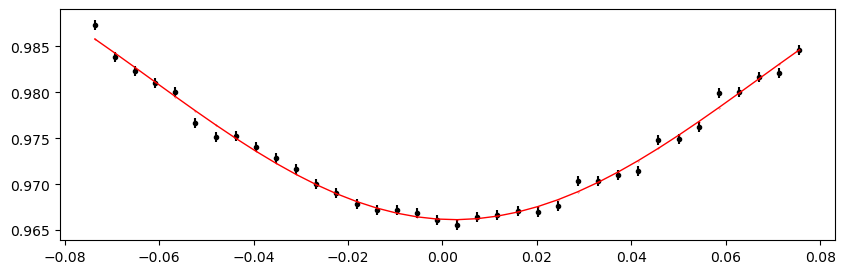

3183.1207662 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.73it/s]


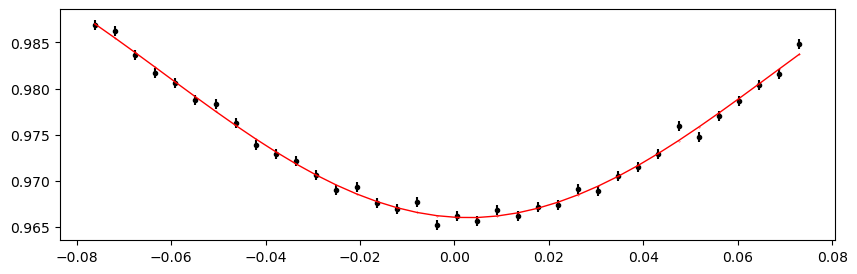

3183.4465924 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.29it/s]


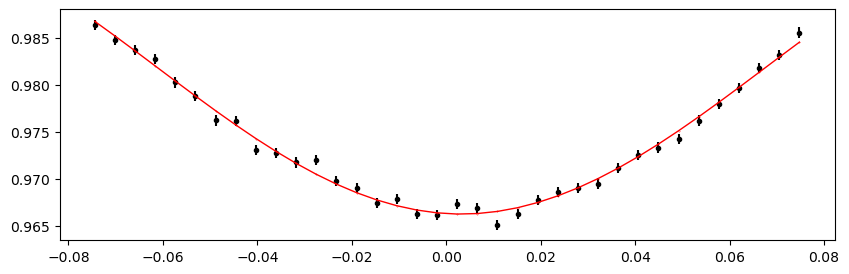

3183.7724186000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.94it/s]


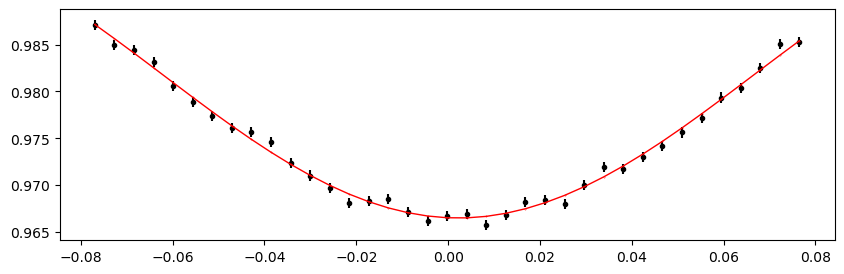

3184.0982448000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.38it/s]


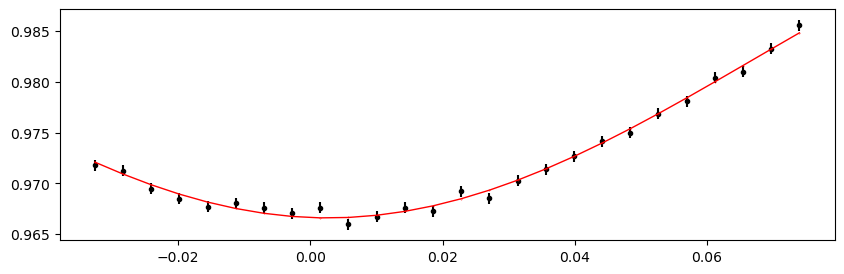

3184.4240710000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.61it/s]


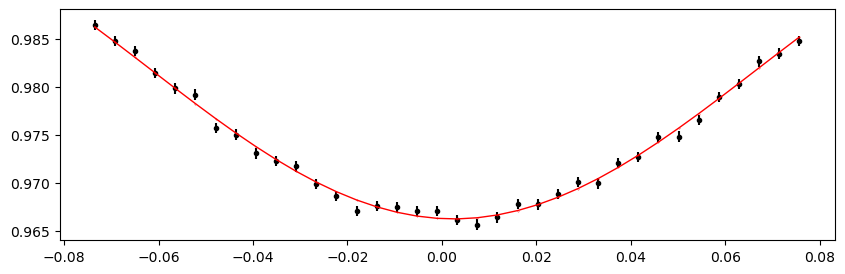

3184.7498972000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.46it/s]


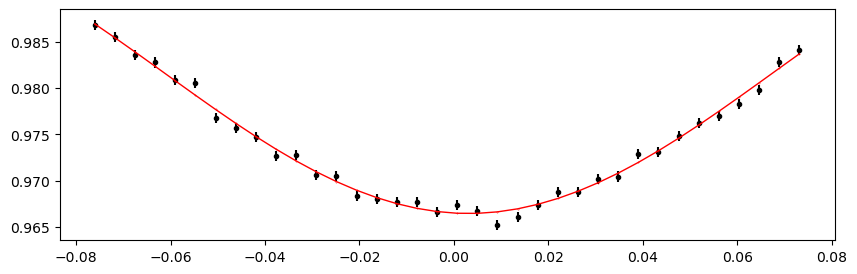

3185.0757234000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.21it/s]


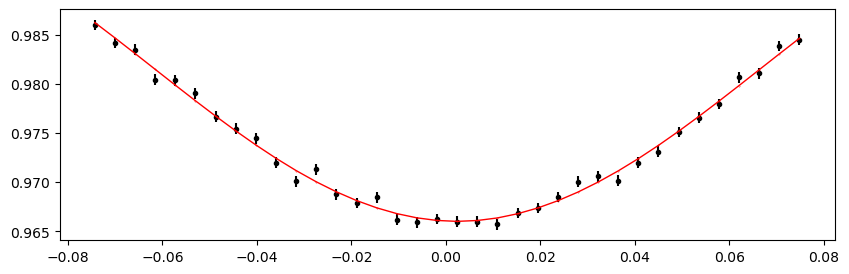

3185.4015496 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.91it/s]


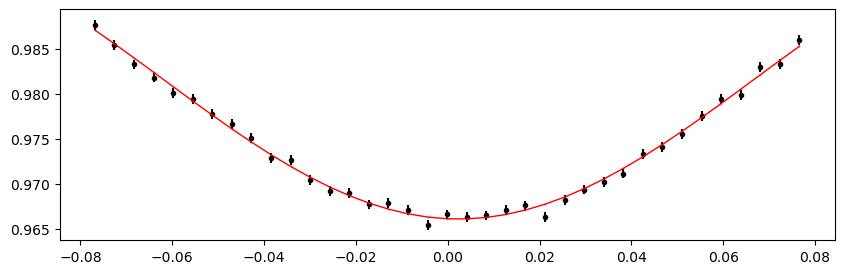

3185.7273758 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.97it/s]


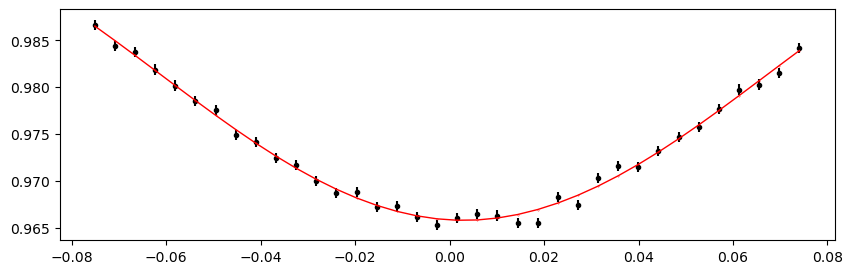

3186.053202 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.21it/s]


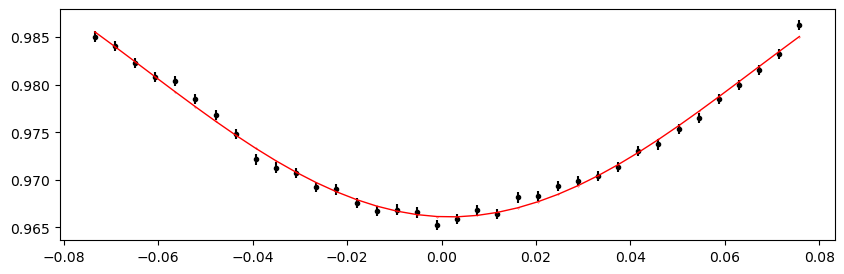

3186.3790282 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.81it/s]


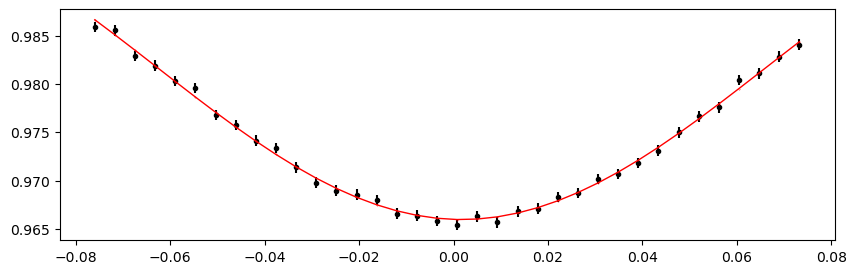

3186.7048544 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.99it/s]


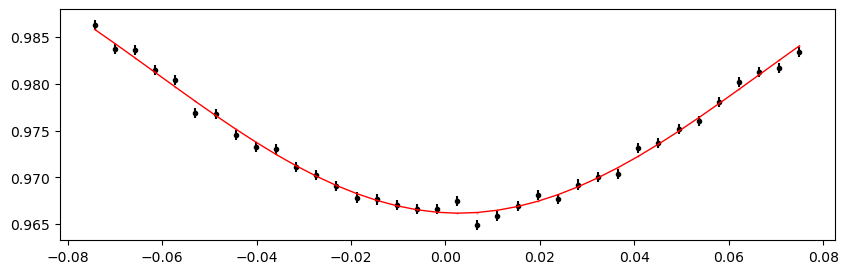

3187.0306806 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.01it/s]


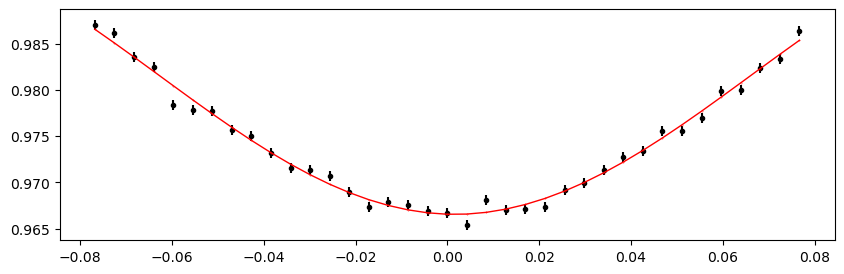

3187.3565068000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.44it/s]


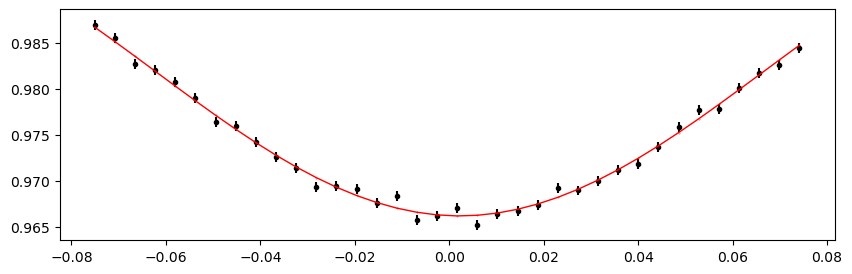

3187.682333 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.81it/s]


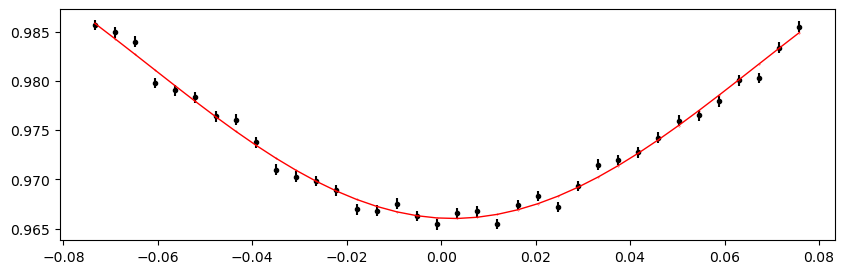

3188.0081592 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.57it/s]


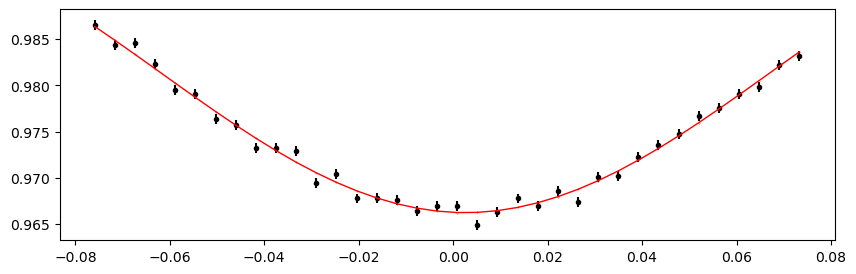

3188.6598116000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.11it/s]


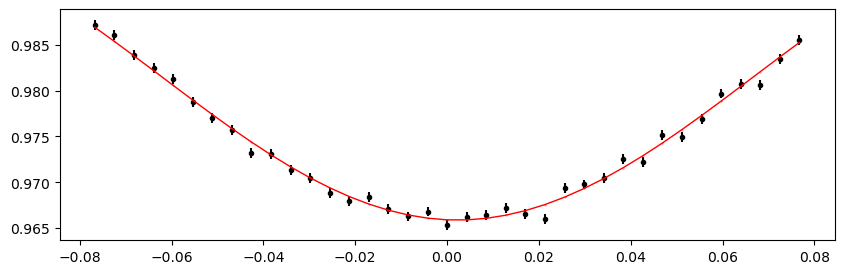

3188.9856378000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.63it/s]


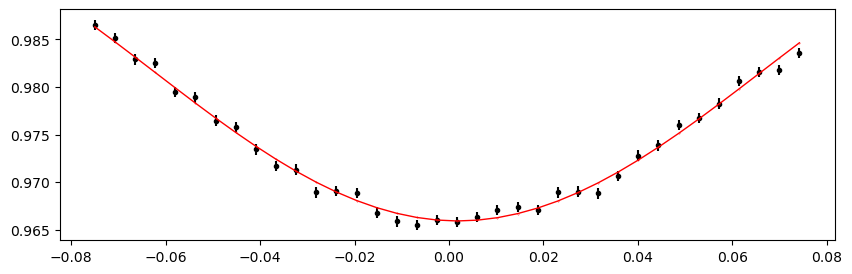

3189.3114640000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.45it/s]


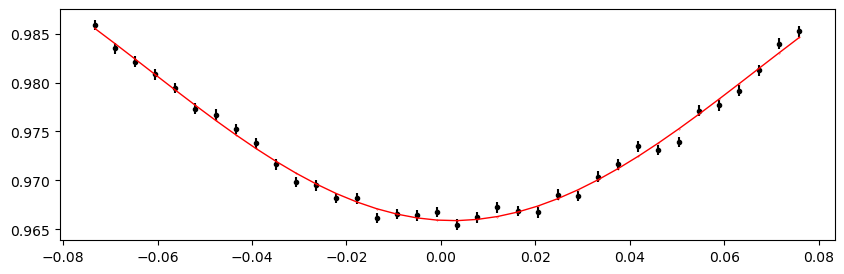

3189.6372902000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.33it/s]


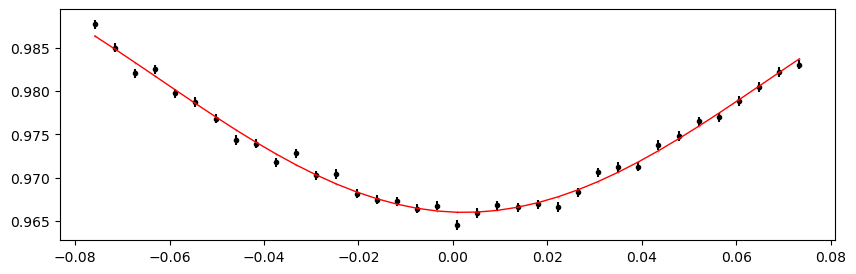

3189.9631164 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.65it/s]


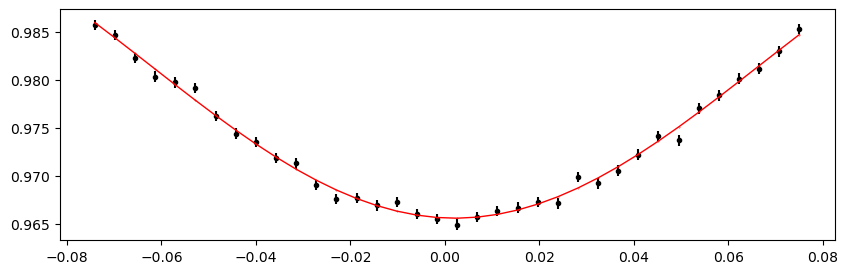

3190.2889426 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.26it/s]


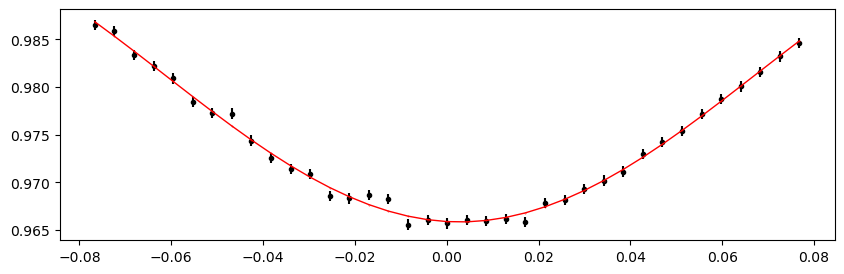

3190.6147688 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.92it/s]


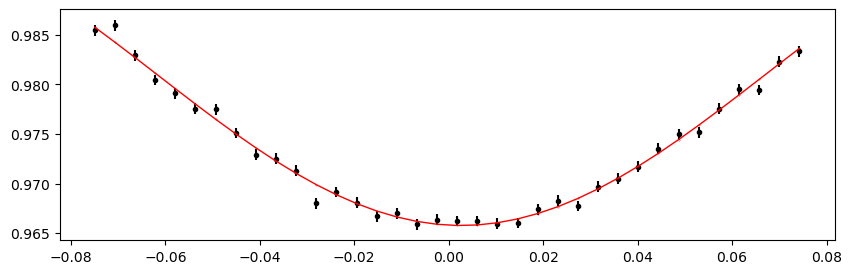

3190.940595 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.09it/s]


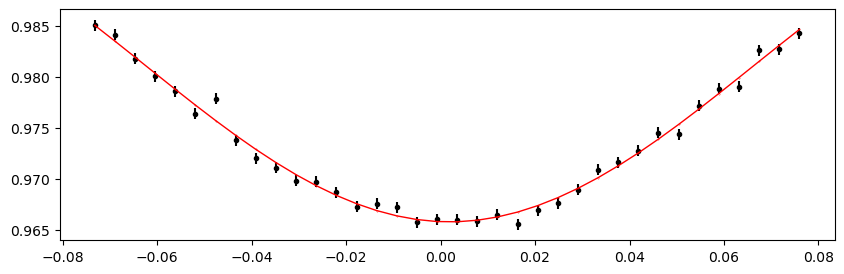

3191.2664212 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.75it/s]


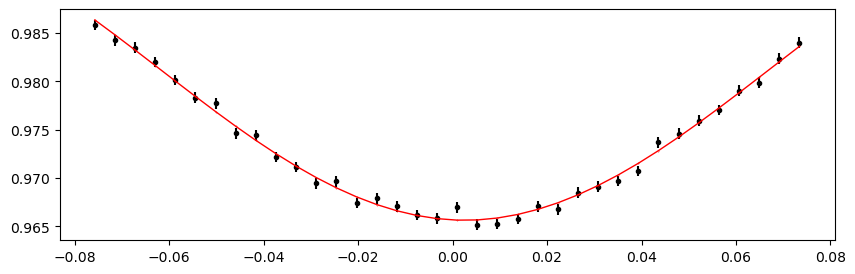

3191.5922474 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.55it/s]


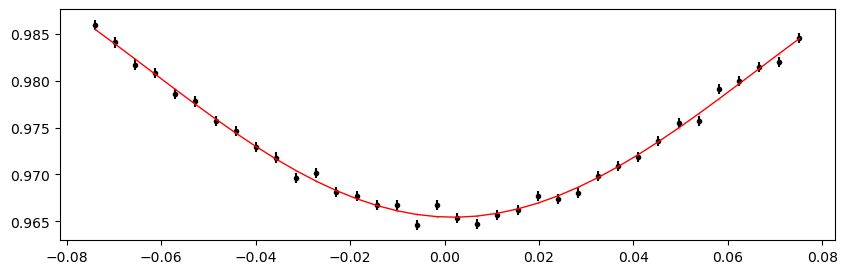

3191.9180736 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.66it/s]


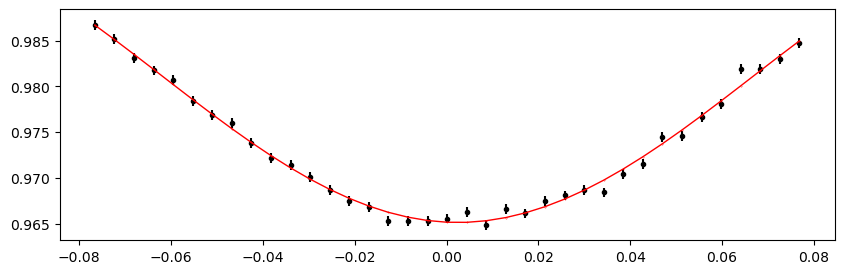

3192.2438998000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.71it/s]


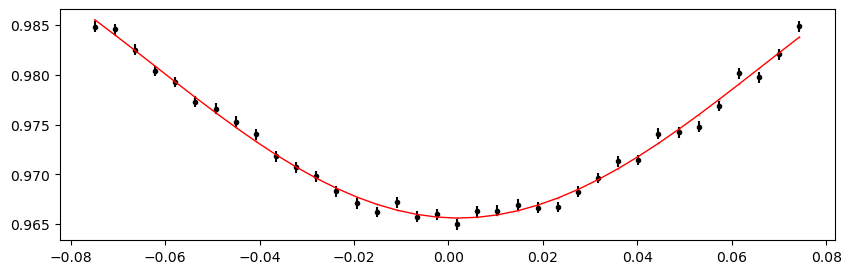

3192.569726 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.78it/s]


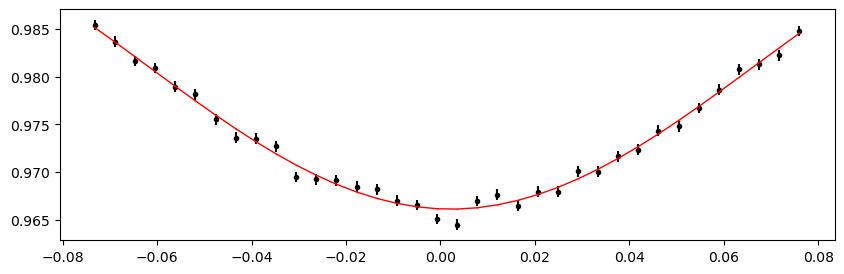

3192.8955522 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.96it/s]


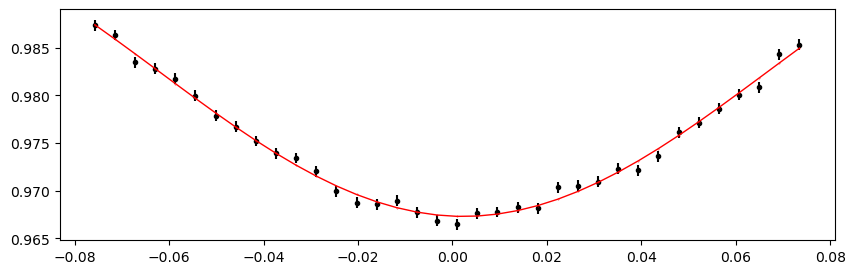

3195.5021618 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.23it/s]


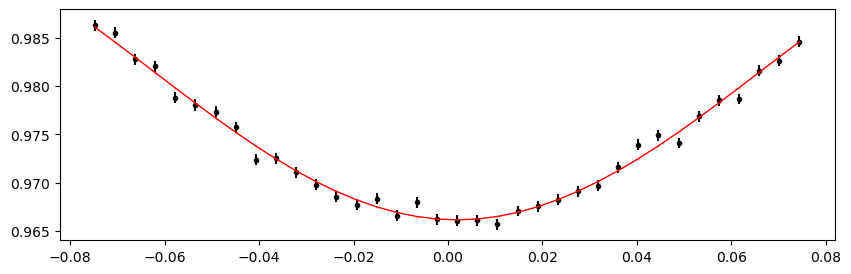

3195.827988 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.81it/s]


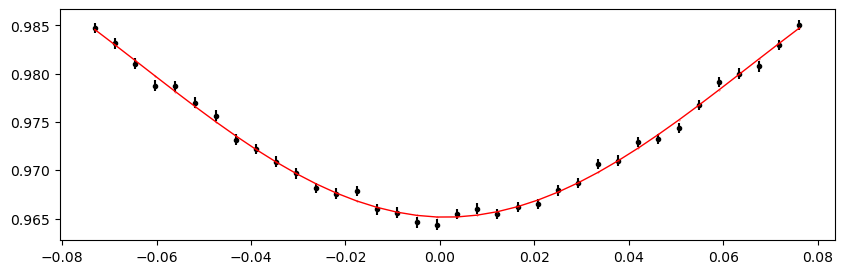

3196.1538142 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.78it/s]


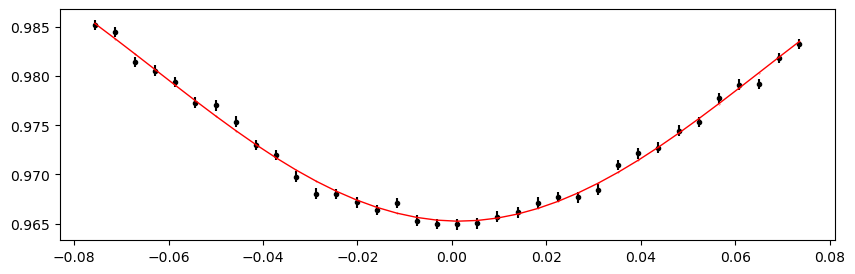

3196.4796404 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.95it/s]


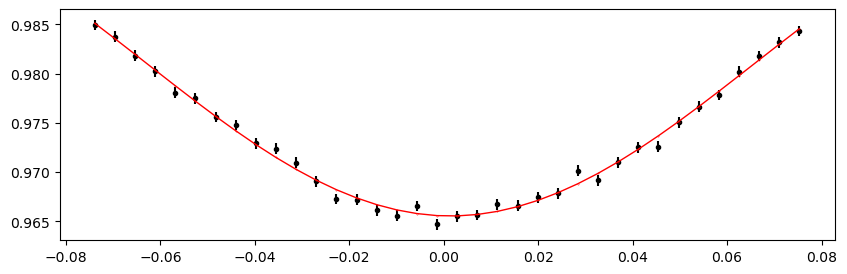

3196.8054666000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.51it/s]


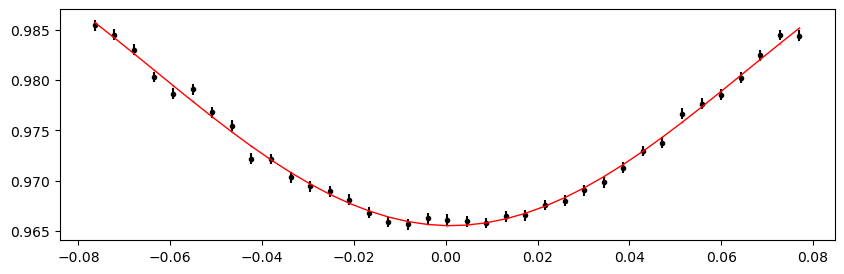

3197.1312928 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.84it/s]


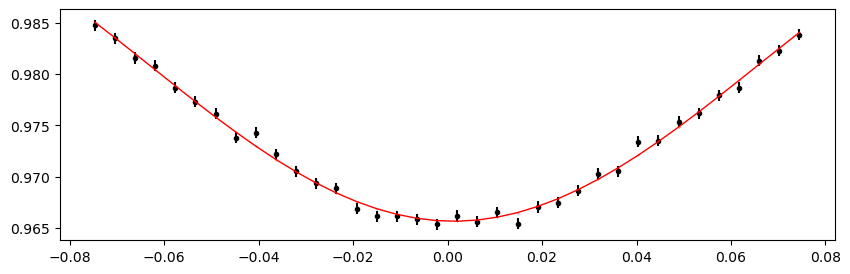

3197.457119 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.20it/s]


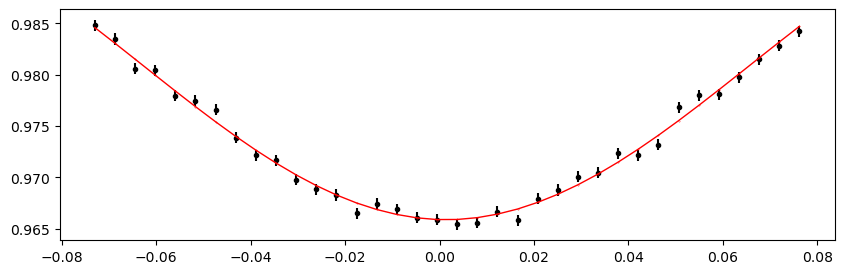

3197.7829452 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.47it/s]


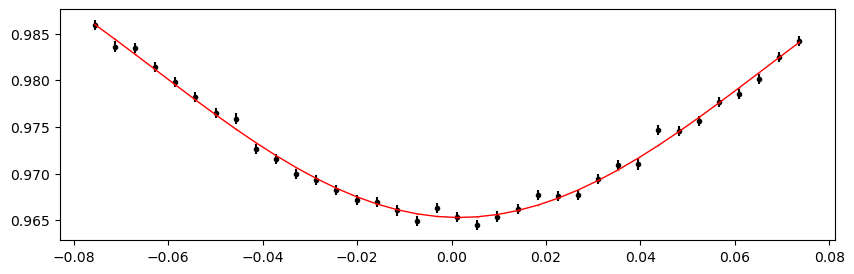

3198.1087714000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.25it/s]


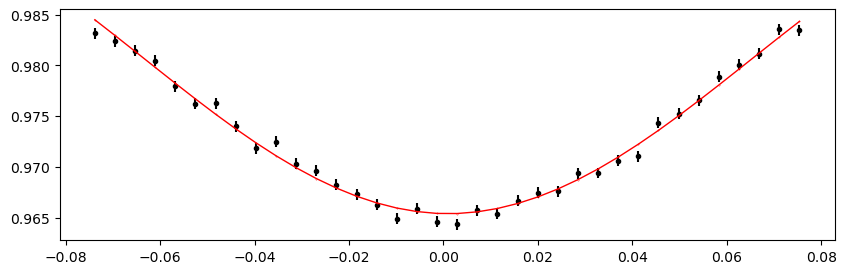

3198.4345976000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.10it/s]


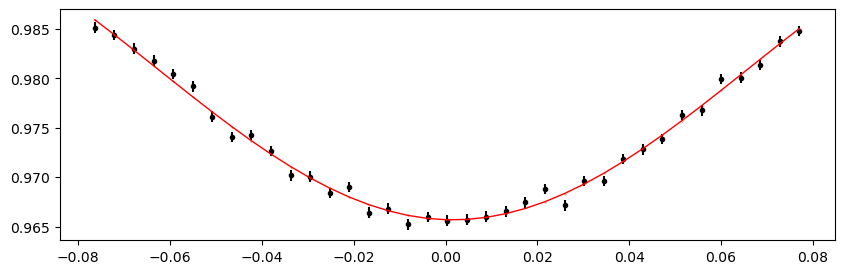

3198.7604238000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 426.16it/s]


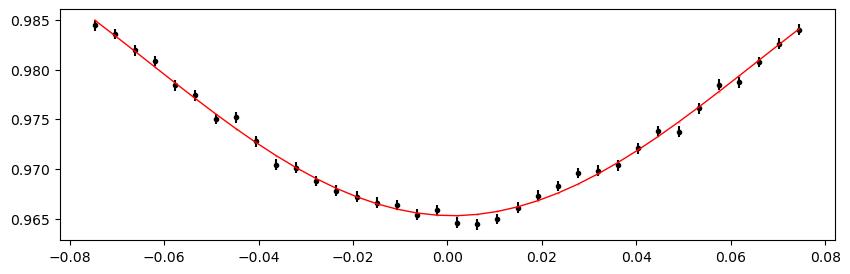

3199.0862500000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.31it/s]


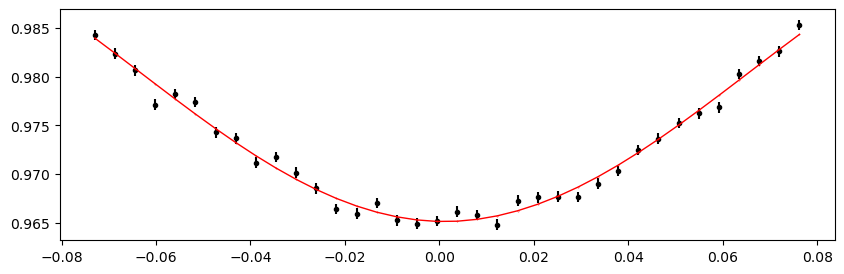

3199.4120762000002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.64it/s]


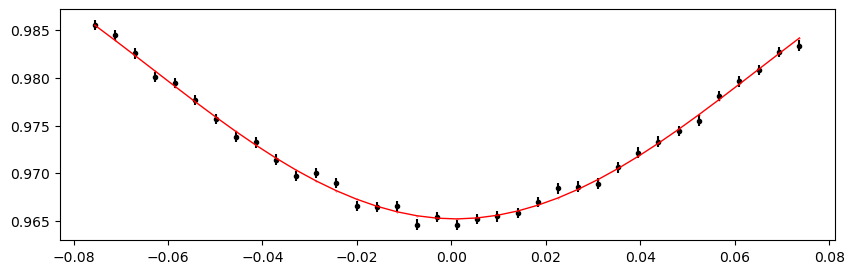

3199.7379024 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.27it/s]


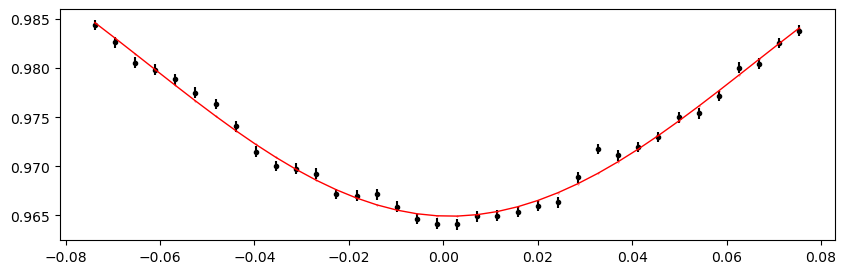

3200.0637286 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.73it/s]


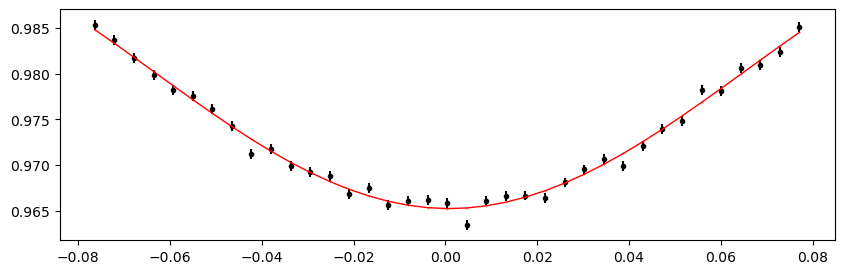

3200.3895548 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.98it/s]


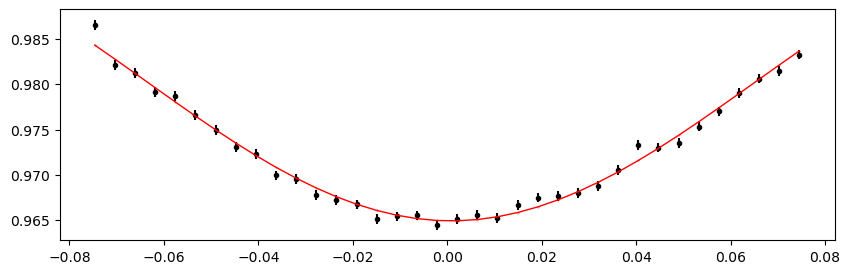

3200.715381 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.49it/s]


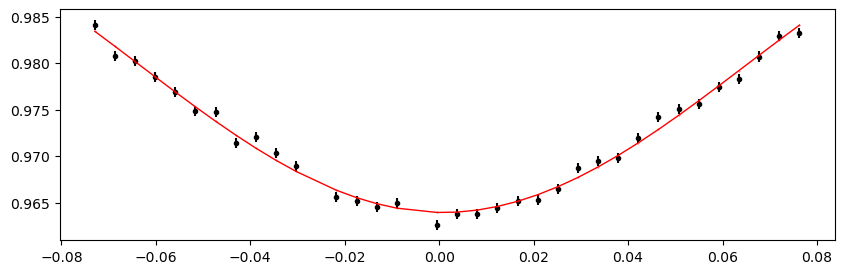

3201.0412072 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.41it/s]


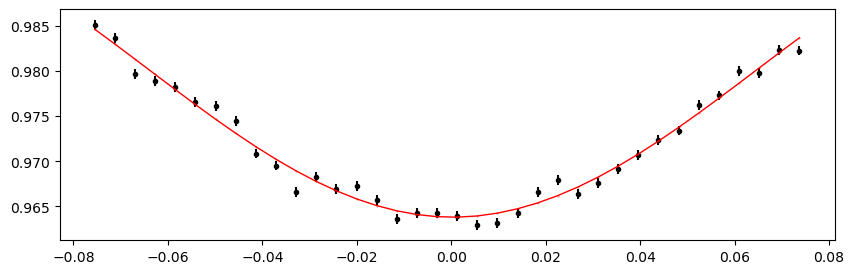

3201.3670334 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.04it/s]


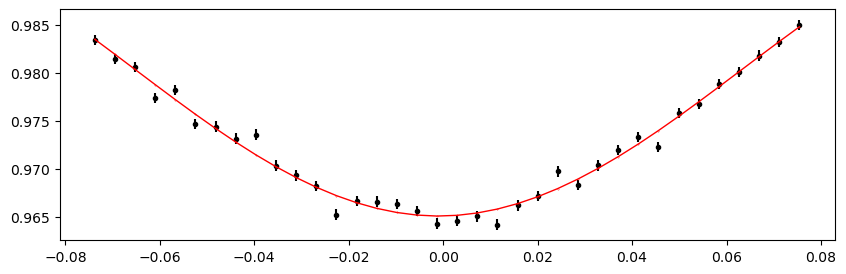

3202.0186858 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.54it/s]


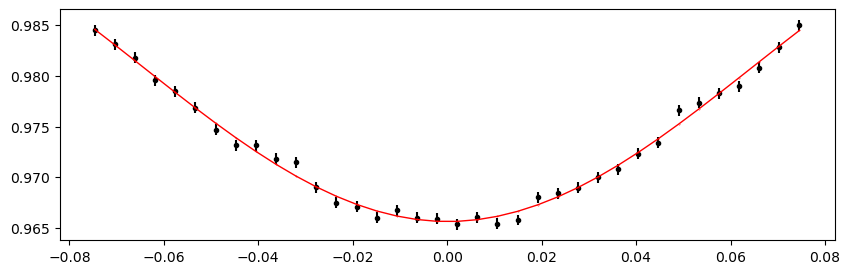

3202.344512 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.81it/s]


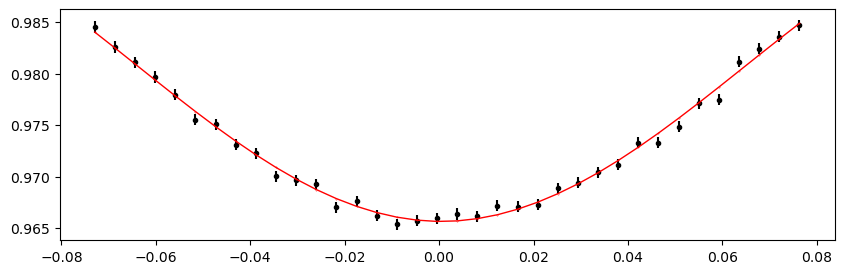

3202.6703382 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.35it/s]


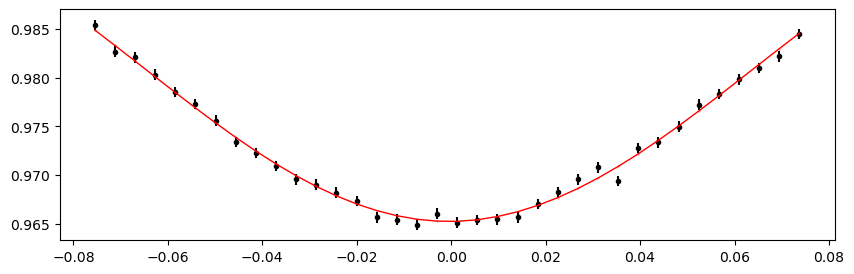

3202.9961644000005 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.64it/s]


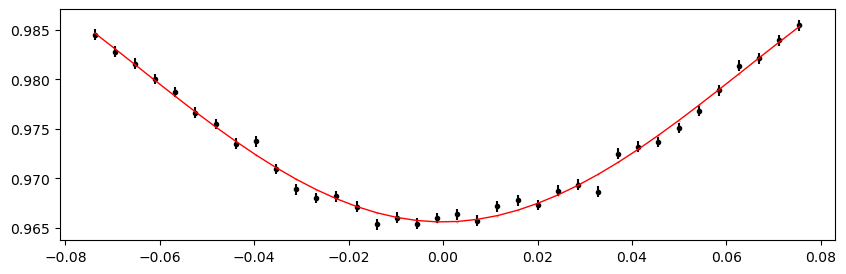

3203.3219906000004 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 425.98it/s]


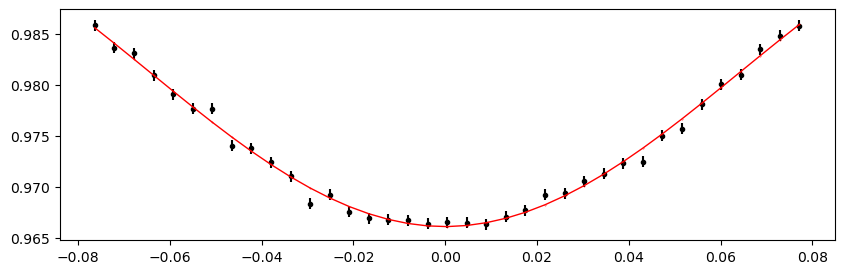

3203.6478168000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.38it/s]


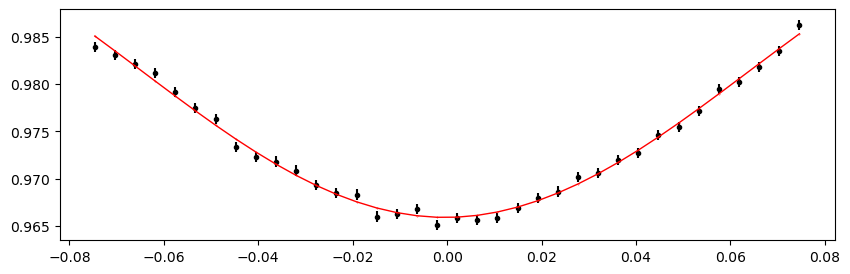

3203.9736430000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.50it/s]


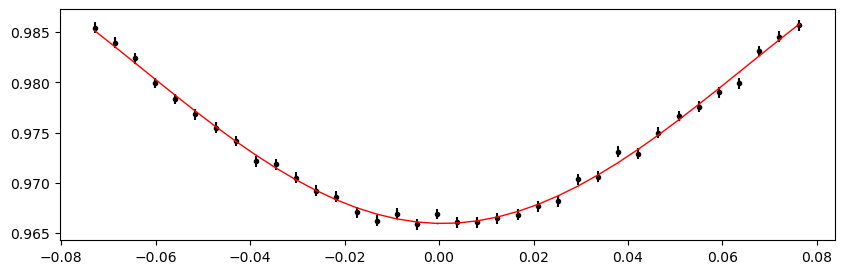

3204.2994692 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.00it/s]


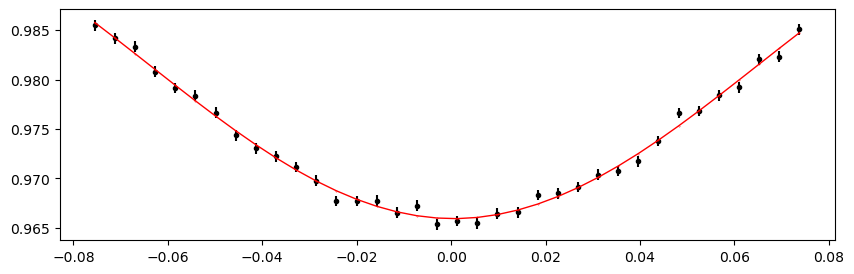

3204.6252954 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.72it/s]


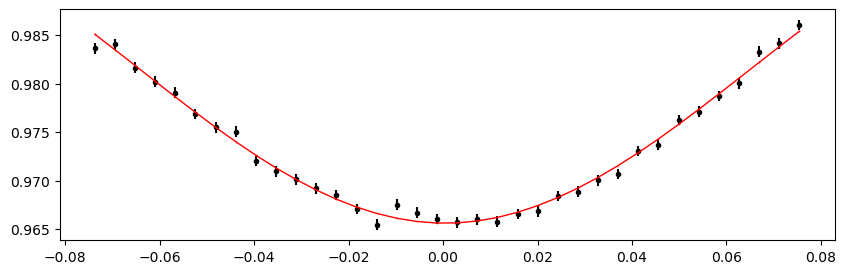

3204.9511216 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.62it/s]


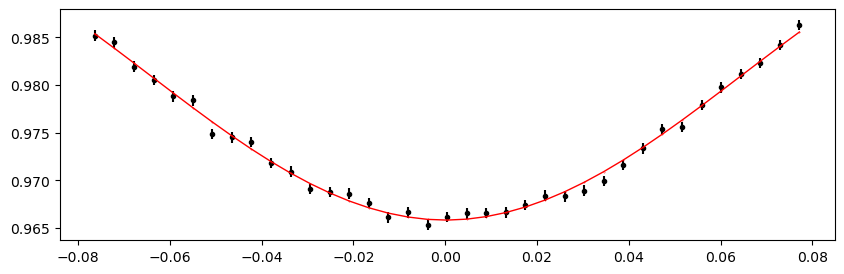

3205.2769478 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.91it/s]


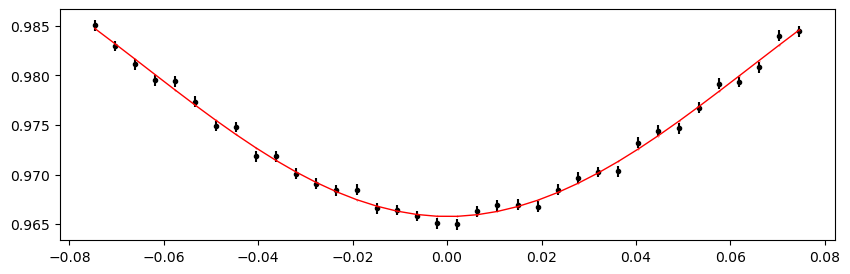

3205.602774 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.88it/s]


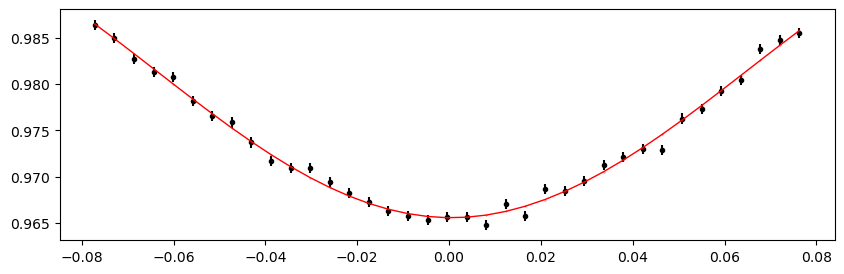

3205.9286002 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 427.08it/s]


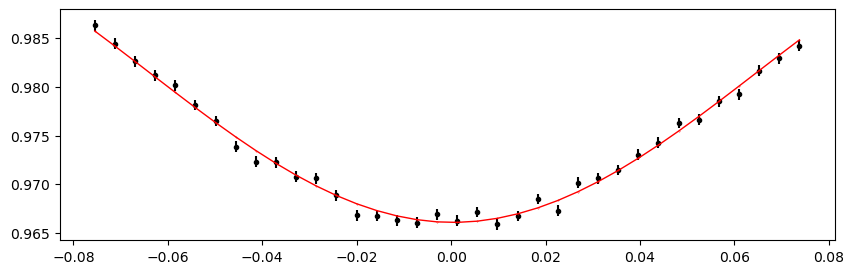

3206.2544264000003 0.999115398277236 -0.03284344153917816 -0.319357169374863


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 424.01it/s]


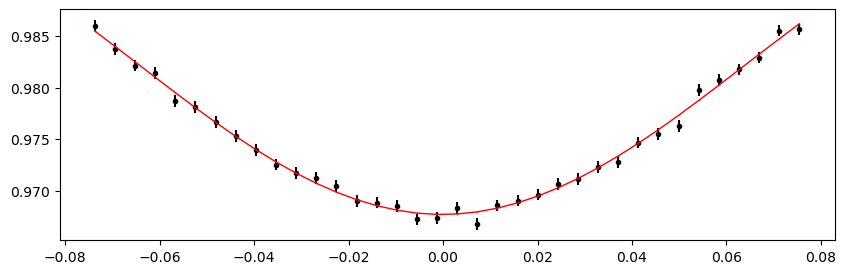

In [34]:
# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=20, 
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

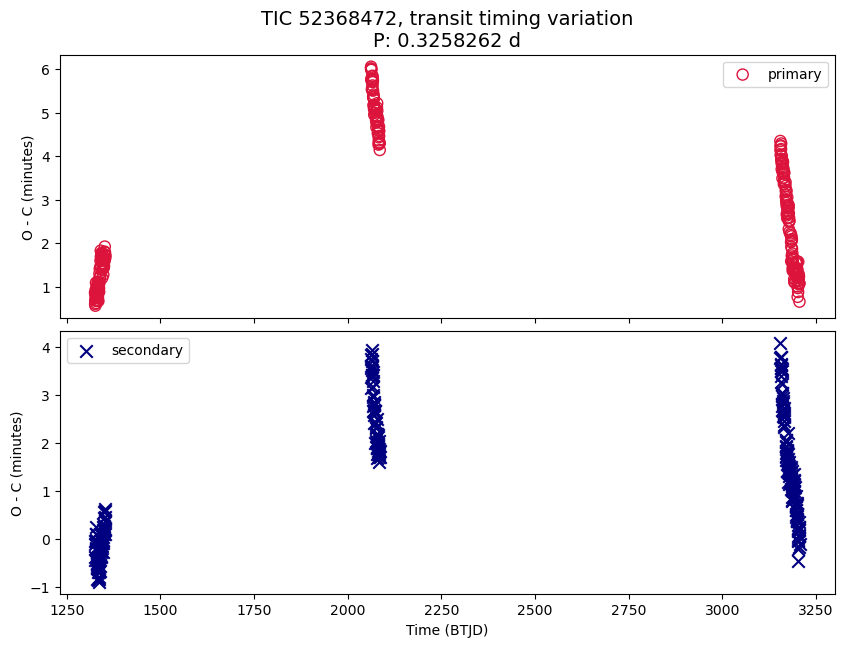

In [35]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'], 
#              lw = 1, color = 'crimson', )
axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, transit timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### O-C Plot, Zoom In

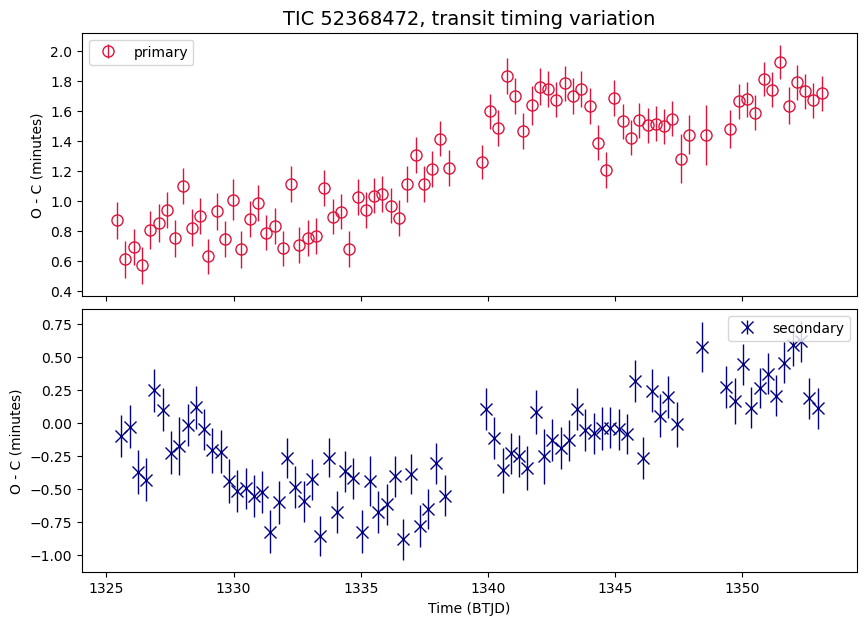

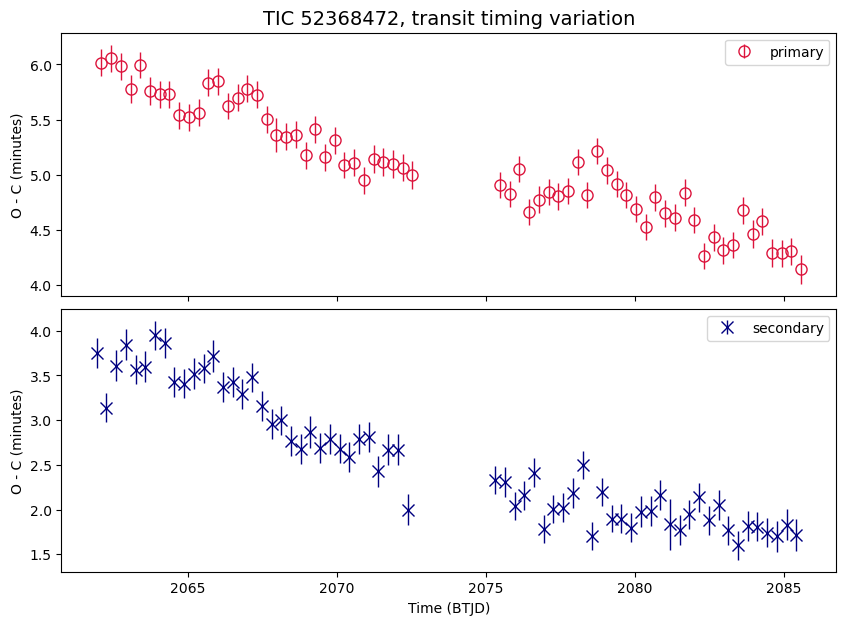

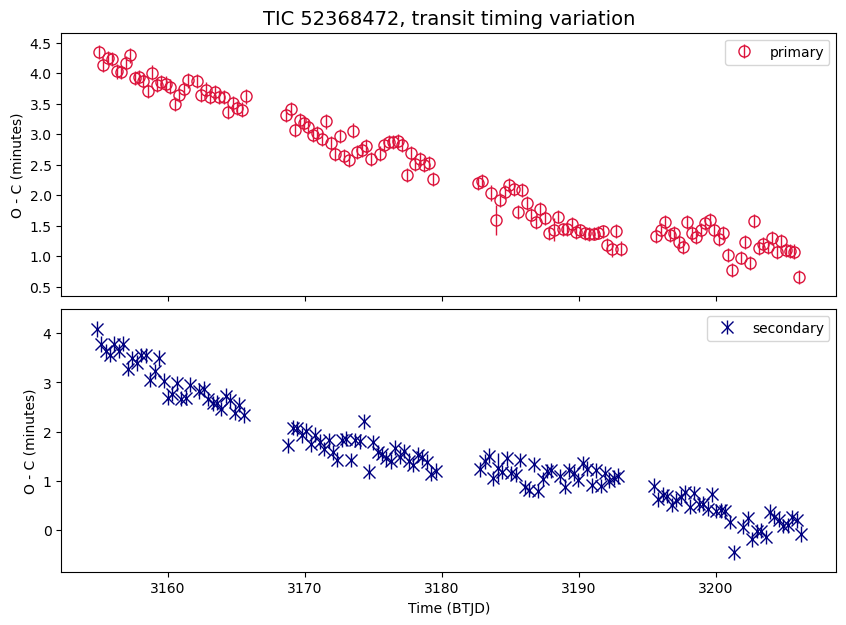

In [36]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1300, 1450),
    (2000, 2200),
    (3100, 3250),
]
title_suffix = "transit timing variation"

def tweak_axs_list(axs_list):
    ax = axs_list[0][1]
    # ax.set_title(f"{ax.get_title()}, Sectors 1-3")
    # ax.set_ylim(None, 18);
    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
    
        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]
        
        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]
              
        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'], 
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'], 
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
        
        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]
        
            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
        
        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();
        
        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)
        
        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

### Compare with O-C plot with slightly wider window for clipped lightcurve

window of primary: 1.05hr (wider), secondary: 0.6hr (same); same period

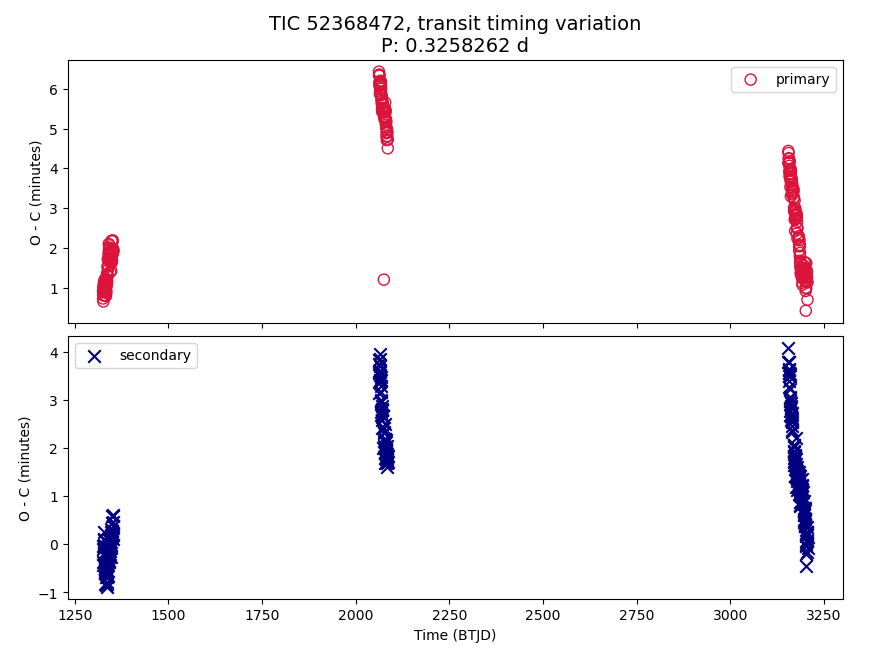

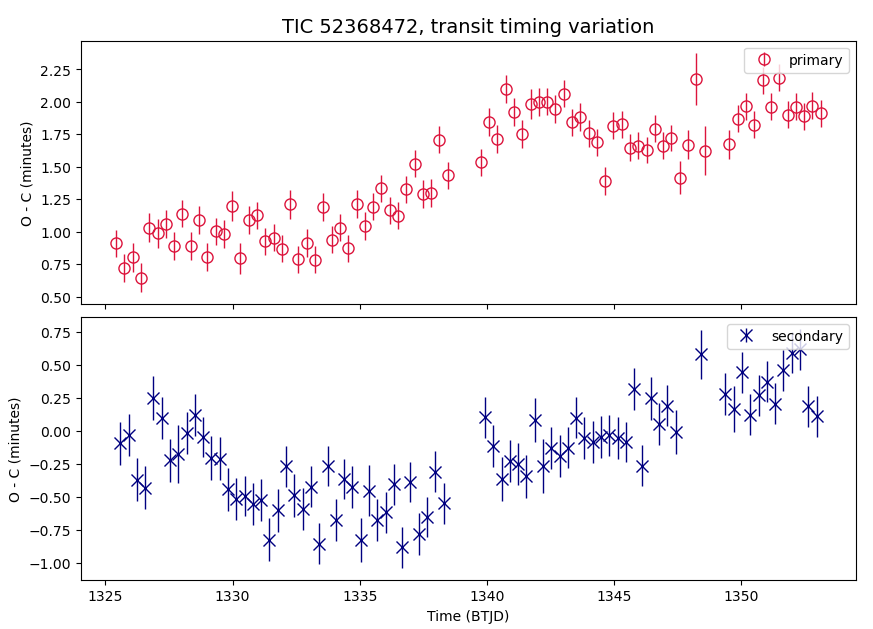

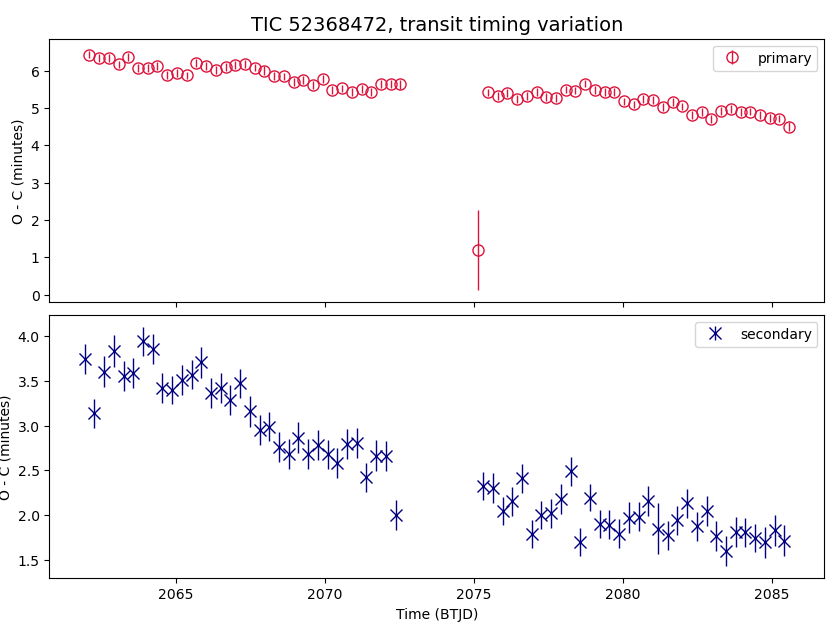

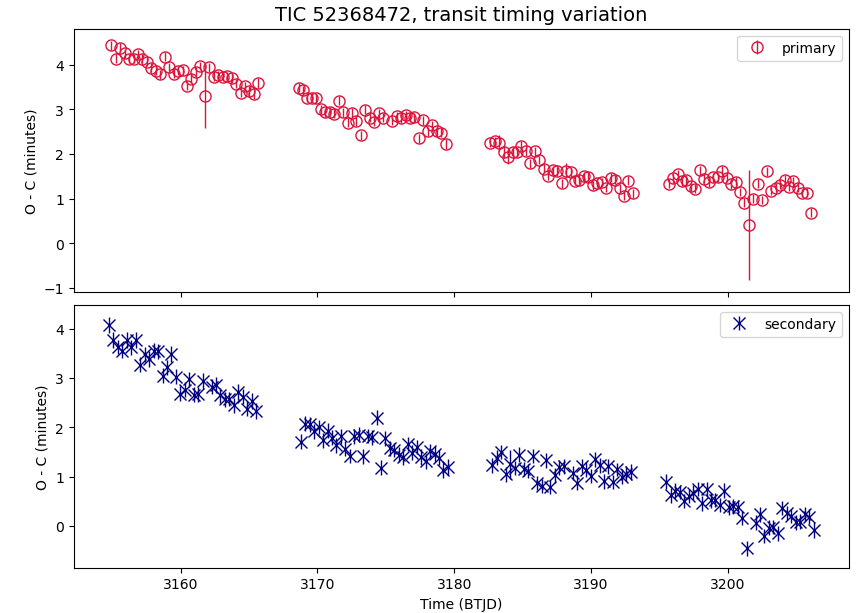

### Comparing with the output from TCE1 Period

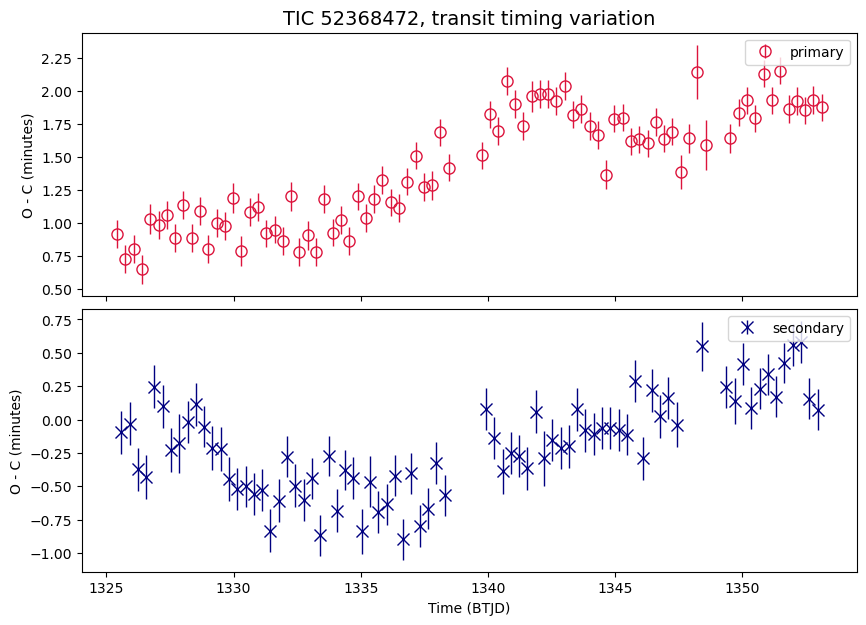

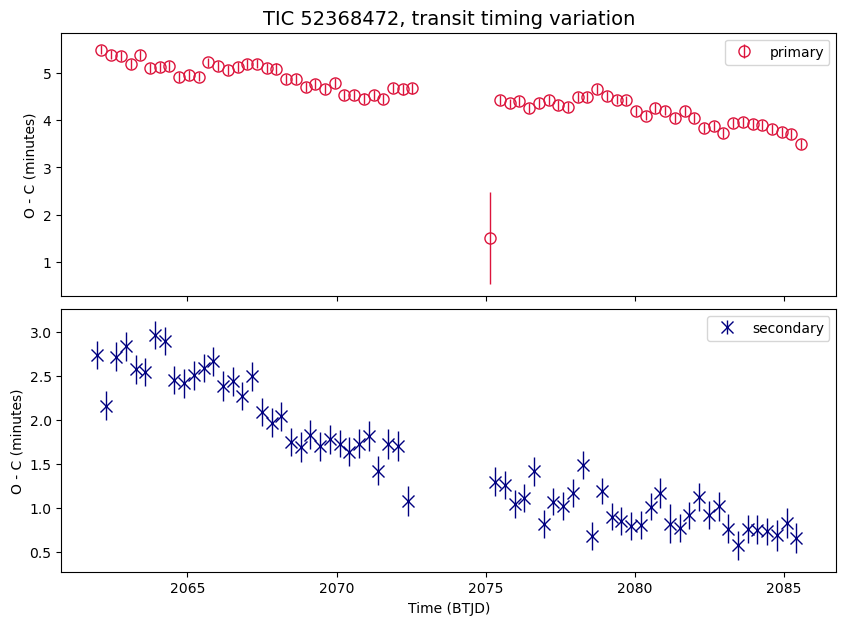

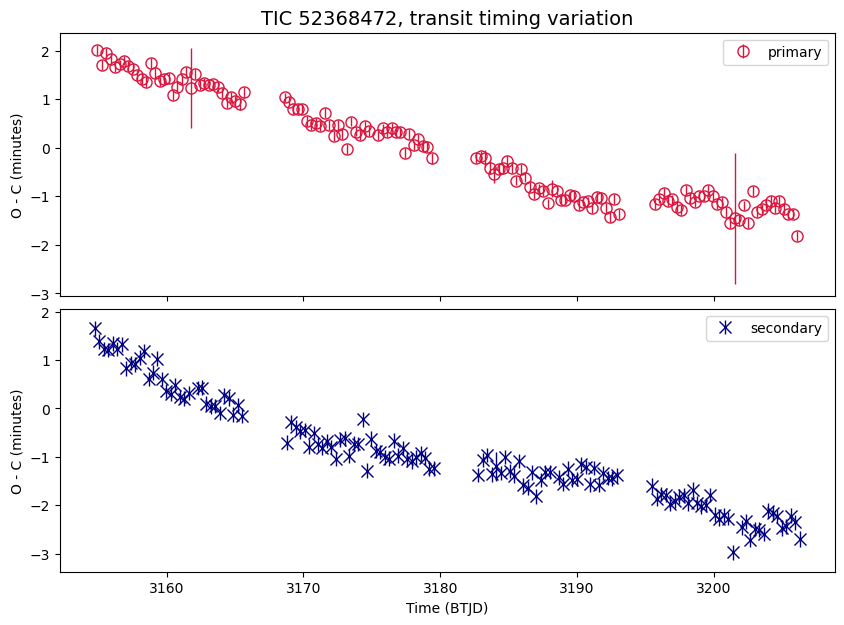


### Comparing with the output from AoV Period

The result from using the period 0.3258262 d from AoV is similar, but not better.

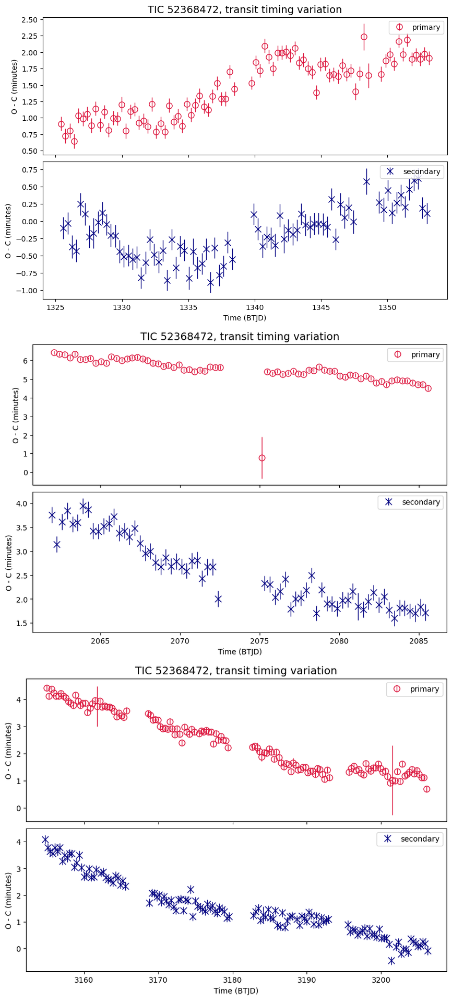

(End of O-C plots based on the period from AoV)

## make a periodogram 

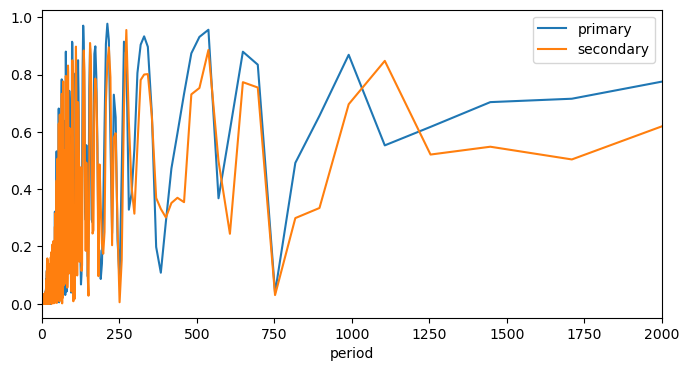

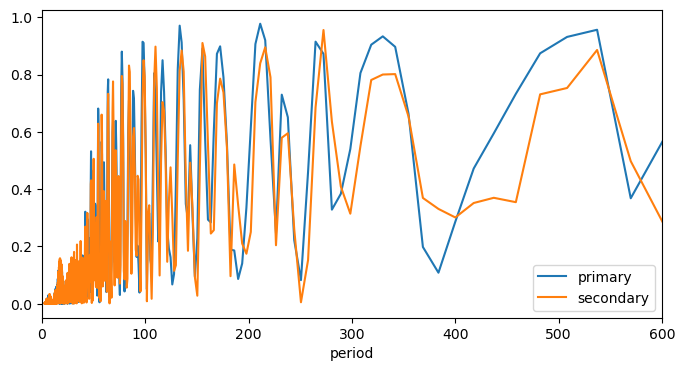

In [39]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 2000)
plt.show()

if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 600)
    plt.show()

## Results Summary

In [42]:
# FILL-IN the ETV results / comments
has_etv = "Y?"
comments = "Possible long-term (2000+ d) trend with amplitude 6+ min, unsure if the trend is non-linear. Another possibility is the period not precise enough. [D_no_ingress]"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,52368472
has_etv,Y?
comments,"Possible long-term (2000+ d) trend with amplitude 6+ min, unsure if the trend is non-linear. Another possibility is the period not precise enough. [D_no_ingress]"
period,0.325826
depth_pct_p,4.21
depth_pct_s,3.28
epoch_p,1325.422
epoch_s,1325.5856
num_sectors,4
time_span,1882.84



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
52368472,Y?,"Possible long-term (2000+ d) trend with amplitude 6+ min, unsure if the trend is non-linear. Another possibility is the period not precise enough. [D_no_ingress]",0.3258262,4.21,3.28,1325.422,1325.5856,4,1882.84,1325.3,3208.14

